In [0]:
import tensorflow as tf
print(tf.test.gpu_device_name())

/device:GPU:0


In [0]:
from keras import backend as K

if 'tensorflow' == K.backend():
  import tensorflow as tf
  from keras.backend.tensorflow_backend import set_session
  config = tf.ConfigProto()
  config.gpu_options.allow_growth = True
  config.gpu_options.visible_device_list = "0"
  set_session(tf.Session(config=config))

Using TensorFlow backend.


In [0]:
# PyDrive Wrapper installieren, Bibliotheken importieren.
# Muß nur einmal pro Notebook durchgeführt werden
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
# Ältere Version von Matplotlib installieren, da die neueste Version Bugs enthält
!pip install matplotlib==3.0.2
import matplotlib
from matplotlib import pyplot as plt
matplotlib.__version__

'3.0.2'

In [0]:
# choose a local (colab) directory to store the data.
import os
local_root_path = os.path.expanduser("~/data/data")
try:
  os.makedirs(local_root_path, exist_ok=True)    
except: pass

def ListFolder(google_drive_id, destination):
  file_list = drive.ListFile({'q': "'%s' in parents and trashed=false" % google_drive_id}).GetList()
  counter = 0
  for f in file_list:
    # If it is a directory then, create the dicrectory and upload the file inside it
    if f['mimeType']=='application/vnd.google-apps.folder': 
      folder_path = os.path.join(destination, f['title'])
      os.makedirs(folder_path, exist_ok=True)
      print('creating directory {}'.format(folder_path))
      ListFolder(f['id'], folder_path)
    else:
      fname = os.path.join(destination, f['title'])
      f_ = drive.CreateFile({'id': f['id']})
      f_.GetContentFile(fname)
      counter += 1
  print('{} files were uploaded in {}'.format(counter, destination))
ListFolder("1pSUq_iZX_Rf4iMBq45YDrqeW5DTekWBA", local_root_path)

creating directory /root/data/data/data
creating directory /root/data/data/data/GTSRB
2 files were uploaded in /root/data/data/data/GTSRB
0 files were uploaded in /root/data/data/data
creating directory /root/data/data/300 - CNN
4 files were uploaded in /root/data/data/300 - CNN
0 files were uploaded in /root/data/data


In [0]:
import glob
import h5py
import gzip

import time
import timeit
from timeit import default_timer as timer

from keras.preprocessing.image import ImageDataGenerator
from keras.models import model_from_json

from keras.utils import np_utils,to_categorical

#from keras.callbacks import LearningRateScheduler, ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from keras.regularizers import l2

from keras.models import Sequential
from keras.layers import Activation
from keras.layers import Conv2D, Convolution2D, MaxPooling2D, Dropout, SpatialDropout2D, BatchNormalization, Dense, Flatten
from keras.layers.advanced_activations import ELU
from keras.optimizers import Adam

from keras.wrappers.scikit_learn import KerasClassifier

from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.models import load_model

#from matplotlib import pyplot as plt
#%matplotlib inline

import numpy as np
from numpy import mean, std

from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.utils import class_weight
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import cohen_kappa_score, precision_recall_fscore_support, auc
#from sklearn.metrics import roc_curve, auc, precision_recall_curve

from sklearn.preprocessing import LabelBinarizer
from skimage.exposure import equalize_hist

import seaborn as sns
import pickle as pkl

import csv
#from imblearn.pipeline import Pipeline

from skimage import transform, color, exposure

from sklearn.utils import shuffle

from google.colab import files


In [0]:

'''
Modell, welches mit optimierten Hyperparametern (Dropoutrate, Lernrate, SpatialDropout?) 
unter Verwendung von EarlyStopping trainiert wird.
conv_dropout = Dropoutrate der Convolutional Layer im Bereich: [0.2, 0.3, 0.4]
learn_rate = Lernrate  im Bereich: [0.0001, 0.001, 0.01]
spatial_dropout=False, d.h. kein SpatialDropout2D Layer, sondern normaler Dropout Layer
'''
def model_es(conv_dropout=0.2, learn_rate=0.001, spatial_dropout=False):
  model = Sequential()    
  filter_counter = 32
  model.add(Conv2D(filter_counter, kernel_size=(3,3), input_shape=(48,48,3),padding='same'))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0))
  model.add(Conv2D(filter_counter, kernel_size=(3,3), padding='same'))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0))
  model.add(MaxPooling2D(pool_size=(2,2)))
  if spatial_dropout==True:
    model.add(SpatialDropout2D(conv_dropout))
  if spatial_dropout==False:
    model.add(Dropout(conv_dropout))
  for i in range(0, 2):
    filter_counter = filter_counter*2
    model.add(Conv2D(filter_counter, kernel_size=(3,3),padding='same'))
    model.add(BatchNormalization())
    model.add(ELU(alpha=1.0))
    model.add(Conv2D(filter_counter, kernel_size=(3,3), padding='same'))
    model.add(BatchNormalization())
    model.add(ELU(alpha=1.0))
    model.add(MaxPooling2D(pool_size=(2,2)))
    if spatial_dropout==True:
      model.add(SpatialDropout2D(conv_dropout))
    if spatial_dropout==False:
      model.add(Dropout(conv_dropout))
        
  model.add(Flatten())
  model.add(Dense(512))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0))
  model.add(Dropout(0.5))
  model.add(Dense(43, activation='softmax'))
  optimizer = Adam(lr=learn_rate)
  model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])
  #model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])
  print("Modell wurde erzeugt")
  return model



'''
Model mit EarlyStopping trainieren
'''
def train_model_es(X, y, X_val, y_val, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number, dl):  
  model = model_es(conv_dropout, learn_rate, spatial_dropout)
  #es = EarlyStopping(monitor='f1_metric', mode='max', patience=20, restore_best_weights=True)
  
  es = EarlyStopping(monitor='val_loss', mode='min', patience=20, restore_best_weights=True)
  
  y = np.argmax(y, axis=1)
  y_val = np.argmax(y_val, axis=1)
  y_test = np.argmax(y_test, axis=1)
  class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y)
  class_weights = dict(enumerate(class_weights))
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  history = model.fit(X, y, class_weight=class_weights, batch_size=32,epochs=epochs, verbose=1, 
                      validation_data=(X_val, y_val), callbacks=[es])
  
  cnn_train_time = time.time()-start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingsdaten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  save_as_csv(time_list, str(dl) + "._DL_"+str(number)+"_Trainingszeiten_ES.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)
  # beste Epoche bestimmen 
  best_ep = []
  epo = best_epoch(history)
  best_ep.append([epo])
  save_as_csv(best_ep, str(dl)+"._DL_"+str(number)+"_beste_Epoche.csv")
  # trainiertes Modell und GEwichte speichern
  model.save(str(dl)+"._DL_"+str(number)+"_GTSRB_opt_ES.hdf5")
  model.save_weights(str(dl)+"._DL_"+str(number)+"_GTSRB_opt_ES_weights.hdf5")
  # Evaluation
  evaluate_model(model, history, X, y, X_test, y_test, number,dl)
  return model, epo


'''
Model mit EarlyStopping trainieren
'''
def train_model_es_with_DA(X, y, X_val, y_val, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number, dl):  
  model = model_es(conv_dropout, learn_rate, spatial_dropout)
  #es = EarlyStopping(monitor='f1_metric', mode='max', patience=20, restore_best_weights=True)
  #print("ImageDataGenerator initialisieren")
  
  #print("ImageData fertig")
  # EarlyStopping initialisieren
  es = EarlyStopping(monitor='val_loss', mode='min', patience=20, restore_best_weights=True)
  
  y = np.argmax(y, axis=1)
  y_val = np.argmax(y_val, axis=1)
  y_test = np.argmax(y_test, axis=1)
  class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y)
  class_weights = dict(enumerate(class_weights))
  # ImageDataGenerator initialisieren
  train_gen = gen_Image_data_A()
  test_gen = ImageDataGenerator()
  train_samples = train_gen.flow(X, y, batch_size=32)
  test_samples = test_gen.flow(X_val, y_val, batch_size=32)
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  #print("Training startet")
  history = model.fit_generator(train_samples, steps_per_epoch = np.ceil(len(X)/32), 
                                class_weight=class_weights, epochs=epochs, verbose=1,
                                validation_data = (test_samples), validation_steps=np.ceil(len(X_val)/32), 
                                callbacks=[es])
  
  cnn_train_time = time.time()-start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingsdaten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  save_as_csv(time_list, str(dl) + "._DL_"+str(number)+"_Trainingszeiten_ES.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)
  # beste Epoche bestimmen 
  best_ep = []
  epo = best_epoch(history)
  best_ep.append([epo])
  save_as_csv(best_ep, str(dl)+"._DL_"+str(number)+"_beste_Epoche.csv")
  # trainiertes Modell und GEwichte speichern
  model.save(str(dl)+"._DL_"+str(number)+"_GTSRB_opt_ES.hdf5")
  model.save_weights(str(dl)+"._DL_"+str(number)+"_GTSRB_opt_ES_weights.hdf5")
  # Evaluation
  evaluate_model(model, history, X, y, X_test, y_test, number,dl)
  return model, epo






'''
Durchführung mehrerer Trainingsläufe mit EarlyStopping
'''
def earlyStoppingRuns(start, end, X_train, y_train, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number):
  epoch_list = []
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Trainingsdurchlauf mit EarlyStopping")
    print(" ")
    X_tr, X_val, y_tr, y_val = split_train_val_data(X_train, y_train, i)
    X_tr, y_tr = shuffle(X_tr, y_tr)
    cnn_FM_opt_ES, best_ep = train_model_es(X_tr, y_tr, X_val, y_val, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number, i)
    epoch_list.append(best_ep)
  # Durchschnittliche Epochenanzahl bestimmen
  sum = 0
  for i in range(0, len(epoch_list)):
    sum = sum + epoch_list[i]
  print("Die durchschnittliche Epochenanzahl beträgt: ", (sum/len(epoch_list)))


'''
Durchführung mehrerer Trainingsläufe mit EarlyStopping und Data Augmentation
'''
def earlyStoppingRuns_with_DA(start, end, X_train, y_train, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number):
  epoch_list = []
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Trainingsdurchlauf mit EarlyStopping")
    print(" ")
    X_tr, X_val, y_tr, y_val = split_train_val_data(X_train, y_train, i)
    X_tr, y_tr = shuffle(X_tr, y_tr)
    cnn_FM_opt_ES, best_ep = train_model_es_with_DA(X_tr, y_tr, X_val, y_val, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number, i)
    epoch_list.append(best_ep)
  # Durchschnittliche Epochenanzahl bestimmen
  sum = 0
  for i in range(0, len(epoch_list)):
    sum = sum + epoch_list[i]
  print("Die durchschnittliche Epochenanzahl beträgt: ", (sum/len(epoch_list)))


'''
Gibt bei Anwendung von EarlyStopping die Epoche mit geringstem Loss zurück
'''
def best_epoch(history):
  best_epoch = np.argmin(history.history['val_loss'])+1
  print("Der Validierungsfehler ist nach Epoche ", best_epoch, " am minimalsten.")
  return best_epoch



'''
als CSV-Datei speichern
'''
def save_as_csv(list,name):    
    with open(name, "w") as file:
        csv_wr = csv.writer(file)
        csv_wr.writerows(list)




# data_sets = A, B oder C, Kurzbezeichnung welche Aufteilung der Trainingsdaten durchgeführt wurde
#     
def runningModels(start, end, params, split_sets, X_train, y_train, X_test, y_test, epochs, number):
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Modell trainieren mit EarlyStopping und "+str(number)+" Trainingsmuster" )
    print(" ")
    X_train, y_train = shuffle(X_train, y_train)
    cnn_GTSRB = train_model_CW(model_es(params[0],params[1],params[2]), X_train, y_train, X_test, y_test, epochs, number, i)
    name1 = str(i)+"._DL_"+str(number)+"_CNN_gtsrb_v_channel_CW_"+str(epochs)+ "_Epochen"+split_sets+".hdf5"
    cnn_GTSRB.save(name1)
    name2 = str(i)+"._DL_"+str(number)+"_CNN_gtsrb_v_channel_CW_"+str(epochs)+ "_Epochen"+split_sets+"_weights.hdf5"
    cnn_GTSRB.save_weights(name2)



'''
Validierungsdaten von Trainingsdaten separieren
'''
def split_train_val_data(X,y, seed):
  X_train_val, X_val, y_train_val, y_val = train_test_split(X, y, random_state=seed, test_size=1/10, stratify=y)
  return(X_train_val, X_val, y_train_val, y_val) 

 

'''
Modell trainieren
'''
def train_model(model, X, y, X_test, y_test, epochs, number, dl):
  print("Training ohne Klassengewichte beginnt")
  start = time.time() 
  start2 = time.process_time()
  start3 = time.perf_counter()

  history = model.fit(X, y, batch_size=32,
                      epochs=epochs, verbose=1, validation_data=(X_test, y_test))  
  save_train_time(start, start2, start3, number, dl)  
  # Evaluation
  print("Evaluierung beginnt")
  evaluate_model(model, history, X, y, X_test, y_test, number, dl) 
  return model


'''
Modell trainieren, Klassengewichte gesetzt
'''
def train_model_CW(model, X, y, X_test, y_test, epochs, number, dl):
  print("Training mit Klassengewichten beginnt")
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  y = np.argmax(y, axis=1)
  y_test = np.argmax(y_test, axis=1)
  class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y)
  class_weights = dict(enumerate(class_weights))
  history = model.fit(X, y, class_weight=class_weights, batch_size=32,epochs=epochs, verbose=1, 
                      validation_data=(X_test, y_test))
  save_train_time(start, start2, start3, number, dl) 
  # Evaluation
  print("Evaluierung beginnt")
  evaluate_model(model, history, X, y, X_test, y_test, number, dl)
  return model

'''
Trainingszeit speichern
'''
def save_train_time(start, start2, start3, number, dl):
  print("Trainingszeit speichern")
  cnn_train_time = time.time()-start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingszeiten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  cnn_train_time_per_sample = cnn_train_time/int(number)
  cnn_train_time2_per_sample = cnn_train_time2/int(number)
  cnn_train_time3_per_sample = cnn_train_time3/int(number)
  time_list.append([cnn_train_time_per_sample, cnn_train_time2_per_sample, cnn_train_time3_per_sample])
  save_as_csv(time_list, str(dl)+"._DL_"+str(number)+"_Trainingszeiten.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)  





'''
Trainieren mit kompletten Trainingsdatensatz unter Angabe einer festen Anzahl an Epochen
'''
def fullDataRuns(start, end, X_train, y_train, X_test, y_test, drop_rate, learn_rate, conv_blocks, epochs, number):
    for i in range(start, (end+1)):
      print("***************************************************************************** ")
      print(i,"._Trainingsdurchlauf")
      print(" ")
      X_train, y_train = shuffle(X_train, y_train)
      cnn_FM_opt = fm_model_opt(X_train, y_train, X_test, y_test, drop_rate, learn_rate, conv_blocks, epochs, number, i)




'''
dieser ImageDataGenerator wurde Keras Tutorial - Traffic Sign Recognition 
https://chsasank.github.io/keras-tutorial.html     verwendet
'''
def gen_Image_data_A():
  datagen = ImageDataGenerator( 
      featurewise_center=False,
      featurewise_std_normalization=False,
      width_shift_range=0.1,
      height_shift_range=0.1,
      zoom_range=0.2,
      shear_range=0.1,
      rotation_range=10.)    
  return datagen


'''
ImageDataGenerator für Validierungsdaten
'''
def gen_Image_data_A_test():
  datagen = ImageDataGenerator()    
  return datagen




'''
Trainingsverlauf plotten
'''
def plot_training_progress(hist, number, dl):
 
 acc = hist.history['acc']
 acc_val = hist.history['val_acc']
 loss = hist.history['loss']
 loss_val = hist.history['val_loss']
 epochs = range(len(acc))
  
 plt.plot(epochs, acc, 'b', label='Trainingsgenauigkeit')
 plt.plot(epochs, acc_val, 'r', label='Validierungsgenauigkeit')
 
 plt.title('Lernkurven')
 plt.legend()
 name1 = str(dl)+"._"+str(number)+"_Lernkurve_GTSRB_6_Conv_acc.png"
 plt.savefig(name1)
 plt.figure()
 plt.plot(epochs, loss, 'b', label='Trainingsfehler')
 plt.plot(epochs, loss_val, 'r', label='Validierungsfehler')
 plt.title('Trainings- und Validierungsfehler')
 plt.legend()
 name2 = str(dl)+"._"+str(number)+'_Lernkurve_GTSRB_6_Conv_loss.png'
 plt.savefig(name2)
 plt.show()



def evaluate_model(model, history, X, y, X_test, y_test, number, dl):
  # in one-hot ändern
  metrics=[]  # zum speichern der scores 
  time_list_test=[]
  start4 = time.time()
  start5 = time.process_time()
  start6 = time.perf_counter()
  
  # Modell testen mit Testdatensatz
  eva1 = model.evaluate(X_test, y_test, verbose=0)

  end4 = time.time()-start4
  end5 = time.process_time()-start5
  end6 = time.perf_counter()-start6
  end4_per_sample = end4/int(number)
  end5_per_sample = end5/int(number)
  end6_per_sample = end6/int(number)  
  time_list_test.append([end4, end5,end6])
  time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
  # Testzeit speichern
  save_as_csv(time_list_test, str(dl)+"._DL_" +str(number)+"_Testzeiten.csv")
  
  print("Testgenauigkeit: ", eva1[1], '  ', 'Testfehler: ', eva1[0])
  eva2 = model.evaluate(X, y, verbose=0)
  print('Trainingsgenauigkeit: ', eva2[1], '  ', 'Trainingsfehler: ', eva2[0])
  #eva3 = model.evaluate(X_train, y_train, verbose=0)
  #print('Genauigkeit aller Trainingsdaten: ', eva3[1], '  ', 'Fehler aller Trainingsdaten: ', eva3[0]) 
  print("Trainingsverlauf anzeigen")
  # Trainingsverlauf anzeigen
  plot_training_progress(history, number, dl)

  # Klassen der Testmenge vorhersagen und speichern
  y_pred = model.predict(X_test) 
  np.save(str(dl)+"._DL_"+str(number)+"_y_pred_label.npy", np.argmax(y_pred, axis=1))
  y_pred = np.argmax(y_pred, axis=1)

  # Scores berechnen und speichern 
  #print("Scores berechnen")
  #acc = accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  acc = accuracy_score(y_test, y_pred)
  
  #print("Erster Score berechnet")
  #prec = precision_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')
  prec = precision_score(y_test, y_pred, average='macro')
  
  #####rec = recall_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')
  rec = recall_score(y_test, y_pred, average='macro')
  
  #f1 = f1_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro') 
  f1 = f1_score(y_test, y_pred, average='macro') 
  
  #roc_auc_multi = roc_auc_score_multiclass(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  roc_auc_multi = roc_auc_score_multiclass(y_test, y_pred)
  
  #kappa = cohen_kappa_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  kappa = cohen_kappa_score(y_test, y_pred)
  
  metrics.append([acc,prec,rec,f1,roc_auc_multi,kappa])
  save_as_csv(metrics, str(dl)+"._DL_"+str(number)+'_metrics.csv')

  # Scores pro Klasse berechnen und speichern
  #prec_rec_f1 = precision_recall_fscore_support(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  prec_rec_f1 = precision_recall_fscore_support(y_test, y_pred)
  
  save_as_csv(prec_rec_f1, str(dl)+"._DL_"+str(number)+'_precision_recall_fscore.csv')
    
  #roc_auc_single = roc_auc_score_single_class(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1)) 
  roc_auc_single = roc_auc_score_single_class(y_test, y_pred) 
  np.save(str(dl)+"._DL_"+str(number)+'_roc_auc_score_single_class.npy', roc_auc_single)

  # Scores der Trainingsdaten berechnen und speichern
  y_pred_train = model.predict(X)
  y_pred_train = np.argmax(y_pred_train, axis=1) 
  #np.save(str(dl)+"._DL_"+str(number)+"_y_pred_label_train.npy", np.argmax(y_pred_train, axis=1))
  np.save(str(dl)+"._DL_"+str(number)+"_y_pred_label_train.npy", y_pred_train)
  #acc_train = accuracy_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  acc_train = accuracy_score(y, y_pred_train)
  #prec_train = precision_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')
  prec_train = precision_score(y,y_pred_train, average='macro')
  #rec_train = recall_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')
  rec_train = recall_score(y, y_pred_train, average='macro')
  #f1_train = f1_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')  
  f1_train = f1_score(y, y_pred_train, average='macro')
  #roc_auc_multi_train = roc_auc_score_multiclass(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  roc_auc_multi_train = roc_auc_score_multiclass(y, y_pred_train)
  #kappa_train = cohen_kappa_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  kappa_train = cohen_kappa_score(y, y_pred_train)
  metrics.append([acc_train, prec_train ,rec_train ,f1_train, roc_auc_multi_train, kappa_train])
  save_as_csv(metrics, str(dl)+"._DL_"+str(number)+'_metrics_train.csv')
  #prec_rec_f1 = precision_recall_fscore_support(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  prec_rec_f1 = precision_recall_fscore_support(y, y_pred_train)
  save_as_csv(prec_rec_f1, str(dl)+"._DL_"+str(number)+'_precision_recall_fscore_train.csv')
  #roc_auc_single = roc_auc_score_single_class(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  roc_auc_single = roc_auc_score_single_class(y, y_pred_train)  
  np.save(str(dl)+"._DL_"+str(number)+'_roc_auc_score_single_class_train.npy', roc_auc_single)

  # Klassifikationsreport anzeigen
  #classifi_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  classifi_report(y_test, y_pred)
  
  # Konfusionsmatrix bestimmen und anzeigen
  title = '(GTSRB opt. ' + str(number) + " "+str(dl) + "._DL_"+')'
  #cm = plot_conf_matrix_norm(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), number, title) 
  cm = plot_confusion_matrix_norm(y_test, y_pred, number, title,dl) 
  cm.savefig(str(dl)+"._DL_"+str(number)+"_Confusion_matrix.png")  



'''
Roc-Auc-Score Mehrklassenfall mit average='macro'
'''
# https://medium.com/@plog397/auc-roc-curve-scoring-function-for-multi-class-classification-9822871a6659
def roc_auc_score_multiclass(y_te, y_pr, average='macro'):
    labelBinarizer = LabelBinarizer()
    labelBinarizer.fit(y_te)    
    y_test = labelBinarizer.transform(y_te)
    y_pred = labelBinarizer.transform(y_pr)
    return roc_auc_score(y_test, y_pred, average=average)


'''
Roc-Auc score der einzelnen Klassen berechnen
'''
def roc_auc_score_single_class(y_te, y_pr, average='macro'):
  # Menge der einzelnen Klassen erstellen
  single_classes = set(y_te)
  roc_aucs = {}
  for cl in single_classes:
    # Liste der restlichen Klassen erstellen 
    remain_classes = [x for x in single_classes if x != cl]

    # aktuelle Klasse mit 1 markieren und alle anderen Klassen mit 0
    y_test_roc = [0 if x in remain_classes else 1 for x in y_te]
    y_pred_roc = [0 if x in remain_classes else 1 for x in y_pr]

    # roc_auc_score berechnen
    roc_auc = roc_auc_score(y_test_roc, y_pred_roc, average = average)
    roc_aucs[cl] = roc_auc
  return roc_aucs



def plot_confusion_matrix_norm(y_test, y_pred, number, title,dl):   
    #y_pred_labels = np.argmax(y_pred, axis=1)
    #y_test_labels = np.argmax(y_test, axis=1)    
    #print("Konfusions")
    classes = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18',
              '19','20','21','22','23','24','25','26','27','28','29','30','31','32','33','34','35',
              '36','37','38','39','40','41','42']
    cm = confusion_matrix(y_test, y_pred)    
    np.set_printoptions(precision=3)
       
    plt.figure(figsize=(18*2, 10*2))
    
    normalize=True
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    title = ' Confusion Matrix \n (Model 6 Conv optimized,  with Hist equal v-channel, ' + str(number) + " samples, "+ " "+str(dl) + "._DL_"+')'
    #plt.title('confusion matrix')
    plt.title(title, fontsize=20, fontweight='medium')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 1.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):   
   
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.savefig(str(dl)+"._DL_"+str(number)+"_Confusion_matrix.png")
    plt.show()
    return plt 

'''
Klassifikationsreport ausgeben
'''
def classifi_report(y_test, y_pred):
  print("Klassifikationsreport ausgeben")
  labels = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21',
            '22','23','24','25','26','27','28','29','30','31','32','33','34','35','36','37','38',
            '39','40','41','42']  
  #targets = ["Class {}".format(i) for i in range(10)]
  #print(classification_report(y_test.argmax(axis=1), predictions.argmax(axis=1), target_names=labels))
  print(classification_report(y_test, y_pred, target_names=labels))




# Bilder auf eine Größe von 48x48 ändern, welche auf der verwendeten Größe in Paper
# Traffic Sign Recognition based on Synthesised Training Data
# von Alexandros Stergiou, Grigorios Kalliatakis und Chrstos Chrysoulas veröffentlicht 27.07.2018
# https://github.com/alexandrosstergiou/Traffic-Sign-Recognition-based-on-Synthesised-Training-Data
# entspricht

def resize_images_48_x_48(X):
  X_resized = []
  for i in range(0,len(X)):    
    img = transform.resize(X[i], (48,48))
    X_resized.append(img)
  return X_resized



# Histogrammausgleich durch normalisieren des v-Kanals im HSV-Farbraum - dient zur Anpassung des Kontrastes
# und Bilder werden auf eine Größe von 48x48 skaliert
def histo_equal_v_channel(X):
  X_prepro = []
  for i in range(0, len(X)):
    hsv = color.rgb2hsv(X[i])
    hsv[:,:,2]=exposure.equalize_hist(hsv[:,:,2])
    img = color.hsv2rgb(hsv)
    img = transform.resize(img, (48,48))
    X_prepro.append(img)   
  
  return X_prepro



'''
erstellen unterschiedlicher Trainingsmengen aus 39.209 Trainingsdaten Datensätze werden zufällig aber 
reproduzierbar durch setzen auf Seed=0 und unter Berücksichtigung der prozentualen Anteile der Daten in den
einzelnen Klassen, erstellt. Tracks werden nicht berücksichtigt
'''
def make_training_subsets_A(X_tr, y_tr):
    # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
    X_tr, y_tr = shuffle(X_tr, y_tr, random_state=42)    
    # Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
        X_tr, y_tr, random_state = 0, train_size=20000/39209, stratify=y_tr)
    # Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
        X_tr_20000, y_tr_20000, random_state = 0, train_size=1/2, stratify=y_tr_20000)
    # Trainingsmenge mit 5.000 Bilder erzeugen   
    X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
        X_tr_10000, y_tr_10000, random_state = 0, train_size=1/2, stratify=y_tr_10000)
    # Trainingsmenge mit 2.000 Bilder erzeugen   
    X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
        X_tr_5000, y_tr_5000, random_state = 0, train_size=2/5, stratify=y_tr_5000)
    # Trainingsmenge mit 1.000 Bilder erzeugen   
    X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
        X_tr_2000, y_tr_2000, random_state = 0, train_size=1/2, stratify=y_tr_2000)
    # Trainingsmenge mit 500 Bilder erzeugen   
    X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
        X_tr_1000, y_tr_1000, random_state = 0, train_size=1/2, stratify=y_tr_1000)
    # Trainingsmenge mit 200 Bilder erzeugen   
    X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
        X_tr_500, y_tr_500, random_state = 0, train_size=2/5, stratify=y_tr_500)
    return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200


'''
erstellen unterschiedlicher Trainingsmengen aus 39.209 Trainingsdaten Datensätze werden zufällig aber 
reproduzierbar durch setzen verschiedener Seeds, unter Berücksichtigung der prozentualen Anteile der 
Daten in den einzelnen Klassen, erstellt. Tracks werden nicht berücksichtigt
'''
def make_training_subsets_B(X_tr, y_tr):
    # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
    X_tr, y_tr = shuffle(X_tr, y_tr, random_state=17)    
    # Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
        X_tr, y_tr, random_state = 7, train_size=20000/39209, stratify=y_tr)
    # Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
        X_tr_20000, y_tr_20000, random_state = 6, train_size=1/2, stratify=y_tr_20000)
    # Trainingsmenge mit 5.000 Bilder erzeugen   
    X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
        X_tr_10000, y_tr_10000, random_state = 5, train_size=1/2, stratify=y_tr_10000)
     #Trainingsmenge mit 2.000 Bilder erzeugen   
    X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
        X_tr_5000, y_tr_5000, random_state = 4, train_size=2/5, stratify=y_tr_5000)
     #Trainingsmenge mit 1.000 Bilder erzeugen   
    X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
        X_tr_2000, y_tr_2000, random_state = 3, train_size=1/2, stratify=y_tr_2000)
    # Trainingsmenge mit 500 Bilder erzeugen   
    X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
        X_tr_1000, y_tr_1000, random_state = 2, train_size=1/2, stratify=y_tr_1000)
    # Trainingsmenge mit 200 Bilder erzeugen   
    X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
        X_tr_500, y_tr_500, random_state = 1, train_size=2/5, stratify=y_tr_500)
    return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200

'''
erstellen unterschiedlicher Trainingsmengen aus 39.209 Trainingsdaten Datensätze werden zufällig aber 
reproduzierbar durch setzen verschiedener Seeds, unter Berücksichtigung der prozentualen Anteile der 
Daten in den einzelnen Klassen, erstellt. Tracks werden nicht berücksichtigt
'''
def make_training_subsets_C(X_tr, y_tr):
    # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
    X_tr, y_tr = shuffle(X_tr, y_tr, random_state=12)    
    # Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
        X_tr, y_tr, random_state = 13, train_size=20000/39209, stratify=y_tr)
    # Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
        X_tr_20000, y_tr_20000, random_state = 14, train_size=1/2, stratify=y_tr_20000)
    # Trainingsmenge mit 5.000 Bilder erzeugen   
    X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
        X_tr_10000, y_tr_10000, random_state = 19, train_size=1/2, stratify=y_tr_10000)
     #Trainingsmenge mit 2.000 Bilder erzeugen   
    X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
        X_tr_5000, y_tr_5000, random_state = 20, train_size=2/5, stratify=y_tr_5000)
     #Trainingsmenge mit 1.000 Bilder erzeugen   
    X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
        X_tr_2000, y_tr_2000, random_state = 30, train_size=1/2, stratify=y_tr_2000)
    # Trainingsmenge mit 500 Bilder erzeugen   
    X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
        X_tr_1000, y_tr_1000, random_state = 50, train_size=1/2, stratify=y_tr_1000)
    # Trainingsmenge mit 200 Bilder erzeugen   
    X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
        X_tr_500, y_tr_500, random_state = 770, train_size=2/5, stratify=y_tr_500)
    return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200


In [0]:
test = model_es(0.2, 0.001, False)
test.summary()











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Modell wurde erzeugt
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 48, 48, 32)        896       
_________________________________________________________________
batch_normalization_1 (Batch (None, 48, 48, 32)        128       
_________________________________________________________________
elu_1 (ELU)                  (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 48, 48, 32)        9248      
_________________________________________________________________
batch_normalization_2 (Batch (None, 48, 48, 32)        128       
_________________________________________________________________
elu_2 (ELU)                  (None, 48

In [0]:
# Trainingsdatensatz laden
with open(os.path.expanduser("~/data/data/data/GTSRB/GTSRB_train_boundBox.pkl"), "rb") as f:
  X_train, y_train = pkl.load(f)

In [0]:
#Testdatensatz laden
with open(os.path.expanduser("~/data/data/data/GTSRB/GTSRB_test_boundBox.pkl"), "rb") as f:
  X_test, y_test = pkl.load(f)

In [0]:
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

In [0]:
X_train = histo_equal_v_channel(X_train)

In [0]:
X_test = histo_equal_v_channel(X_test)

In [0]:
X_train = np.array(X_train)

In [0]:
X_test = np.array(X_test)

In [0]:
###########################################################################################################
###########################################################################################################
#########   Wiederholtes Training mit optimierten Hyperparametern unter Verwendung von
#########   EarlyStopping und class-weights=balanced,  
#########   1. Aufteilung der Trainingsdaten,    
###########################################################################################################
########################################################################################################### 
X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200 = make_training_subsets_A(X_train, y_train)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 9s 5ms/step - loss: 3.9316 - acc: 0.0722 - val_loss: 2.3397 - val_acc: 0.3700
Epoch 2/300
1800/1800 [==============================] - 1s 417us/step - loss: 2.7513 - acc: 0.2233 - val_loss: 1.6546 - val_acc: 0.5500
Epoch 3/300
1800/1800 [==============================] - 1s 418us/step - loss: 2.0966 - acc: 0.3583 - val_loss: 1.3214 - val_acc: 0.5950
Epoch 4/300
1800/1800 [==============================] - 1s 419us/step - loss: 1.5894 - acc: 0.5039 - val_loss: 0.9662 - val_acc: 0.7250
Epoch 5/300
1800/1800 [==============================] - 1s 417us/step - loss: 1.3237 - acc: 0.5589 - val_loss: 0.7960 - val_acc: 0.7950
Epoch 6/300
1800/1800 [========

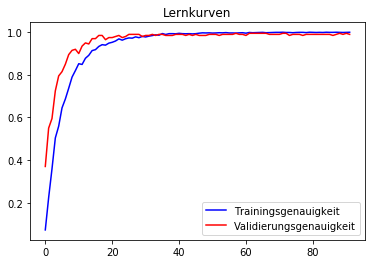

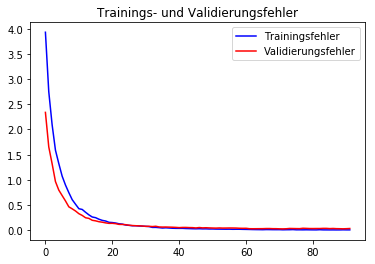

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.89      0.78      0.83        60
           1       0.96      0.96      0.96       720
           2       0.96      0.98      0.97       750
           3       0.91      0.96      0.94       450
           4       0.96      0.94      0.95       660
           5       0.92      0.93      0.93       630
           6       0.97      0.67      0.79       150
           7       0.96      0.90      0.93       450
           8       0.89      0.95      0.92       450
           9       0.96      0.98      0.97       480
          10       0.97      0.98      0.98       660
          11       0.87      0.91      0.89       420
          12       0.99      0.98      0.98       690
          13       0.98      1.00      0.99       720
          14       1.00      0.99      1.00       270
          15       0.91      1.00      0.95       210
          16       0.95      0.95      0.95       

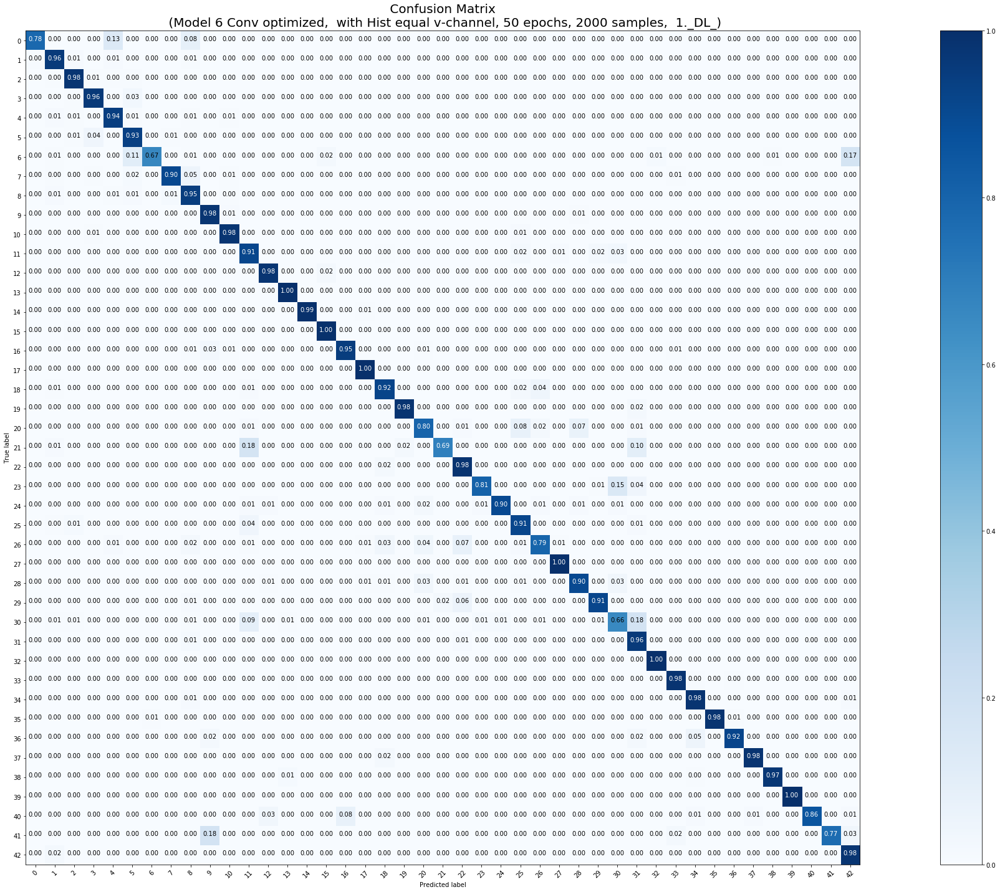

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 3s 1ms/step - loss: 4.0238 - acc: 0.0800 - val_loss: 2.4125 - val_acc: 0.3550
Epoch 2/300
1800/1800 [==============================] - 1s 419us/step - loss: 2.6775 - acc: 0.2522 - val_loss: 1.6761 - val_acc: 0.5150
Epoch 3/300
1800/1800 [==============================] - 1s 420us/step - loss: 1.8903 - acc: 0.4189 - val_loss: 1.3365 - val_acc: 0.5750
Epoch 4/300
1800/1800 [==============================] - 1s 415us/step - loss: 1.4022 - acc: 0.5583 - val_loss: 1.0023 - val_acc: 0.6900
Epoch 5/300
1800/1800 [==============================] - 1s 414us/step - loss: 1.1328 - acc: 0.6344 - val_loss: 0.8842 - val_acc: 0.7400
Epoch 6/300
1800/1800 [==============================] - 1s 420us/step - loss: 0.9246 - acc: 0.6950 - val_loss: 0.6911 - val_ac

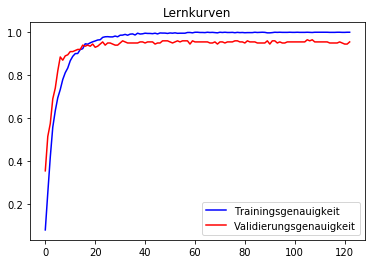

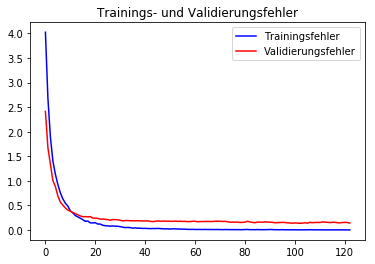

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.86      0.95      0.90        60
           1       0.98      0.95      0.97       720
           2       0.96      0.98      0.97       750
           3       0.90      0.93      0.92       450
           4       0.99      0.95      0.97       660
           5       0.92      0.93      0.92       630
           6       1.00      0.67      0.80       150
           7       0.96      0.90      0.93       450
           8       0.92      0.96      0.94       450
           9       0.95      0.97      0.96       480
          10       0.96      0.96      0.96       660
          11       0.91      0.89      0.90       420
          12       1.00      0.99      0.99       690
          13       0.99      1.00      0.99       720
          14       1.00      0.99      1.00       270
          15       0.86      0.99      0.92       210
          16       0.94      0.95      0.95       

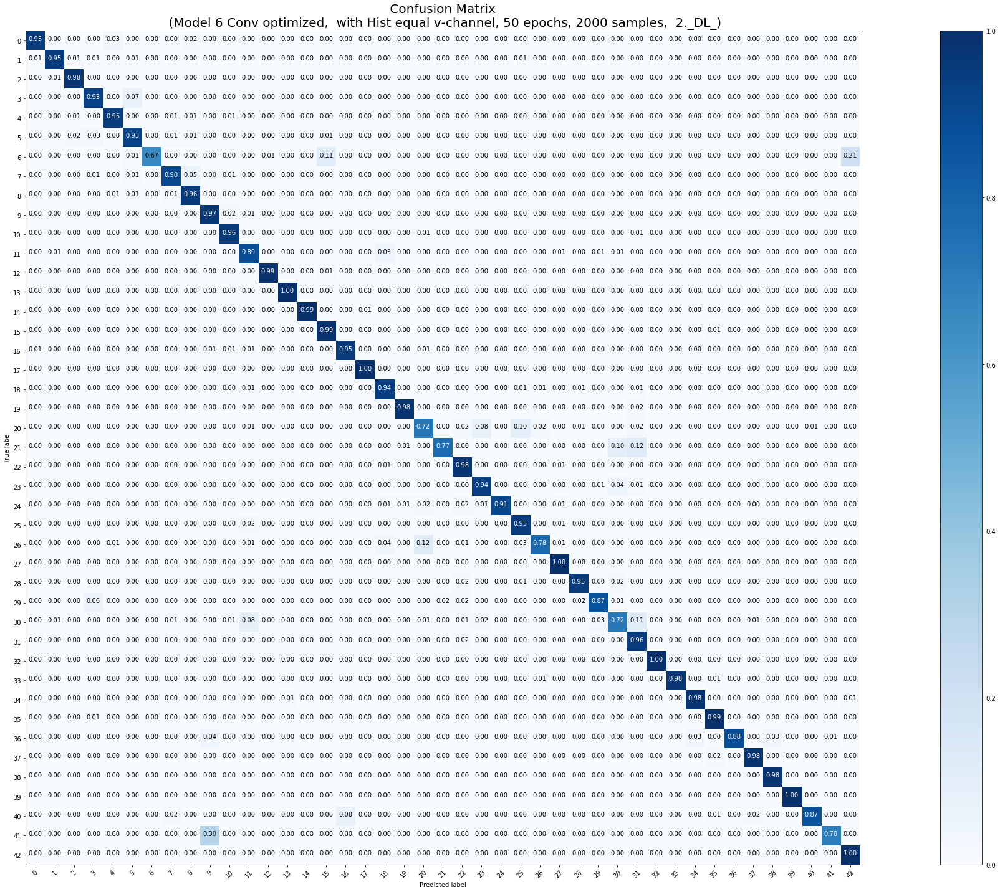

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 3s 2ms/step - loss: 3.9998 - acc: 0.0889 - val_loss: 2.2028 - val_acc: 0.4200
Epoch 2/300
1800/1800 [==============================] - 1s 426us/step - loss: 2.6605 - acc: 0.2633 - val_loss: 1.6058 - val_acc: 0.5300
Epoch 3/300
1800/1800 [==============================] - 1s 440us/step - loss: 1.9444 - acc: 0.4056 - val_loss: 1.2116 - val_acc: 0.6400
Epoch 4/300
1800/1800 [==============================] - 1s 429us/step - loss: 1.4585 - acc: 0.5350 - val_loss: 0.9478 - val_acc: 0.7150
Epoch 5/300
1800/1800 [==============================] - 1s 424us/step - loss: 1.2161 - acc: 0.6083 - val_loss: 0.8179 - val_acc: 0.7700
Epoch 6/300
1800/1800 [==============================] - 1s 426us/step - loss: 0.9306 - acc: 0.6839 - val_loss: 0.7062 - val_ac

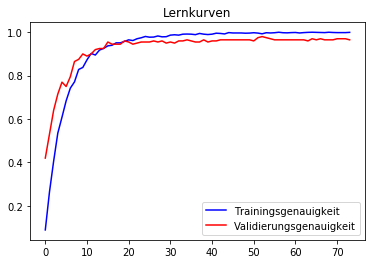

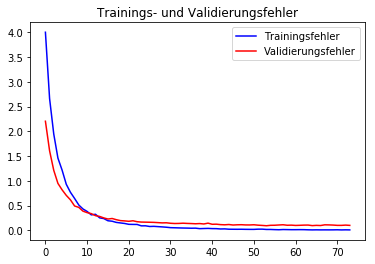

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.84      0.72      0.77        60
           1       0.96      0.93      0.95       720
           2       0.93      0.99      0.96       750
           3       0.93      0.96      0.94       450
           4       0.97      0.95      0.96       660
           5       0.95      0.91      0.93       630
           6       0.99      0.63      0.77       150
           7       0.96      0.91      0.93       450
           8       0.89      0.96      0.93       450
           9       0.95      0.98      0.96       480
          10       0.95      0.96      0.95       660
          11       0.91      0.85      0.87       420
          12       0.99      0.97      0.98       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.90      0.99      0.94       210
          16       0.97      0.95      0.96       

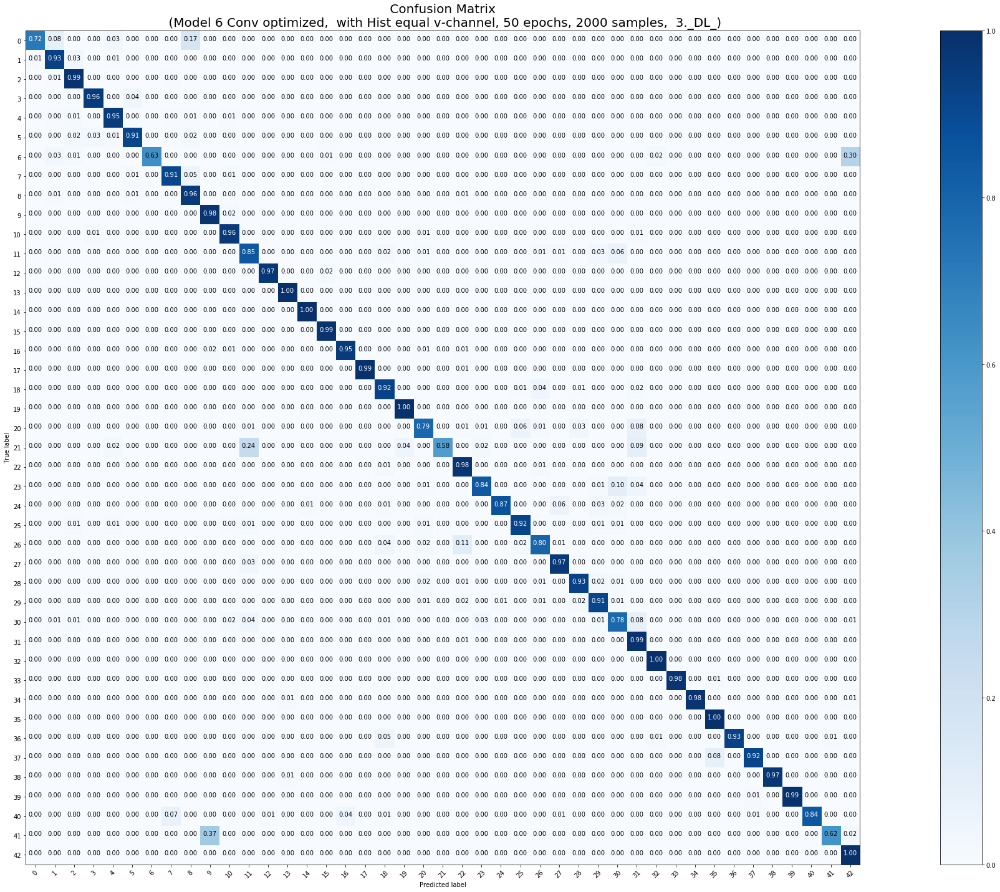

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 3s 2ms/step - loss: 3.8828 - acc: 0.0956 - val_loss: 2.2857 - val_acc: 0.3750
Epoch 2/300
1800/1800 [==============================] - 1s 434us/step - loss: 2.7077 - acc: 0.2439 - val_loss: 1.6935 - val_acc: 0.5250
Epoch 3/300
1800/1800 [==============================] - 1s 435us/step - loss: 1.9858 - acc: 0.4028 - val_loss: 1.2853 - val_acc: 0.6050
Epoch 4/300
1800/1800 [==============================] - 1s 430us/step - loss: 1.5390 - acc: 0.5128 - val_loss: 1.0631 - val_acc: 0.7000
Epoch 5/300
1800/1800 [==============================] - 1s 425us/step - loss: 1.1642 - acc: 0.6244 - val_loss: 0.8730 - val_acc: 0.7500
Epoch 6/300
1800/1800 [==============================] - 1s 435us/step - loss: 0.9853 - acc: 0.6700 - val_loss: 0.7214 - val_ac

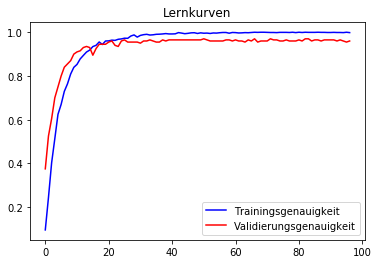

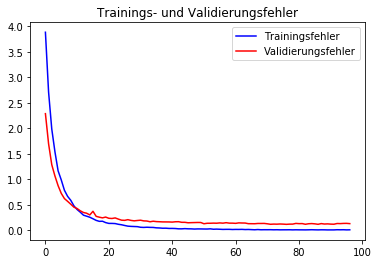

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.80      0.87      0.83        60
           1       0.94      0.95      0.95       720
           2       0.95      0.98      0.96       750
           3       0.94      0.92      0.93       450
           4       0.95      0.95      0.95       660
           5       0.92      0.93      0.92       630
           6       1.00      0.68      0.81       150
           7       0.93      0.91      0.92       450
           8       0.91      0.94      0.92       450
           9       0.96      0.98      0.97       480
          10       0.95      0.98      0.96       660
          11       0.94      0.84      0.89       420
          12       0.99      0.97      0.98       690
          13       0.99      1.00      0.99       720
          14       1.00      0.99      0.99       270
          15       0.88      1.00      0.94       210
          16       0.98      0.95      0.96       

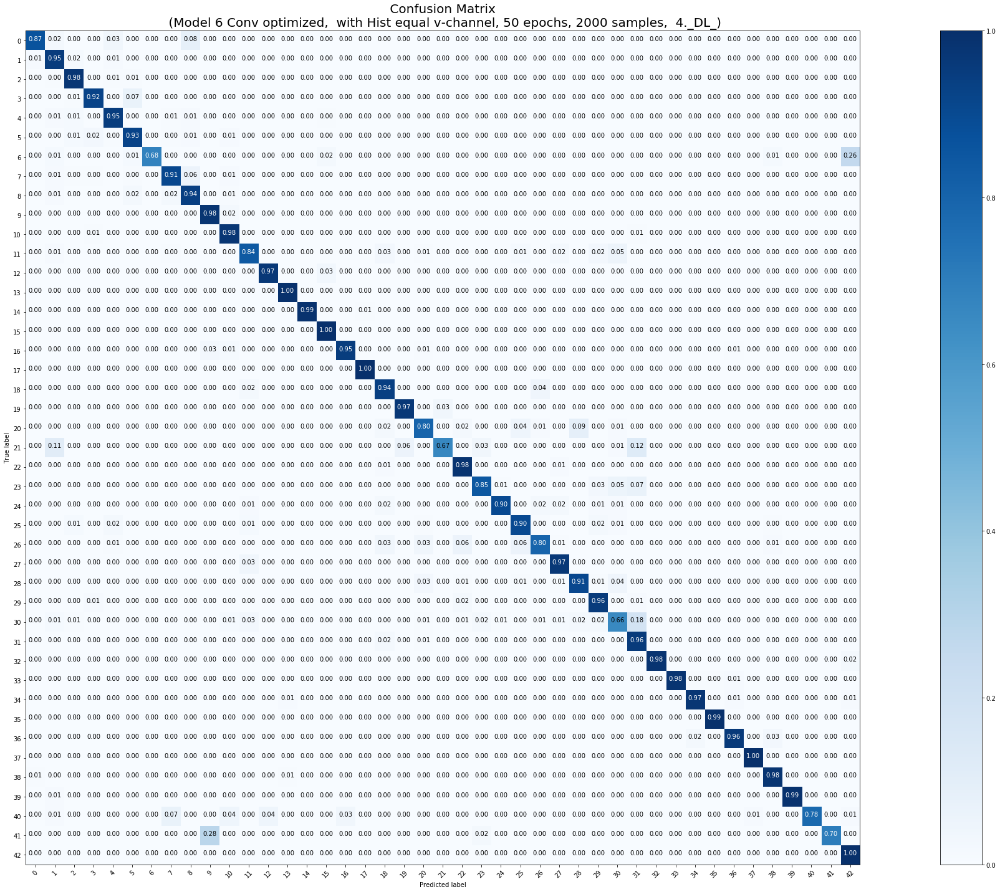

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 4s 2ms/step - loss: 3.9242 - acc: 0.0822 - val_loss: 2.1281 - val_acc: 0.4300
Epoch 2/300
1800/1800 [==============================] - 1s 447us/step - loss: 2.6430 - acc: 0.2611 - val_loss: 1.4920 - val_acc: 0.5900
Epoch 3/300
1800/1800 [==============================] - 1s 437us/step - loss: 1.9750 - acc: 0.3967 - val_loss: 1.0792 - val_acc: 0.6950
Epoch 4/300
1800/1800 [==============================] - 1s 437us/step - loss: 1.5556 - acc: 0.4972 - val_loss: 0.8628 - val_acc: 0.7700
Epoch 5/300
1800/1800 [==============================] - 1s 438us/step - loss: 1.2423 - acc: 0.5933 - val_loss: 0.7071 - val_acc: 0.8200
Epoch 6/300
1800/1800 [==============================] - 1s 442us/step - loss: 0.9706 - acc: 0.6717 - val_loss: 0.6331 - val_ac

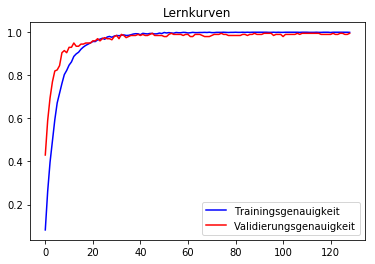

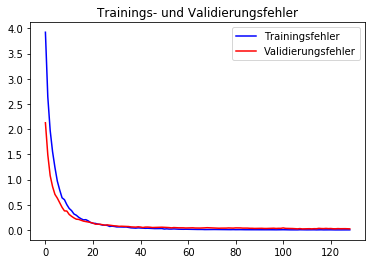

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.83      0.90        60
           1       0.98      0.95      0.96       720
           2       0.94      0.98      0.96       750
           3       0.95      0.95      0.95       450
           4       0.96      0.96      0.96       660
           5       0.95      0.93      0.94       630
           6       1.00      0.68      0.81       150
           7       0.93      0.94      0.93       450
           8       0.93      0.94      0.94       450
           9       0.95      0.98      0.96       480
          10       0.95      0.98      0.96       660
          11       0.89      0.92      0.91       420
          12       1.00      0.97      0.98       690
          13       0.99      0.99      0.99       720
          14       1.00      0.99      1.00       270
          15       0.89      0.99      0.94       210
          16       0.98      0.95      0.96       

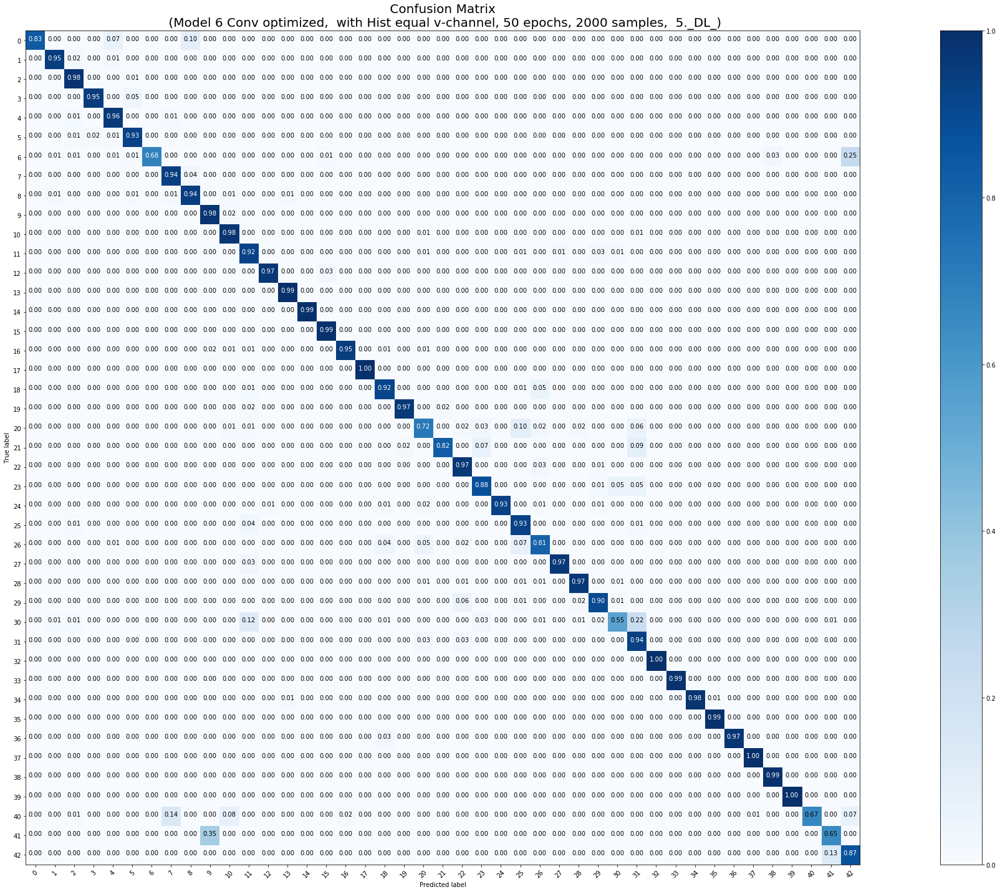

Die durchschnittliche Epochenanzahl beträgt:  83.0


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 2000       
# optimierten Parameter: Dropoutrate = 0.2,  Lernrate = 0.0001, mit SpatialDropout   ### versehentlich 50 Epochen in Konfusionsmatrix-Titel
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_2000, y_tr_2000, X_test, y_test, 0.2, 0.0001, True, 300, 2000)

In [0]:
downloader(1,5, 2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 5s 80ms/step - loss: 4.1307 - acc: 0.0548 - val_loss: 2.5593 - val_acc: 0.2950
Epoch 2/300
57/57 [==============================] - 1s 21ms/step - loss: 3.4531 - acc: 0.1442 - val_loss: 2.0067 - val_acc: 0.3800
Epoch 3/300
57/57 [==============================] - 1s 25ms/step - loss: 2.9696 - acc: 0.1935 - val_loss: 1.6863 - val_acc: 0.5100
Epoch 4/300
57/57 [==============================] - 1s 25ms/step - loss: 2.6612 - acc: 0.2697 - val_loss: 1.4150 - val_acc: 0.5500
Epoch 5/300
57/57 [==============================] - 1s 24ms/step - loss: 2.3544 - acc: 0.3185 - val_loss: 1.2165 - val_acc: 0.6500
Epoch 6/300
57/57 [==============================] - 2s 29ms/step - loss: 2.2382 - acc: 0.3492 - val_loss: 1.0705 - val_acc: 0.6700
Epoch 7/300
57/57 [==============================] - 1s 25ms/step

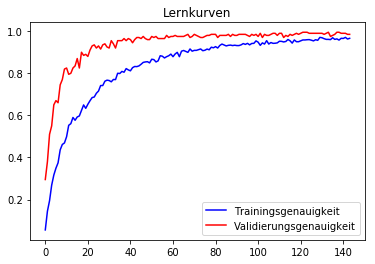

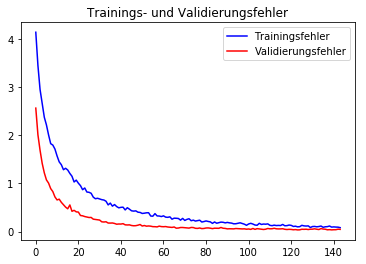

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.88      0.94        60
           1       0.99      0.94      0.97       720
           2       0.95      0.99      0.97       750
           3       0.98      0.92      0.95       450
           4       0.99      0.98      0.99       660
           5       0.92      0.98      0.95       630
           6       1.00      0.83      0.91       150
           7       0.97      0.96      0.97       450
           8       0.93      0.97      0.95       450
           9       0.98      1.00      0.99       480
          10       1.00      0.98      0.99       660
          11       1.00      0.89      0.94       420
          12       1.00      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.95      0.99      0.97       

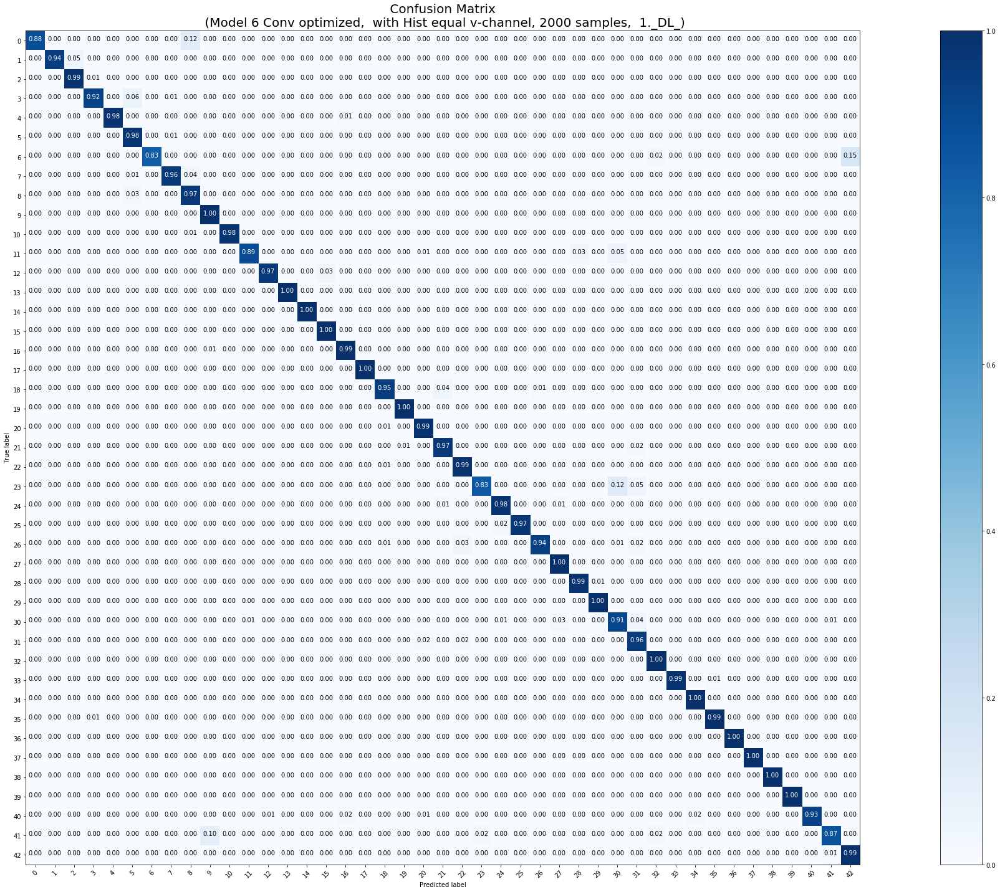

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 5s 91ms/step - loss: 4.2039 - acc: 0.0576 - val_loss: 2.3876 - val_acc: 0.3800
Epoch 2/300
57/57 [==============================] - 1s 20ms/step - loss: 3.4086 - acc: 0.1409 - val_loss: 2.0426 - val_acc: 0.4350
Epoch 3/300
57/57 [==============================] - 1s 26ms/step - loss: 2.8177 - acc: 0.2232 - val_loss: 1.8001 - val_acc: 0.5000
Epoch 4/300
57/57 [==============================] - 1s 25ms/step - loss: 2.5831 - acc: 0.2779 - val_loss: 1.6695 - val_acc: 0.5200
Epoch 5/300
57/57 [==============================] - 1s 25ms/step - loss: 2.3193 - acc: 0.3306 - val_loss: 1.3528 - val_acc: 0.5950
Epoch 6/300
57/57 [==============================] - 1s 25ms/step - loss: 2.1284 - acc: 0.3674 - val_loss: 1.2128 - val_acc: 0.6100
Epoch 7/300
57/57 [==============================] - 1s 25ms/step

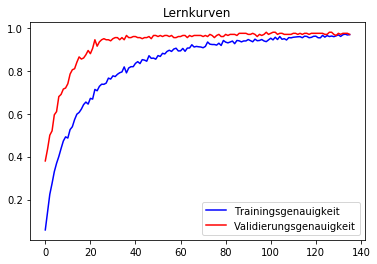

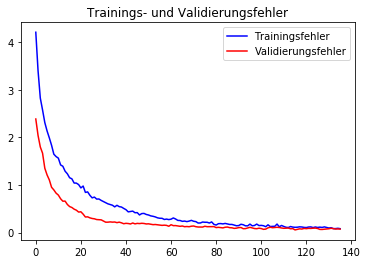

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        60
           1       0.99      0.98      0.99       720
           2       0.99      0.98      0.99       750
           3       0.98      0.96      0.97       450
           4       0.99      0.98      0.99       660
           5       0.96      0.96      0.96       630
           6       1.00      0.83      0.91       150
           7       0.95      0.98      0.96       450
           8       0.96      0.98      0.97       450
           9       0.99      0.97      0.98       480
          10       1.00      0.98      0.99       660
          11       0.93      0.96      0.94       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.94      0.99      0.97       

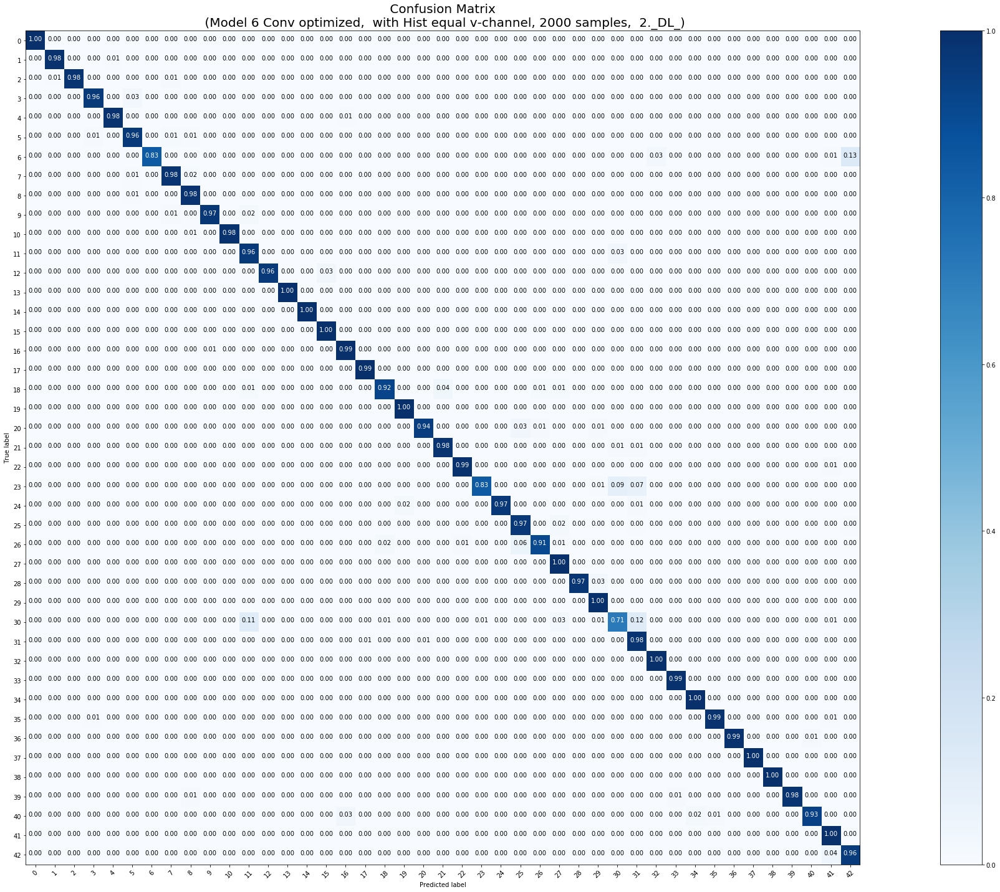

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 5s 96ms/step - loss: 4.0642 - acc: 0.0740 - val_loss: 2.5861 - val_acc: 0.3050
Epoch 2/300
57/57 [==============================] - 1s 21ms/step - loss: 3.2696 - acc: 0.1480 - val_loss: 2.0590 - val_acc: 0.4600
Epoch 3/300
57/57 [==============================] - 1s 24ms/step - loss: 2.8335 - acc: 0.2226 - val_loss: 1.6471 - val_acc: 0.5350
Epoch 4/300
57/57 [==============================] - 1s 25ms/step - loss: 2.5814 - acc: 0.2780 - val_loss: 1.4403 - val_acc: 0.5550
Epoch 5/300
57/57 [==============================] - 1s 26ms/step - loss: 2.2519 - acc: 0.3355 - val_loss: 1.2784 - val_acc: 0.6250
Epoch 6/300
57/57 [==============================] - 1s 25ms/step - loss: 2.0347 - acc: 0.4078 - val_loss: 1.1022 - val_acc: 0.6700
Epoch 7/300
57/57 [==============================] - 1s 25ms/step

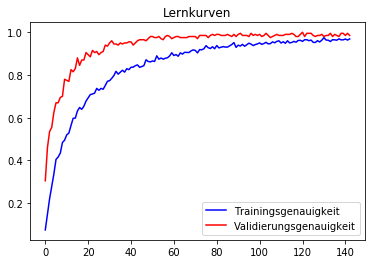

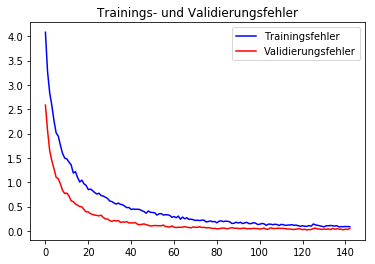

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.95      0.93      0.94        60
           1       0.98      0.98      0.98       720
           2       0.97      0.98      0.97       750
           3       1.00      0.92      0.96       450
           4       0.98      0.98      0.98       660
           5       0.95      0.94      0.94       630
           6       1.00      0.84      0.91       150
           7       0.95      0.97      0.96       450
           8       0.94      0.99      0.96       450
           9       0.99      0.97      0.98       480
          10       0.99      0.98      0.99       660
          11       0.99      0.90      0.94       420
          12       1.00      0.98      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.94      0.99      0.97       210
          16       0.98      0.99      0.99       

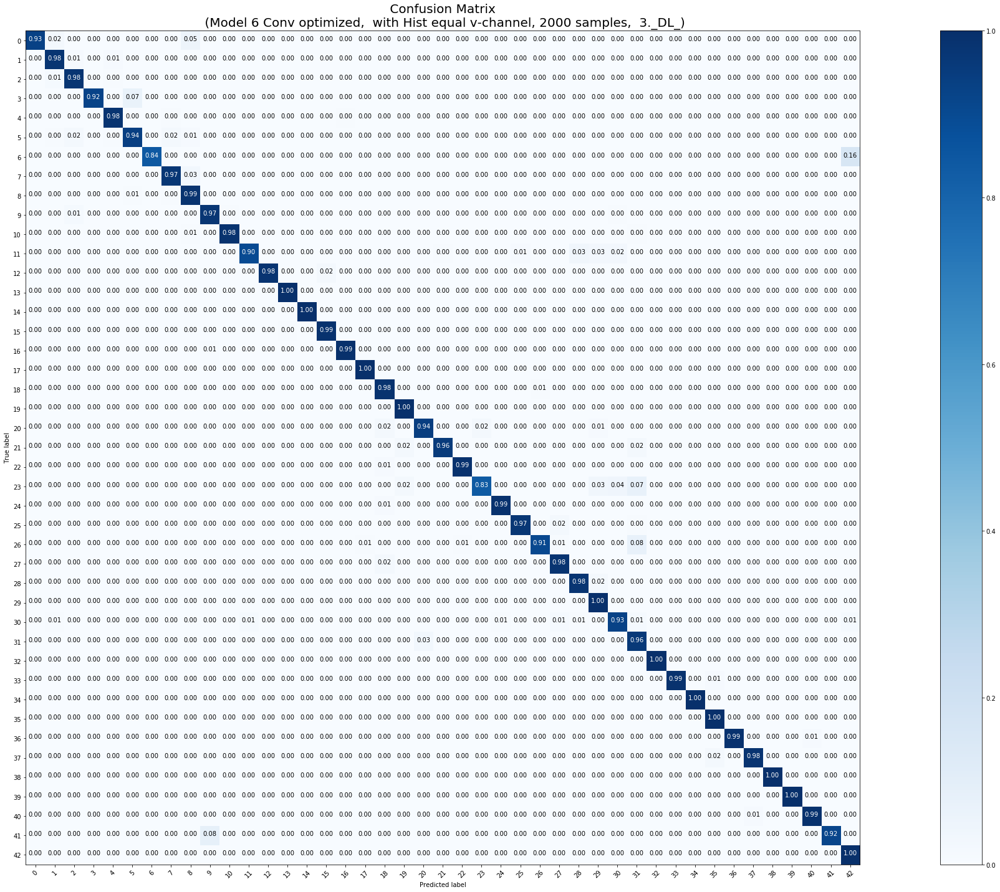

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 6s 105ms/step - loss: 4.1477 - acc: 0.0570 - val_loss: 2.6360 - val_acc: 0.2400
Epoch 2/300
57/57 [==============================] - 1s 20ms/step - loss: 3.3574 - acc: 0.1458 - val_loss: 2.0311 - val_acc: 0.3600
Epoch 3/300
57/57 [==============================] - 1s 25ms/step - loss: 2.9041 - acc: 0.2051 - val_loss: 1.6925 - val_acc: 0.5100
Epoch 4/300
57/57 [==============================] - 1s 25ms/step - loss: 2.7083 - acc: 0.2598 - val_loss: 1.5388 - val_acc: 0.5050
Epoch 5/300
57/57 [==============================] - 1s 25ms/step - loss: 2.3971 - acc: 0.2988 - val_loss: 1.3200 - val_acc: 0.6150
Epoch 6/300
57/57 [==============================] - 1s 25ms/step - loss: 2.1432 - acc: 0.3859 - val_loss: 1.2672 - val_acc: 0.6150
Epoch 7/300
57/57 [==============================] - 1s 25ms/ste

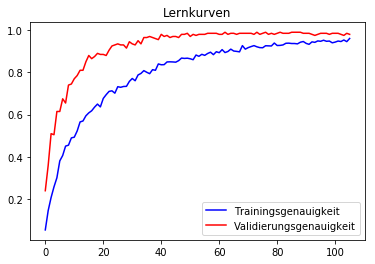

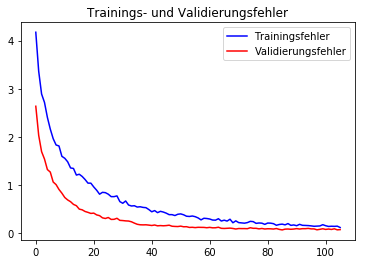

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        60
           1       0.98      0.98      0.98       720
           2       0.97      0.98      0.98       750
           3       1.00      0.92      0.96       450
           4       0.99      0.99      0.99       660
           5       0.94      0.97      0.95       630
           6       1.00      0.79      0.88       150
           7       0.98      0.96      0.97       450
           8       0.97      0.99      0.98       450
           9       1.00      0.96      0.98       480
          10       0.99      1.00      0.99       660
          11       0.99      0.90      0.94       420
          12       1.00      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.90      1.00      0.95       210
          16       0.95      0.99      0.97       

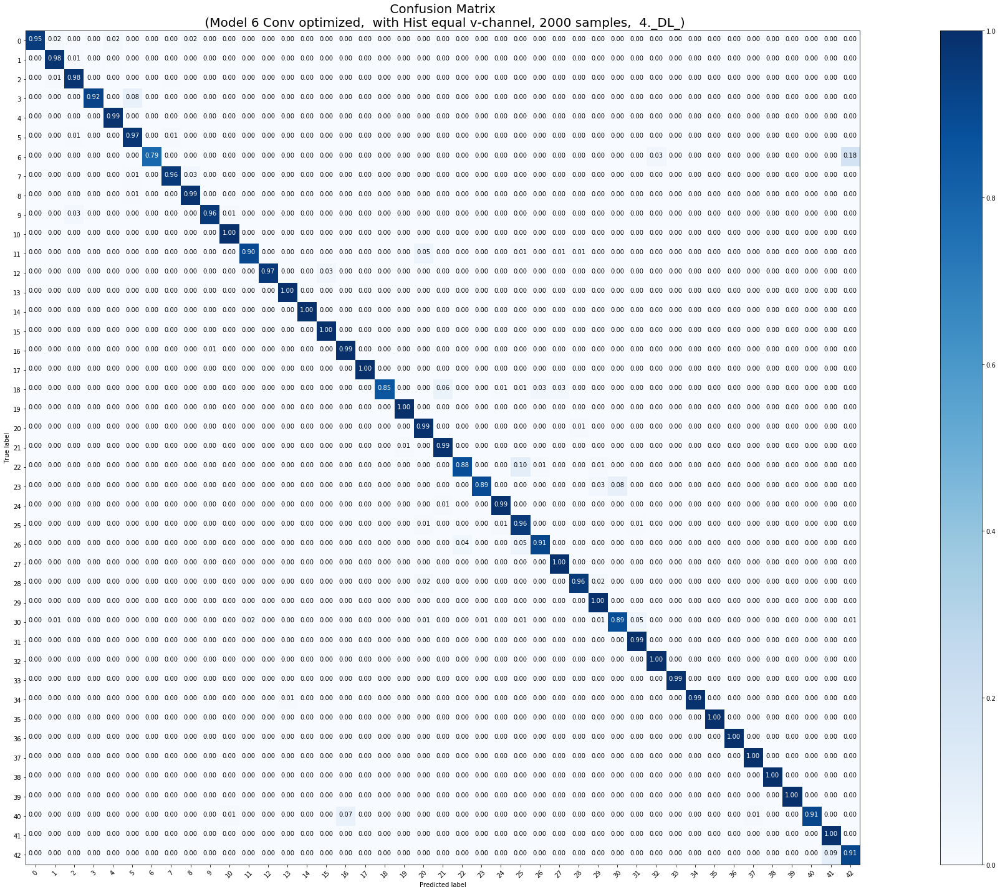

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 6s 110ms/step - loss: 4.2082 - acc: 0.0543 - val_loss: 2.6758 - val_acc: 0.2750
Epoch 2/300
57/57 [==============================] - 1s 23ms/step - loss: 3.3714 - acc: 0.1360 - val_loss: 2.1318 - val_acc: 0.4200
Epoch 3/300
57/57 [==============================] - 1s 26ms/step - loss: 2.9068 - acc: 0.2138 - val_loss: 1.8816 - val_acc: 0.4550
Epoch 4/300
57/57 [==============================] - 2s 26ms/step - loss: 2.5448 - acc: 0.2884 - val_loss: 1.5532 - val_acc: 0.5650
Epoch 5/300
57/57 [==============================] - 1s 26ms/step - loss: 2.3636 - acc: 0.3163 - val_loss: 1.2615 - val_acc: 0.6150
Epoch 6/300
57/57 [==============================] - 1s 26ms/step - loss: 2.1816 - acc: 0.3519 - val_loss: 1.1432 - val_acc: 0.6500
Epoch 7/300
57/57 [==============================] - 1s 26ms/ste

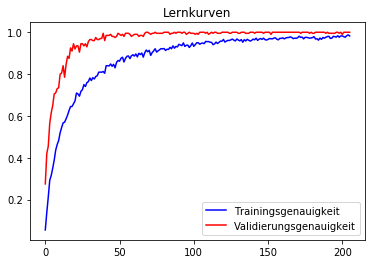

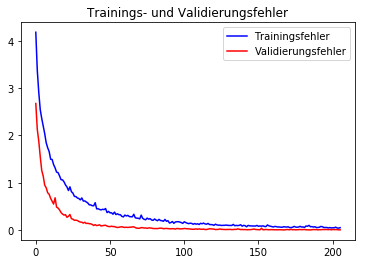

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        60
           1       0.98      0.99      0.99       720
           2       0.99      0.98      0.99       750
           3       0.99      0.94      0.97       450
           4       0.99      0.99      0.99       660
           5       0.95      0.97      0.96       630
           6       1.00      0.83      0.91       150
           7       0.99      0.98      0.99       450
           8       0.97      0.97      0.97       450
           9       1.00      1.00      1.00       480
          10       1.00      0.99      0.99       660
          11       1.00      0.92      0.96       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       1.00      0.99      1.00       

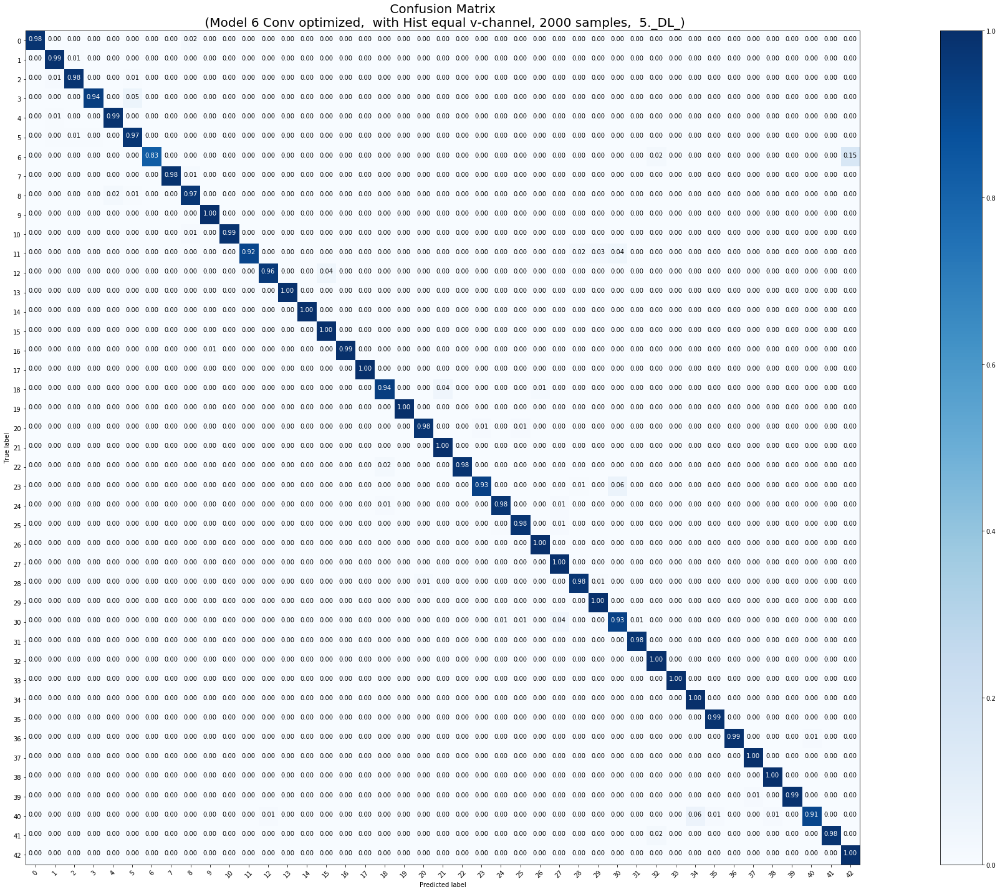

Die durchschnittliche Epochenanzahl beträgt:  127.0


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 2000
# optimierten Parameter: Dropoutrate = 0.2,  Lernrate = 0.0001, mit SpatialDropout   !!!!! mit Data Augmentation   !!!!!!!
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_2000, y_tr_2000, X_test, y_test, 0.2, 0.0001, True, 300, 2000)

In [0]:
downloader(1,5, 2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 9s 2ms/step - loss: 3.8914 - acc: 0.0882 - val_loss: 2.4051 - val_acc: 0.3740
Epoch 2/300
4500/4500 [==============================] - 3s 584us/step - loss: 2.6365 - acc: 0.2687 - val_loss: 1.6410 - val_acc: 0.5400
Epoch 3/300
4500/4500 [==============================] - 3s 586us/step - loss: 1.9104 - acc: 0.4369 - val_loss: 1.1483 - val_acc: 0.6300
Epoch 4/300
4500/4500 [==============================] - 3s 580us/step - loss: 1.4379 - acc: 0.5422 - val_loss: 0.8918 - val_acc: 0.7280
Epoch 5/300
4500/4500 [==============================] - 3s 590us/step - loss: 1.1541 - acc: 0.6196 - val_loss: 0.6752 - val_acc: 0.8100
Epoch 6/300
4500/4500 [==============================] - 3s 594us/step - loss: 0.9153 - acc: 0.6800 - val_loss: 0.5756 - val_ac

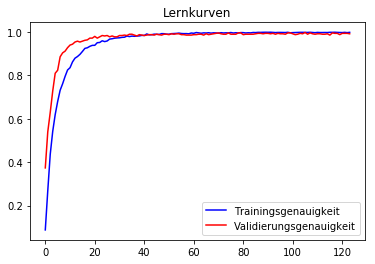

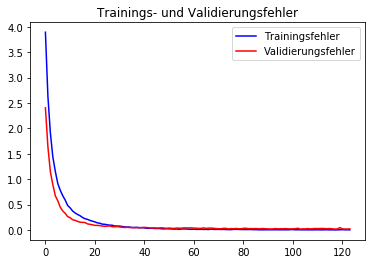

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.93      0.95      0.94        60
           1       0.98      0.97      0.97       720
           2       0.97      0.99      0.98       750
           3       0.97      0.95      0.96       450
           4       1.00      0.97      0.98       660
           5       0.93      0.97      0.95       630
           6       0.99      0.65      0.79       150
           7       0.98      0.93      0.95       450
           8       0.94      0.96      0.95       450
           9       1.00      0.99      1.00       480
          10       0.99      0.99      0.99       660
          11       0.98      0.95      0.97       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.99      1.00      0.99       210
          16       0.99      0.98      0.99       

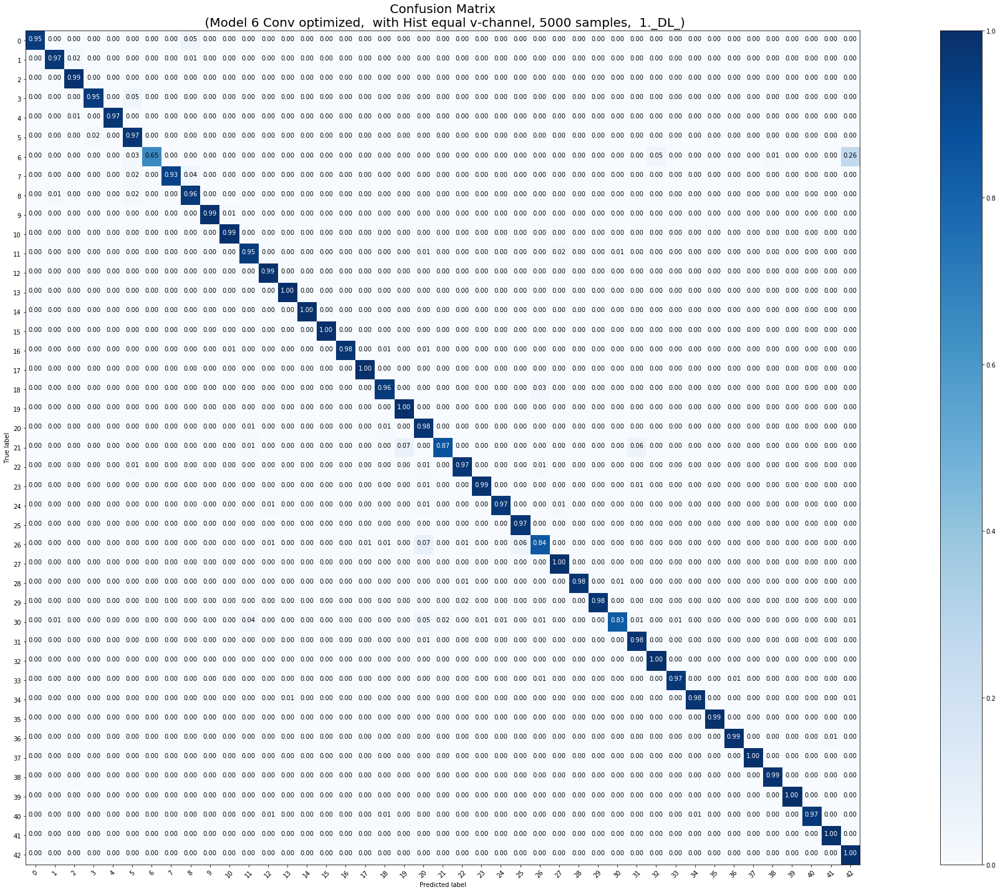

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 9s 2ms/step - loss: 3.8983 - acc: 0.0887 - val_loss: 2.4607 - val_acc: 0.3100
Epoch 2/300
4500/4500 [==============================] - 3s 572us/step - loss: 2.5895 - acc: 0.2753 - val_loss: 1.7427 - val_acc: 0.4840
Epoch 3/300
4500/4500 [==============================] - 3s 590us/step - loss: 1.9048 - acc: 0.4327 - val_loss: 1.2304 - val_acc: 0.6400
Epoch 4/300
4500/4500 [==============================] - 3s 578us/step - loss: 1.4391 - acc: 0.5360 - val_loss: 0.9090 - val_acc: 0.7320
Epoch 5/300
4500/4500 [==============================] - 3s 573us/step - loss: 1.1128 - acc: 0.6162 - val_loss: 0.7776 - val_acc: 0.7640
Epoch 6/300
4500/4500 [==============================] - 3s 590us/step - loss: 0.9203 - acc: 0.6916 - val_loss: 0.6276 - val_ac

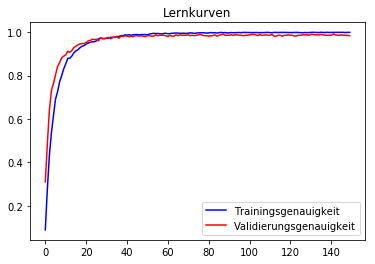

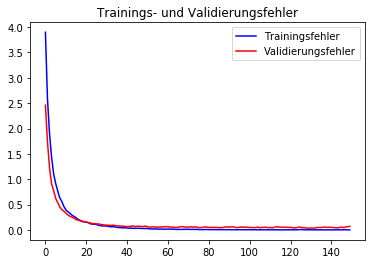

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        60
           1       0.99      0.97      0.98       720
           2       0.99      0.99      0.99       750
           3       0.98      0.94      0.96       450
           4       0.99      0.98      0.99       660
           5       0.94      0.98      0.96       630
           6       1.00      0.65      0.79       150
           7       0.98      0.96      0.97       450
           8       0.96      0.98      0.97       450
           9       0.97      0.98      0.98       480
          10       0.97      0.99      0.98       660
          11       0.97      0.96      0.97       420
          12       0.99      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.95      1.00      0.97       210
          16       0.96      0.99      0.97       

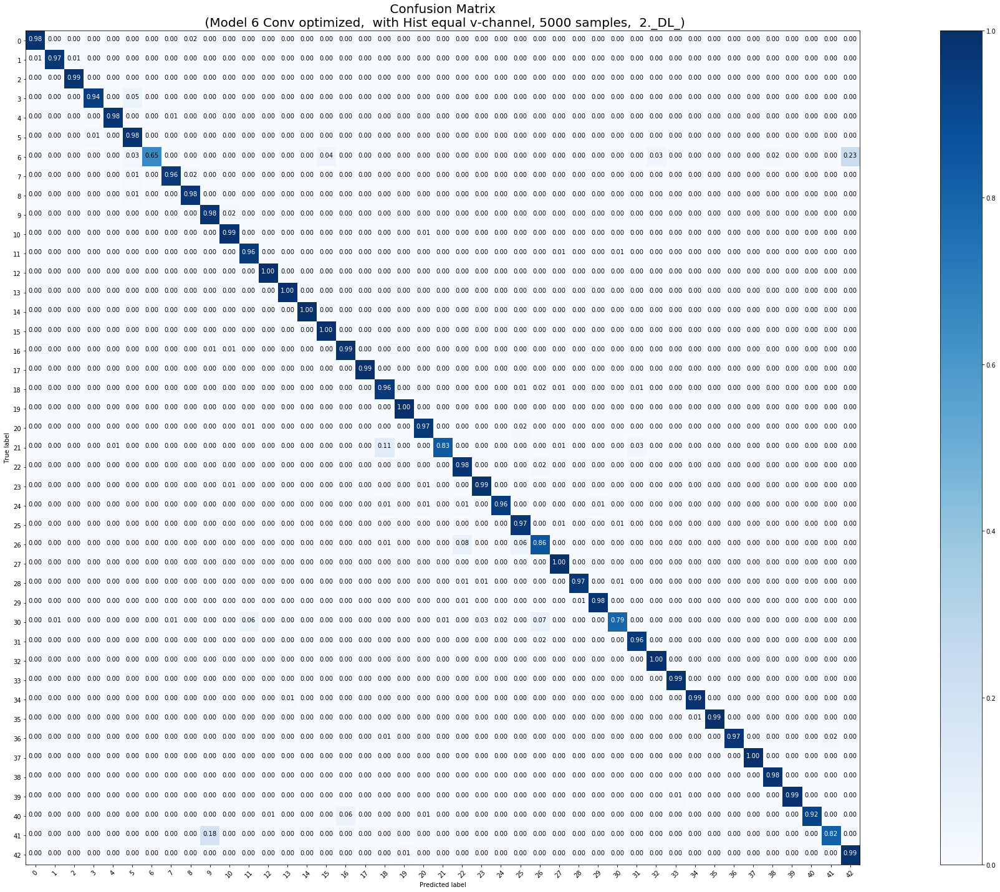

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 10s 2ms/step - loss: 3.8913 - acc: 0.0956 - val_loss: 2.4405 - val_acc: 0.2920
Epoch 2/300
4500/4500 [==============================] - 3s 575us/step - loss: 2.6976 - acc: 0.2658 - val_loss: 1.6745 - val_acc: 0.5100
Epoch 3/300
4500/4500 [==============================] - 3s 593us/step - loss: 1.9544 - acc: 0.4249 - val_loss: 1.2864 - val_acc: 0.6400
Epoch 4/300
4500/4500 [==============================] - 3s 599us/step - loss: 1.5048 - acc: 0.5256 - val_loss: 0.8842 - val_acc: 0.7440
Epoch 5/300
4500/4500 [==============================] - 3s 604us/step - loss: 1.1521 - acc: 0.6222 - val_loss: 0.7173 - val_acc: 0.7980
Epoch 6/300
4500/4500 [==============================] - 3s 595us/step - loss: 0.9506 - acc: 0.6878 - val_loss: 0.5283 - val_a

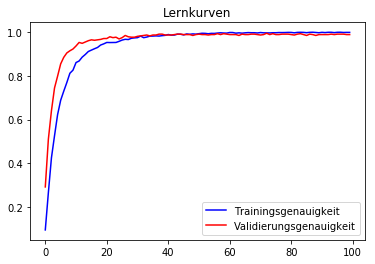

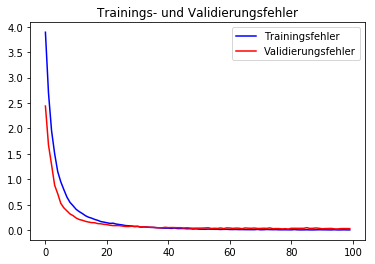

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.95      0.98      0.97        60
           1       0.97      0.98      0.98       720
           2       0.98      0.98      0.98       750
           3       0.96      0.94      0.95       450
           4       0.99      0.98      0.99       660
           5       0.95      0.96      0.95       630
           6       1.00      0.63      0.78       150
           7       0.96      0.96      0.96       450
           8       0.95      0.98      0.96       450
           9       0.97      0.99      0.98       480
          10       0.98      0.98      0.98       660
          11       0.88      0.98      0.93       420
          12       0.99      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.99      0.99      0.99       210
          16       0.99      0.99      0.99       

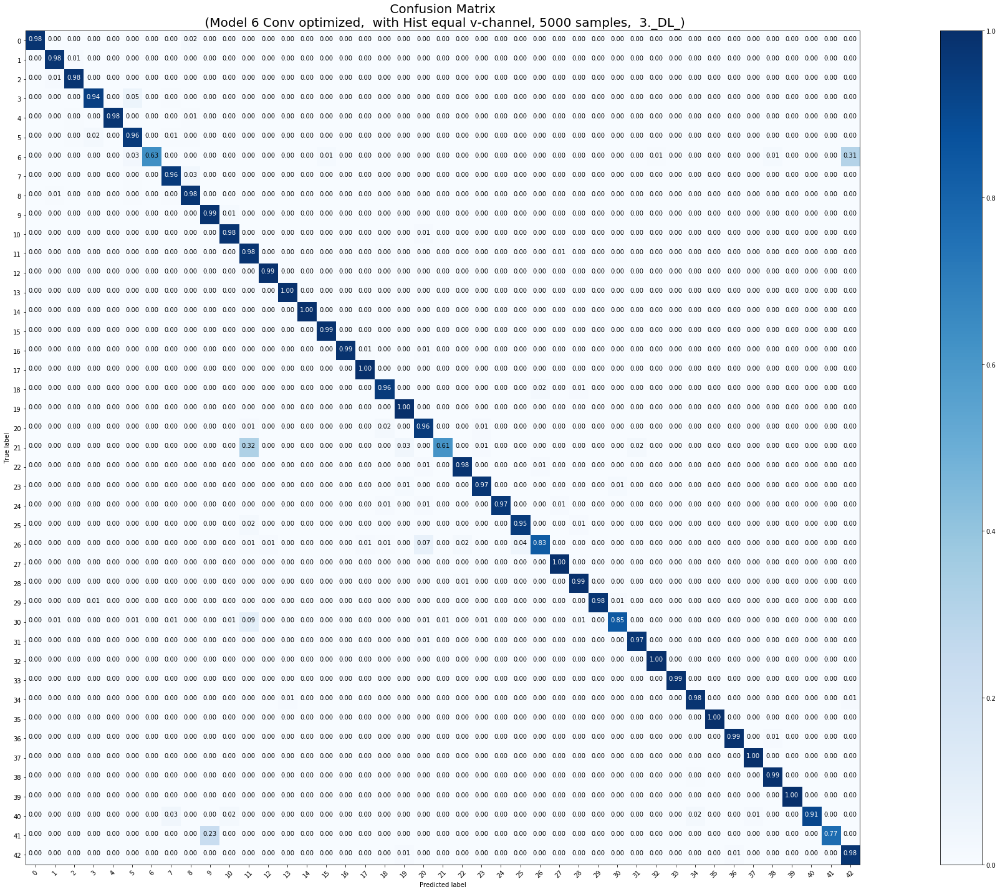

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 10s 2ms/step - loss: 3.7507 - acc: 0.0998 - val_loss: 2.2779 - val_acc: 0.3780
Epoch 2/300
4500/4500 [==============================] - 3s 623us/step - loss: 2.5150 - acc: 0.2993 - val_loss: 1.5052 - val_acc: 0.5560
Epoch 3/300
4500/4500 [==============================] - 3s 596us/step - loss: 1.8149 - acc: 0.4491 - val_loss: 1.0978 - val_acc: 0.6680
Epoch 4/300
4500/4500 [==============================] - 3s 606us/step - loss: 1.3384 - acc: 0.5640 - val_loss: 0.8170 - val_acc: 0.7620
Epoch 5/300
4500/4500 [==============================] - 3s 596us/step - loss: 1.0789 - acc: 0.6360 - val_loss: 0.6262 - val_acc: 0.8180
Epoch 6/300
4500/4500 [==============================] - 3s 578us/step - loss: 0.9045 - acc: 0.6896 - val_loss: 0.5533 - val_a

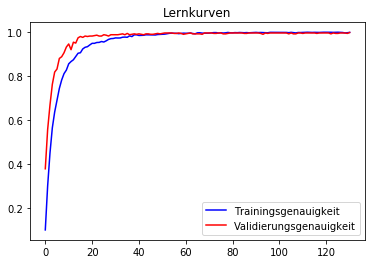

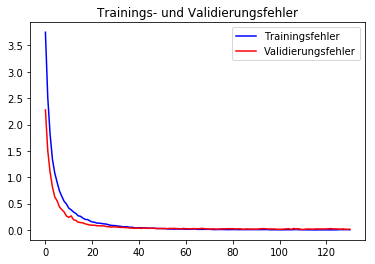

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.96      0.92      0.94        60
           1       0.97      0.98      0.98       720
           2       0.98      0.99      0.99       750
           3       0.98      0.97      0.98       450
           4       1.00      0.97      0.98       660
           5       0.92      0.98      0.95       630
           6       1.00      0.64      0.78       150
           7       0.97      0.97      0.97       450
           8       0.95      0.97      0.96       450
           9       0.97      0.98      0.97       480
          10       0.99      0.98      0.98       660
          11       0.92      0.91      0.92       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.99      0.99       270
          15       1.00      0.99      1.00       210
          16       0.97      0.99      0.98       

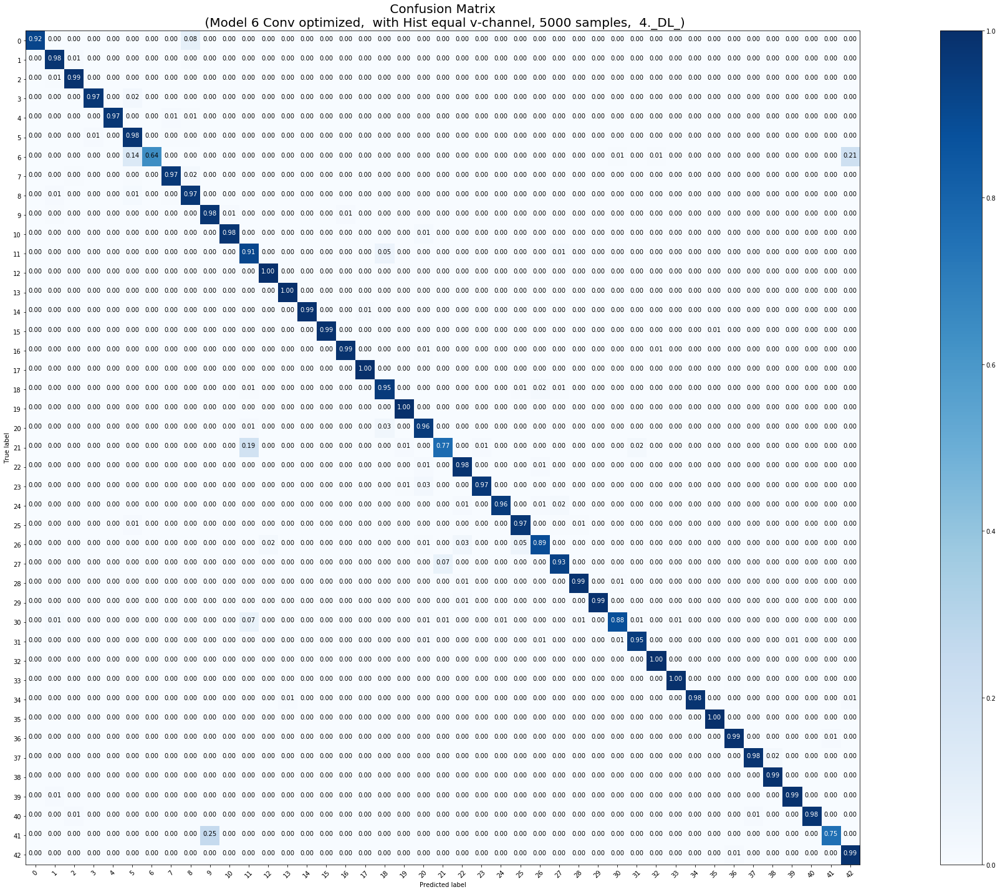

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 11s 2ms/step - loss: 3.9215 - acc: 0.0836 - val_loss: 2.6341 - val_acc: 0.2340
Epoch 2/300
4500/4500 [==============================] - 3s 604us/step - loss: 2.6650 - acc: 0.2682 - val_loss: 1.7695 - val_acc: 0.4840
Epoch 3/300
4500/4500 [==============================] - 3s 603us/step - loss: 1.9225 - acc: 0.4182 - val_loss: 1.2363 - val_acc: 0.6260
Epoch 4/300
4500/4500 [==============================] - 3s 609us/step - loss: 1.4752 - acc: 0.5456 - val_loss: 0.9307 - val_acc: 0.7380
Epoch 5/300
4500/4500 [==============================] - 3s 611us/step - loss: 1.1285 - acc: 0.6320 - val_loss: 0.7753 - val_acc: 0.7900
Epoch 6/300
4500/4500 [==============================] - 3s 615us/step - loss: 0.9146 - acc: 0.6944 - val_loss: 0.6253 - val_a

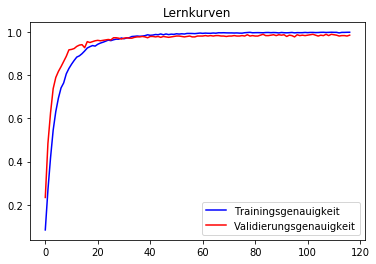

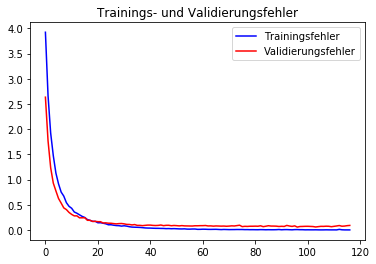

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.91      0.97      0.94        60
           1       0.97      0.97      0.97       720
           2       0.98      0.99      0.98       750
           3       0.96      0.94      0.95       450
           4       0.99      0.97      0.98       660
           5       0.92      0.97      0.95       630
           6       1.00      0.63      0.77       150
           7       0.96      0.95      0.96       450
           8       0.92      0.97      0.94       450
           9       0.99      0.99      0.99       480
          10       0.99      0.97      0.98       660
          11       0.94      0.91      0.93       420
          12       0.99      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.98      1.00      0.99       210
          16       0.95      0.98      0.96       

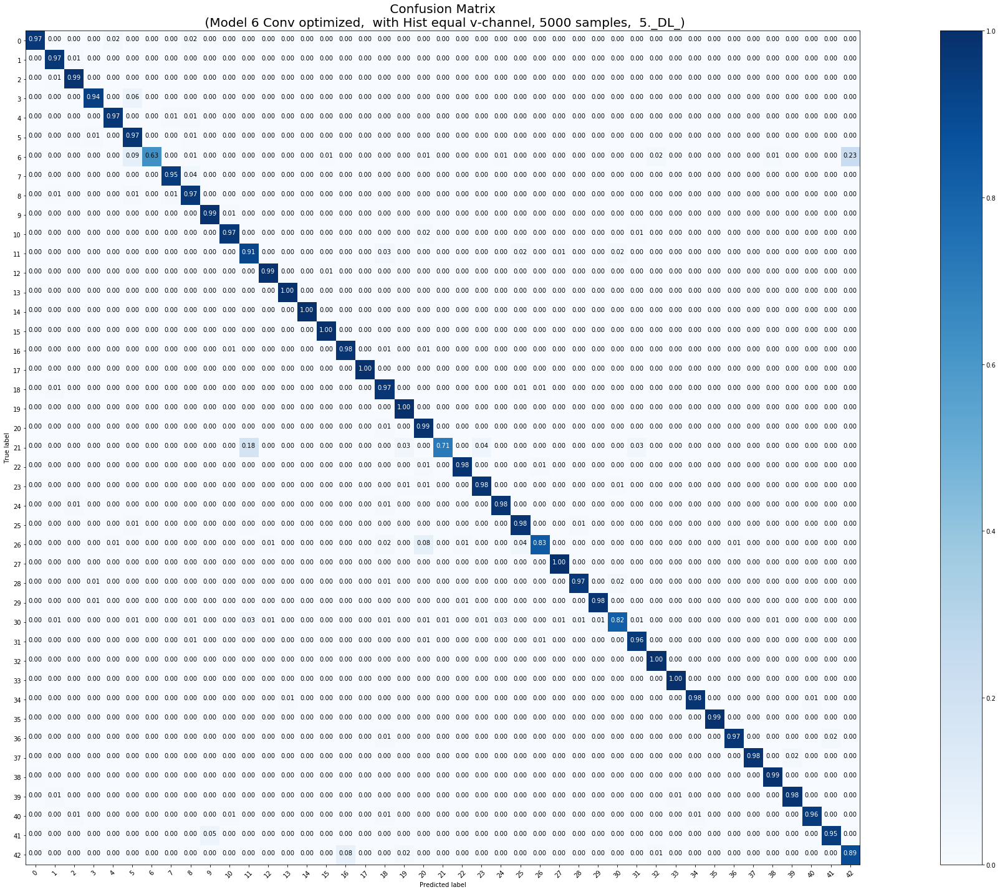

Die durchschnittliche Epochenanzahl beträgt:  104.4


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 5000   
# optimierten Parameter: Dropoutrate = 0.4,  Lernrate = 0.0001, ohne SpatialDropout    
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_5000, y_tr_5000, X_test, y_test, 0.4, 0.0001, False, 300, 5000)

In [0]:
downloader(1,5,5000)

In [0]:
# Trainingsmenge 5000
# optimierten Parameter: Dropoutrate = 0.4,  Lernrate = 0.0001, ohne SpatialDropout   !!!!! mit Data Augmentation   !!!!!!!
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_5000, y_tr_5000, X_test, y_test, 0.4, 0.0001, False, 300, 2000)

In [0]:
downloader(1,5,5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 9s 1ms/step - loss: 2.8332 - acc: 0.2644 - val_loss: 1.1257 - val_acc: 0.6910
Epoch 2/300
9000/9000 [==============================] - 4s 457us/step - loss: 1.2758 - acc: 0.5950 - val_loss: 0.5916 - val_acc: 0.8470
Epoch 3/300
9000/9000 [==============================] - 4s 457us/step - loss: 0.7385 - acc: 0.7541 - val_loss: 0.3497 - val_acc: 0.9120
Epoch 4/300
9000/9000 [==============================] - 4s 449us/step - loss: 0.5096 - acc: 0.8283 - val_loss: 0.2450 - val_acc: 0.9370
Epoch 5/300
9000/9000 [==============================] - 4s 469us/step - loss: 0.3633 - acc: 0.8762 - val_loss: 0.1712 - val_acc: 0.9620
Epoch 6/300
9000/9000 [==============================] - 4s 458us/step - loss: 0.2677 - acc: 0.9101 - val_loss: 0.1469 - val_a

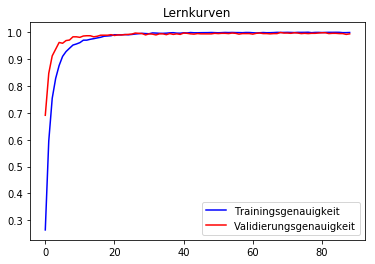

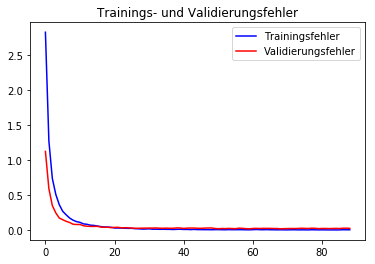

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        60
           1       0.98      0.99      0.98       720
           2       0.99      0.99      0.99       750
           3       0.99      0.96      0.97       450
           4       1.00      0.97      0.98       660
           5       0.93      0.98      0.95       630
           6       1.00      0.69      0.82       150
           7       0.98      0.97      0.97       450
           8       0.95      0.96      0.96       450
           9       0.98      0.99      0.99       480
          10       0.99      0.99      0.99       660
          11       0.97      0.99      0.98       420
          12       1.00      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.96      1.00      0.98       210
          16       0.99      0.99      0.99       

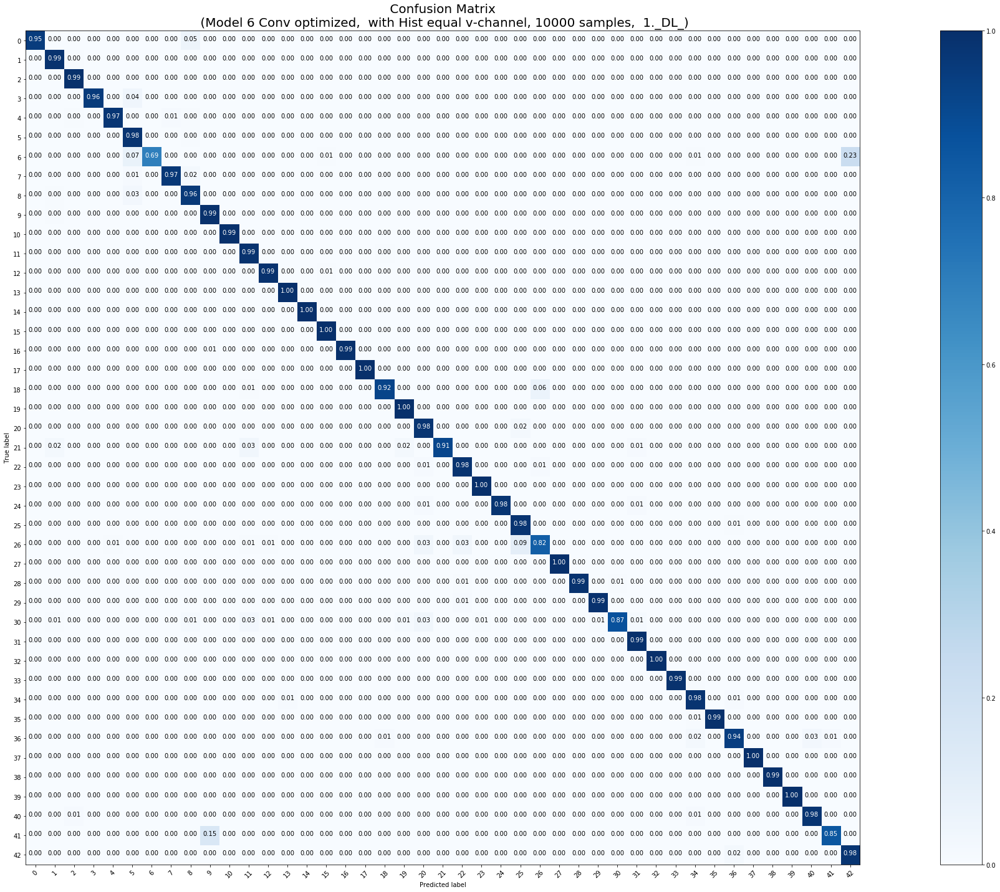

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 10s 1ms/step - loss: 2.8081 - acc: 0.2689 - val_loss: 1.1195 - val_acc: 0.6800
Epoch 2/300
9000/9000 [==============================] - 4s 457us/step - loss: 1.2779 - acc: 0.5967 - val_loss: 0.5865 - val_acc: 0.8340
Epoch 3/300
9000/9000 [==============================] - 4s 452us/step - loss: 0.7543 - acc: 0.7459 - val_loss: 0.3824 - val_acc: 0.8990
Epoch 4/300
9000/9000 [==============================] - 4s 455us/step - loss: 0.5030 - acc: 0.8297 - val_loss: 0.2667 - val_acc: 0.9370
Epoch 5/300
9000/9000 [==============================] - 4s 451us/step - loss: 0.3503 - acc: 0.8834 - val_loss: 0.2002 - val_acc: 0.9540
Epoch 6/300
9000/9000 [==============================] - 4s 450us/step - loss: 0.2608 - acc: 0.9114 - val_loss: 0.1569 - val_

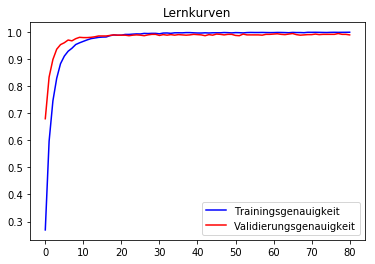

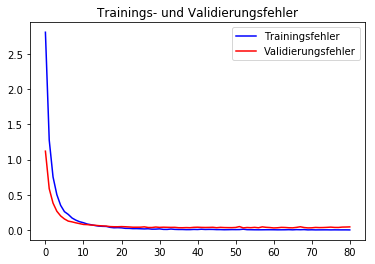

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        60
           1       0.98      0.98      0.98       720
           2       0.99      0.99      0.99       750
           3       0.98      0.95      0.97       450
           4       1.00      0.98      0.99       660
           5       0.92      0.99      0.95       630
           6       1.00      0.67      0.80       150
           7       0.99      0.96      0.97       450
           8       0.97      0.96      0.97       450
           9       0.98      0.99      0.99       480
          10       1.00      0.98      0.99       660
          11       0.96      0.97      0.97       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.99      1.00      0.99       210
          16       0.99      0.99      0.99       

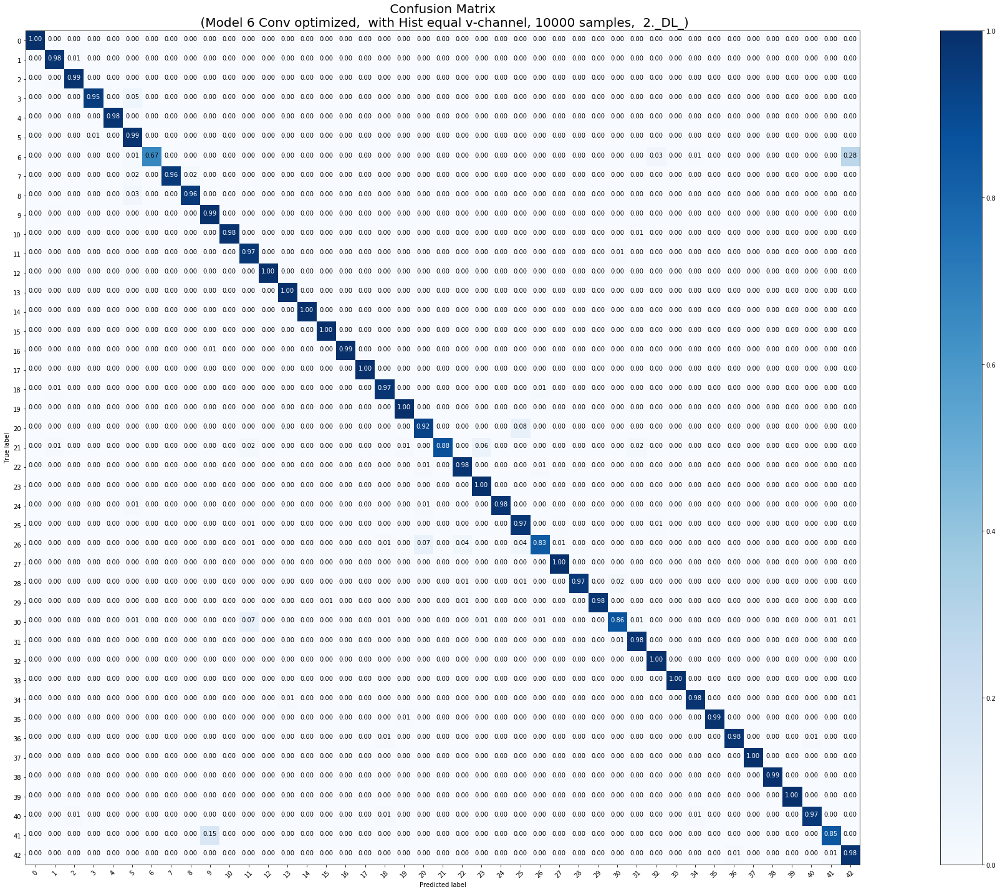

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 10s 1ms/step - loss: 2.8140 - acc: 0.2643 - val_loss: 1.1872 - val_acc: 0.6520
Epoch 2/300
9000/9000 [==============================] - 4s 448us/step - loss: 1.1928 - acc: 0.6108 - val_loss: 0.5481 - val_acc: 0.8520
Epoch 3/300
9000/9000 [==============================] - 4s 450us/step - loss: 0.6963 - acc: 0.7627 - val_loss: 0.3760 - val_acc: 0.8980
Epoch 4/300
9000/9000 [==============================] - 4s 469us/step - loss: 0.4943 - acc: 0.8414 - val_loss: 0.2989 - val_acc: 0.9150
Epoch 5/300
9000/9000 [==============================] - 4s 459us/step - loss: 0.3497 - acc: 0.8788 - val_loss: 0.1976 - val_acc: 0.9490
Epoch 6/300
9000/9000 [==============================] - 4s 454us/step - loss: 0.2628 - acc: 0.9106 - val_loss: 0.1685 - val_

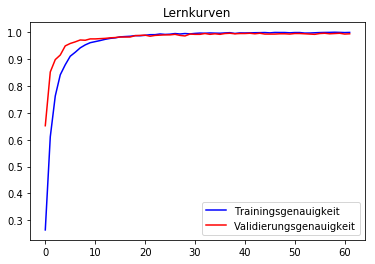

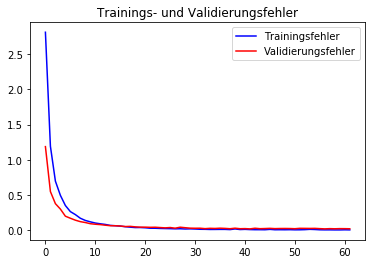

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.90      0.94        60
           1       0.99      0.98      0.98       720
           2       0.98      0.99      0.98       750
           3       0.98      0.98      0.98       450
           4       1.00      0.98      0.99       660
           5       0.92      0.99      0.95       630
           6       0.98      0.63      0.77       150
           7       0.98      0.96      0.97       450
           8       0.94      0.98      0.96       450
           9       0.98      0.99      0.98       480
          10       0.99      0.99      0.99       660
          11       0.99      0.98      0.98       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.99      1.00      1.00       210
          16       1.00      0.99      0.99       

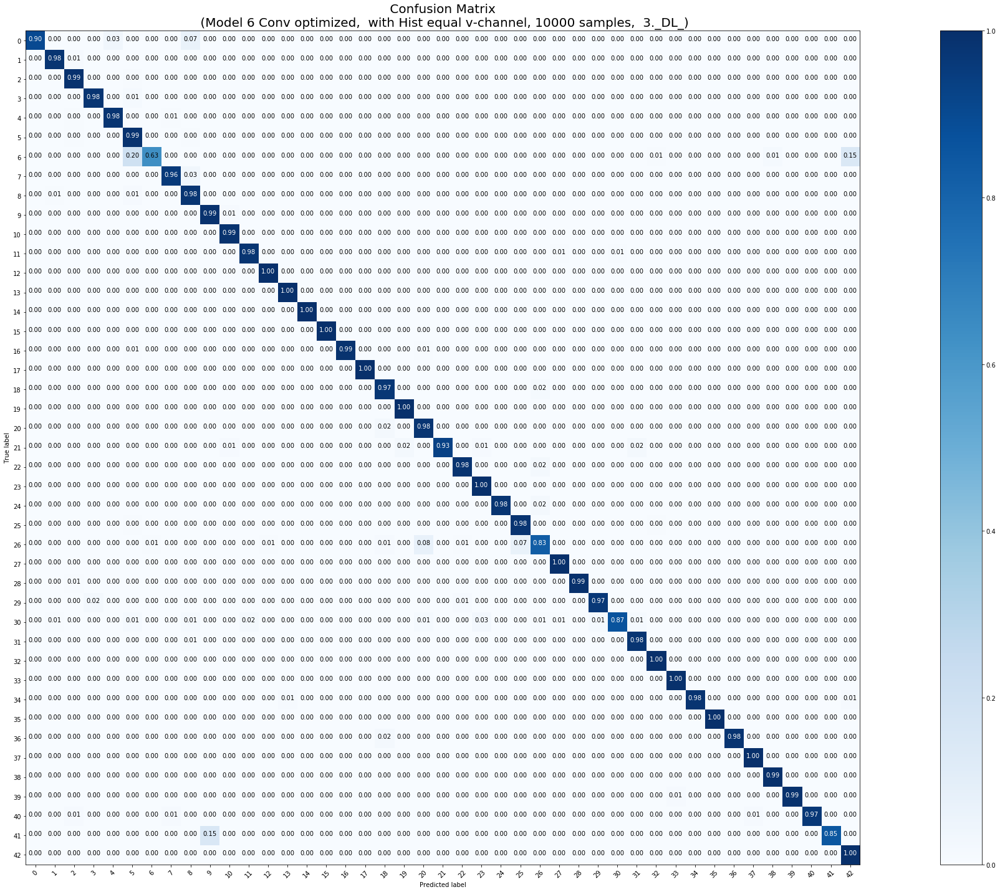

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 11s 1ms/step - loss: 2.9123 - acc: 0.2443 - val_loss: 1.2442 - val_acc: 0.6240
Epoch 2/300
9000/9000 [==============================] - 4s 467us/step - loss: 1.3467 - acc: 0.5761 - val_loss: 0.6515 - val_acc: 0.8160
Epoch 3/300
9000/9000 [==============================] - 4s 475us/step - loss: 0.8049 - acc: 0.7282 - val_loss: 0.3770 - val_acc: 0.9010
Epoch 4/300
9000/9000 [==============================] - 4s 468us/step - loss: 0.5479 - acc: 0.8113 - val_loss: 0.2742 - val_acc: 0.9270
Epoch 5/300
9000/9000 [==============================] - 4s 471us/step - loss: 0.3954 - acc: 0.8613 - val_loss: 0.1948 - val_acc: 0.9550
Epoch 6/300
9000/9000 [==============================] - 4s 462us/step - loss: 0.2929 - acc: 0.8946 - val_loss: 0.1506 - val_

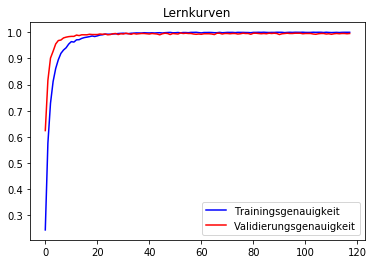

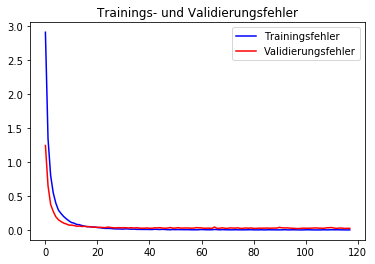

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        60
           1       0.98      0.98      0.98       720
           2       0.99      0.99      0.99       750
           3       0.99      0.97      0.98       450
           4       1.00      0.99      0.99       660
           5       0.95      0.99      0.97       630
           6       1.00      0.71      0.83       150
           7       0.99      0.96      0.98       450
           8       0.98      0.98      0.98       450
           9       0.97      1.00      0.99       480
          10       0.99      0.99      0.99       660
          11       0.96      0.97      0.96       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       1.00      1.00      1.00       210
          16       0.99      0.98      0.99       

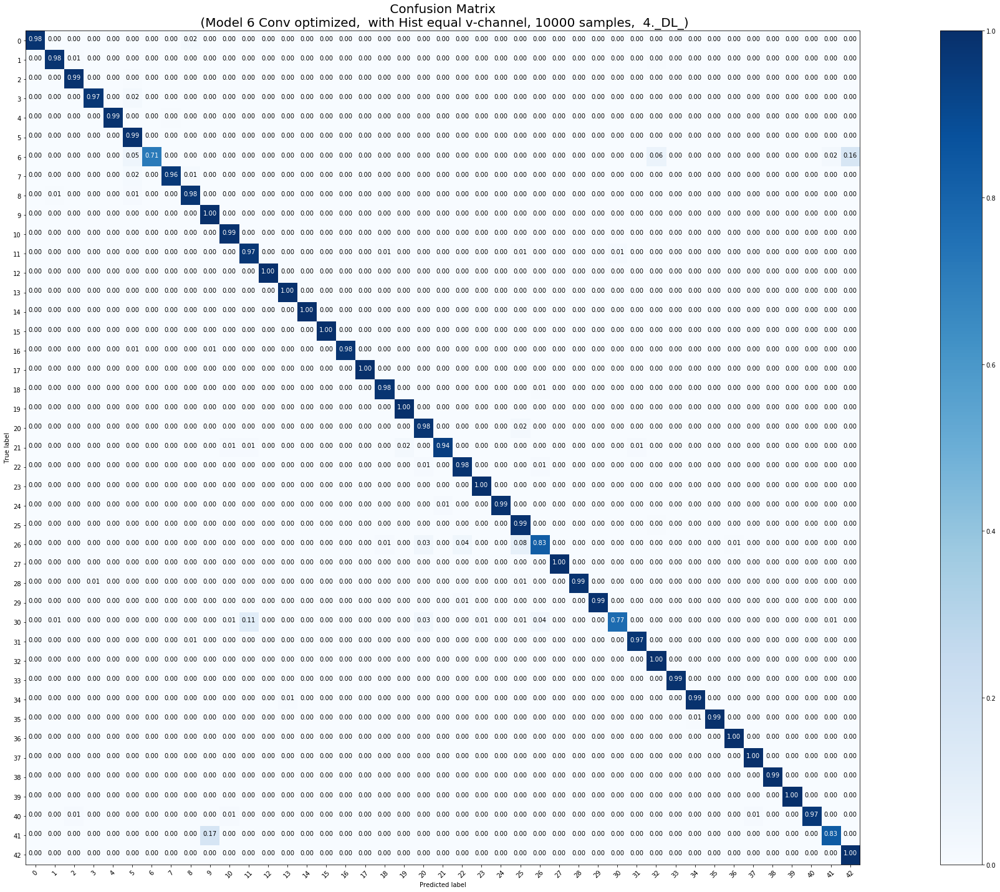

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 11s 1ms/step - loss: 2.8160 - acc: 0.2564 - val_loss: 1.1486 - val_acc: 0.6810
Epoch 2/300
9000/9000 [==============================] - 4s 447us/step - loss: 1.3007 - acc: 0.5932 - val_loss: 0.6877 - val_acc: 0.8120
Epoch 3/300
9000/9000 [==============================] - 4s 446us/step - loss: 0.7869 - acc: 0.7389 - val_loss: 0.3957 - val_acc: 0.8860
Epoch 4/300
9000/9000 [==============================] - 4s 448us/step - loss: 0.5331 - acc: 0.8191 - val_loss: 0.2763 - val_acc: 0.9190
Epoch 5/300
9000/9000 [==============================] - 4s 450us/step - loss: 0.3932 - acc: 0.8628 - val_loss: 0.2370 - val_acc: 0.9230
Epoch 6/300
9000/9000 [==============================] - 4s 452us/step - loss: 0.3014 - acc: 0.8961 - val_loss: 0.1786 - val_

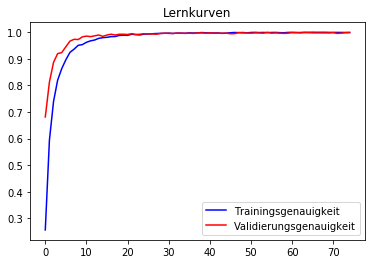

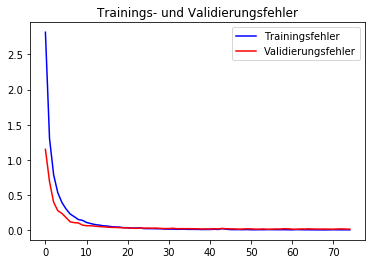

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        60
           1       0.98      0.98      0.98       720
           2       0.99      1.00      0.99       750
           3       0.97      0.97      0.97       450
           4       0.99      0.98      0.99       660
           5       0.93      0.97      0.95       630
           6       0.99      0.69      0.81       150
           7       0.99      0.96      0.97       450
           8       0.96      0.96      0.96       450
           9       0.98      1.00      0.99       480
          10       0.99      0.99      0.99       660
          11       0.94      0.97      0.96       420
          12       1.00      0.98      0.99       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.90      1.00      0.95       210
          16       1.00      0.99      1.00       

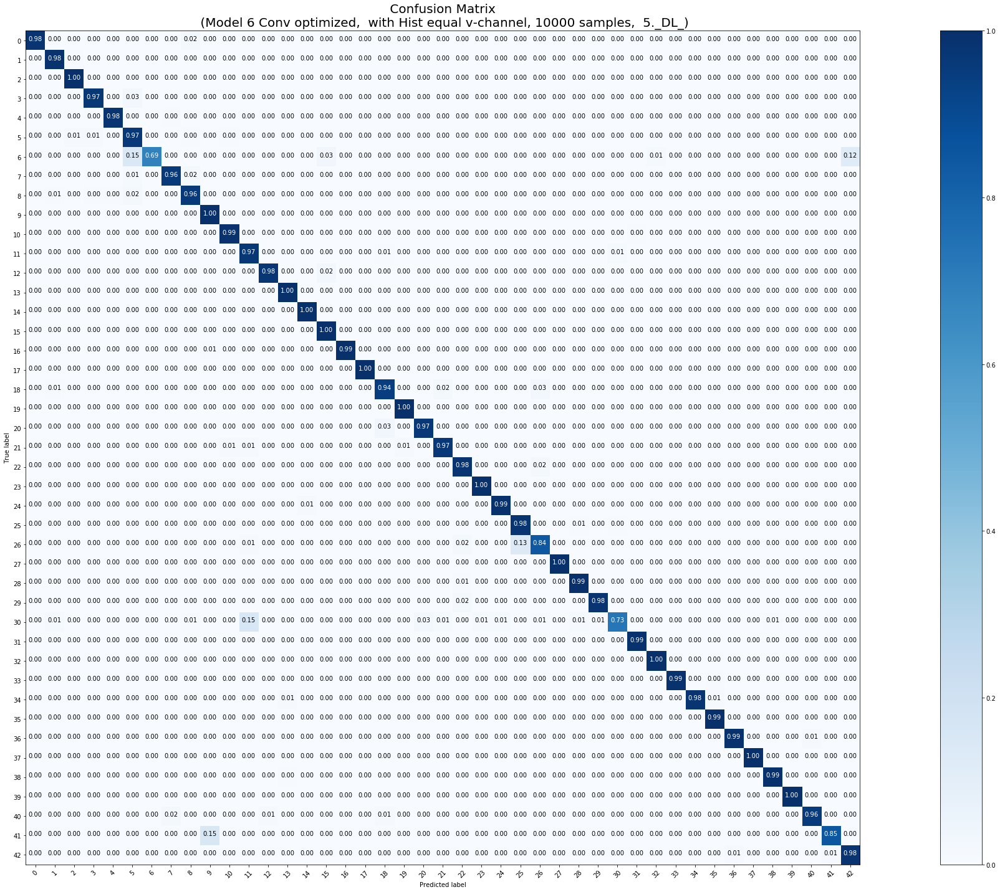

Die durchschnittliche Epochenanzahl beträgt:  65.0


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 10000   
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout    
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_10000, y_tr_10000, X_test, y_test, 0.3, 0.0001, False, 300, 10000)

In [0]:
downloader(1,5, 10000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 15s 52ms/step - loss: 3.4074 - acc: 0.1618 - val_loss: 1.6512 - val_acc: 0.5140
Epoch 2/300
282/282 [==============================] - 7s 25ms/step - loss: 2.2358 - acc: 0.3609 - val_loss: 1.0564 - val_acc: 0.6800
Epoch 3/300
282/282 [==============================] - 7s 26ms/step - loss: 1.6920 - acc: 0.4812 - val_loss: 0.7779 - val_acc: 0.7480
Epoch 4/300
282/282 [==============================] - 7s 26ms/step - loss: 1.3630 - acc: 0.5532 - val_loss: 0.5554 - val_acc: 0.8420
Epoch 5/300
282/282 [==============================] - 7s 26ms/step - loss: 1.1345 - acc: 0.6202 - val_loss: 0.4850 - val_acc: 0.8530
Epoch 6/300
282/282 [==============================] - 7s 26ms/step - loss: 0.9971 - acc: 0.6524 - val_loss: 0.3250 - val_acc: 0.9120
Epoch 7/300
282/282 [==============================]

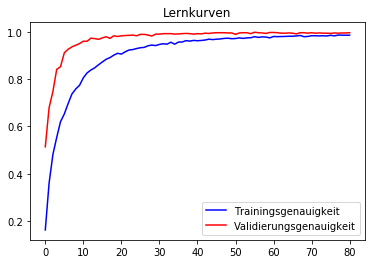

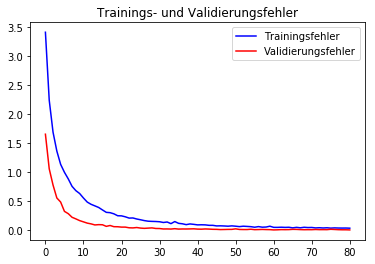

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        60
           1       0.98      0.99      0.99       720
           2       0.97      0.99      0.98       750
           3       0.99      0.97      0.98       450
           4       1.00      0.99      0.99       660
           5       0.97      0.97      0.97       630
           6       0.99      0.86      0.92       150
           7       0.98      0.99      0.98       450
           8       0.97      0.98      0.98       450
           9       1.00      0.96      0.98       480
          10       1.00      0.99      1.00       660
          11       0.98      0.96      0.97       420
          12       1.00      0.99      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.99      1.00      1.00       210
          16       0.97      0.99      0.98       

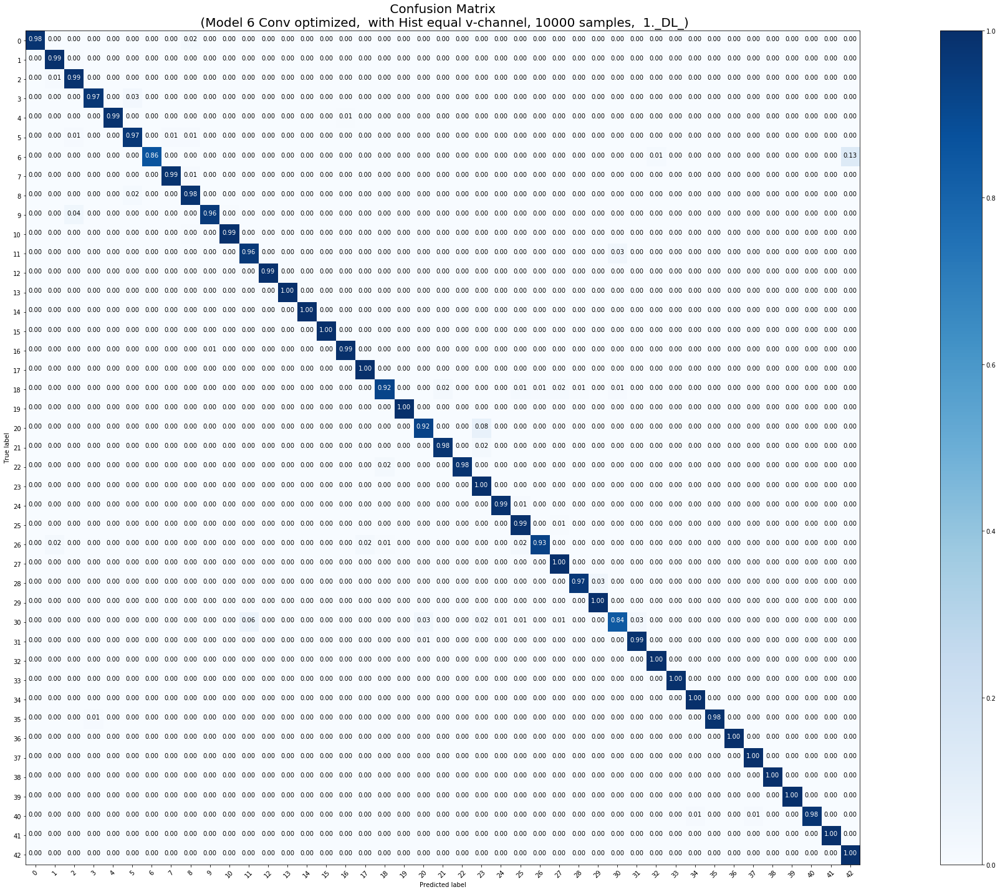

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 15s 54ms/step - loss: 3.3705 - acc: 0.1642 - val_loss: 1.5826 - val_acc: 0.5380
Epoch 2/300
282/282 [==============================] - 7s 25ms/step - loss: 2.1927 - acc: 0.3650 - val_loss: 1.0812 - val_acc: 0.6450
Epoch 3/300
282/282 [==============================] - 7s 26ms/step - loss: 1.6731 - acc: 0.4690 - val_loss: 0.8010 - val_acc: 0.7320
Epoch 4/300
282/282 [==============================] - 7s 25ms/step - loss: 1.3775 - acc: 0.5524 - val_loss: 0.6670 - val_acc: 0.7970
Epoch 5/300
282/282 [==============================] - 8s 27ms/step - loss: 1.1494 - acc: 0.6160 - val_loss: 0.5237 - val_acc: 0.8520
Epoch 6/300
282/282 [==============================] - 7s 26ms/step - loss: 1.0107 - acc: 0.6538 - val_loss: 0.3814 - val_acc: 0.8960
Epoch 7/300
282/282 [==============================]

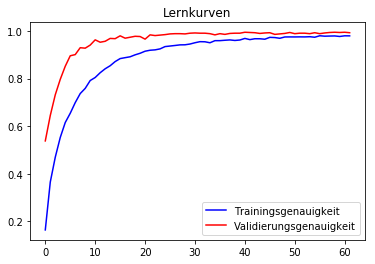

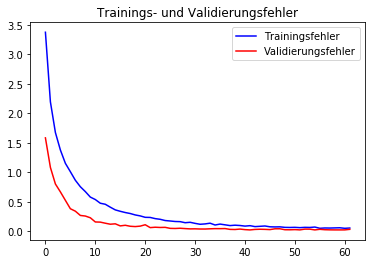

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        60
           1       1.00      0.98      0.99       720
           2       0.99      0.99      0.99       750
           3       0.97      0.95      0.96       450
           4       0.99      0.99      0.99       660
           5       0.93      0.99      0.96       630
           6       1.00      0.86      0.92       150
           7       1.00      0.98      0.99       450
           8       0.97      0.94      0.96       450
           9       1.00      0.99      1.00       480
          10       0.99      0.99      0.99       660
          11       0.99      0.90      0.95       420
          12       1.00      0.98      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.93      1.00      0.96       210
          16       0.96      0.99      0.98       

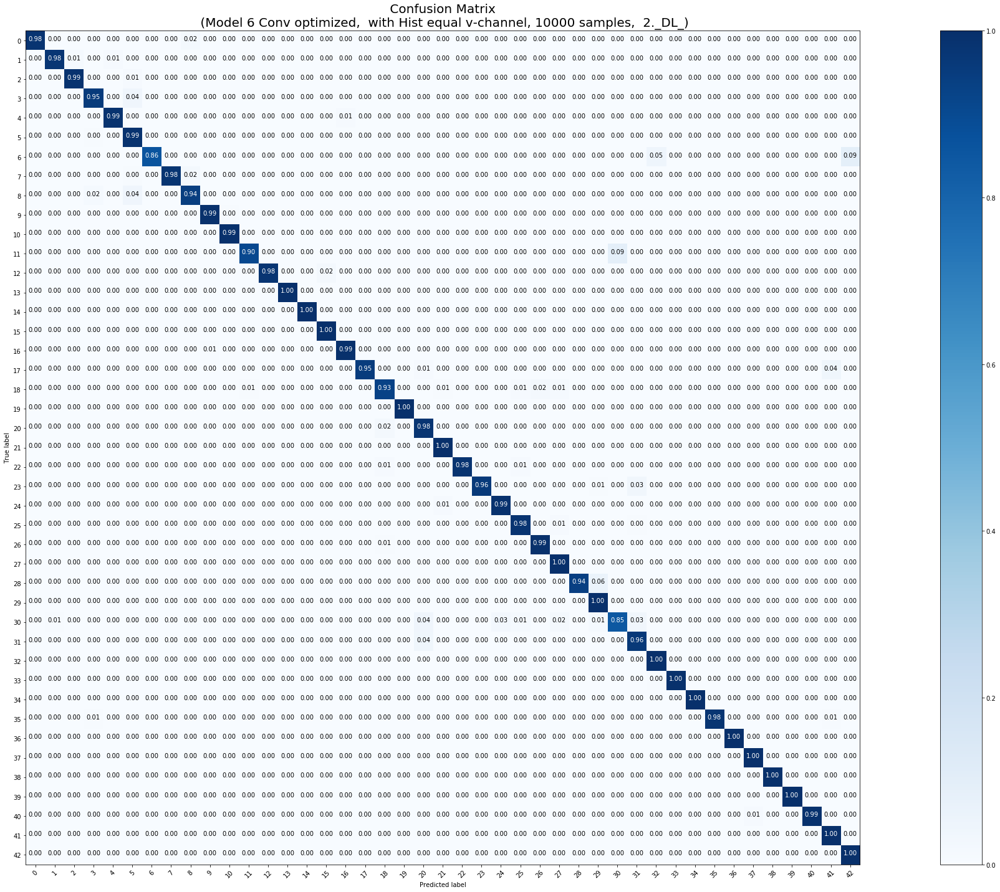

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 15s 55ms/step - loss: 3.3564 - acc: 0.1591 - val_loss: 1.7985 - val_acc: 0.4580
Epoch 2/300
282/282 [==============================] - 7s 26ms/step - loss: 2.2102 - acc: 0.3595 - val_loss: 1.0403 - val_acc: 0.6910
Epoch 3/300
282/282 [==============================] - 7s 26ms/step - loss: 1.7209 - acc: 0.4783 - val_loss: 0.7597 - val_acc: 0.7690
Epoch 4/300
282/282 [==============================] - 8s 27ms/step - loss: 1.3880 - acc: 0.5532 - val_loss: 0.5934 - val_acc: 0.8180
Epoch 5/300
282/282 [==============================] - 7s 25ms/step - loss: 1.1870 - acc: 0.6095 - val_loss: 0.4478 - val_acc: 0.8800
Epoch 6/300
282/282 [==============================] - 7s 25ms/step - loss: 0.9886 - acc: 0.6611 - val_loss: 0.3615 - val_acc: 0.9030
Epoch 7/300
282/282 [==============================]

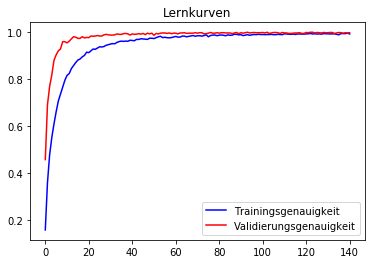

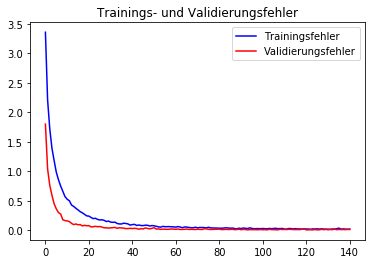

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       1.00      0.99      1.00       720
           2       0.99      1.00      1.00       750
           3       0.99      0.98      0.99       450
           4       0.99      1.00      0.99       660
           5       0.97      0.99      0.98       630
           6       1.00      0.89      0.94       150
           7       1.00      0.99      0.99       450
           8       0.98      0.96      0.97       450
           9       1.00      1.00      1.00       480
          10       1.00      0.99      1.00       660
          11       0.99      0.99      0.99       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.88      1.00      0.94       210
          16       1.00      0.99      1.00       

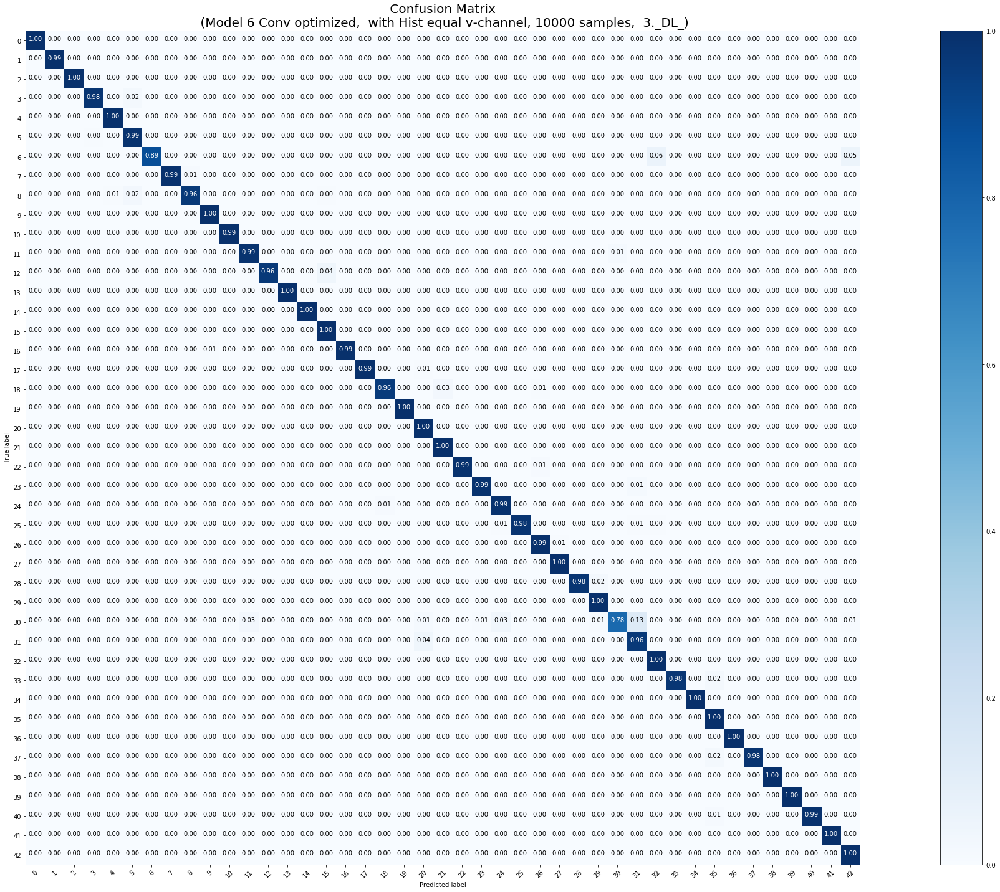

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 16s 55ms/step - loss: 3.4264 - acc: 0.1524 - val_loss: 1.6576 - val_acc: 0.5090
Epoch 2/300
282/282 [==============================] - 7s 24ms/step - loss: 2.2919 - acc: 0.3467 - val_loss: 1.1828 - val_acc: 0.6270
Epoch 3/300
282/282 [==============================] - 7s 25ms/step - loss: 1.7774 - acc: 0.4611 - val_loss: 0.8277 - val_acc: 0.7520
Epoch 4/300
282/282 [==============================] - 7s 26ms/step - loss: 1.4455 - acc: 0.5349 - val_loss: 0.6381 - val_acc: 0.8190
Epoch 5/300
282/282 [==============================] - 7s 26ms/step - loss: 1.1949 - acc: 0.5997 - val_loss: 0.4900 - val_acc: 0.8590
Epoch 6/300
282/282 [==============================] - 7s 25ms/step - loss: 1.0261 - acc: 0.6499 - val_loss: 0.4577 - val_acc: 0.8630
Epoch 7/300
282/282 [==============================]

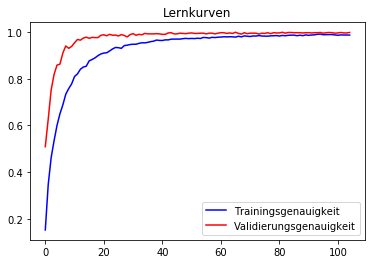

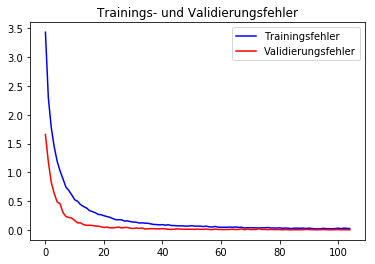

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      0.99      0.99       720
           2       0.99      0.99      0.99       750
           3       1.00      0.94      0.97       450
           4       1.00      0.99      1.00       660
           5       0.95      0.99      0.97       630
           6       0.99      0.75      0.86       150
           7       0.99      0.99      0.99       450
           8       0.98      0.99      0.99       450
           9       1.00      1.00      1.00       480
          10       0.99      1.00      1.00       660
          11       0.98      0.98      0.98       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       1.00      0.99      1.00       

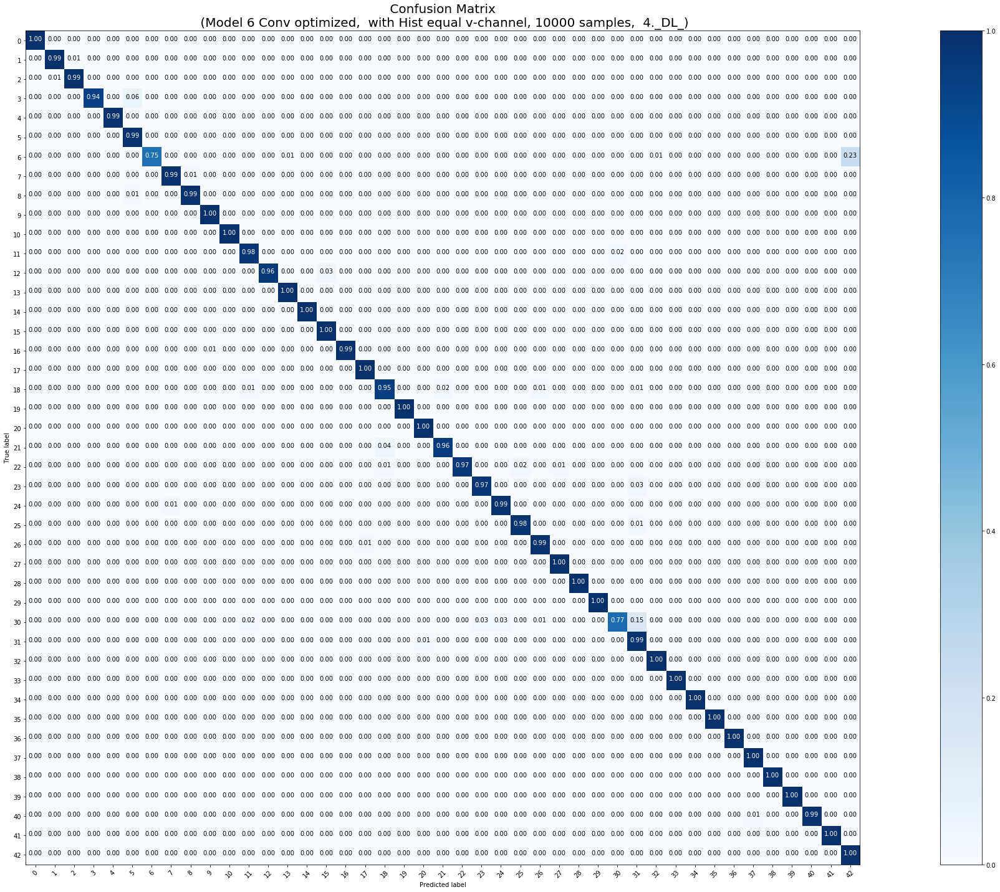

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 16s 58ms/step - loss: 3.5356 - acc: 0.1399 - val_loss: 1.8565 - val_acc: 0.4920
Epoch 2/300
282/282 [==============================] - 7s 25ms/step - loss: 2.3187 - acc: 0.3390 - val_loss: 1.2314 - val_acc: 0.6170
Epoch 3/300
282/282 [==============================] - 7s 26ms/step - loss: 1.7951 - acc: 0.4548 - val_loss: 0.9132 - val_acc: 0.7160
Epoch 4/300
282/282 [==============================] - 7s 25ms/step - loss: 1.4014 - acc: 0.5511 - val_loss: 0.6386 - val_acc: 0.7880
Epoch 5/300
282/282 [==============================] - 7s 25ms/step - loss: 1.1812 - acc: 0.6073 - val_loss: 0.4388 - val_acc: 0.8700
Epoch 6/300
282/282 [==============================] - 7s 25ms/step - loss: 0.9618 - acc: 0.6811 - val_loss: 0.3901 - val_acc: 0.8800
Epoch 7/300
282/282 [==============================]

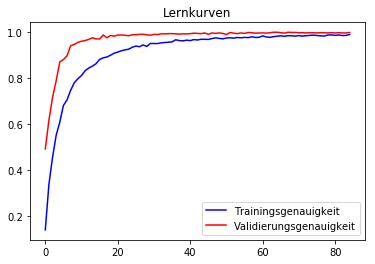

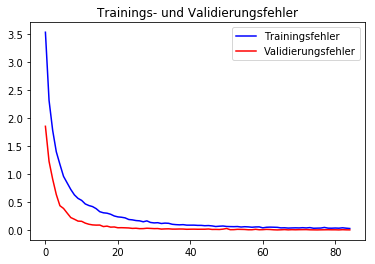

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        60
           1       0.99      1.00      1.00       720
           2       1.00      1.00      1.00       750
           3       0.99      0.98      0.99       450
           4       1.00      0.99      0.99       660
           5       0.99      0.99      0.99       630
           6       1.00      0.81      0.89       150
           7       0.99      1.00      1.00       450
           8       0.98      0.99      0.99       450
           9       1.00      1.00      1.00       480
          10       1.00      1.00      1.00       660
          11       1.00      0.98      0.99       420
          12       1.00      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.97      1.00      0.99       210
          16       0.99      0.99      0.99       

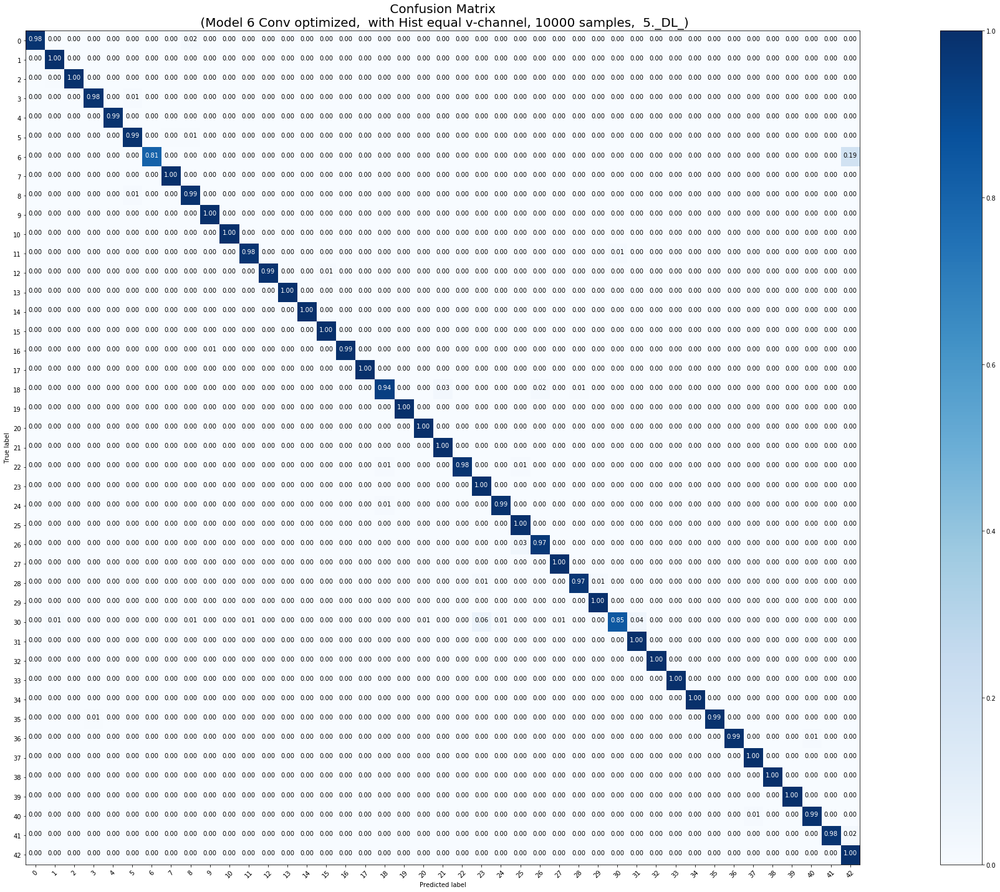

Die durchschnittliche Epochenanzahl beträgt:  74.8


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 10000    
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_10000, y_tr_10000, X_test, y_test, 0.3, 0.0001, False, 300, 10000)

In [0]:
downloader(1,5, 10000)

In [0]:
###########################################################################################################
###########################################################################################################
#########   Wiederholtes Training mit optimierten Hyperparametern unter Verwendung von
#########   EarlyStopping und class-weights=balanced,  
#########   2. Aufteilung der Trainingsdaten,    
###########################################################################################################
########################################################################################################### 
X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200 = make_training_subsets_B(X_train, y_train)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 11s 6ms/step - loss: 3.7911 - acc: 0.1017 - val_loss: 2.3809 - val_acc: 0.3600
Epoch 2/300
1800/1800 [==============================] - 1s 485us/step - loss: 2.5800 - acc: 0.2739 - val_loss: 1.8363 - val_acc: 0.4800
Epoch 3/300
1800/1800 [==============================] - 1s 507us/step - loss: 1.9885 - acc: 0.4106 - val_loss: 1.3202 - val_acc: 0.6450
Epoch 4/300
1800/1800 [==============================] - 1s 500us/step - loss: 1.5189 - acc: 0.5156 - val_loss: 1.0656 - val_acc: 0.6900
Epoch 5/300
1800/1800 [==============================] - 1s 482us/step - loss: 1.1619 - acc: 0.6178 - val_loss: 0.8602 - val_acc: 0.7600
Epoch 6/300
1800/1800 [==============================] - 1s 487us/step - loss: 0.9882 - acc: 0.6733 - val_loss: 0.7623 - val_a

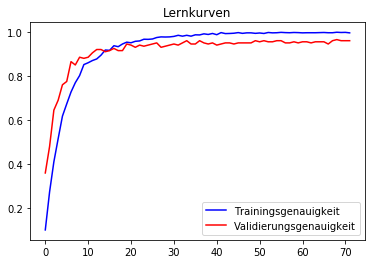

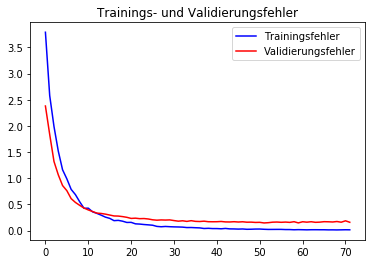

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.85      0.91        60
           1       0.98      0.94      0.96       720
           2       0.94      0.97      0.96       750
           3       0.95      0.96      0.96       450
           4       0.97      0.96      0.96       660
           5       0.90      0.93      0.91       630
           6       0.94      0.63      0.76       150
           7       0.92      0.93      0.93       450
           8       0.92      0.96      0.94       450
           9       0.96      0.99      0.98       480
          10       0.98      0.95      0.97       660
          11       0.88      0.81      0.84       420
          12       0.99      0.98      0.99       690
          13       1.00      0.99      1.00       720
          14       1.00      1.00      1.00       270
          15       0.92      0.99      0.95       210
          16       1.00      0.92      0.96       

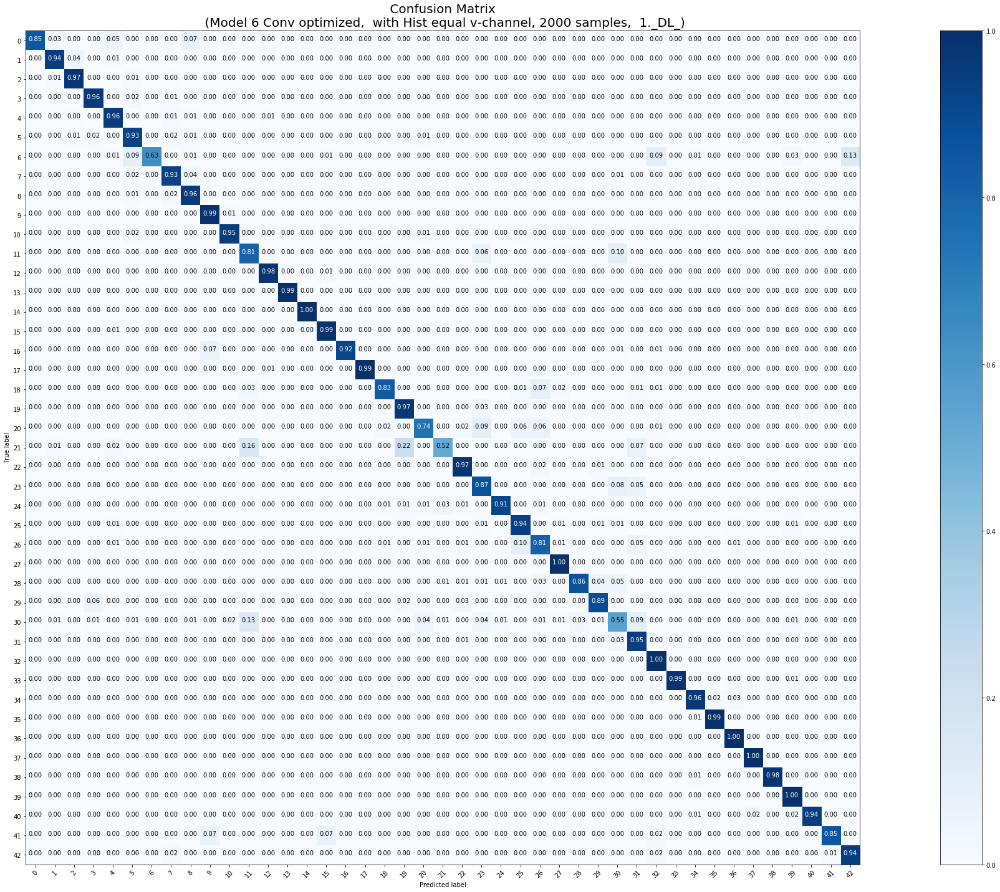

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 11s 6ms/step - loss: 3.7755 - acc: 0.1094 - val_loss: 2.2220 - val_acc: 0.4150
Epoch 2/300
1800/1800 [==============================] - 1s 512us/step - loss: 2.4615 - acc: 0.2883 - val_loss: 1.6271 - val_acc: 0.5450
Epoch 3/300
1800/1800 [==============================] - 1s 502us/step - loss: 1.9309 - acc: 0.4283 - val_loss: 1.3464 - val_acc: 0.6100
Epoch 4/300
1800/1800 [==============================] - 1s 497us/step - loss: 1.4548 - acc: 0.5328 - val_loss: 1.0656 - val_acc: 0.6800
Epoch 5/300
1800/1800 [==============================] - 1s 506us/step - loss: 1.1570 - acc: 0.6261 - val_loss: 0.8448 - val_acc: 0.7550
Epoch 6/300
1800/1800 [==============================] - 1s 493us/step - loss: 0.8901 - acc: 0.6917 - val_loss: 0.7628 - val_a

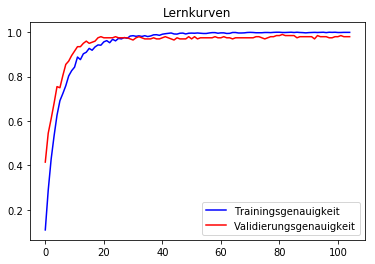

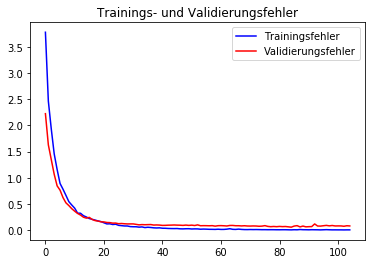

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.82      0.89        60
           1       0.98      0.95      0.96       720
           2       0.96      0.98      0.97       750
           3       0.94      0.97      0.95       450
           4       0.96      0.97      0.97       660
           5       0.87      0.94      0.90       630
           6       0.99      0.61      0.75       150
           7       0.96      0.94      0.95       450
           8       0.93      0.92      0.92       450
           9       0.97      0.99      0.98       480
          10       0.97      0.96      0.96       660
          11       0.91      0.86      0.89       420
          12       1.00      0.98      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      0.99      1.00       270
          15       0.92      0.98      0.95       210
          16       0.99      0.95      0.97       

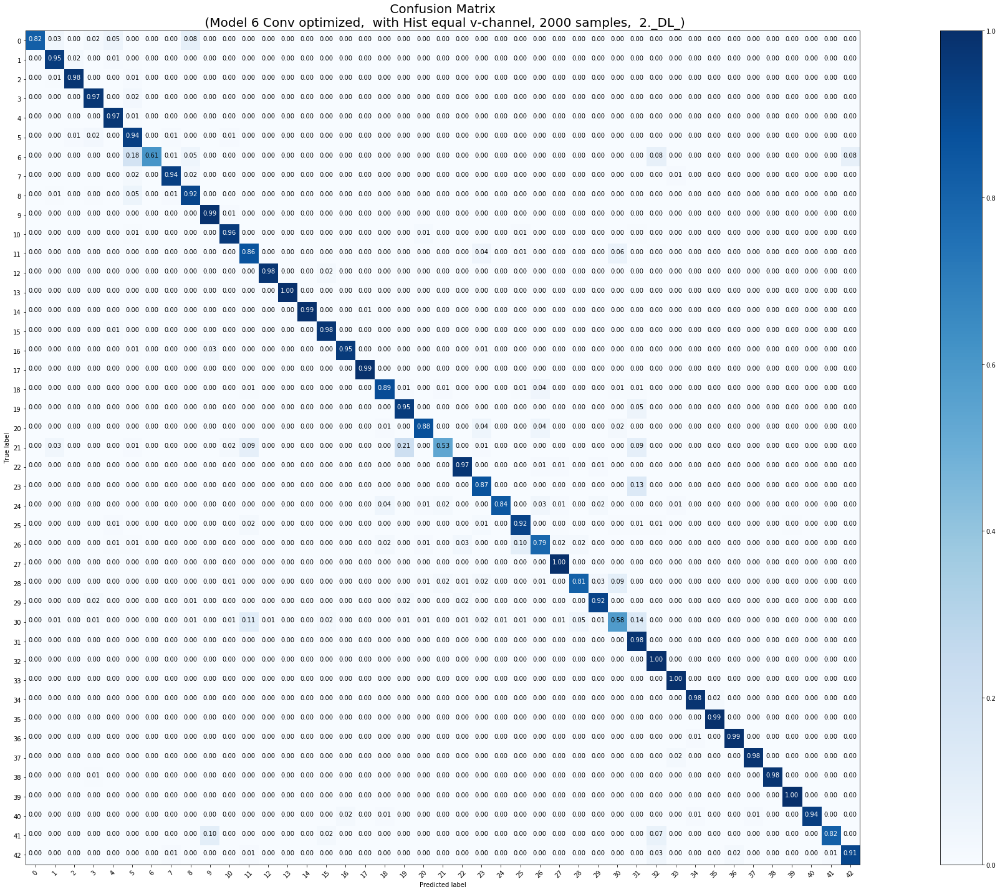

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 11s 6ms/step - loss: 3.7227 - acc: 0.1078 - val_loss: 2.2642 - val_acc: 0.4050
Epoch 2/300
1800/1800 [==============================] - 1s 491us/step - loss: 2.4499 - acc: 0.3061 - val_loss: 1.6510 - val_acc: 0.5250
Epoch 3/300
1800/1800 [==============================] - 1s 494us/step - loss: 1.8383 - acc: 0.4411 - val_loss: 1.2663 - val_acc: 0.6400
Epoch 4/300
1800/1800 [==============================] - 1s 486us/step - loss: 1.4755 - acc: 0.5194 - val_loss: 1.0145 - val_acc: 0.7400
Epoch 5/300
1800/1800 [==============================] - 1s 481us/step - loss: 1.1661 - acc: 0.6161 - val_loss: 0.8669 - val_acc: 0.7600
Epoch 6/300
1800/1800 [==============================] - 1s 479us/step - loss: 0.9993 - acc: 0.6650 - val_loss: 0.7111 - val_a

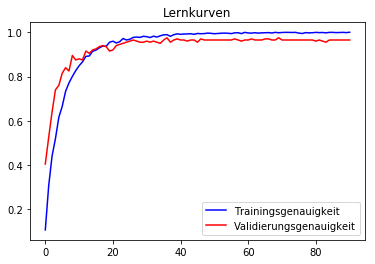

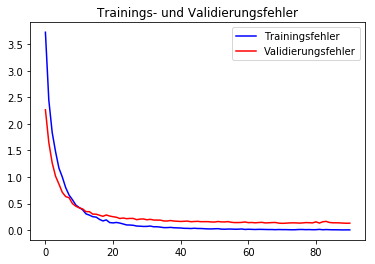

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.96      0.82      0.88        60
           1       0.94      0.95      0.95       720
           2       0.97      0.96      0.97       750
           3       0.94      0.97      0.95       450
           4       0.96      0.96      0.96       660
           5       0.87      0.94      0.90       630
           6       0.99      0.63      0.77       150
           7       0.93      0.92      0.93       450
           8       0.90      0.92      0.91       450
           9       0.96      1.00      0.98       480
          10       0.97      0.97      0.97       660
          11       0.96      0.87      0.92       420
          12       0.99      0.97      0.98       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.90      1.00      0.95       210
          16       0.99      0.95      0.97       

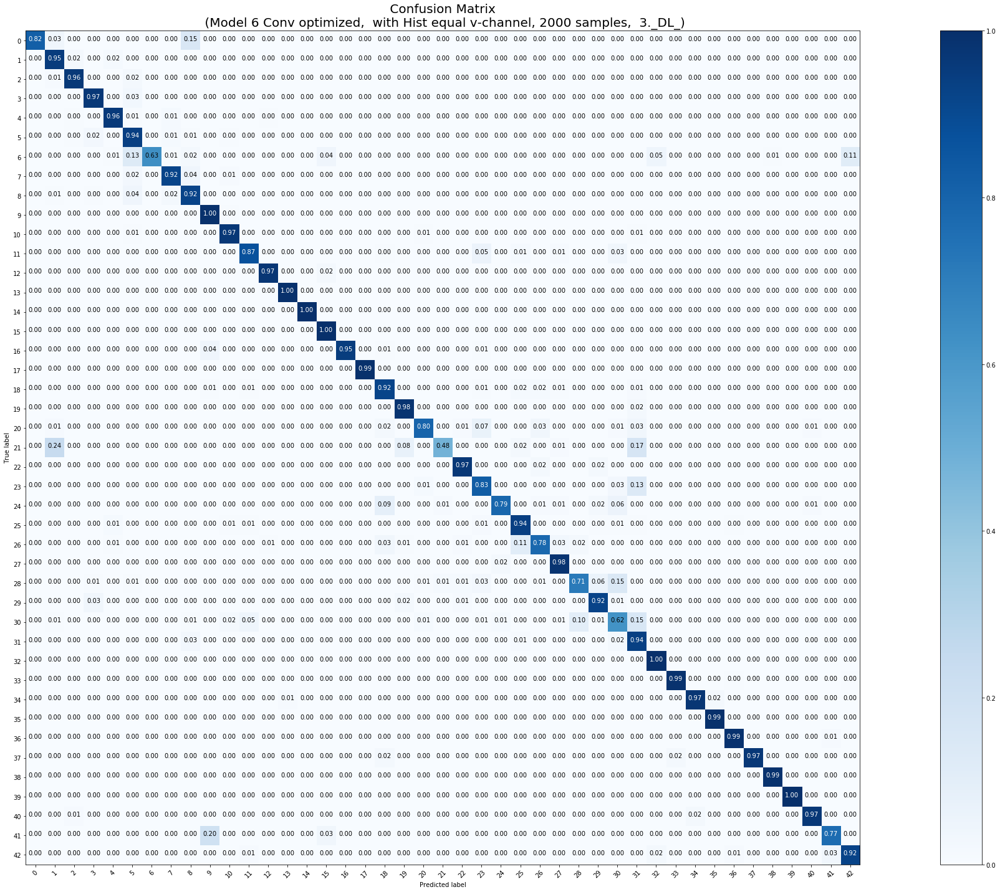

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 12s 6ms/step - loss: 3.9453 - acc: 0.0778 - val_loss: 2.2395 - val_acc: 0.4050
Epoch 2/300
1800/1800 [==============================] - 1s 497us/step - loss: 2.5265 - acc: 0.2844 - val_loss: 1.5724 - val_acc: 0.5600
Epoch 3/300
1800/1800 [==============================] - 1s 489us/step - loss: 1.8359 - acc: 0.4283 - val_loss: 1.1634 - val_acc: 0.6900
Epoch 4/300
1800/1800 [==============================] - 1s 514us/step - loss: 1.4415 - acc: 0.5389 - val_loss: 0.9273 - val_acc: 0.7300
Epoch 5/300
1800/1800 [==============================] - 1s 498us/step - loss: 1.1794 - acc: 0.6211 - val_loss: 0.7904 - val_acc: 0.8000
Epoch 6/300
1800/1800 [==============================] - 1s 482us/step - loss: 0.9404 - acc: 0.6861 - val_loss: 0.6993 - val_a

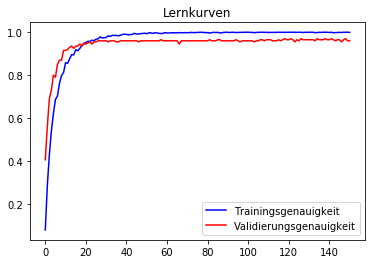

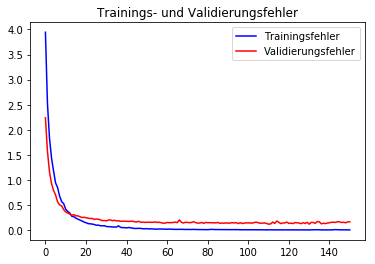

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.95      0.92      0.93        60
           1       0.98      0.97      0.97       720
           2       0.96      0.99      0.97       750
           3       0.98      0.95      0.97       450
           4       0.97      0.97      0.97       660
           5       0.87      0.96      0.91       630
           6       0.97      0.62      0.76       150
           7       0.97      0.92      0.95       450
           8       0.94      0.93      0.94       450
           9       0.92      0.99      0.95       480
          10       0.96      0.97      0.96       660
          11       0.89      0.92      0.90       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      0.99      1.00       270
          15       0.97      1.00      0.98       210
          16       1.00      0.95      0.98       

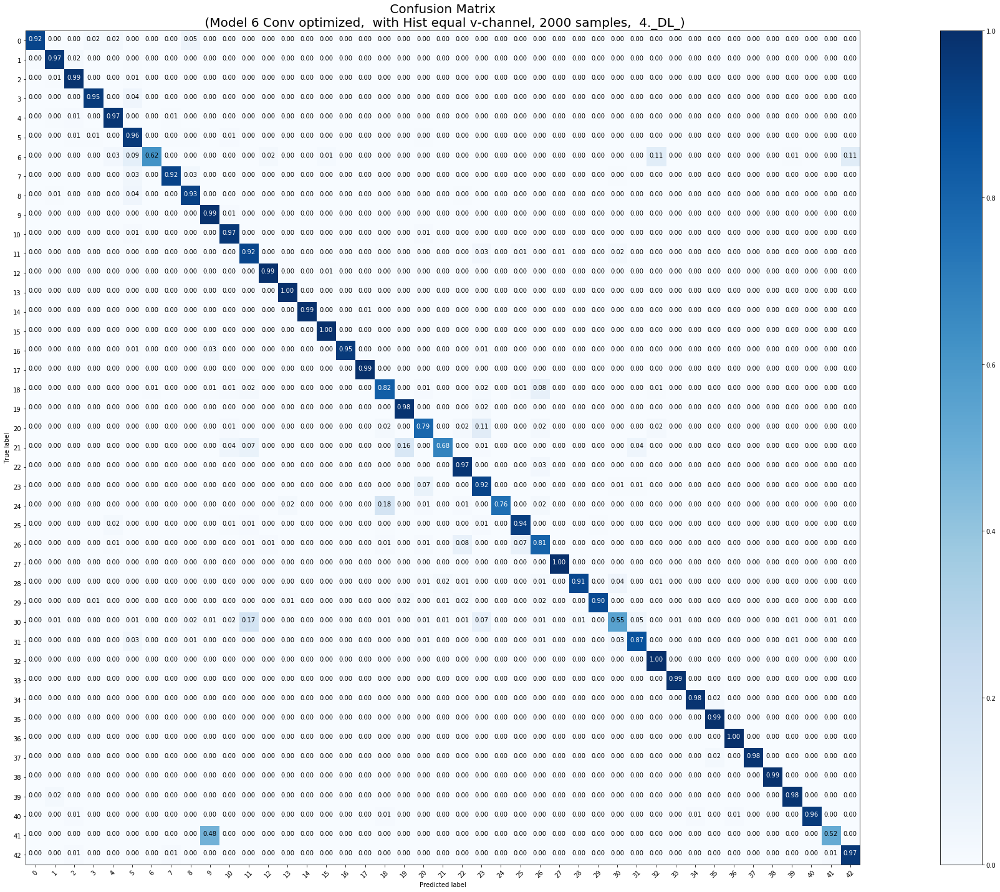

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 12s 7ms/step - loss: 3.8618 - acc: 0.1017 - val_loss: 2.3168 - val_acc: 0.4000
Epoch 2/300
1800/1800 [==============================] - 1s 503us/step - loss: 2.5442 - acc: 0.2861 - val_loss: 1.7182 - val_acc: 0.5600
Epoch 3/300
1800/1800 [==============================] - 1s 484us/step - loss: 1.8643 - acc: 0.4306 - val_loss: 1.2902 - val_acc: 0.6200
Epoch 4/300
1800/1800 [==============================] - 1s 509us/step - loss: 1.4244 - acc: 0.5456 - val_loss: 1.0148 - val_acc: 0.7050
Epoch 5/300
1800/1800 [==============================] - 1s 498us/step - loss: 1.1592 - acc: 0.6217 - val_loss: 0.8368 - val_acc: 0.7600
Epoch 6/300
1800/1800 [==============================] - 1s 492us/step - loss: 0.9079 - acc: 0.6811 - val_loss: 0.7227 - val_a

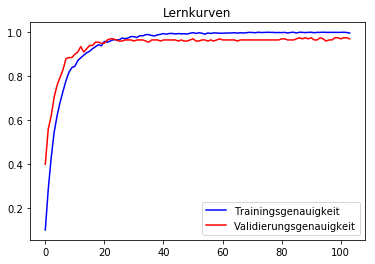

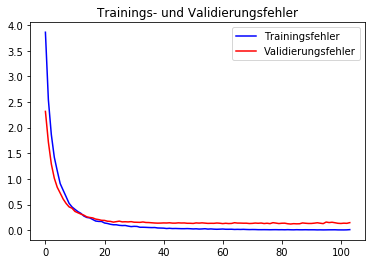

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.94      0.78      0.85        60
           1       0.95      0.95      0.95       720
           2       0.95      0.97      0.96       750
           3       0.94      0.97      0.96       450
           4       0.95      0.96      0.96       660
           5       0.86      0.94      0.90       630
           6       0.98      0.64      0.77       150
           7       0.94      0.96      0.95       450
           8       0.94      0.87      0.90       450
           9       0.97      0.99      0.98       480
          10       0.98      0.97      0.97       660
          11       0.93      0.88      0.91       420
          12       1.00      0.99      0.99       690
          13       0.99      0.99      0.99       720
          14       1.00      1.00      1.00       270
          15       0.97      1.00      0.98       210
          16       1.00      0.93      0.97       

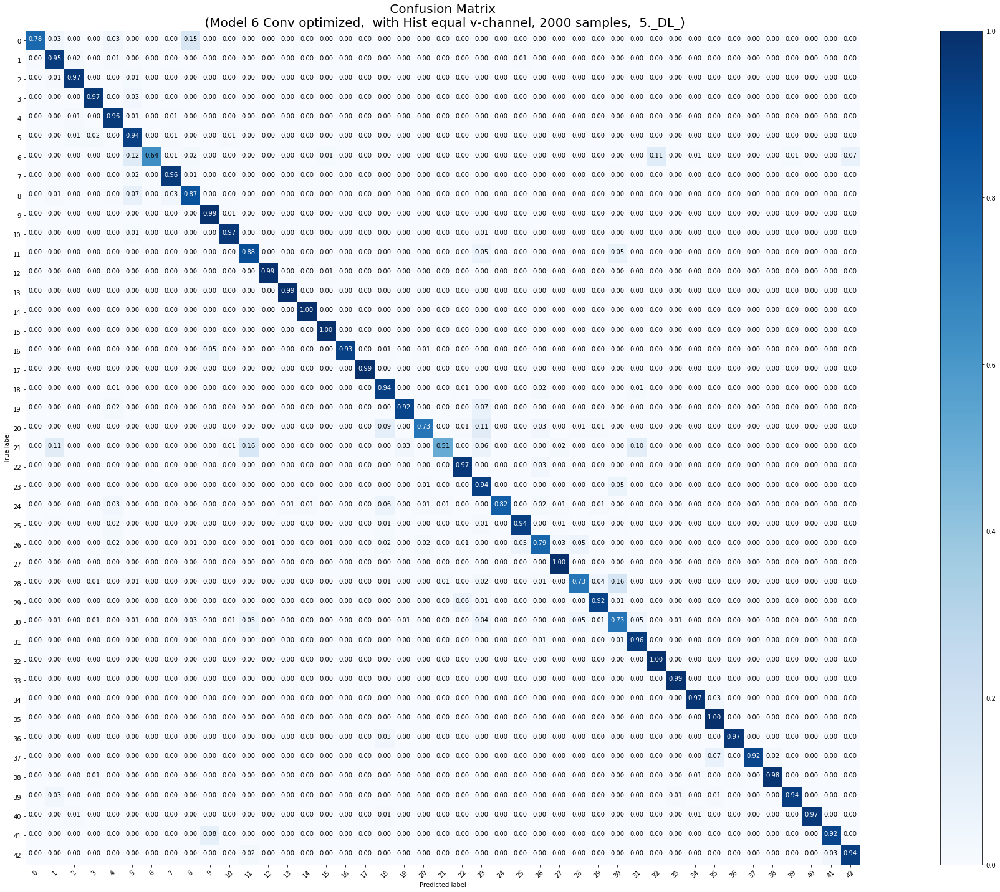

Die durchschnittliche Epochenanzahl beträgt:  84.6


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 2000
# optimierten Parameter: Dropoutrate = 0.2,  Lernrate = 0.0001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_2000, y_tr_2000, X_test, y_test, 0.2, 0.0001, False, 300, 2000)

In [0]:
downloader(1,5,2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 13s 230ms/step - loss: 4.2065 - acc: 0.0581 - val_loss: 2.6390 - val_acc: 0.2750
Epoch 2/300
57/57 [==============================] - 1s 23ms/step - loss: 3.2694 - acc: 0.1590 - val_loss: 2.0516 - val_acc: 0.4050
Epoch 3/300
57/57 [==============================] - 2s 29ms/step - loss: 2.7777 - acc: 0.2330 - val_loss: 1.6736 - val_acc: 0.5300
Epoch 4/300
57/57 [==============================] - 1s 26ms/step - loss: 2.4850 - acc: 0.3038 - val_loss: 1.4390 - val_acc: 0.5550
Epoch 5/300
57/57 [==============================] - 1s 26ms/step - loss: 2.1752 - acc: 0.3388 - val_loss: 1.2677 - val_acc: 0.5850
Epoch 6/300
57/57 [==============================] - 1s 26ms/step - loss: 1.9222 - acc: 0.4057 - val_loss: 1.1044 - val_acc: 0.6650
Epoch 7/300
57/57 [==============================] - 1s 26ms/st

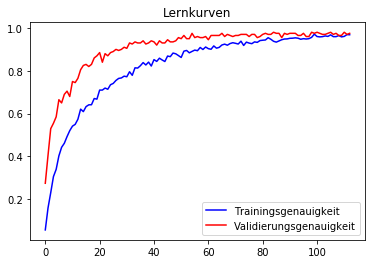

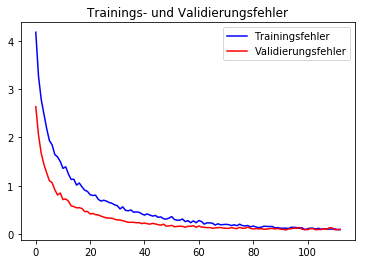

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.87      0.97      0.91        60
           1       0.96      0.96      0.96       720
           2       0.95      0.92      0.94       750
           3       0.94      0.97      0.96       450
           4       0.99      0.98      0.98       660
           5       0.89      0.90      0.90       630
           6       0.99      0.68      0.81       150
           7       0.95      0.96      0.95       450
           8       0.92      0.93      0.93       450
           9       0.99      0.98      0.99       480
          10       0.99      0.98      0.98       660
          11       0.96      0.81      0.88       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.90      1.00      0.95       210
          16       0.97      0.99      0.98       

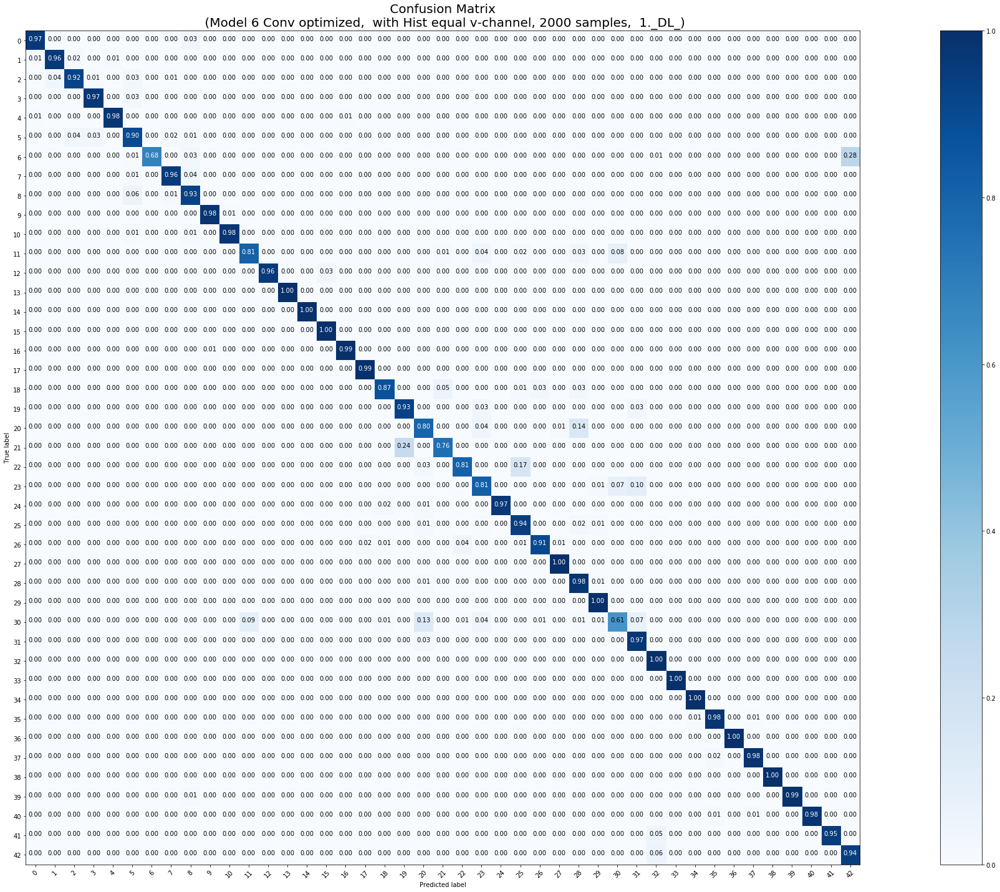

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 13s 233ms/step - loss: 4.2351 - acc: 0.0603 - val_loss: 2.8593 - val_acc: 0.2100
Epoch 2/300
57/57 [==============================] - 1s 26ms/step - loss: 3.2754 - acc: 0.1436 - val_loss: 2.2433 - val_acc: 0.3300
Epoch 3/300
57/57 [==============================] - 2s 27ms/step - loss: 2.8368 - acc: 0.2231 - val_loss: 1.7367 - val_acc: 0.4200
Epoch 4/300
57/57 [==============================] - 1s 25ms/step - loss: 2.5802 - acc: 0.2879 - val_loss: 1.6019 - val_acc: 0.4950
Epoch 5/300
57/57 [==============================] - 1s 26ms/step - loss: 2.2914 - acc: 0.3333 - val_loss: 1.5189 - val_acc: 0.5200
Epoch 6/300
57/57 [==============================] - 2s 27ms/step - loss: 2.0404 - acc: 0.3953 - val_loss: 1.2813 - val_acc: 0.6000
Epoch 7/300
57/57 [==============================] - 1s 26ms/st

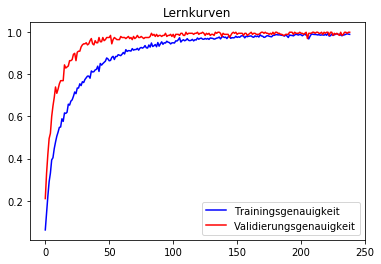

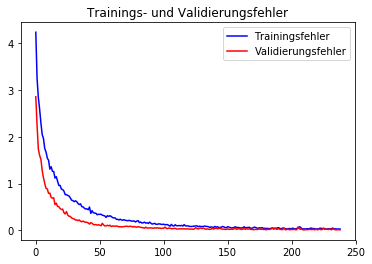

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.90      0.94        60
           1       0.98      0.99      0.99       720
           2       0.98      0.99      0.98       750
           3       0.98      0.97      0.97       450
           4       1.00      0.99      0.99       660
           5       0.93      0.98      0.96       630
           6       1.00      0.73      0.85       150
           7       0.99      0.97      0.98       450
           8       0.95      0.95      0.95       450
           9       0.99      0.99      0.99       480
          10       1.00      0.97      0.99       660
          11       0.99      0.85      0.91       420
          12       1.00      0.99      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.98      1.00      0.99       210
          16       0.99      0.99      0.99       

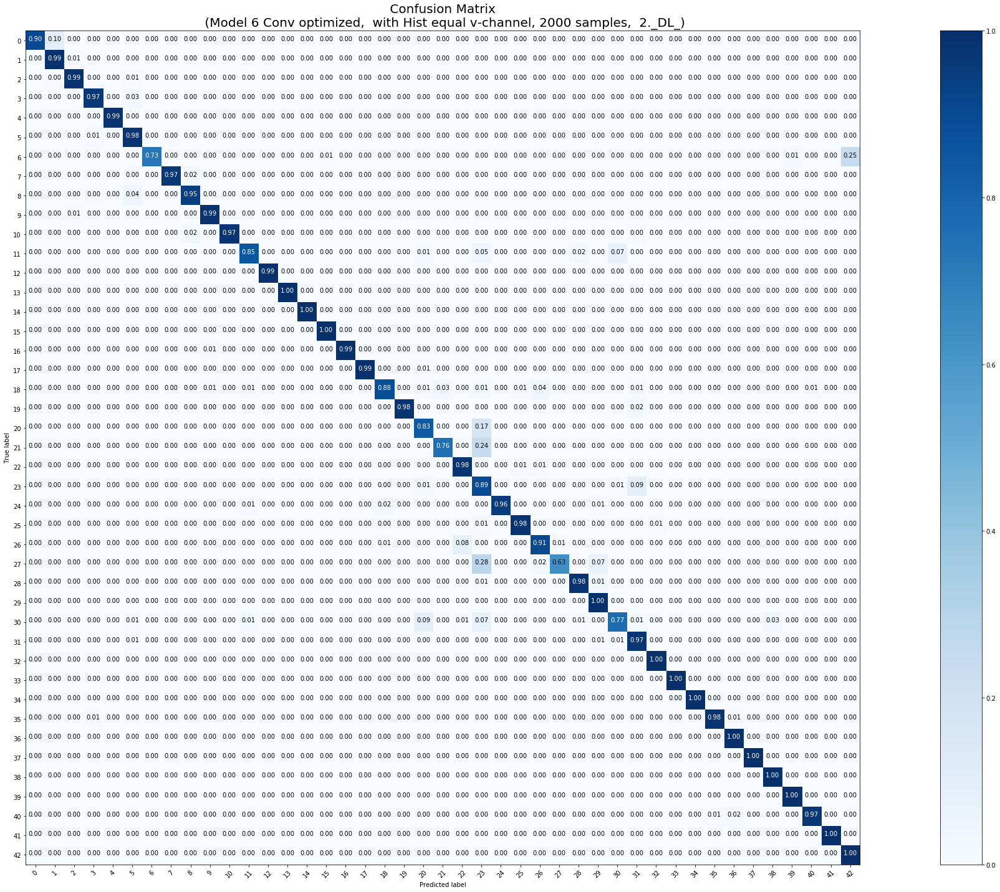

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 14s 241ms/step - loss: 4.1922 - acc: 0.0652 - val_loss: 2.5739 - val_acc: 0.3050
Epoch 2/300
57/57 [==============================] - 1s 22ms/step - loss: 3.1615 - acc: 0.1656 - val_loss: 2.0247 - val_acc: 0.4400
Epoch 3/300
57/57 [==============================] - 2s 27ms/step - loss: 2.7188 - acc: 0.2626 - val_loss: 1.7115 - val_acc: 0.5050
Epoch 4/300
57/57 [==============================] - 2s 27ms/step - loss: 2.5048 - acc: 0.2950 - val_loss: 1.5007 - val_acc: 0.5800
Epoch 5/300
57/57 [==============================] - 2s 27ms/step - loss: 2.2883 - acc: 0.3355 - val_loss: 1.3205 - val_acc: 0.6200
Epoch 6/300
57/57 [==============================] - 2s 26ms/step - loss: 1.9833 - acc: 0.3990 - val_loss: 1.1841 - val_acc: 0.6650
Epoch 7/300
57/57 [==============================] - 1s 25ms/st

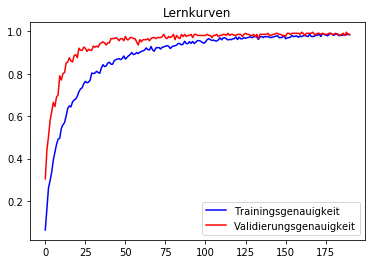

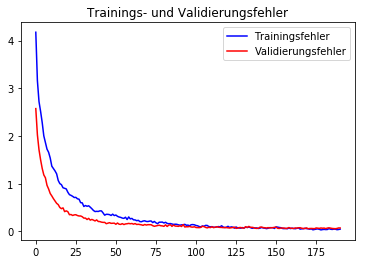

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.93      0.93      0.93        60
           1       0.97      0.97      0.97       720
           2       0.97      0.97      0.97       750
           3       0.99      0.96      0.98       450
           4       0.98      0.97      0.97       660
           5       0.93      0.95      0.94       630
           6       1.00      0.77      0.87       150
           7       0.97      0.98      0.97       450
           8       0.94      0.94      0.94       450
           9       1.00      0.98      0.99       480
          10       0.99      0.98      0.99       660
          11       0.94      0.83      0.88       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.99      0.99      0.99       

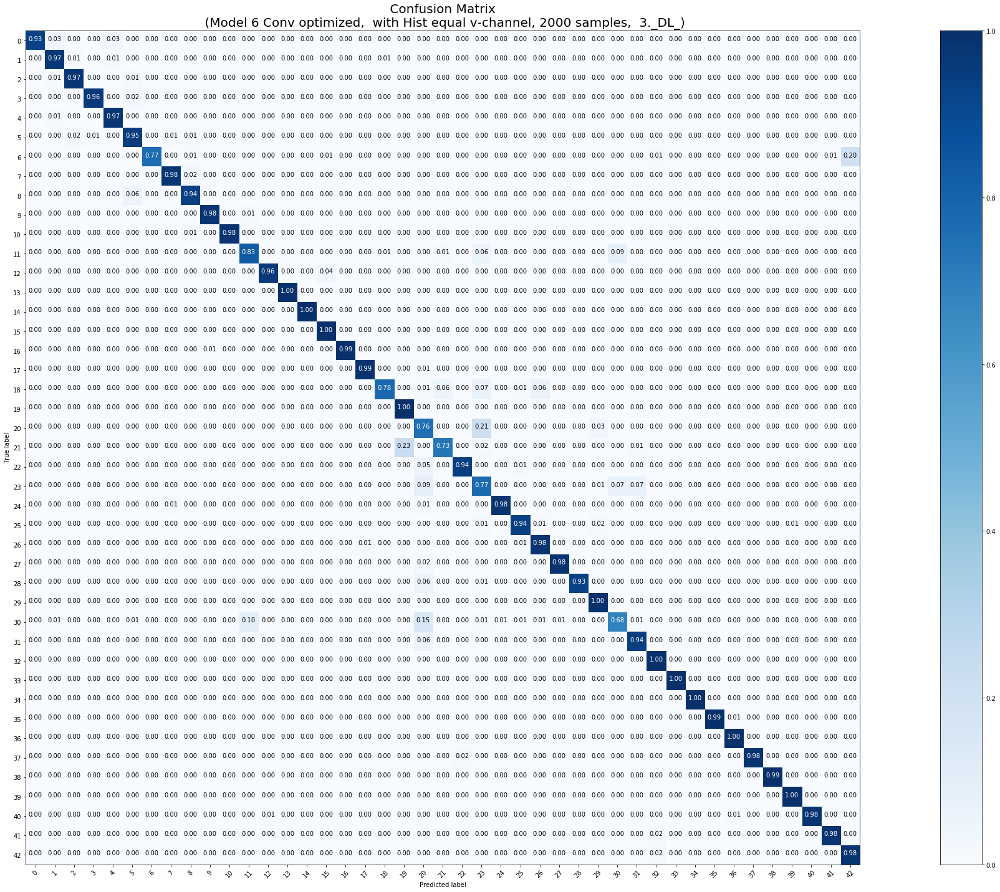

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 14s 241ms/step - loss: 4.2199 - acc: 0.0653 - val_loss: 2.8758 - val_acc: 0.2100
Epoch 2/300
57/57 [==============================] - 1s 22ms/step - loss: 3.3463 - acc: 0.1376 - val_loss: 2.2272 - val_acc: 0.3700
Epoch 3/300
57/57 [==============================] - 1s 26ms/step - loss: 2.8020 - acc: 0.2242 - val_loss: 1.7907 - val_acc: 0.4850
Epoch 4/300
57/57 [==============================] - 1s 26ms/step - loss: 2.4623 - acc: 0.2894 - val_loss: 1.5565 - val_acc: 0.5200
Epoch 5/300
57/57 [==============================] - 1s 26ms/step - loss: 2.2987 - acc: 0.3437 - val_loss: 1.3107 - val_acc: 0.6200
Epoch 6/300
57/57 [==============================] - 2s 27ms/step - loss: 2.0965 - acc: 0.3722 - val_loss: 1.1900 - val_acc: 0.6700
Epoch 7/300
57/57 [==============================] - 1s 25ms/st

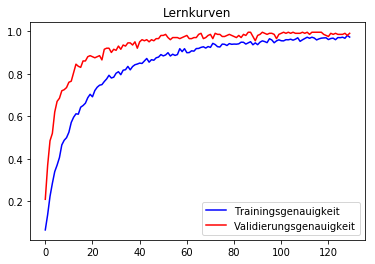

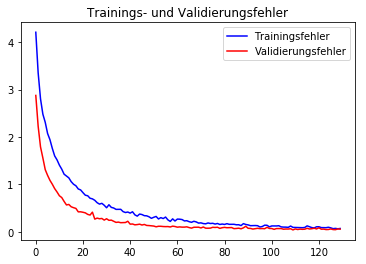

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.94      0.75      0.83        60
           1       0.97      0.97      0.97       720
           2       0.96      0.95      0.96       750
           3       0.99      0.93      0.96       450
           4       0.99      0.98      0.98       660
           5       0.88      0.93      0.90       630
           6       1.00      0.83      0.91       150
           7       0.96      0.94      0.95       450
           8       0.88      0.96      0.92       450
           9       0.99      0.99      0.99       480
          10       0.99      0.99      0.99       660
          11       0.98      0.79      0.87       420
          12       1.00      0.98      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.93      1.00      0.96       210
          16       0.97      0.99      0.98       

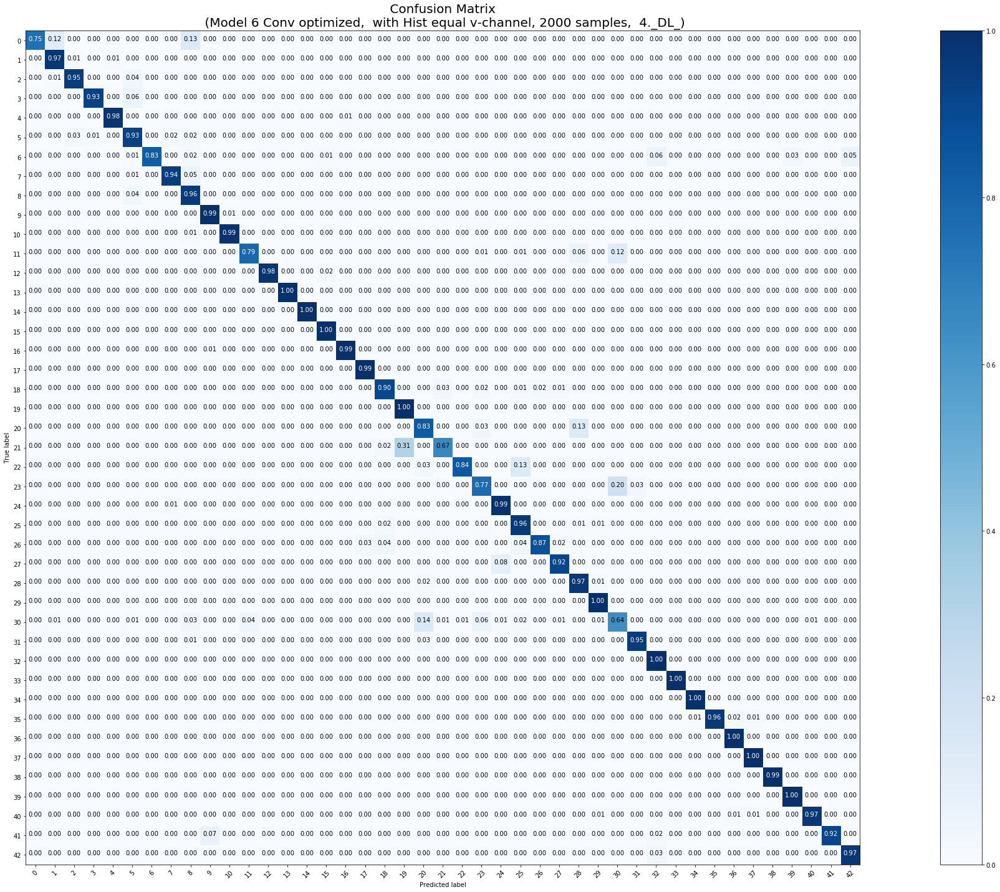

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 14s 254ms/step - loss: 4.0583 - acc: 0.0674 - val_loss: 2.6753 - val_acc: 0.2400
Epoch 2/300
57/57 [==============================] - 1s 23ms/step - loss: 3.2357 - acc: 0.1371 - val_loss: 2.1883 - val_acc: 0.3600
Epoch 3/300
57/57 [==============================] - 2s 27ms/step - loss: 2.7663 - acc: 0.2391 - val_loss: 1.9454 - val_acc: 0.4050
Epoch 4/300
57/57 [==============================] - 2s 26ms/step - loss: 2.3749 - acc: 0.3103 - val_loss: 1.6203 - val_acc: 0.5250
Epoch 5/300
57/57 [==============================] - 2s 26ms/step - loss: 2.3283 - acc: 0.3383 - val_loss: 1.4206 - val_acc: 0.5800
Epoch 6/300
57/57 [==============================] - 2s 27ms/step - loss: 2.0393 - acc: 0.4057 - val_loss: 1.2371 - val_acc: 0.6250
Epoch 7/300
57/57 [==============================] - 2s 27ms/st

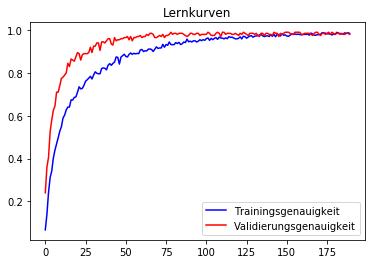

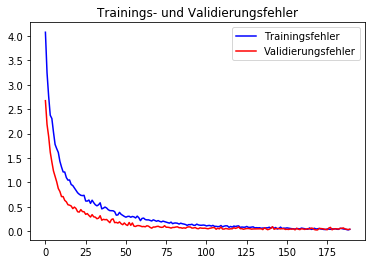

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      0.95      0.96        60
           1       0.97      0.99      0.98       720
           2       0.99      0.97      0.98       750
           3       0.98      0.95      0.96       450
           4       1.00      0.98      0.99       660
           5       0.93      0.98      0.95       630
           6       0.99      0.87      0.93       150
           7       0.99      0.95      0.97       450
           8       0.93      0.95      0.94       450
           9       0.99      1.00      0.99       480
          10       1.00      0.97      0.98       660
          11       0.97      0.86      0.91       420
          12       1.00      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.95      1.00      0.97       210
          16       0.97      0.99      0.98       

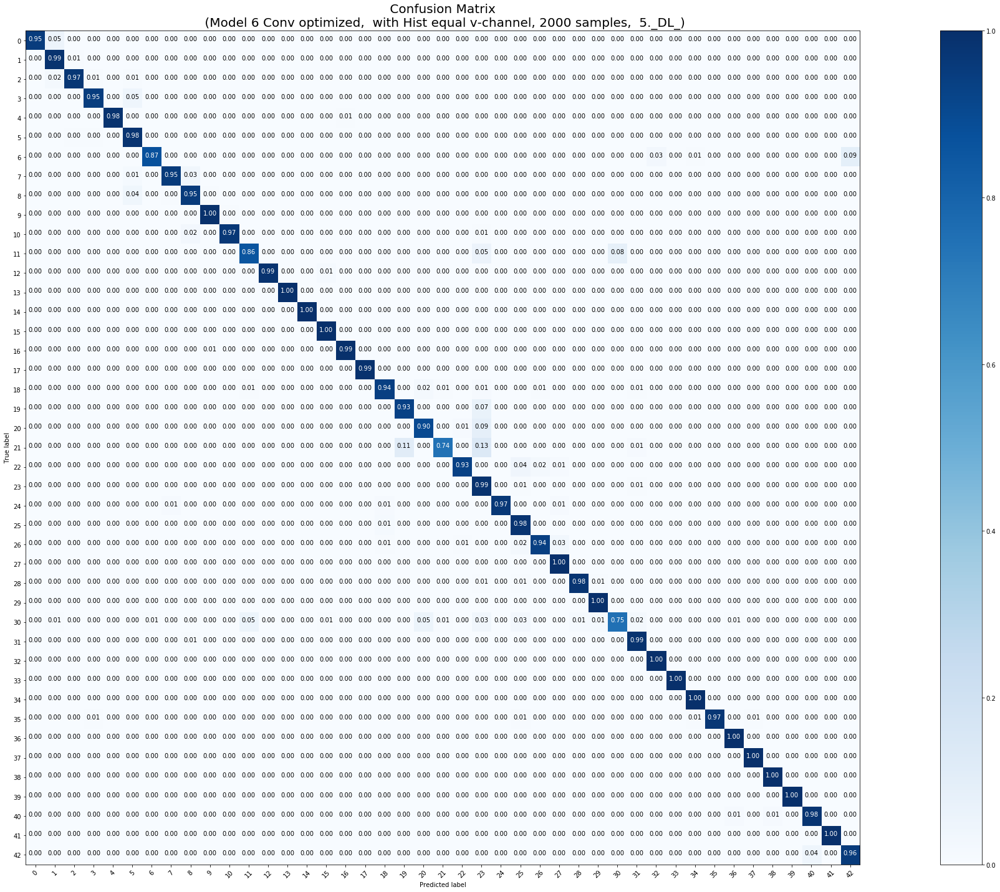

Die durchschnittliche Epochenanzahl beträgt:  152.6


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 2000    
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_2000, y_tr_2000, X_test, y_test, 0.2, 0.0001, False, 300, 2000)

In [0]:
downloader(1,5,2000)

In [0]:
def downloader(start, end, number):
  for i in range(start, end+1):
    files.download(str(i)+"._"+str(number)+"_Lernkurve_GTSRB_6_Conv_acc.png")
    files.download(str(i)+"._"+str(number)+"_Lernkurve_GTSRB_6_Conv_loss.png")
    files.download(str(i)+"._DL_"+str(number)+"_Confusion_matrix.png")
    files.download(str(i)+"._DL_"+str(number)+"_beste_Epoche.csv")
    files.download(str(i)+"._DL_"+str(number)+"_GTSRB_opt_ES.hdf5")
    files.download(str(i)+"._DL_"+str(number)+"_GTSRB_opt_ES_weights.hdf5")
    files.download(str(i)+"._DL_"+str(number)+"_metrics.csv")
    files.download(str(i)+"._DL_"+str(number)+"_metrics_train.csv")
    files.download(str(i)+"._DL_"+str(number)+"_precision_recall_fscore.csv")
    files.download(str(i)+"._DL_"+str(number)+"_precision_recall_fscore_train.csv")
    files.download(str(i)+"._DL_"+str(number)+"_roc_auc_score_single_class.npy")
    files.download(str(i)+"._DL_"+str(number)+"_roc_auc_score_single_class_train.npy")
    files.download(str(i)+"._DL_"+str(number)+"_Testzeiten.csv")
    files.download(str(i)+"._DL_"+str(number)+"_Trainingszeiten_ES.csv")
    files.download(str(i)+"._DL_"+str(number)+"_y_pred_label.npy")
    files.download(str(i)+"._DL_"+str(number)+"_y_pred_label_train.npy")




In [0]:
downloader(5,5, 2000)

In [0]:
downloader(1,5, 5000)

In [0]:
files.download("4._2000_Lernkurve_GTSRB_6_Conv_acc.png")
files.download("4._2000_Lernkurve_GTSRB_6_Conv_loss.png")
files.download("4._DL_2000_Confusion_matrix.png")
files.download("4._DL_2000_beste_Epoche.csv")
files.download("4._DL_2000_GTSRB_opt_ES.hdf5")
files.download("4._DL_2000_GTSRB_opt_ES_weights.hdf5")
files.download("4._DL_2000_metrics.csv")
files.download("4._DL_2000_metrics_train.csv")
files.download("4._DL_2000_precision_recall_fscore.csv")
files.download("4._DL_2000_precision_recall_fscore_train.csv")
files.download("4._DL_2000_roc_auc_score_single_class.npy")
files.download("4._DL_2000_roc_auc_score_single_class_train.npy")
files.download("4._DL_2000_Testzeiten.csv")
files.download("4._DL_2000_Trainingszeiten_ES.csv")
files.download("4._DL_2000_y_pred_label.npy")
files.download("4._DL_2000_y_pred_label_train.npy")


***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 16s 4ms/step - loss: 3.5306 - acc: 0.1378 - val_loss: 2.2360 - val_acc: 0.3740
Epoch 2/300
4500/4500 [==============================] - 2s 500us/step - loss: 2.1191 - acc: 0.3851 - val_loss: 1.3621 - val_acc: 0.6080
Epoch 3/300
4500/4500 [==============================] - 2s 498us/step - loss: 1.4607 - acc: 0.5433 - val_loss: 0.9083 - val_acc: 0.7480
Epoch 4/300
4500/4500 [==============================] - 2s 504us/step - loss: 1.0491 - acc: 0.6573 - val_loss: 0.6578 - val_acc: 0.8200
Epoch 5/300
4500/4500 [==============================] - 2s 496us/step - loss: 0.8343 - acc: 0.7207 - val_loss: 0.5231 - val_acc: 0.8580
Epoch 6/300
4500/4500 [==============================] - 2s 508us/step - loss: 0.6291 - acc: 0.7729 - val_loss: 0.4131 - val_a

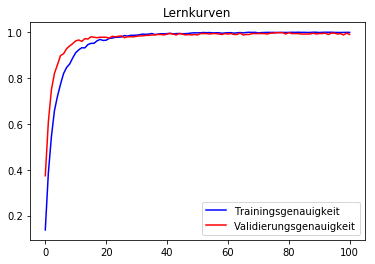

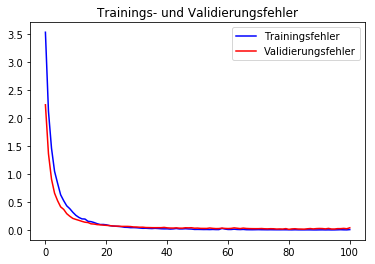

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        60
           1       0.94      0.98      0.96       720
           2       0.98      0.99      0.99       750
           3       0.98      0.97      0.98       450
           4       0.99      0.98      0.99       660
           5       0.95      0.97      0.96       630
           6       1.00      0.73      0.84       150
           7       0.97      0.95      0.96       450
           8       0.94      0.95      0.94       450
           9       0.98      0.99      0.98       480
          10       0.99      0.99      0.99       660
          11       0.97      0.96      0.97       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.98      1.00      0.99       210
          16       0.99      0.97      0.98       

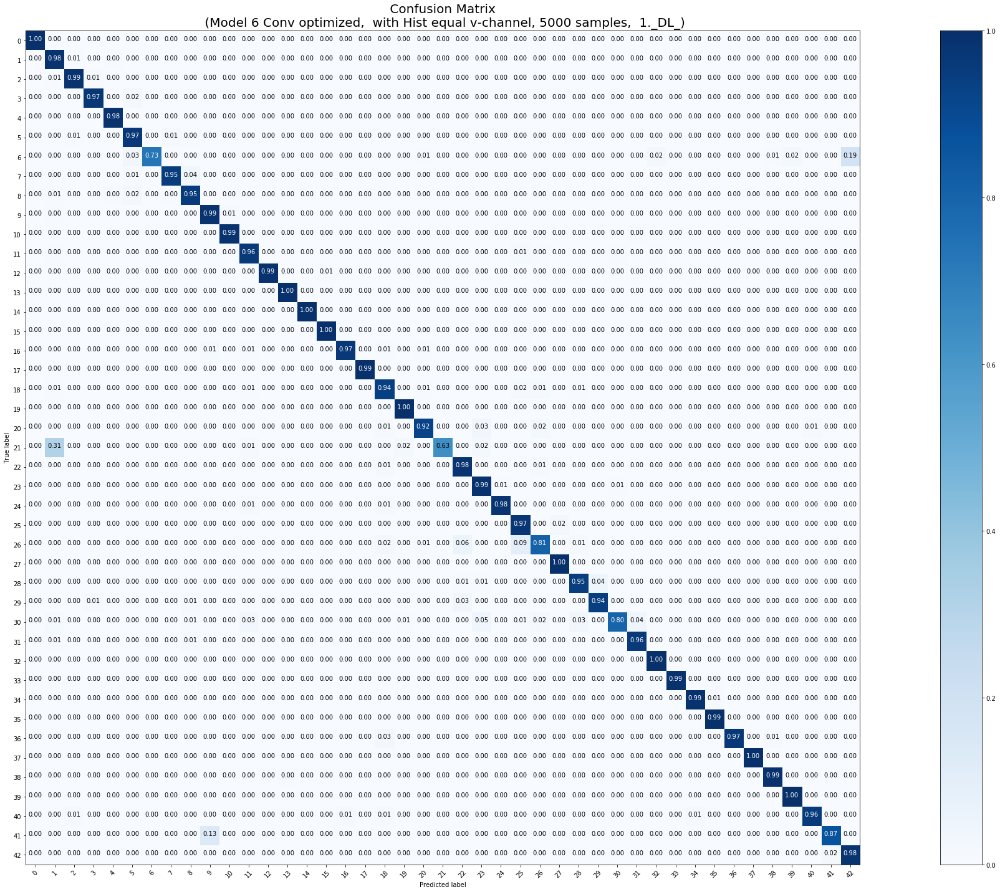

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 16s 4ms/step - loss: 3.5396 - acc: 0.1456 - val_loss: 1.9844 - val_acc: 0.4420
Epoch 2/300
4500/4500 [==============================] - 2s 504us/step - loss: 2.1314 - acc: 0.3838 - val_loss: 1.3205 - val_acc: 0.5980
Epoch 3/300
4500/4500 [==============================] - 2s 504us/step - loss: 1.4619 - acc: 0.5318 - val_loss: 0.8951 - val_acc: 0.7440
Epoch 4/300
4500/4500 [==============================] - 2s 540us/step - loss: 1.0511 - acc: 0.6476 - val_loss: 0.6319 - val_acc: 0.8180
Epoch 5/300
4500/4500 [==============================] - 2s 508us/step - loss: 0.7873 - acc: 0.7376 - val_loss: 0.4938 - val_acc: 0.8480
Epoch 6/300
4500/4500 [==============================] - 2s 517us/step - loss: 0.6278 - acc: 0.7878 - val_loss: 0.3973 - val_a

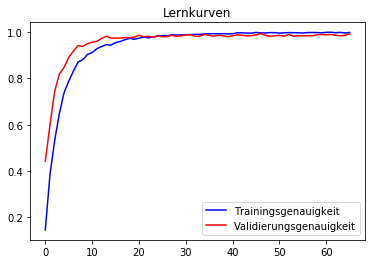

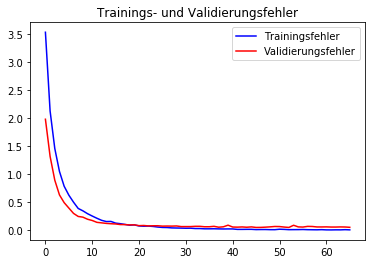

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        60
           1       0.98      0.97      0.97       720
           2       0.98      0.98      0.98       750
           3       0.98      0.97      0.97       450
           4       0.98      0.98      0.98       660
           5       0.94      0.97      0.96       630
           6       0.98      0.69      0.81       150
           7       0.97      0.94      0.95       450
           8       0.94      0.96      0.95       450
           9       0.96      0.99      0.98       480
          10       0.99      0.96      0.98       660
          11       0.96      0.94      0.95       420
          12       0.99      0.99      0.99       690
          13       0.98      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.98      1.00      0.99       210
          16       1.00      0.94      0.97       

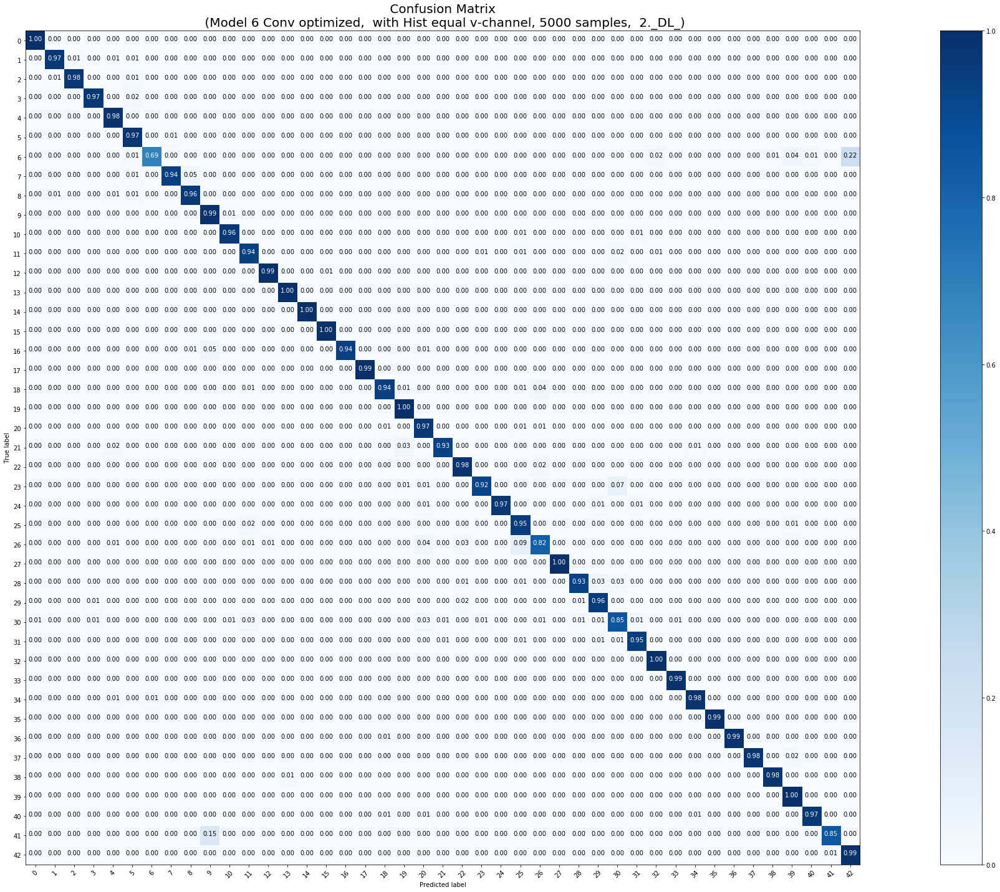

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 17s 4ms/step - loss: 3.4653 - acc: 0.1438 - val_loss: 1.9900 - val_acc: 0.4640
Epoch 2/300
4500/4500 [==============================] - 2s 507us/step - loss: 2.0988 - acc: 0.3876 - val_loss: 1.2549 - val_acc: 0.6460
Epoch 3/300
4500/4500 [==============================] - 2s 505us/step - loss: 1.4160 - acc: 0.5478 - val_loss: 0.8731 - val_acc: 0.7540
Epoch 4/300
4500/4500 [==============================] - 2s 513us/step - loss: 1.0129 - acc: 0.6609 - val_loss: 0.6315 - val_acc: 0.8240
Epoch 5/300
4500/4500 [==============================] - 2s 502us/step - loss: 0.7935 - acc: 0.7180 - val_loss: 0.4644 - val_acc: 0.8740
Epoch 6/300
4500/4500 [==============================] - 2s 499us/step - loss: 0.5950 - acc: 0.7827 - val_loss: 0.4051 - val_a

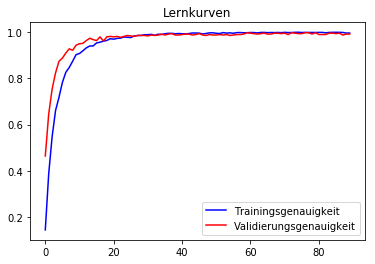

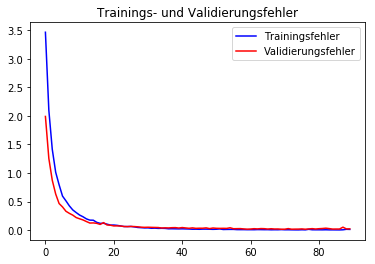

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        60
           1       0.96      0.98      0.97       720
           2       0.97      0.99      0.98       750
           3       0.99      0.95      0.97       450
           4       0.99      0.96      0.98       660
           5       0.90      0.99      0.94       630
           6       0.98      0.69      0.81       150
           7       0.97      0.96      0.97       450
           8       0.94      0.93      0.93       450
           9       1.00      0.99      0.99       480
          10       0.99      0.97      0.98       660
          11       0.94      0.93      0.93       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       1.00      1.00      1.00       210
          16       0.99      0.97      0.98       

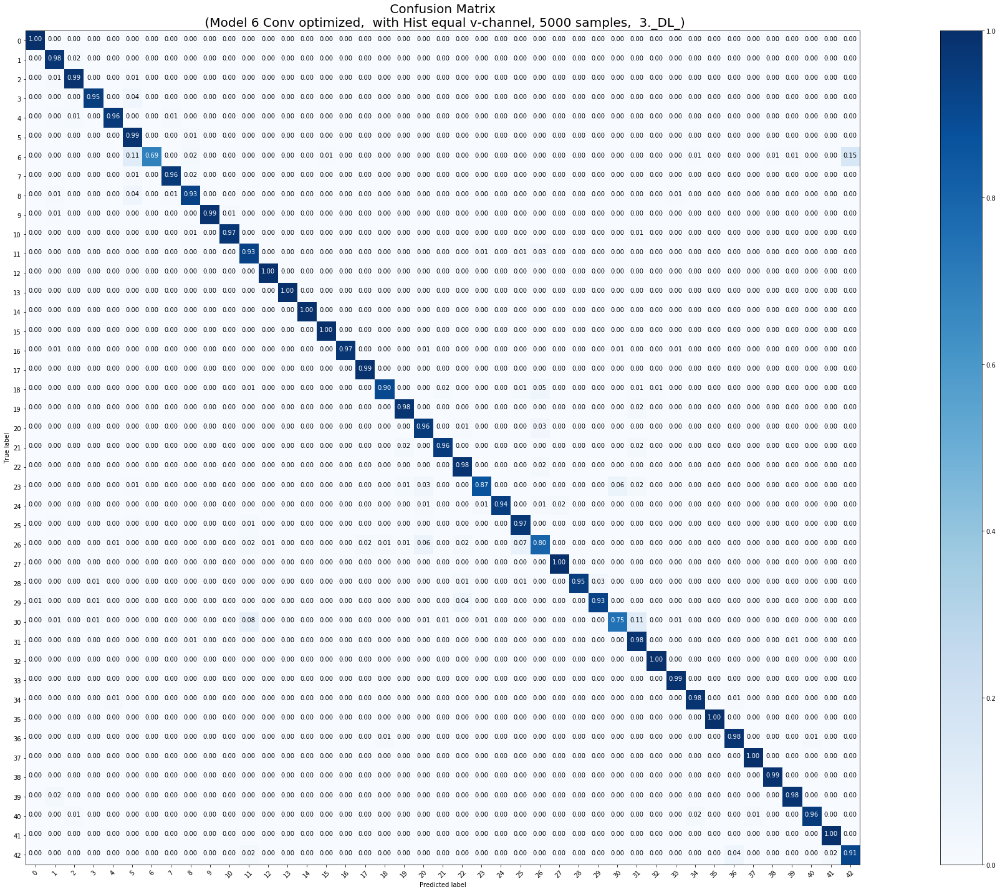

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 17s 4ms/step - loss: 3.4060 - acc: 0.1424 - val_loss: 1.9791 - val_acc: 0.3900
Epoch 2/300
4500/4500 [==============================] - 2s 507us/step - loss: 2.0590 - acc: 0.3936 - val_loss: 1.2065 - val_acc: 0.6360
Epoch 3/300
4500/4500 [==============================] - 2s 502us/step - loss: 1.3829 - acc: 0.5500 - val_loss: 0.8223 - val_acc: 0.7680
Epoch 4/300
4500/4500 [==============================] - 2s 506us/step - loss: 1.0326 - acc: 0.6587 - val_loss: 0.5796 - val_acc: 0.8420
Epoch 5/300
4500/4500 [==============================] - 2s 503us/step - loss: 0.7862 - acc: 0.7331 - val_loss: 0.4526 - val_acc: 0.8840
Epoch 6/300
4500/4500 [==============================] - 2s 509us/step - loss: 0.6279 - acc: 0.7820 - val_loss: 0.3568 - val_a

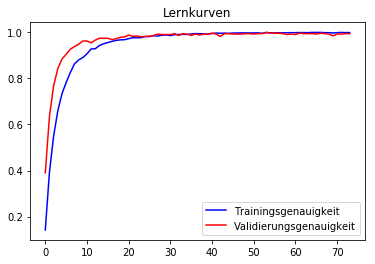

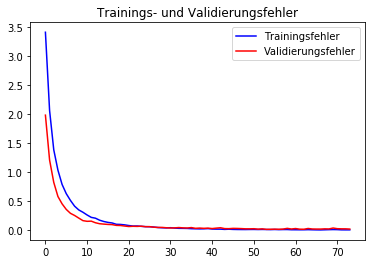

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.95      0.97        60
           1       0.98      0.97      0.97       720
           2       0.98      0.99      0.98       750
           3       0.97      0.97      0.97       450
           4       0.99      0.97      0.98       660
           5       0.91      0.98      0.95       630
           6       0.97      0.67      0.79       150
           7       0.96      0.93      0.94       450
           8       0.94      0.92      0.93       450
           9       0.98      1.00      0.99       480
          10       0.99      0.97      0.98       660
          11       0.97      0.95      0.96       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.98      1.00      0.99       210
          16       1.00      0.96      0.98       

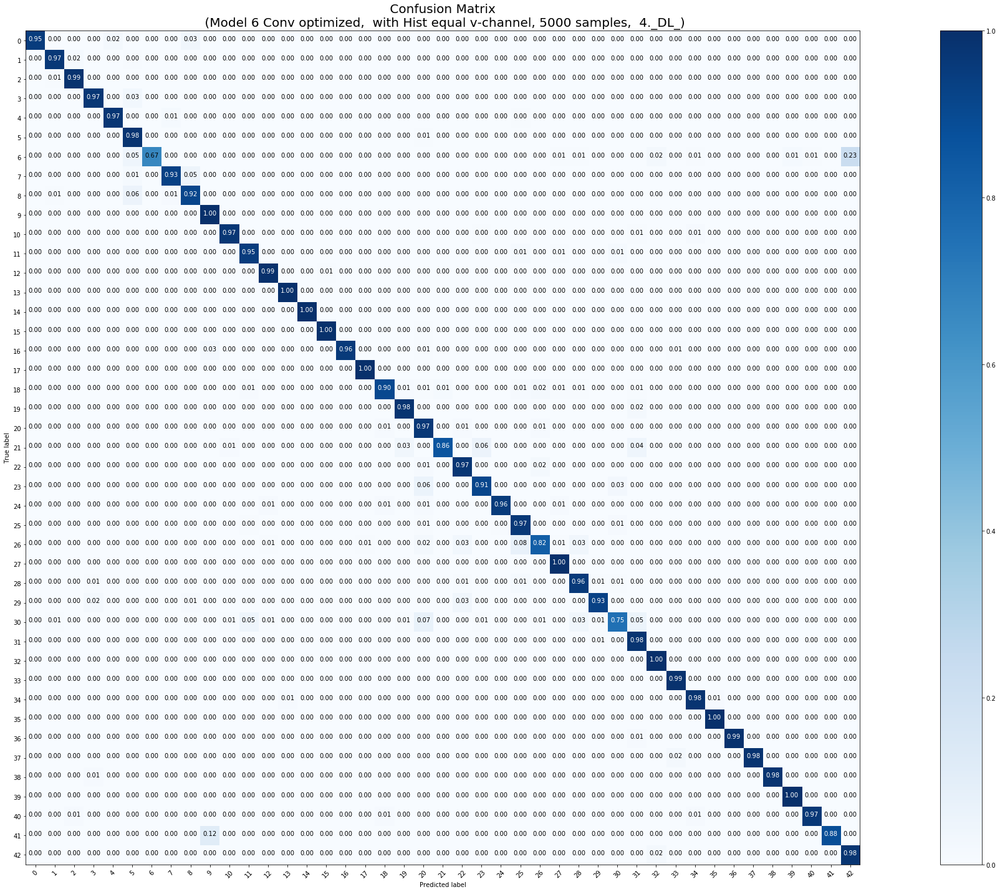

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 17s 4ms/step - loss: 3.5874 - acc: 0.1282 - val_loss: 1.9107 - val_acc: 0.4920
Epoch 2/300
4500/4500 [==============================] - 2s 511us/step - loss: 2.1356 - acc: 0.3771 - val_loss: 1.2555 - val_acc: 0.6040
Epoch 3/300
4500/4500 [==============================] - 2s 511us/step - loss: 1.4630 - acc: 0.5424 - val_loss: 0.7953 - val_acc: 0.7880
Epoch 4/300
4500/4500 [==============================] - 2s 510us/step - loss: 1.0724 - acc: 0.6444 - val_loss: 0.5664 - val_acc: 0.8440
Epoch 5/300
4500/4500 [==============================] - 2s 507us/step - loss: 0.8134 - acc: 0.7153 - val_loss: 0.4381 - val_acc: 0.8840
Epoch 6/300
4500/4500 [==============================] - 2s 551us/step - loss: 0.6379 - acc: 0.7838 - val_loss: 0.3437 - val_a

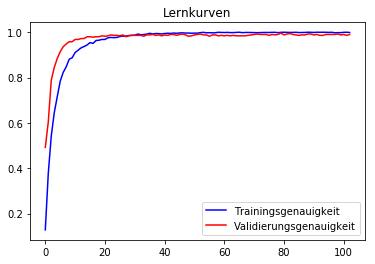

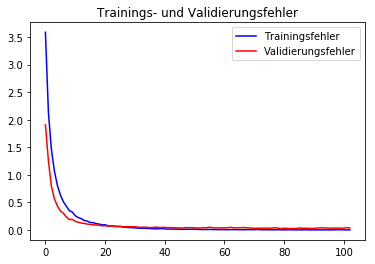

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        60
           1       0.96      0.98      0.97       720
           2       0.98      0.99      0.98       750
           3       1.00      0.97      0.98       450
           4       0.99      0.96      0.98       660
           5       0.91      0.98      0.95       630
           6       0.99      0.69      0.82       150
           7       0.96      0.94      0.95       450
           8       0.92      0.93      0.93       450
           9       0.96      0.99      0.97       480
          10       0.99      0.99      0.99       660
          11       0.98      0.95      0.97       420
          12       0.99      1.00      1.00       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       1.00      1.00      1.00       210
          16       0.97      0.94      0.96       

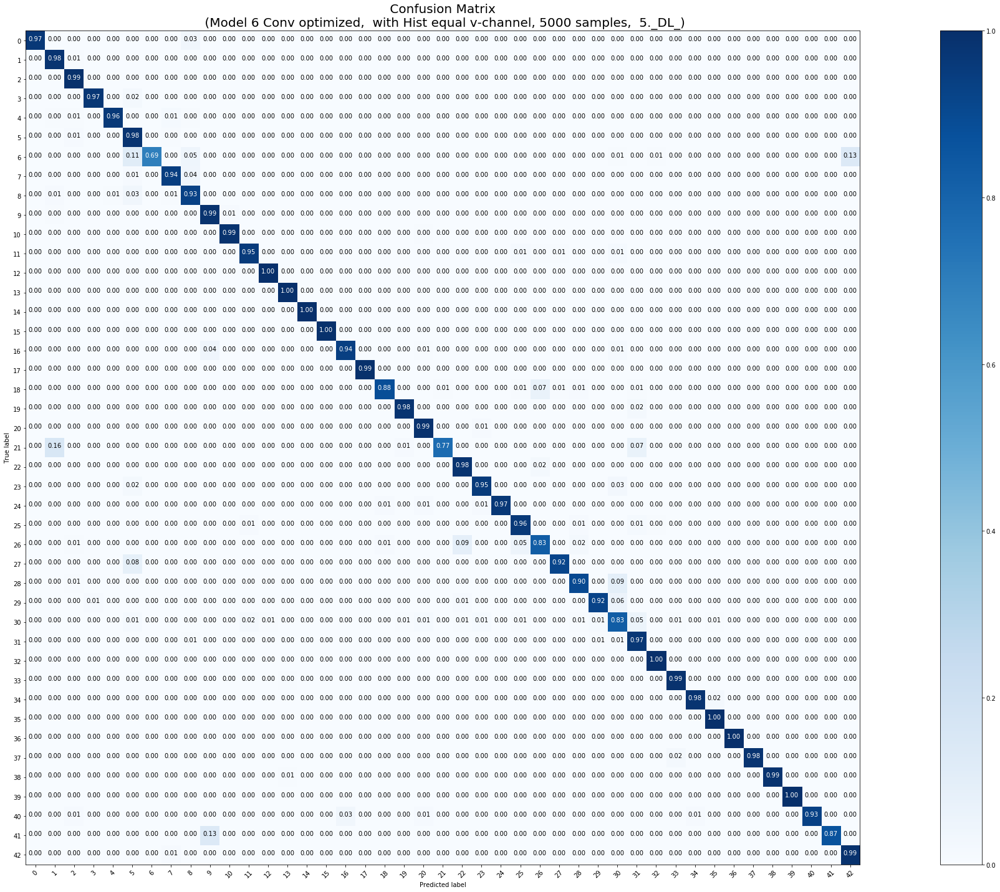

Die durchschnittliche Epochenanzahl beträgt:  66.8


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 5000
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_5000, y_tr_5000, X_test, y_test, 0.3, 0.0001, False, 300, 5000)

In [0]:
downloader(1,5,5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 19s 137ms/step - loss: 3.9074 - acc: 0.0837 - val_loss: 2.2889 - val_acc: 0.3740
Epoch 2/300
141/141 [==============================] - 4s 25ms/step - loss: 2.9336 - acc: 0.2178 - val_loss: 1.7048 - val_acc: 0.4760
Epoch 3/300
141/141 [==============================] - 4s 27ms/step - loss: 2.3686 - acc: 0.3133 - val_loss: 1.2896 - val_acc: 0.5860
Epoch 4/300
141/141 [==============================] - 4s 27ms/step - loss: 2.0068 - acc: 0.3972 - val_loss: 1.1024 - val_acc: 0.6600
Epoch 5/300
141/141 [==============================] - 4s 28ms/step - loss: 1.7146 - acc: 0.4607 - val_loss: 1.0005 - val_acc: 0.6860
Epoch 6/300
141/141 [==============================] - 4s 27ms/step - loss: 1.5417 - acc: 0.5029 - val_loss: 0.8812 - val_acc: 0.7100
Epoch 7/300
141/141 [==============================

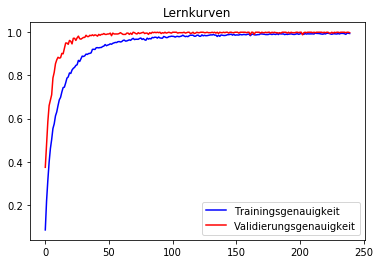

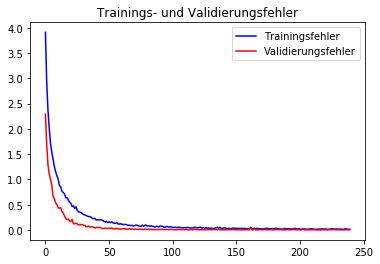

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      1.00      0.99       720
           2       0.99      0.99      0.99       750
           3       1.00      0.97      0.99       450
           4       1.00      0.99      1.00       660
           5       0.97      0.98      0.98       630
           6       1.00      0.85      0.92       150
           7       0.99      0.99      0.99       450
           8       0.97      0.99      0.98       450
           9       1.00      0.99      0.99       480
          10       1.00      0.99      1.00       660
          11       1.00      0.94      0.97       420
          12       1.00      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.99      0.99      0.99       

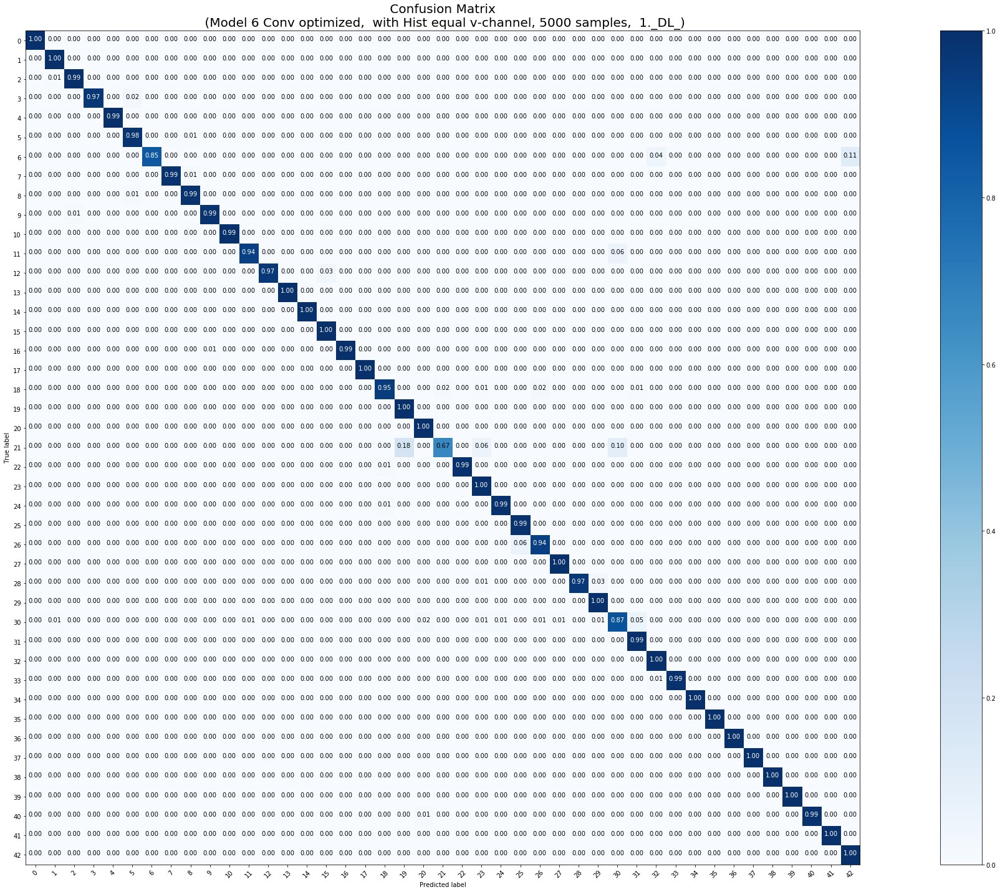

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 20s 140ms/step - loss: 3.9134 - acc: 0.0812 - val_loss: 2.3060 - val_acc: 0.3540
Epoch 2/300
141/141 [==============================] - 4s 26ms/step - loss: 2.8145 - acc: 0.2371 - val_loss: 1.6605 - val_acc: 0.5300
Epoch 3/300
141/141 [==============================] - 4s 27ms/step - loss: 2.3239 - acc: 0.3372 - val_loss: 1.3697 - val_acc: 0.5960
Epoch 4/300
141/141 [==============================] - 4s 27ms/step - loss: 1.9904 - acc: 0.3912 - val_loss: 1.0842 - val_acc: 0.6640
Epoch 5/300
141/141 [==============================] - 4s 27ms/step - loss: 1.7630 - acc: 0.4586 - val_loss: 0.9876 - val_acc: 0.6540
Epoch 6/300
141/141 [==============================] - 4s 30ms/step - loss: 1.5451 - acc: 0.5062 - val_loss: 0.7772 - val_acc: 0.7760
Epoch 7/300
141/141 [==============================

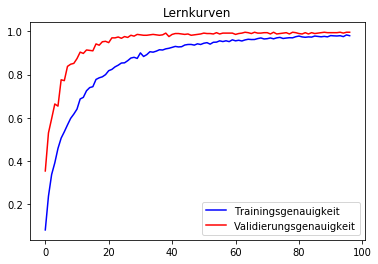

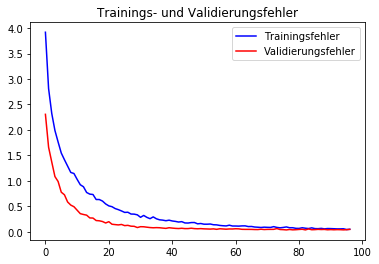

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.98      0.99      0.99       720
           2       0.99      0.96      0.98       750
           3       0.92      0.98      0.95       450
           4       0.99      0.99      0.99       660
           5       0.96      0.98      0.97       630
           6       0.99      0.74      0.85       150
           7       0.99      0.97      0.98       450
           8       0.97      0.95      0.96       450
           9       0.98      1.00      0.99       480
          10       1.00      0.98      0.99       660
          11       0.99      0.85      0.91       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.88      1.00      0.94       210
          16       0.97      0.99      0.98       

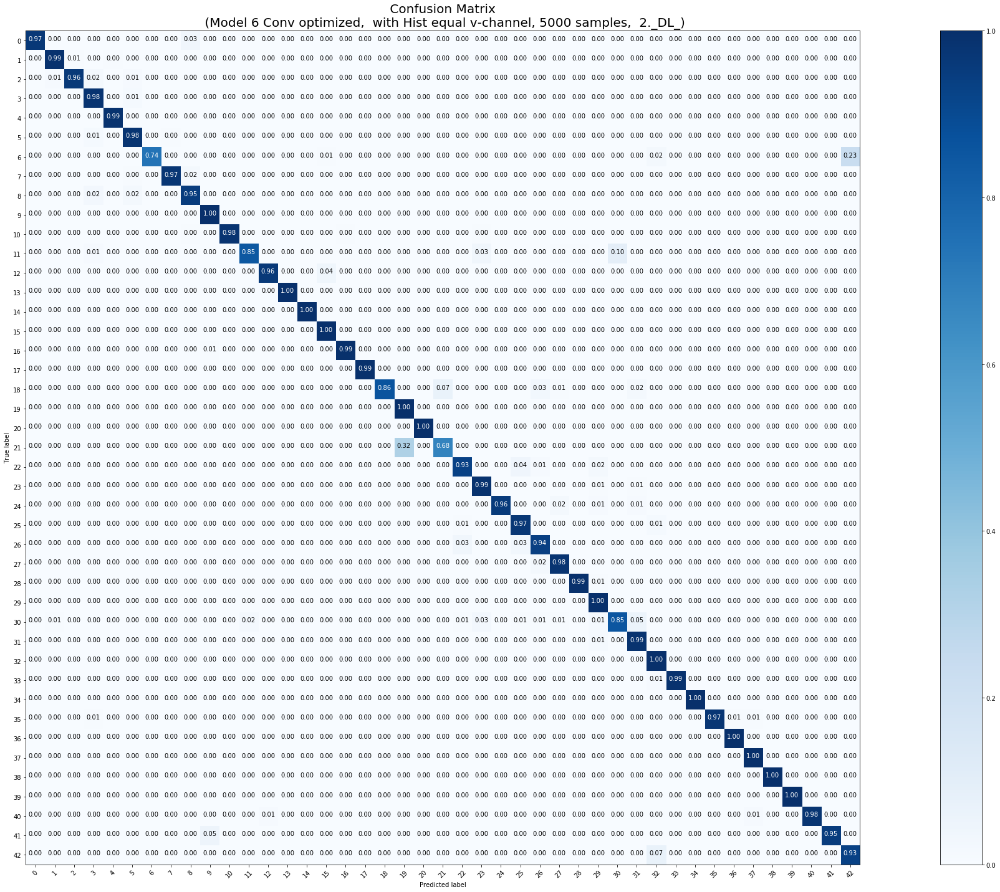

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 20s 144ms/step - loss: 3.9473 - acc: 0.0823 - val_loss: 2.3522 - val_acc: 0.3520
Epoch 2/300
141/141 [==============================] - 4s 26ms/step - loss: 2.9568 - acc: 0.2018 - val_loss: 1.7952 - val_acc: 0.4980
Epoch 3/300
141/141 [==============================] - 4s 27ms/step - loss: 2.4060 - acc: 0.3059 - val_loss: 1.3751 - val_acc: 0.6240
Epoch 4/300
141/141 [==============================] - 4s 28ms/step - loss: 2.1425 - acc: 0.3694 - val_loss: 1.1214 - val_acc: 0.7000
Epoch 5/300
141/141 [==============================] - 4s 28ms/step - loss: 1.7843 - acc: 0.4465 - val_loss: 0.9988 - val_acc: 0.7120
Epoch 6/300
141/141 [==============================] - 4s 28ms/step - loss: 1.5817 - acc: 0.4903 - val_loss: 0.8429 - val_acc: 0.7600
Epoch 7/300
141/141 [==============================

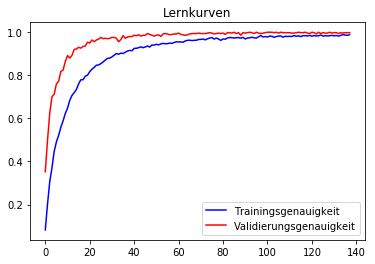

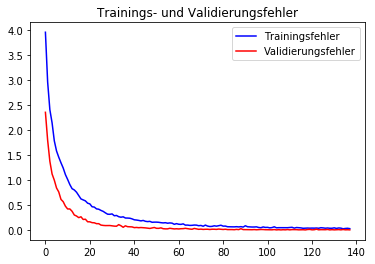

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        60
           1       0.98      0.98      0.98       720
           2       0.99      0.97      0.98       750
           3       0.98      0.97      0.97       450
           4       1.00      0.99      0.99       660
           5       0.94      0.99      0.96       630
           6       1.00      0.74      0.85       150
           7       0.99      0.97      0.98       450
           8       0.94      0.96      0.95       450
           9       1.00      1.00      1.00       480
          10       1.00      0.99      0.99       660
          11       0.99      0.97      0.98       420
          12       1.00      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.99      0.99      0.99       

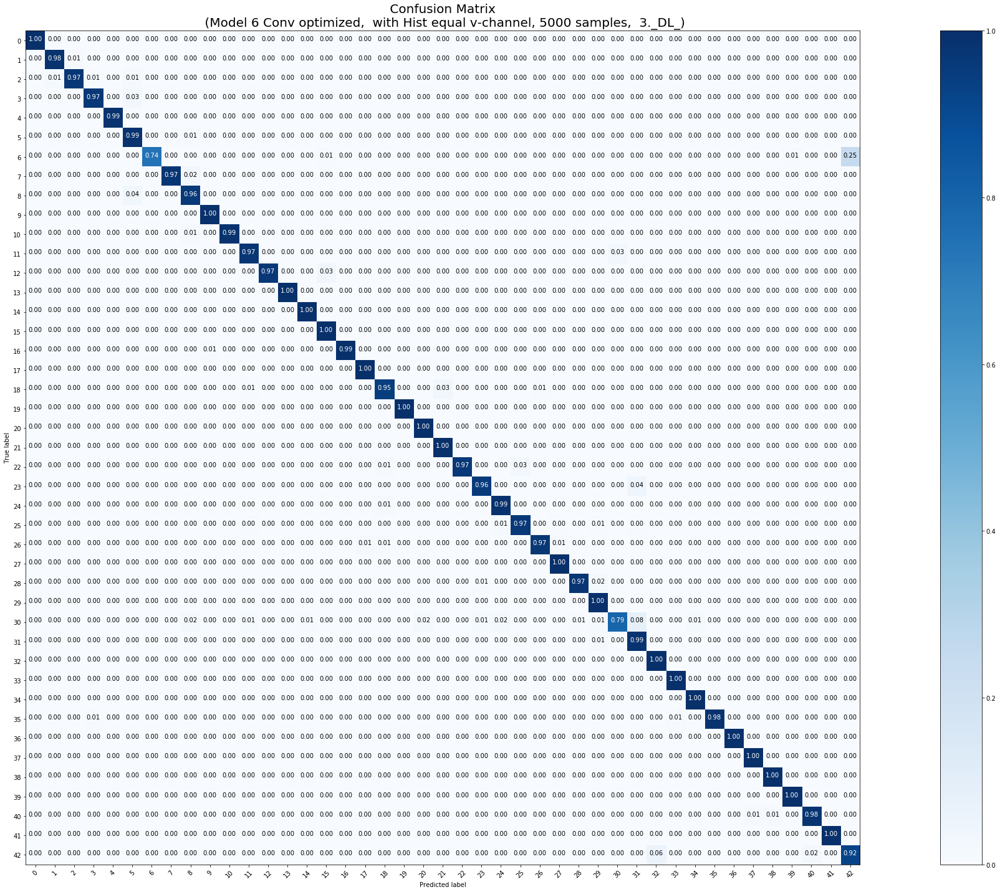

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 21s 150ms/step - loss: 4.0192 - acc: 0.0662 - val_loss: 2.5483 - val_acc: 0.3040
Epoch 2/300
141/141 [==============================] - 4s 27ms/step - loss: 3.0328 - acc: 0.1850 - val_loss: 1.9838 - val_acc: 0.4380
Epoch 3/300
141/141 [==============================] - 4s 27ms/step - loss: 2.4647 - acc: 0.2992 - val_loss: 1.5190 - val_acc: 0.5280
Epoch 4/300
141/141 [==============================] - 4s 27ms/step - loss: 2.0846 - acc: 0.3918 - val_loss: 1.2332 - val_acc: 0.6180
Epoch 5/300
141/141 [==============================] - 4s 28ms/step - loss: 1.8747 - acc: 0.4375 - val_loss: 1.0050 - val_acc: 0.6900
Epoch 6/300
141/141 [==============================] - 4s 27ms/step - loss: 1.6773 - acc: 0.4843 - val_loss: 0.9007 - val_acc: 0.7320
Epoch 7/300
141/141 [==============================

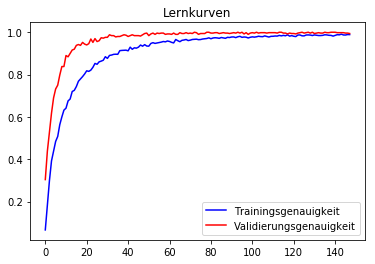

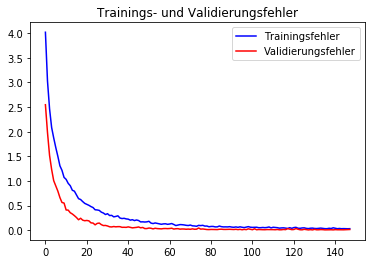

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.98      0.99      0.99       720
           2       0.99      0.99      0.99       750
           3       0.98      0.97      0.98       450
           4       1.00      0.99      0.99       660
           5       0.94      0.99      0.97       630
           6       1.00      0.80      0.89       150
           7       1.00      0.98      0.99       450
           8       0.99      0.95      0.97       450
           9       0.99      1.00      1.00       480
          10       1.00      1.00      1.00       660
          11       0.99      0.93      0.96       420
          12       1.00      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.99      0.99      0.99       

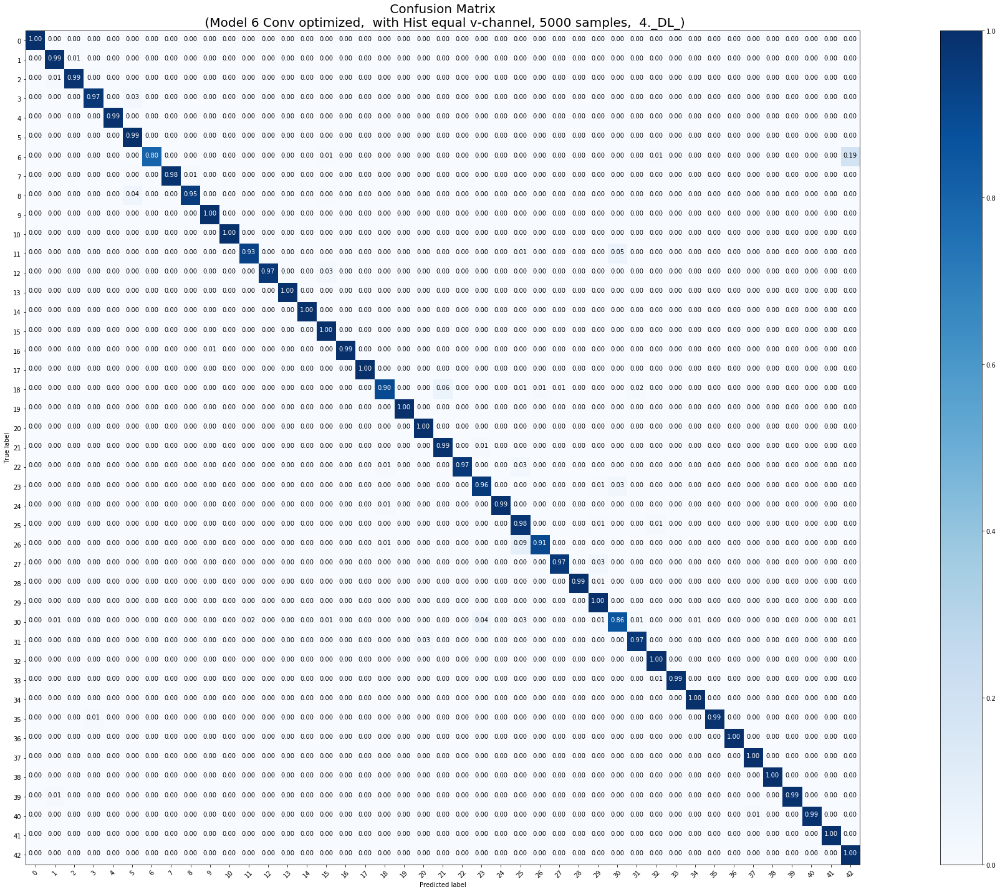

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 21s 150ms/step - loss: 3.8242 - acc: 0.1012 - val_loss: 2.1727 - val_acc: 0.4260
Epoch 2/300
141/141 [==============================] - 4s 27ms/step - loss: 2.7819 - acc: 0.2480 - val_loss: 1.6917 - val_acc: 0.5220
Epoch 3/300
141/141 [==============================] - 4s 28ms/step - loss: 2.3227 - acc: 0.3344 - val_loss: 1.2683 - val_acc: 0.6220
Epoch 4/300
141/141 [==============================] - 4s 28ms/step - loss: 2.0133 - acc: 0.3892 - val_loss: 1.1314 - val_acc: 0.6460
Epoch 5/300
141/141 [==============================] - 4s 27ms/step - loss: 1.8120 - acc: 0.4477 - val_loss: 0.9920 - val_acc: 0.7020
Epoch 6/300
141/141 [==============================] - 4s 27ms/step - loss: 1.5752 - acc: 0.4983 - val_loss: 0.7798 - val_acc: 0.7600
Epoch 7/300
141/141 [==============================

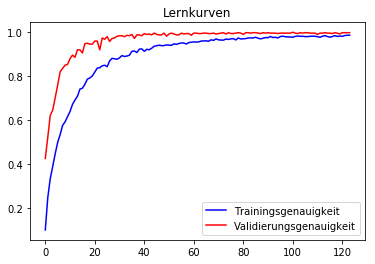

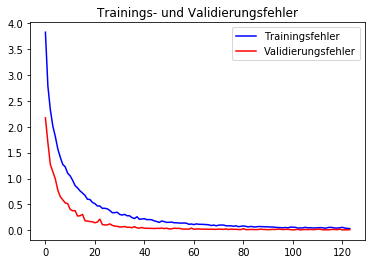

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      0.98      0.99       720
           2       0.99      0.99      0.99       750
           3       0.99      0.97      0.98       450
           4       0.99      0.99      0.99       660
           5       0.96      0.97      0.97       630
           6       1.00      0.77      0.87       150
           7       0.98      0.98      0.98       450
           8       0.97      0.98      0.97       450
           9       1.00      1.00      1.00       480
          10       1.00      1.00      1.00       660
          11       1.00      0.91      0.95       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.99      0.99      0.99       

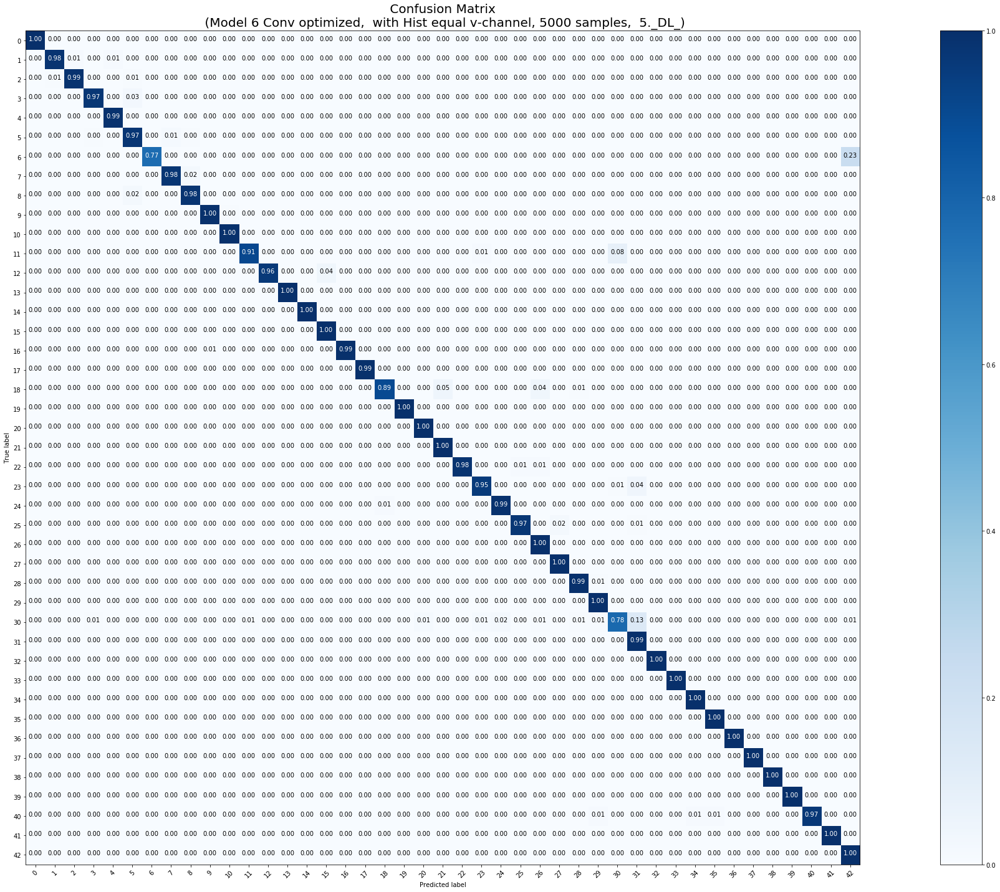

Die durchschnittliche Epochenanzahl beträgt:  129.4


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 5000    
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_5000, y_tr_5000, X_test, y_test, 0.3, 0.0001, False, 300, 5000)

In [0]:
downloader(1,5,5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 15s 2ms/step - loss: 2.8137 - acc: 0.2638 - val_loss: 1.1573 - val_acc: 0.6870
Epoch 2/300
9000/9000 [==============================] - 4s 491us/step - loss: 1.2177 - acc: 0.6129 - val_loss: 0.6023 - val_acc: 0.8470
Epoch 3/300
9000/9000 [==============================] - 4s 492us/step - loss: 0.7209 - acc: 0.7631 - val_loss: 0.4112 - val_acc: 0.8810
Epoch 4/300
9000/9000 [==============================] - 4s 492us/step - loss: 0.5002 - acc: 0.8278 - val_loss: 0.3178 - val_acc: 0.9080
Epoch 5/300
9000/9000 [==============================] - 4s 491us/step - loss: 0.3619 - acc: 0.8742 - val_loss: 0.1878 - val_acc: 0.9630
Epoch 6/300
9000/9000 [==============================] - 4s 479us/step - loss: 0.2751 - acc: 0.9049 - val_loss: 0.1501 - val_acc: 0.9660
Epoch 7/3

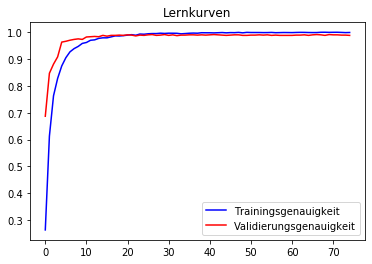

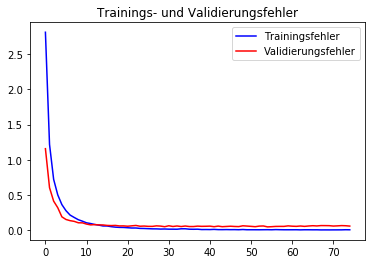

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.98      0.98      0.98       720
           2       0.99      0.99      0.99       750
           3       0.98      0.96      0.97       450
           4       0.99      0.98      0.99       660
           5       0.93      0.99      0.96       630
           6       1.00      0.71      0.83       150
           7       0.98      0.96      0.97       450
           8       0.95      0.97      0.96       450
           9       0.98      1.00      0.99       480
          10       0.99      0.99      0.99       660
          11       0.97      0.95      0.96       420
          12       1.00      0.97      0.98       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.90      1.00      0.95       210
          16       0.96      0.99      0.98       

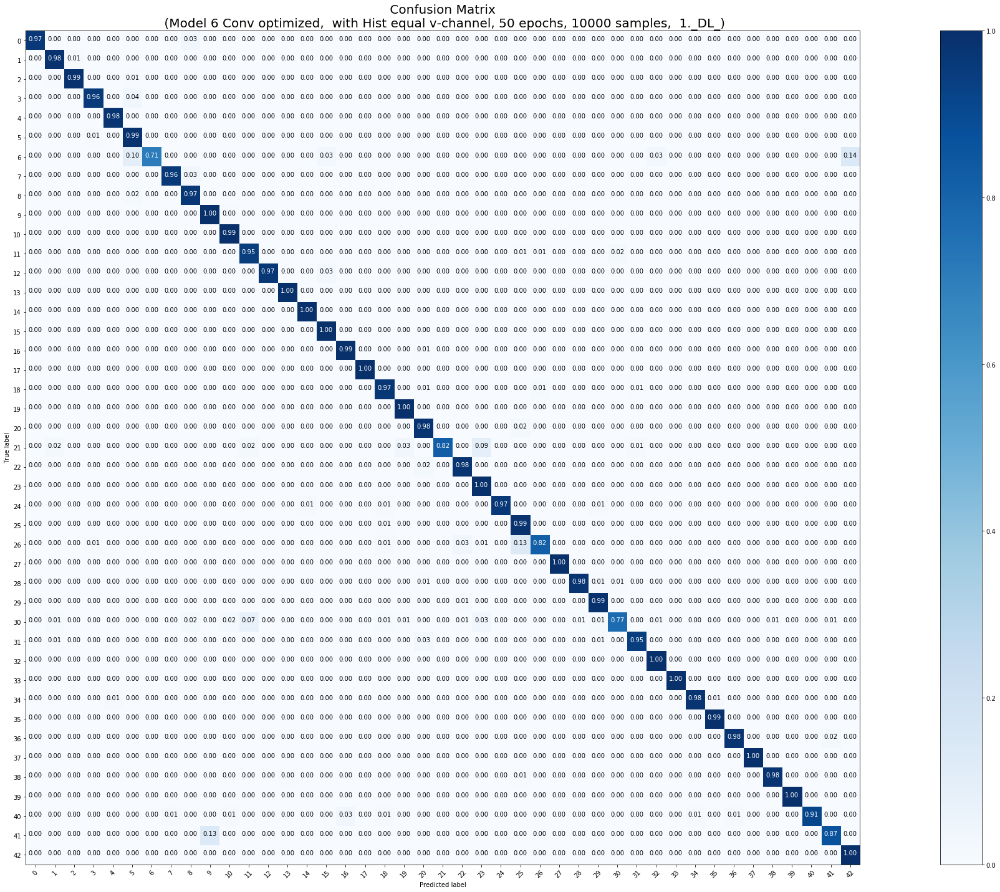

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 16s 2ms/step - loss: 2.8340 - acc: 0.2719 - val_loss: 1.1408 - val_acc: 0.6760
Epoch 2/300
9000/9000 [==============================] - 5s 503us/step - loss: 1.2692 - acc: 0.5959 - val_loss: 0.5844 - val_acc: 0.8520
Epoch 3/300
9000/9000 [==============================] - 4s 500us/step - loss: 0.7472 - acc: 0.7498 - val_loss: 0.3911 - val_acc: 0.8960
Epoch 4/300
9000/9000 [==============================] - 4s 500us/step - loss: 0.5072 - acc: 0.8300 - val_loss: 0.2778 - val_acc: 0.9290
Epoch 5/300
9000/9000 [==============================] - 5s 506us/step - loss: 0.3688 - acc: 0.8751 - val_loss: 0.2119 - val_acc: 0.9470
Epoch 6/300
9000/9000 [==============================] - 5s 519us/step - loss: 0.2824 - acc: 0.9058 - val_loss: 0.1668 - val_acc: 0.9550
Epoch 7/3

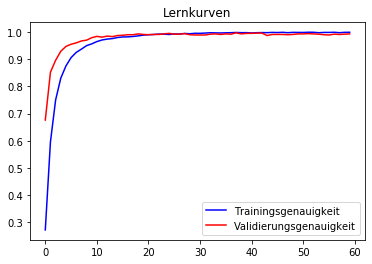

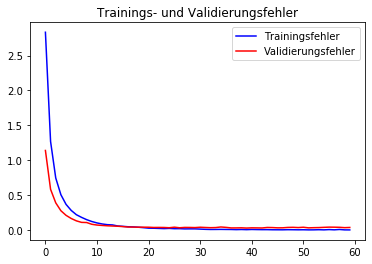

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        60
           1       0.98      0.98      0.98       720
           2       0.99      0.99      0.99       750
           3       0.99      0.97      0.98       450
           4       0.99      0.98      0.98       660
           5       0.94      0.99      0.96       630
           6       1.00      0.67      0.80       150
           7       0.99      0.96      0.98       450
           8       0.95      0.95      0.95       450
           9       1.00      0.99      1.00       480
          10       0.99      0.99      0.99       660
          11       0.96      0.97      0.96       420
          12       1.00      0.99      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.98      1.00      0.99       210
          16       1.00      0.99      0.99       

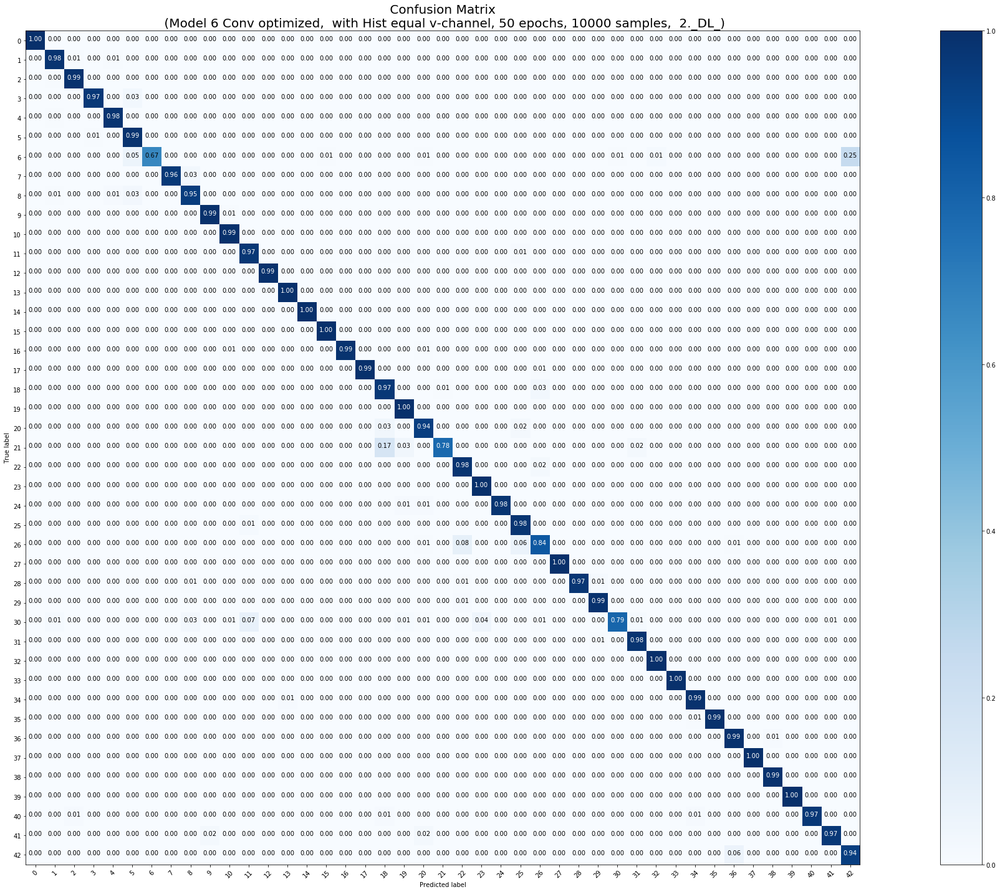

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 15s 2ms/step - loss: 2.9085 - acc: 0.2547 - val_loss: 1.1720 - val_acc: 0.6610
Epoch 2/300
9000/9000 [==============================] - 5s 513us/step - loss: 1.2936 - acc: 0.5989 - val_loss: 0.6116 - val_acc: 0.8410
Epoch 3/300
9000/9000 [==============================] - 4s 493us/step - loss: 0.7799 - acc: 0.7420 - val_loss: 0.4347 - val_acc: 0.8910
Epoch 4/300
9000/9000 [==============================] - 4s 494us/step - loss: 0.5365 - acc: 0.8206 - val_loss: 0.2984 - val_acc: 0.9190
Epoch 5/300
9000/9000 [==============================] - 5s 518us/step - loss: 0.3732 - acc: 0.8737 - val_loss: 0.2110 - val_acc: 0.9510
Epoch 6/300
9000/9000 [==============================] - 5s 525us/step - loss: 0.2937 - acc: 0.9029 - val_loss: 0.1797 - val_acc: 0.9520
Epoch 7/3

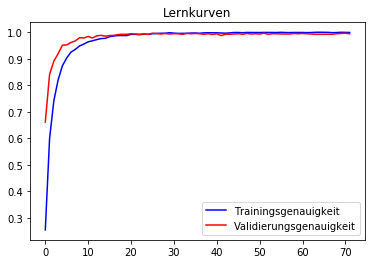

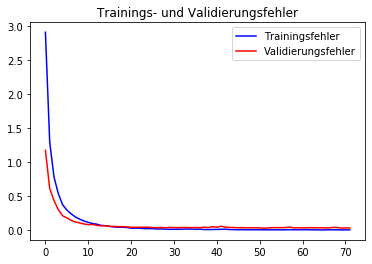

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.98      0.99      0.98       720
           2       0.99      0.99      0.99       750
           3       0.99      0.98      0.98       450
           4       0.99      0.98      0.99       660
           5       0.94      0.98      0.96       630
           6       1.00      0.69      0.82       150
           7       0.98      0.98      0.98       450
           8       0.97      0.97      0.97       450
           9       1.00      0.99      0.99       480
          10       0.99      0.99      0.99       660
          11       0.94      0.98      0.96       420
          12       1.00      0.99      1.00       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.98      1.00      0.99       210
          16       0.99      0.99      0.99       

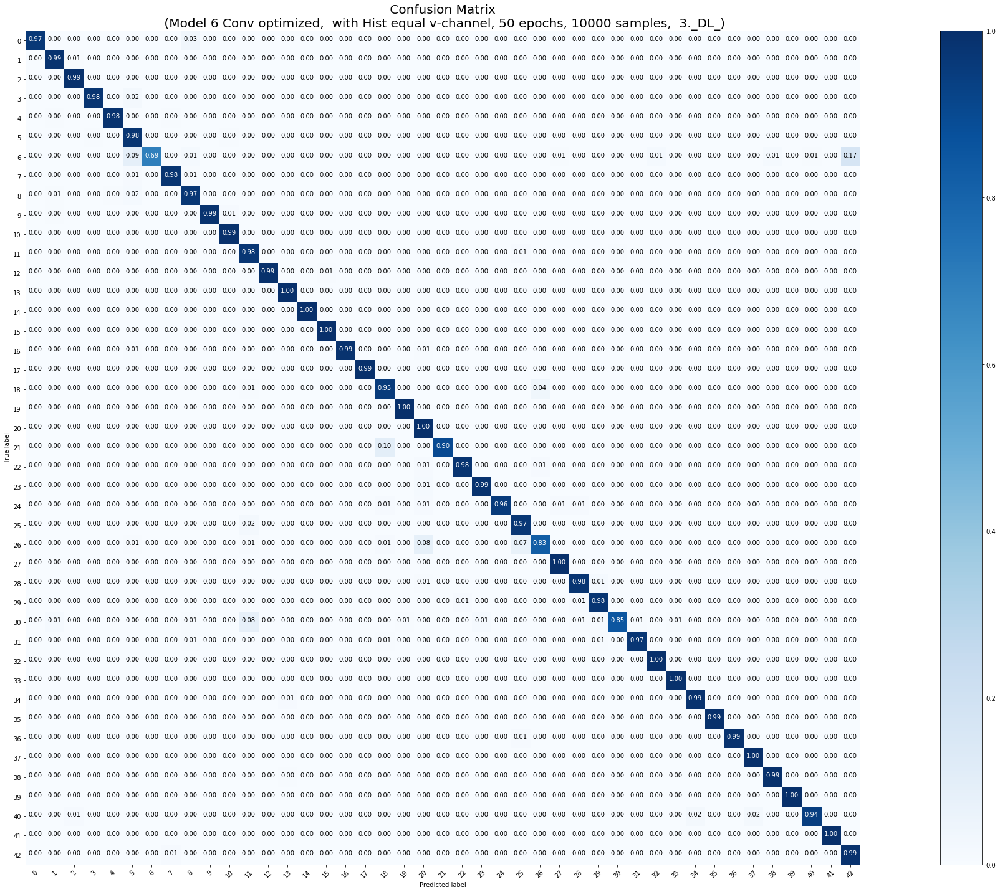

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 16s 2ms/step - loss: 2.8651 - acc: 0.2524 - val_loss: 1.2425 - val_acc: 0.6320
Epoch 2/300
9000/9000 [==============================] - 4s 486us/step - loss: 1.3062 - acc: 0.5824 - val_loss: 0.6060 - val_acc: 0.8380
Epoch 3/300
9000/9000 [==============================] - 4s 487us/step - loss: 0.7955 - acc: 0.7393 - val_loss: 0.3945 - val_acc: 0.8910
Epoch 4/300
9000/9000 [==============================] - 4s 486us/step - loss: 0.5308 - acc: 0.8227 - val_loss: 0.3021 - val_acc: 0.9160
Epoch 5/300
9000/9000 [==============================] - 4s 495us/step - loss: 0.3744 - acc: 0.8759 - val_loss: 0.2236 - val_acc: 0.9350
Epoch 6/300
9000/9000 [==============================] - 4s 485us/step - loss: 0.3081 - acc: 0.8987 - val_loss: 0.1600 - val_acc: 0.9570
Epoch 7/3

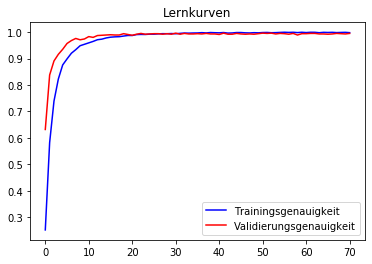

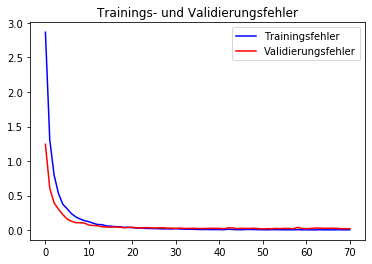

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        60
           1       0.97      0.98      0.98       720
           2       0.98      1.00      0.99       750
           3       1.00      0.94      0.97       450
           4       0.99      0.99      0.99       660
           5       0.94      0.98      0.96       630
           6       0.99      0.70      0.82       150
           7       0.99      0.98      0.98       450
           8       0.98      0.97      0.97       450
           9       0.97      0.99      0.98       480
          10       0.99      0.99      0.99       660
          11       0.97      0.98      0.98       420
          12       1.00      0.98      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.93      1.00      0.96       210
          16       1.00      0.99      1.00       

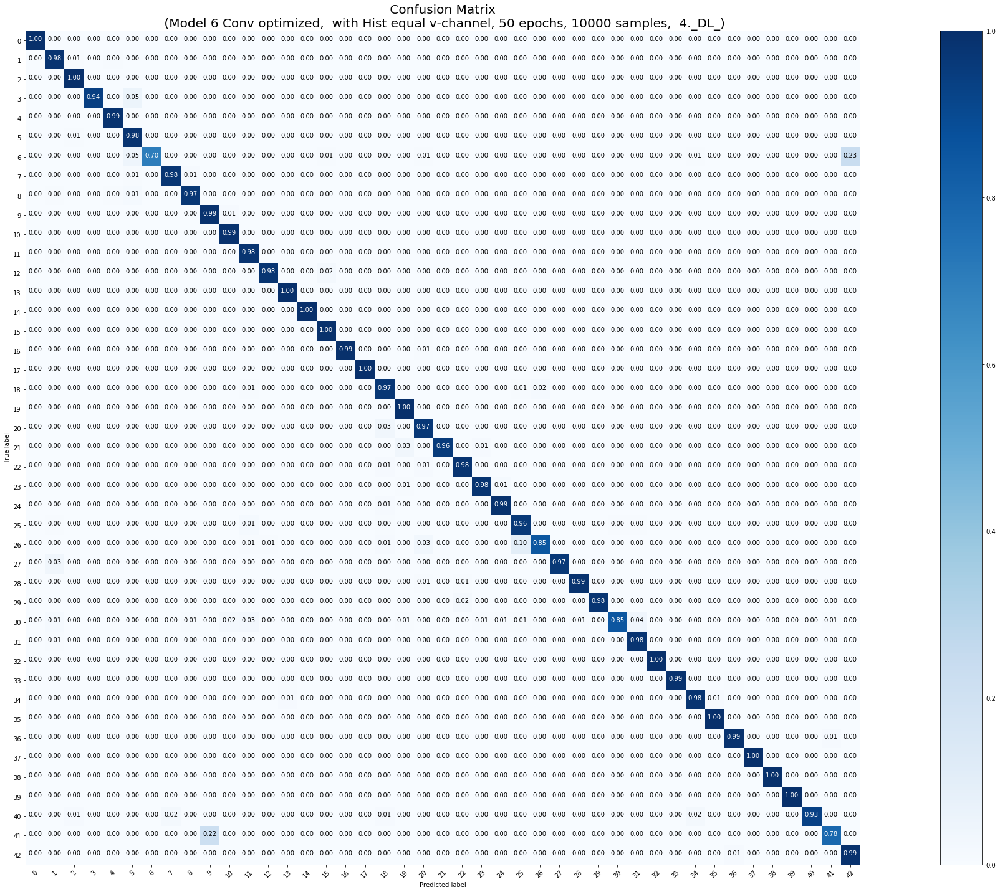

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 16s 2ms/step - loss: 2.9027 - acc: 0.2591 - val_loss: 1.2791 - val_acc: 0.6330
Epoch 2/300
9000/9000 [==============================] - 5s 504us/step - loss: 1.3398 - acc: 0.5861 - val_loss: 0.6734 - val_acc: 0.8190
Epoch 3/300
9000/9000 [==============================] - 5s 504us/step - loss: 0.7945 - acc: 0.7299 - val_loss: 0.3644 - val_acc: 0.9150
Epoch 4/300
9000/9000 [==============================] - 5s 501us/step - loss: 0.5277 - acc: 0.8196 - val_loss: 0.2764 - val_acc: 0.9310
Epoch 5/300
9000/9000 [==============================] - 5s 501us/step - loss: 0.3706 - acc: 0.8724 - val_loss: 0.2013 - val_acc: 0.9500
Epoch 6/300
9000/9000 [==============================] - 5s 525us/step - loss: 0.2808 - acc: 0.9054 - val_loss: 0.1510 - val_acc: 0.9610
Epoch 7/3

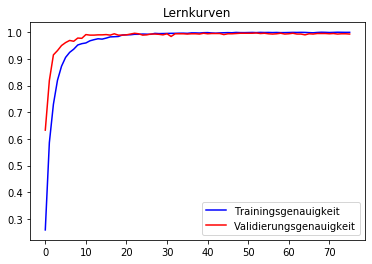

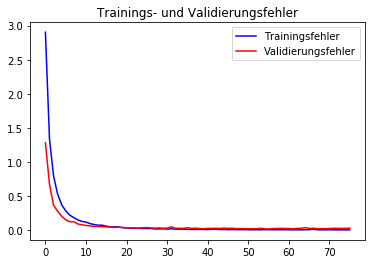

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.93      0.97        60
           1       0.98      0.97      0.98       720
           2       0.98      1.00      0.99       750
           3       1.00      0.94      0.97       450
           4       0.99      0.98      0.99       660
           5       0.91      0.99      0.95       630
           6       0.99      0.68      0.81       150
           7       0.98      0.96      0.97       450
           8       0.96      0.96      0.96       450
           9       1.00      0.99      0.99       480
          10       0.99      0.99      0.99       660
          11       0.98      0.96      0.97       420
          12       1.00      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.96      1.00      0.98       210
          16       0.99      0.99      0.99       

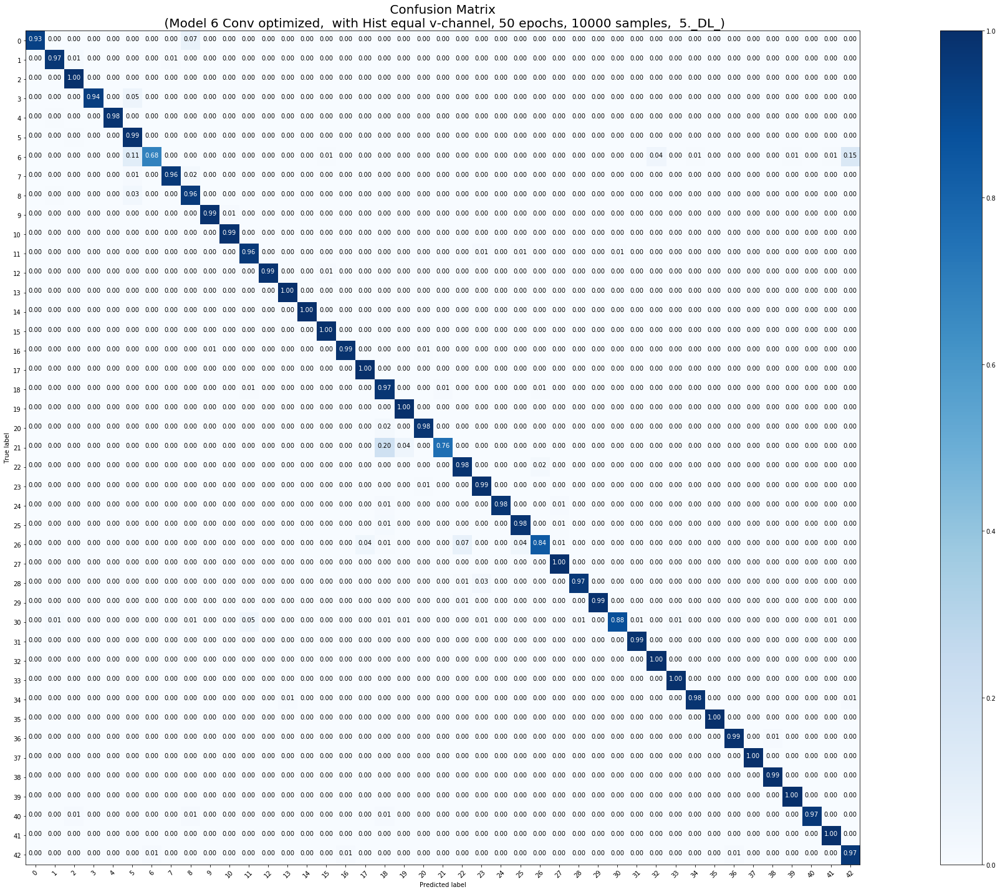

Die durchschnittliche Epochenanzahl beträgt:  50.8


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 10000
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_10000, y_tr_10000, X_test, y_test, 0.3, 0.0001, False, 300, 10000)

In [0]:
downloader(1,5, 10000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 










Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Modell wurde erzeugt
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/300
282/282 [==============================] - 17s 62ms/step - loss: 3.4412 - acc: 0.1572 - val_loss: 1.6805 - val_acc: 0.4930
Epoch 2/300
282/282 [==============================] - 9s 33ms/step - loss: 2.2106 - acc: 0.3640 - val_loss: 1.0669 - val_acc: 0.6750
Epoch 3/300
282/282 [==============================] - 10s 34ms/step - loss: 1.7347 - acc: 0.4645 - val_loss: 0.7949 - val_acc: 0.7460
Epoch 4/300
282/282 [==============================] - 10s 35ms/step - loss: 1.3457 - acc: 0.5663 - val_loss: 0.5388 - val_acc: 0.8430
Epoch 5/300
282/282 [==============================] - 10s 34ms/step - loss: 1.1475 - acc: 0.61

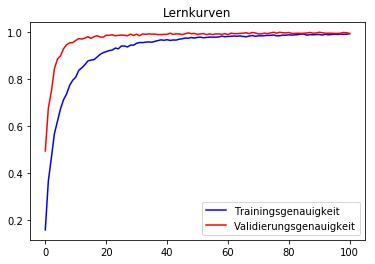

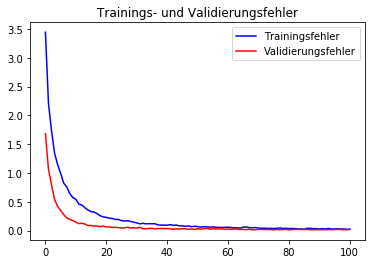

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       1.00      0.98      0.99       720
           2       0.99      1.00      0.99       750
           3       1.00      0.99      0.99       450
           4       0.99      0.99      0.99       660
           5       0.98      0.99      0.99       630
           6       1.00      0.78      0.88       150
           7       0.99      0.99      0.99       450
           8       0.98      0.98      0.98       450
           9       0.99      1.00      1.00       480
          10       1.00      1.00      1.00       660
          11       0.96      0.99      0.98       420
          12       1.00      0.98      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.92      1.00      0.96       210
          16       1.00      0.99      1.00       

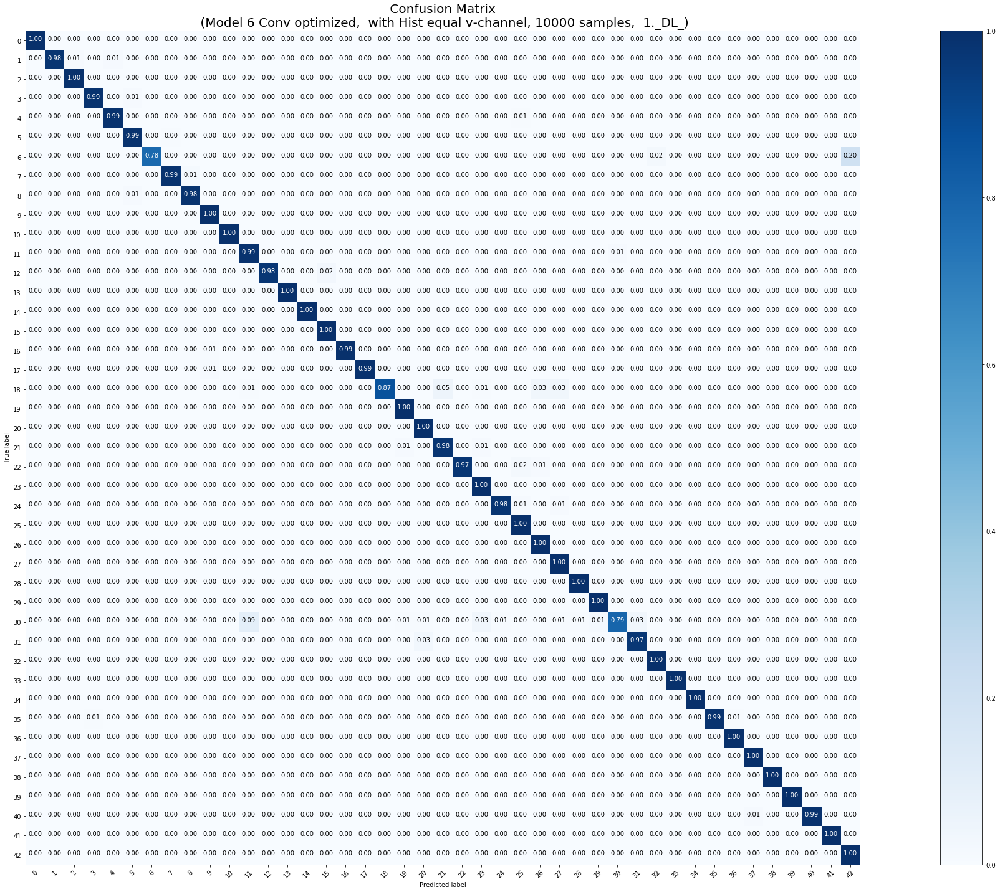

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 12s 41ms/step - loss: 3.4738 - acc: 0.1479 - val_loss: 1.7561 - val_acc: 0.4630
Epoch 2/300
282/282 [==============================] - 9s 33ms/step - loss: 2.3415 - acc: 0.3371 - val_loss: 1.2153 - val_acc: 0.6310
Epoch 3/300
282/282 [==============================] - 10s 34ms/step - loss: 1.7681 - acc: 0.4561 - val_loss: 0.8194 - val_acc: 0.7460
Epoch 4/300
282/282 [==============================] - 10s 34ms/step - loss: 1.4290 - acc: 0.5468 - val_loss: 0.6212 - val_acc: 0.8020
Epoch 5/300
282/282 [==============================] - 9s 34ms/step - loss: 1.2220 - acc: 0.6016 - val_loss: 0.6082 - val_acc: 0.8130
Epoch 6/300
282/282 [==============================] - 10s 34ms/step - loss: 1.0458 - acc: 0.6479 - val_loss: 0.3942 - val_acc: 0.8770
Epoch 7/300
282/282 [============================

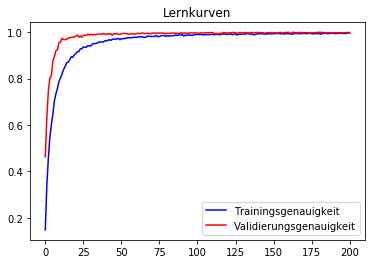

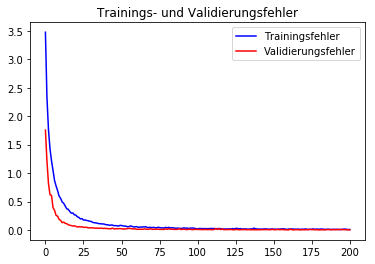

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      1.00      1.00       720
           2       1.00      0.99      1.00       750
           3       0.99      0.98      0.99       450
           4       1.00      0.99      1.00       660
           5       0.98      0.99      0.99       630
           6       1.00      0.77      0.87       150
           7       0.99      0.99      0.99       450
           8       0.99      1.00      0.99       450
           9       1.00      1.00      1.00       480
          10       1.00      1.00      1.00       660
          11       0.96      0.98      0.97       420
          12       1.00      0.99      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.97      1.00      0.99       210
          16       1.00      0.99      1.00       

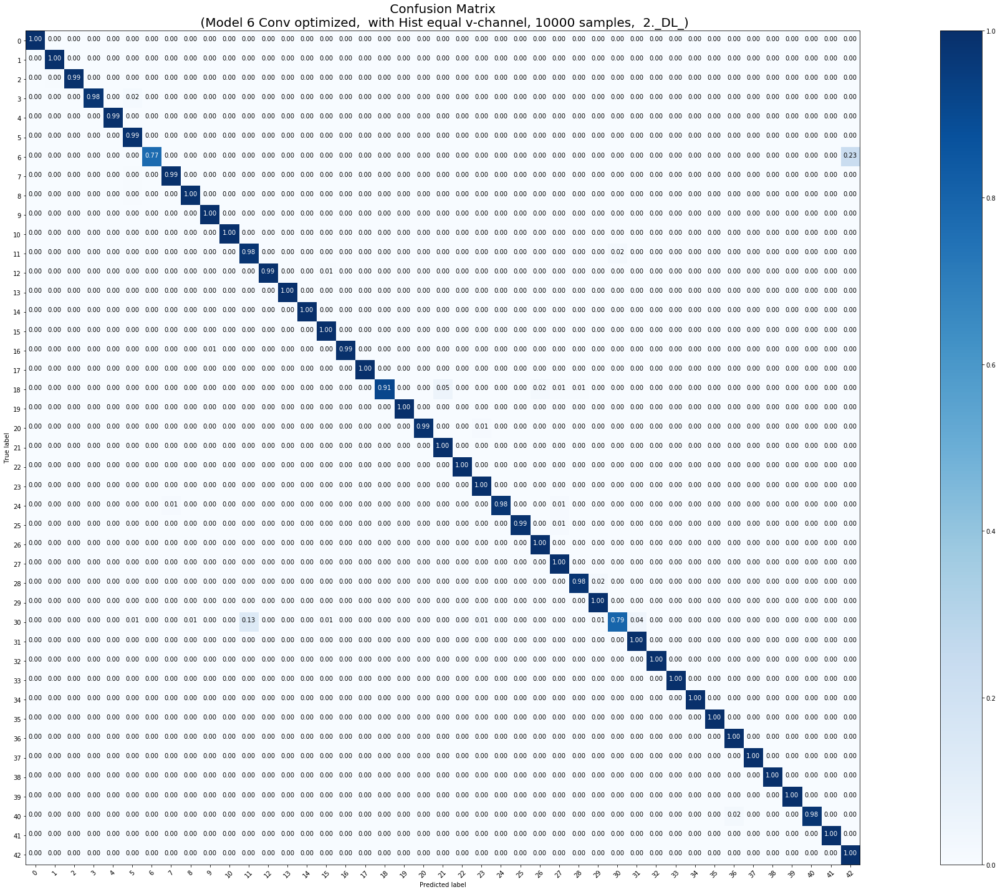

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 12s 43ms/step - loss: 3.4239 - acc: 0.1550 - val_loss: 1.8016 - val_acc: 0.4750
Epoch 2/300
282/282 [==============================] - 10s 34ms/step - loss: 2.2650 - acc: 0.3495 - val_loss: 1.1404 - val_acc: 0.6410
Epoch 3/300
282/282 [==============================] - 10s 34ms/step - loss: 1.7792 - acc: 0.4607 - val_loss: 0.9024 - val_acc: 0.7220
Epoch 4/300
282/282 [==============================] - 10s 34ms/step - loss: 1.4326 - acc: 0.5475 - val_loss: 0.6455 - val_acc: 0.8030
Epoch 5/300
282/282 [==============================] - 10s 34ms/step - loss: 1.2176 - acc: 0.6063 - val_loss: 0.5524 - val_acc: 0.8430
Epoch 6/300
282/282 [==============================] - 10s 34ms/step - loss: 1.0487 - acc: 0.6525 - val_loss: 0.4371 - val_acc: 0.8840
Epoch 7/300
282/282 [==========================

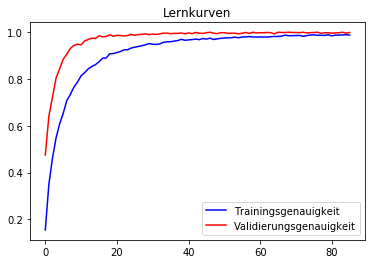

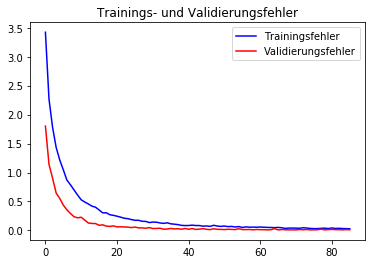

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.93      0.96        60
           1       0.99      0.99      0.99       720
           2       0.99      0.99      0.99       750
           3       0.99      0.94      0.96       450
           4       1.00      0.98      0.99       660
           5       0.93      0.99      0.96       630
           6       1.00      0.85      0.92       150
           7       0.99      0.99      0.99       450
           8       0.97      0.97      0.97       450
           9       1.00      1.00      1.00       480
          10       1.00      0.99      0.99       660
          11       0.99      0.98      0.98       420
          12       1.00      0.97      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.92      1.00      0.96       210
          16       0.97      0.99      0.98       

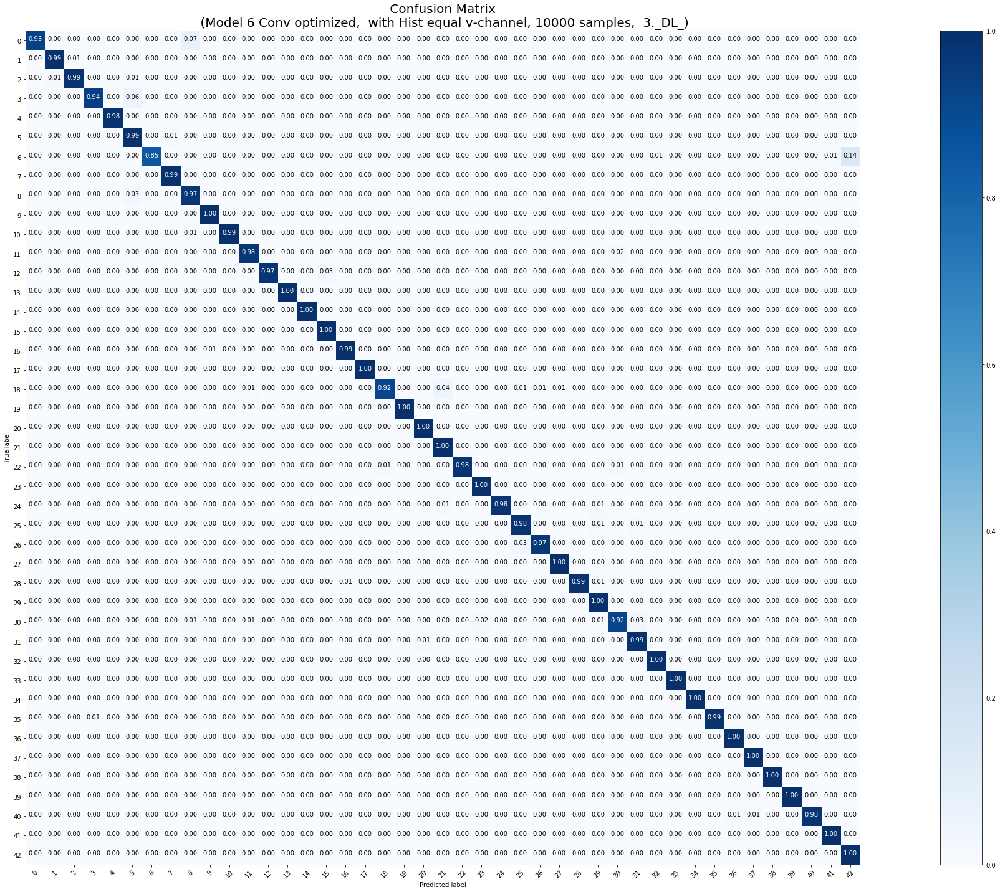

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 12s 44ms/step - loss: 3.4462 - acc: 0.1427 - val_loss: 1.7018 - val_acc: 0.4850
Epoch 2/300
282/282 [==============================] - 9s 33ms/step - loss: 2.2917 - acc: 0.3416 - val_loss: 1.1405 - val_acc: 0.6680
Epoch 3/300
282/282 [==============================] - 10s 34ms/step - loss: 1.7595 - acc: 0.4522 - val_loss: 0.8499 - val_acc: 0.7410
Epoch 4/300
282/282 [==============================] - 9s 34ms/step - loss: 1.4805 - acc: 0.5307 - val_loss: 0.6244 - val_acc: 0.8110
Epoch 5/300
282/282 [==============================] - 10s 34ms/step - loss: 1.2214 - acc: 0.5870 - val_loss: 0.4775 - val_acc: 0.8580
Epoch 6/300
282/282 [==============================] - 10s 34ms/step - loss: 1.0645 - acc: 0.6310 - val_loss: 0.4074 - val_acc: 0.8810
Epoch 7/300
282/282 [============================

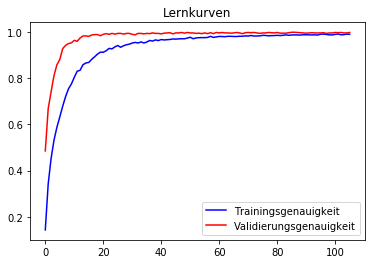

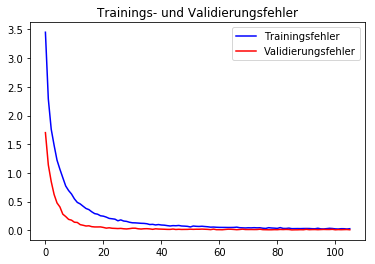

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      1.00      0.99       720
           2       1.00      0.99      0.99       750
           3       0.99      0.96      0.97       450
           4       1.00      0.99      0.99       660
           5       0.96      0.99      0.97       630
           6       1.00      0.91      0.95       150
           7       1.00      0.99      1.00       450
           8       0.99      0.98      0.98       450
           9       1.00      1.00      1.00       480
          10       1.00      1.00      1.00       660
          11       0.99      0.96      0.98       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       1.00      1.00      1.00       210
          16       0.99      0.99      0.99       

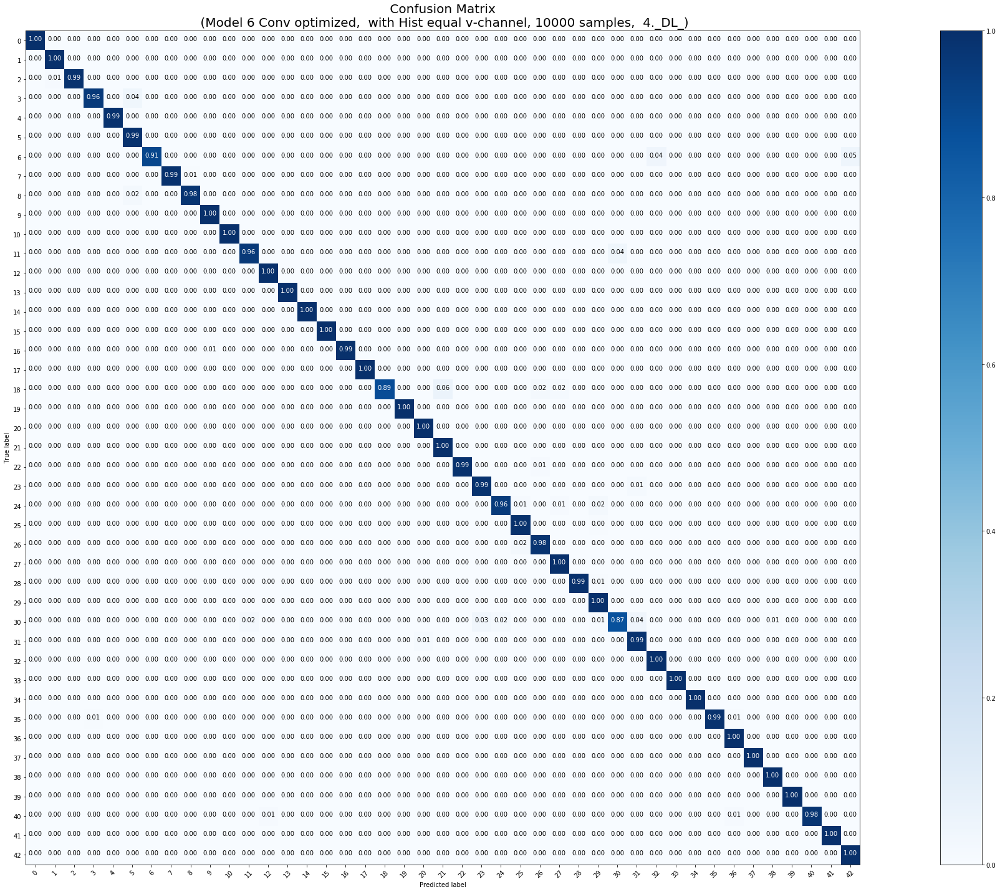

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 13s 44ms/step - loss: 3.4533 - acc: 0.1435 - val_loss: 1.6078 - val_acc: 0.5520
Epoch 2/300
282/282 [==============================] - 9s 33ms/step - loss: 2.2651 - acc: 0.3452 - val_loss: 1.1631 - val_acc: 0.6410
Epoch 3/300
282/282 [==============================] - 10s 35ms/step - loss: 1.7577 - acc: 0.4516 - val_loss: 0.8634 - val_acc: 0.7230
Epoch 4/300
282/282 [==============================] - 10s 34ms/step - loss: 1.4474 - acc: 0.5330 - val_loss: 0.6595 - val_acc: 0.8040
Epoch 5/300
282/282 [==============================] - 10s 34ms/step - loss: 1.2040 - acc: 0.5929 - val_loss: 0.4468 - val_acc: 0.8890
Epoch 6/300
282/282 [==============================] - 10s 34ms/step - loss: 1.0356 - acc: 0.6471 - val_loss: 0.3582 - val_acc: 0.9100
Epoch 7/300
282/282 [===========================

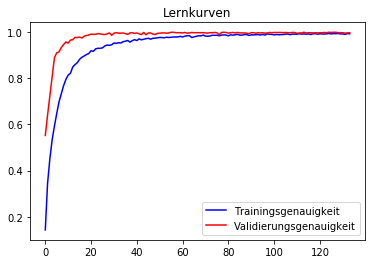

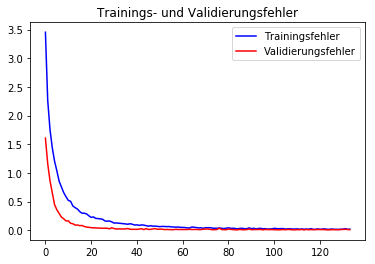

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      1.00      1.00       720
           2       1.00      0.99      1.00       750
           3       1.00      0.96      0.98       450
           4       0.99      1.00      0.99       660
           5       0.95      0.99      0.97       630
           6       1.00      0.85      0.92       150
           7       0.99      0.99      0.99       450
           8       0.98      0.97      0.97       450
           9       1.00      1.00      1.00       480
          10       1.00      0.99      1.00       660
          11       0.98      0.92      0.95       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.99      1.00      0.99       210
          16       1.00      0.99      1.00       

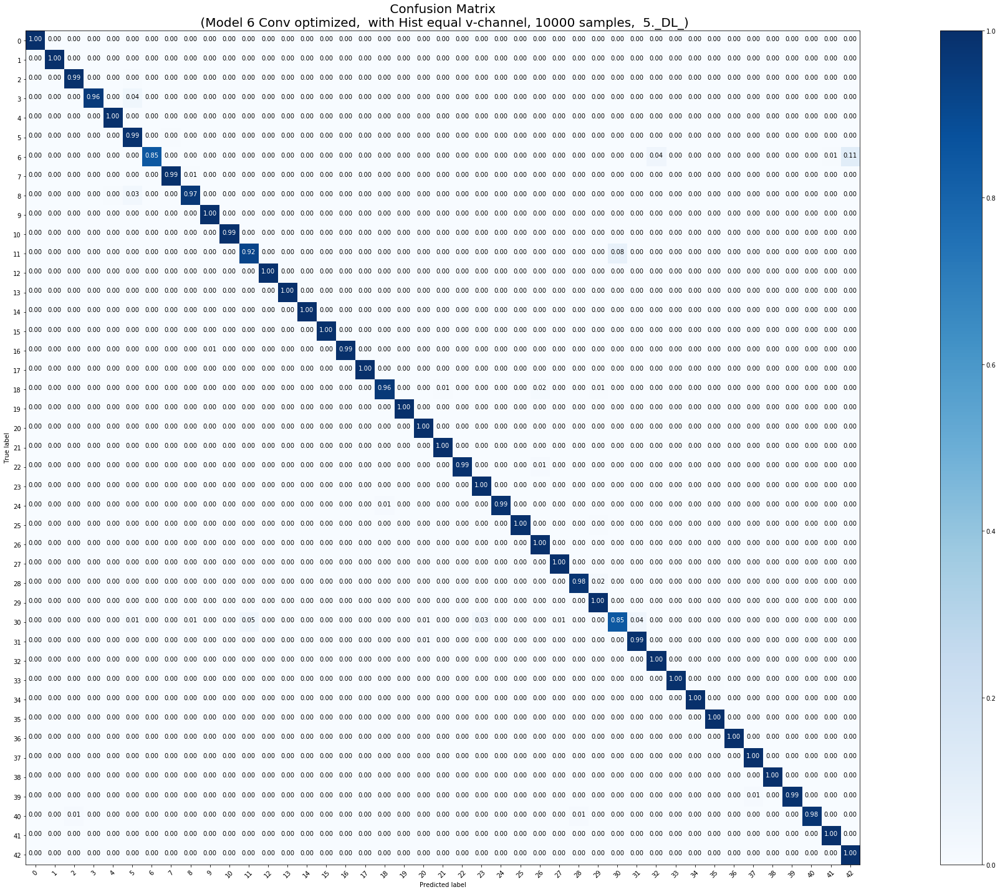

Die durchschnittliche Epochenanzahl beträgt:  105.6


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 10000    
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_10000, y_tr_10000, X_test, y_test, 0.3, 0.0001, False, 300, 10000)

In [0]:
downloader(1,5, 10000)

In [0]:
###########################################################################################################
###########################################################################################################
#########   Wiederholtes Training mit optimierten Hyperparametern unter Verwendung von
#########   EarlyStopping und class-weights=balanced,  
#########   3. Aufteilung der Trainingsdaten,    
###########################################################################################################
########################################################################################################### 
X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200 = make_training_subsets_C(X_train, y_train)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 10s 5ms/step - loss: 2.9982 - acc: 0.2789 - val_loss: 1.7401 - val_acc: 0.5150
Epoch 2/300
1800/1800 [==============================] - 1s 628us/step - loss: 1.2341 - acc: 0.6367 - val_loss: 1.3379 - val_acc: 0.6000
Epoch 3/300
1800/1800 [==============================] - 1s 619us/step - loss: 0.6501 - acc: 0.7794 - val_loss: 0.4361 - val_acc: 0.8600
Epoch 4/300
1800/1800 [==============================] - 1s 610us/step - loss: 0.3307 - acc: 0.8844 - val_loss: 0.4445 - val_acc: 0.8650
Epoch 5/300
1800/1800 [==============================] - 1s 605us/step - loss: 0.2383 - acc: 0.9089 - val_loss: 0.2985 - val_acc: 0.9200
Epoch 6/300
1800/1800 [==============================] - 1s 610us/step - loss: 0.1457 - acc: 0.9433 - val_loss: 0.2101 - val_a

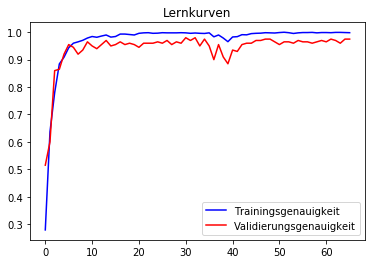

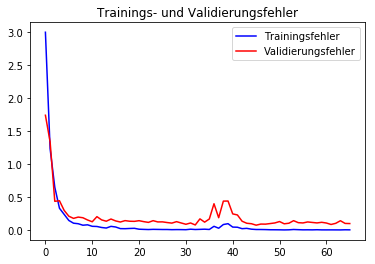

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.96      0.80      0.87        60
           1       0.97      0.95      0.96       720
           2       0.97      0.99      0.98       750
           3       0.96      0.97      0.97       450
           4       0.96      0.97      0.97       660
           5       0.93      0.97      0.95       630
           6       0.98      0.70      0.82       150
           7       0.96      0.95      0.96       450
           8       0.97      0.95      0.96       450
           9       0.99      0.99      0.99       480
          10       0.98      0.96      0.97       660
          11       0.90      0.94      0.92       420
          12       1.00      0.99      1.00       690
          13       0.99      1.00      0.99       720
          14       1.00      0.99      0.99       270
          15       0.98      1.00      0.99       210
          16       0.97      0.96      0.97       

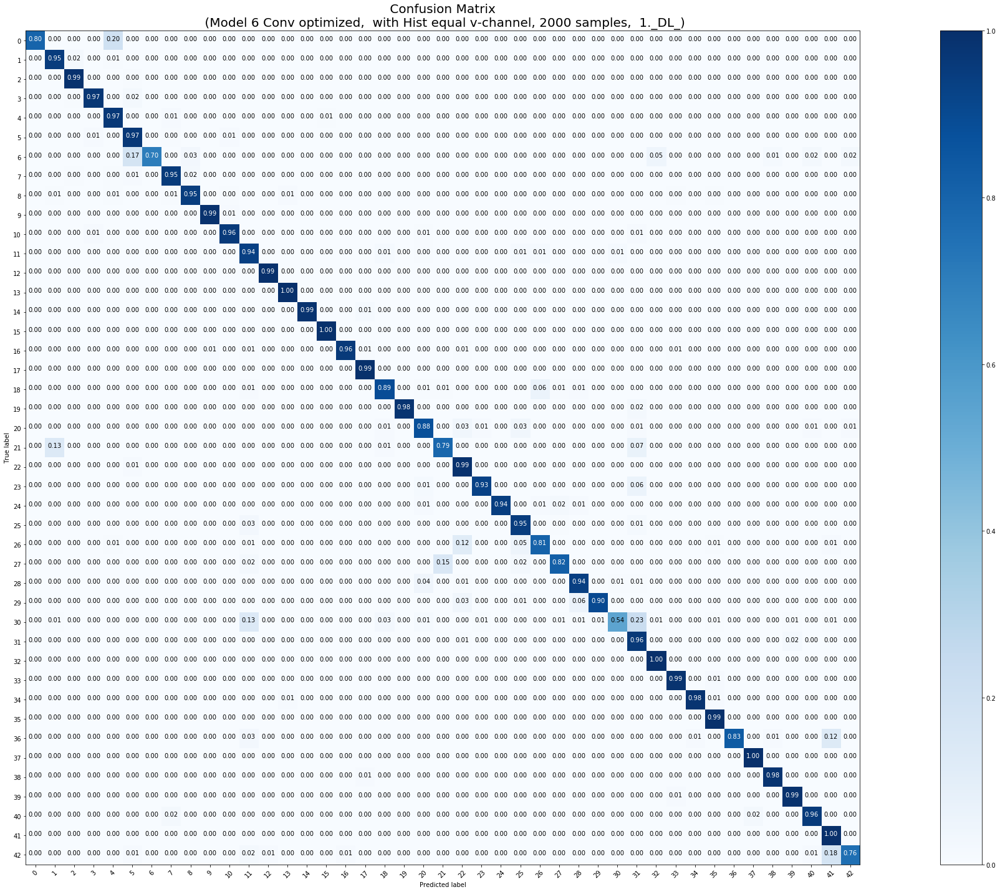

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 10s 6ms/step - loss: 2.8670 - acc: 0.3222 - val_loss: 1.4139 - val_acc: 0.5750
Epoch 2/300
1800/1800 [==============================] - 1s 602us/step - loss: 1.0443 - acc: 0.6711 - val_loss: 0.8106 - val_acc: 0.7750
Epoch 3/300
1800/1800 [==============================] - 1s 613us/step - loss: 0.5615 - acc: 0.8000 - val_loss: 0.6429 - val_acc: 0.8450
Epoch 4/300
1800/1800 [==============================] - 1s 584us/step - loss: 0.3393 - acc: 0.8739 - val_loss: 0.5717 - val_acc: 0.8500
Epoch 5/300
1800/1800 [==============================] - 1s 625us/step - loss: 0.2271 - acc: 0.9150 - val_loss: 0.3665 - val_acc: 0.9200
Epoch 6/300
1800/1800 [==============================] - 1s 608us/step - loss: 0.1581 - acc: 0.9372 - val_loss: 0.3361 - val_a

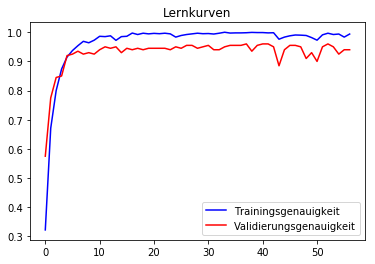

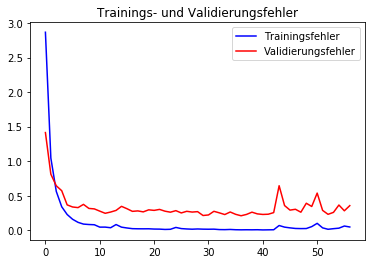

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        60
           1       0.96      0.95      0.96       720
           2       0.94      0.99      0.97       750
           3       0.99      0.80      0.88       450
           4       0.99      0.94      0.97       660
           5       0.78      0.99      0.87       630
           6       0.98      0.64      0.77       150
           7       0.97      0.94      0.95       450
           8       0.95      0.93      0.94       450
           9       0.96      0.98      0.97       480
          10       0.98      0.98      0.98       660
          11       0.94      0.87      0.90       420
          12       0.99      0.95      0.97       690
          13       0.96      1.00      0.98       720
          14       1.00      1.00      1.00       270
          15       0.88      1.00      0.94       210
          16       0.99      0.97      0.98       

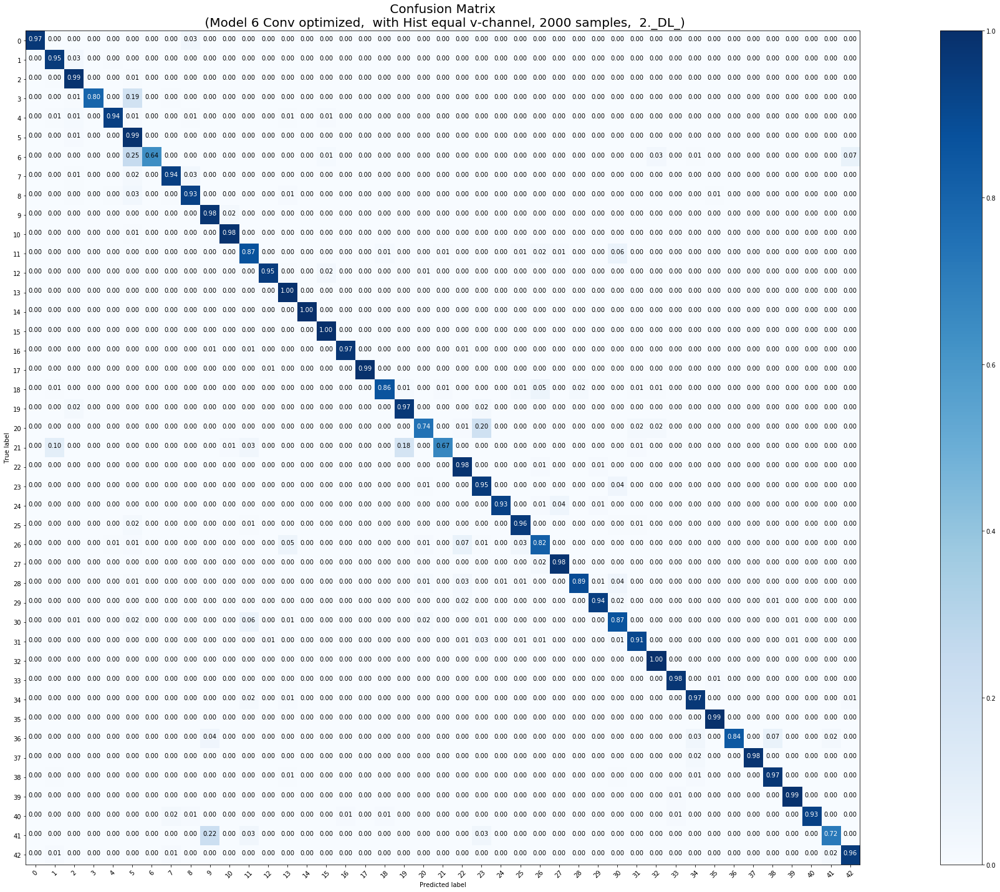

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 11s 6ms/step - loss: 2.8751 - acc: 0.2928 - val_loss: 1.7857 - val_acc: 0.5700
Epoch 2/300
1800/1800 [==============================] - 1s 612us/step - loss: 1.0896 - acc: 0.6472 - val_loss: 0.7897 - val_acc: 0.7900
Epoch 3/300
1800/1800 [==============================] - 1s 597us/step - loss: 0.5510 - acc: 0.8183 - val_loss: 0.3005 - val_acc: 0.9250
Epoch 4/300
1800/1800 [==============================] - 1s 597us/step - loss: 0.3742 - acc: 0.8667 - val_loss: 0.2070 - val_acc: 0.9550
Epoch 5/300
1800/1800 [==============================] - 1s 620us/step - loss: 0.2386 - acc: 0.9139 - val_loss: 0.2302 - val_acc: 0.9150
Epoch 6/300
1800/1800 [==============================] - 1s 602us/step - loss: 0.1569 - acc: 0.9367 - val_loss: 0.1307 - val_a

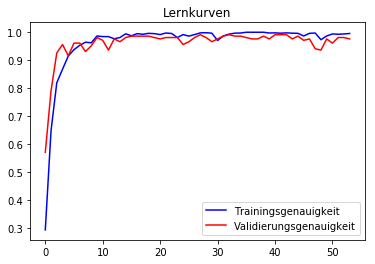

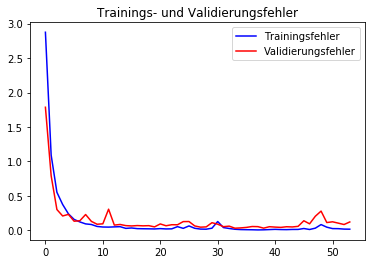

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.89      0.93      0.91        60
           1       0.96      0.95      0.96       720
           2       0.97      0.97      0.97       750
           3       0.97      0.96      0.97       450
           4       0.99      0.97      0.98       660
           5       0.84      0.97      0.90       630
           6       1.00      0.63      0.78       150
           7       0.95      0.95      0.95       450
           8       0.98      0.90      0.94       450
           9       0.97      0.97      0.97       480
          10       0.96      0.97      0.97       660
          11       0.94      0.95      0.94       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      0.97      0.99       270
          15       0.97      0.99      0.98       210
          16       0.95      0.99      0.97       

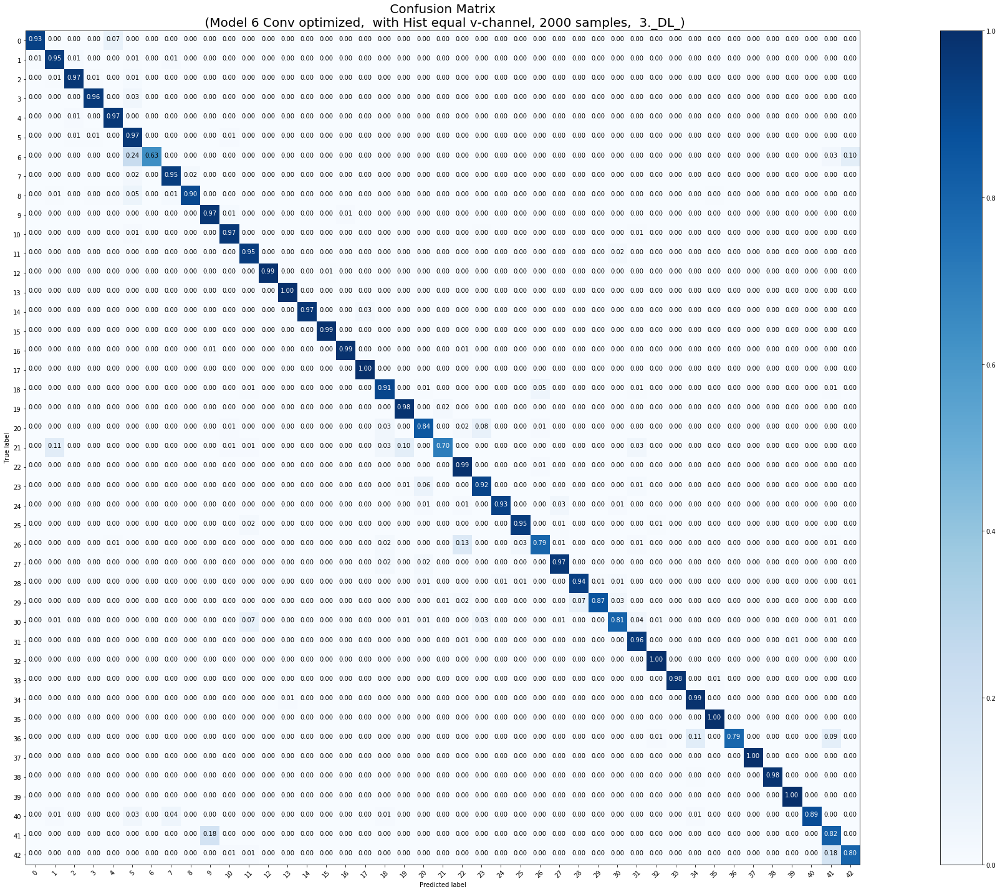

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 11s 6ms/step - loss: 2.8949 - acc: 0.2922 - val_loss: 2.3339 - val_acc: 0.4150
Epoch 2/300
1800/1800 [==============================] - 1s 605us/step - loss: 1.1896 - acc: 0.6550 - val_loss: 0.7684 - val_acc: 0.7150
Epoch 3/300
1800/1800 [==============================] - 1s 570us/step - loss: 0.5658 - acc: 0.7972 - val_loss: 0.4346 - val_acc: 0.8800
Epoch 4/300
1800/1800 [==============================] - 1s 617us/step - loss: 0.3812 - acc: 0.8644 - val_loss: 0.2602 - val_acc: 0.9000
Epoch 5/300
1800/1800 [==============================] - 1s 600us/step - loss: 0.2741 - acc: 0.9072 - val_loss: 0.4802 - val_acc: 0.8600
Epoch 6/300
1800/1800 [==============================] - 1s 606us/step - loss: 0.1696 - acc: 0.9317 - val_loss: 0.1732 - val_a

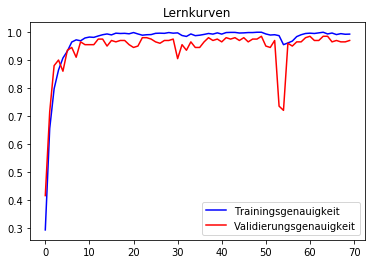

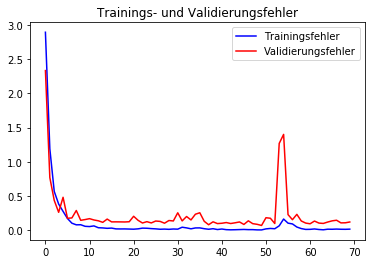

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.93      0.88      0.91        60
           1       0.95      0.96      0.96       720
           2       0.98      0.99      0.98       750
           3       0.97      0.93      0.95       450
           4       0.98      0.96      0.97       660
           5       0.89      0.97      0.92       630
           6       0.99      0.66      0.79       150
           7       0.91      0.95      0.93       450
           8       0.94      0.93      0.94       450
           9       0.98      0.96      0.97       480
          10       0.96      0.98      0.97       660
          11       0.90      0.97      0.93       420
          12       0.99      1.00      0.99       690
          13       0.98      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.98      0.99      0.98       210
          16       0.95      0.98      0.97       

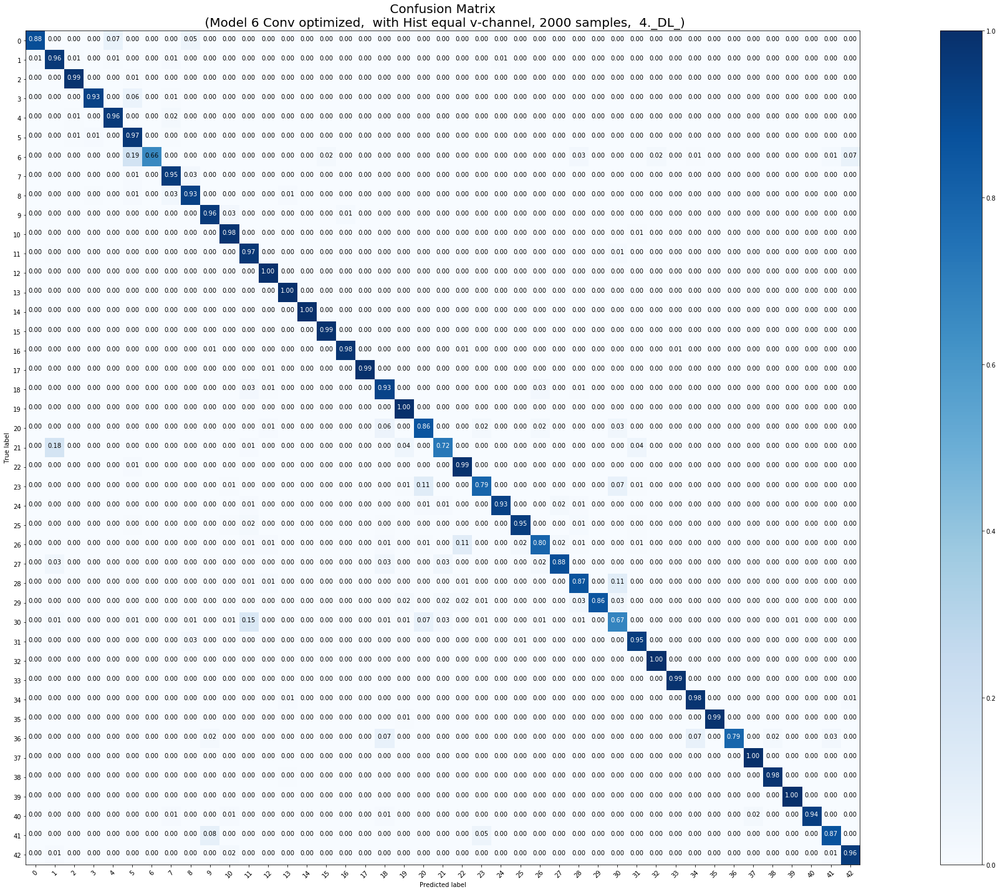

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 12s 6ms/step - loss: 2.9565 - acc: 0.2900 - val_loss: 1.3113 - val_acc: 0.6200
Epoch 2/300
1800/1800 [==============================] - 1s 604us/step - loss: 1.2133 - acc: 0.6322 - val_loss: 0.8479 - val_acc: 0.7500
Epoch 3/300
1800/1800 [==============================] - 1s 594us/step - loss: 0.5893 - acc: 0.7856 - val_loss: 0.4854 - val_acc: 0.8550
Epoch 4/300
1800/1800 [==============================] - 1s 611us/step - loss: 0.2983 - acc: 0.8878 - val_loss: 0.3314 - val_acc: 0.8850
Epoch 5/300
1800/1800 [==============================] - 1s 611us/step - loss: 0.2155 - acc: 0.9200 - val_loss: 0.3218 - val_acc: 0.8800
Epoch 6/300
1800/1800 [==============================] - 1s 598us/step - loss: 0.1511 - acc: 0.9433 - val_loss: 0.2710 - val_a

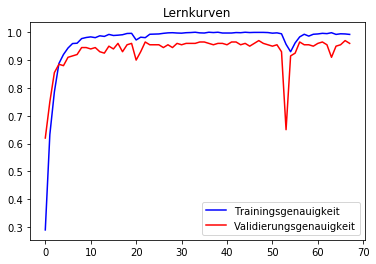

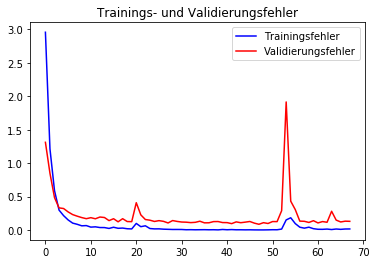

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        60
           1       0.96      0.96      0.96       720
           2       0.97      0.99      0.98       750
           3       0.99      0.90      0.94       450
           4       0.99      0.97      0.98       660
           5       0.89      0.97      0.93       630
           6       0.98      0.67      0.80       150
           7       0.93      0.97      0.95       450
           8       0.95      0.95      0.95       450
           9       0.95      0.99      0.97       480
          10       0.97      0.97      0.97       660
          11       0.95      0.96      0.96       420
          12       1.00      0.96      0.98       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.93      1.00      0.97       210
          16       1.00      0.97      0.99       

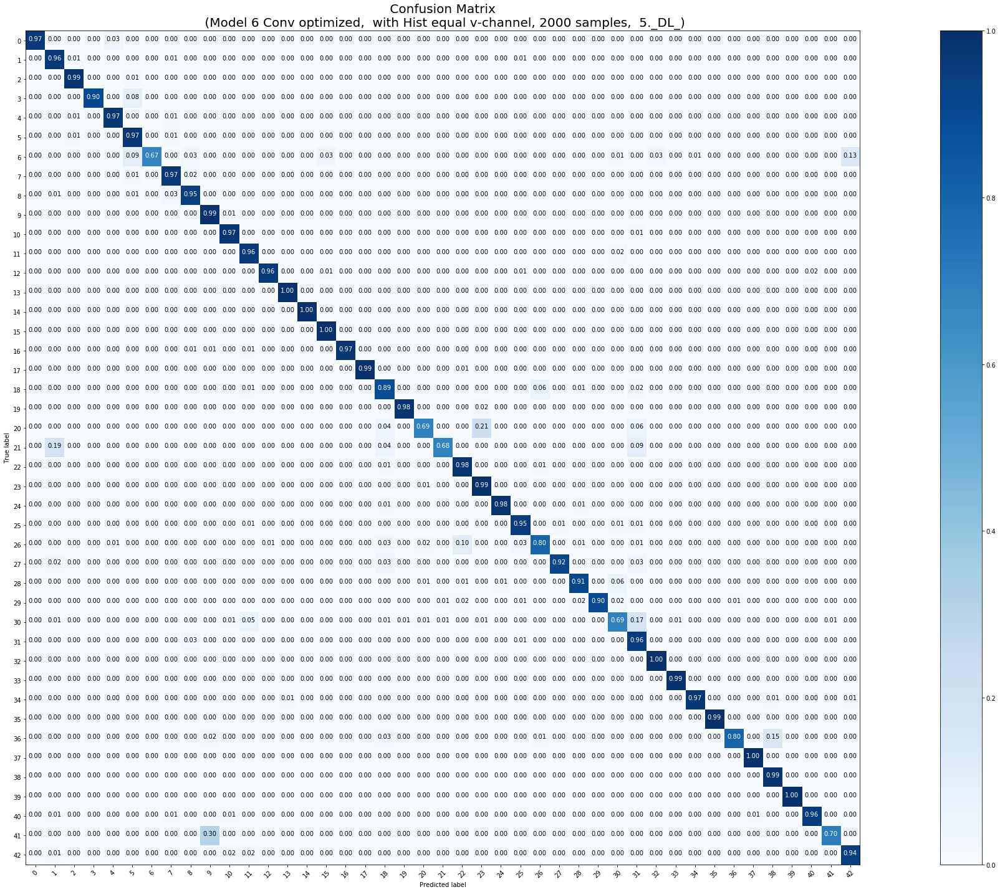

Die durchschnittliche Epochenanzahl beträgt:  43.0


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 2000
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_2000, y_tr_2000,X_test, y_test, 0.3, 0.001, False, 300, 2000)

In [0]:
downloader(1,5, 2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 13s 227ms/step - loss: 3.6248 - acc: 0.1688 - val_loss: 2.5704 - val_acc: 0.4000
Epoch 2/300
57/57 [==============================] - 2s 30ms/step - loss: 2.3313 - acc: 0.3519 - val_loss: 1.9260 - val_acc: 0.5200
Epoch 3/300
57/57 [==============================] - 2s 35ms/step - loss: 1.7770 - acc: 0.4743 - val_loss: 1.3448 - val_acc: 0.6550
Epoch 4/300
57/57 [==============================] - 2s 36ms/step - loss: 1.5336 - acc: 0.5285 - val_loss: 1.0620 - val_acc: 0.7150
Epoch 5/300
57/57 [==============================] - 2s 35ms/step - loss: 1.3824 - acc: 0.6031 - val_loss: 0.9132 - val_acc: 0.7450
Epoch 6/300
57/57 [==============================] - 2s 35ms/step - loss: 1.0461 - acc: 0.6524 - val_loss: 0.9218 - val_acc: 0.7400
Epoch 7/300
57/57 [==============================] - 2s 36ms/st

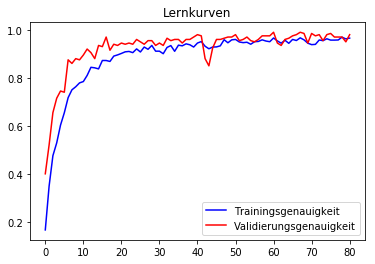

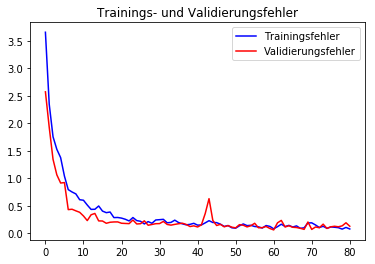

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        60
           1       0.99      0.99      0.99       720
           2       0.98      0.99      0.98       750
           3       0.95      0.92      0.94       450
           4       1.00      0.98      0.99       660
           5       0.87      0.98      0.92       630
           6       1.00      0.83      0.91       150
           7       1.00      0.91      0.95       450
           8       0.92      0.94      0.93       450
           9       0.94      0.98      0.96       480
          10       0.99      0.96      0.98       660
          11       0.97      0.92      0.94       420
          12       0.99      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      0.99      0.99       270
          15       0.88      1.00      0.94       210
          16       0.99      0.99      0.99       

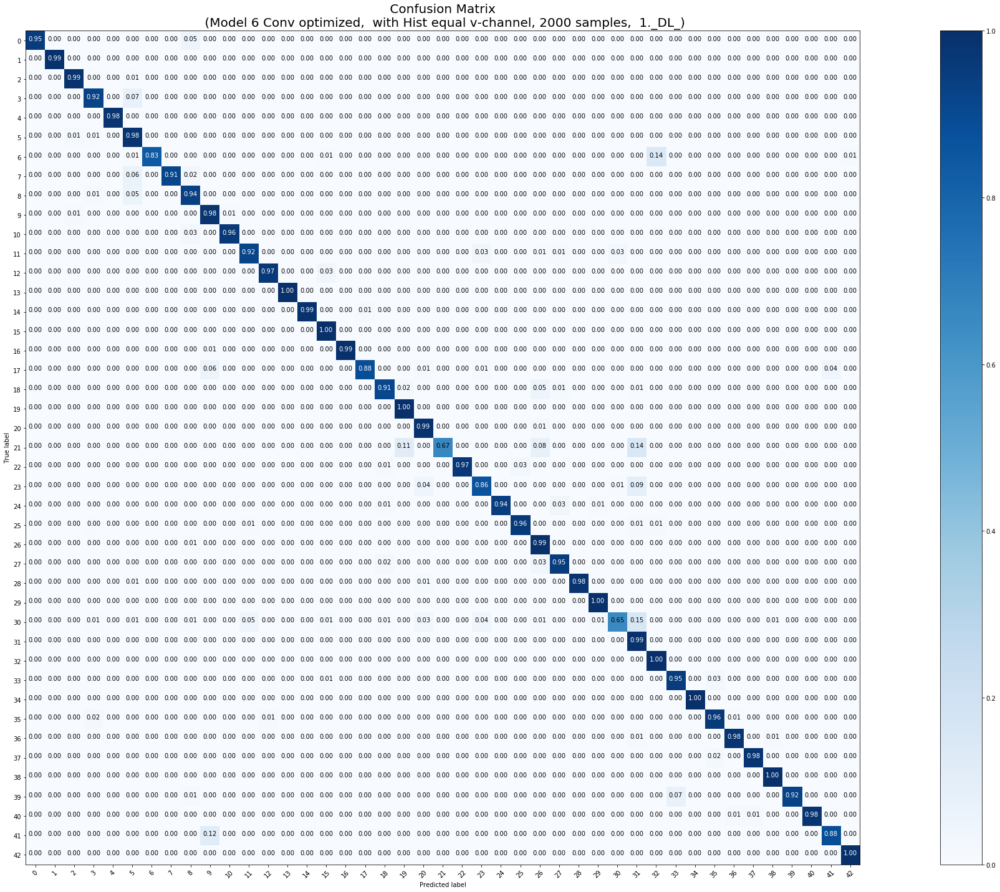

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 13s 233ms/step - loss: 3.6108 - acc: 0.1700 - val_loss: 2.6277 - val_acc: 0.3600
Epoch 2/300
57/57 [==============================] - 2s 30ms/step - loss: 2.3524 - acc: 0.3553 - val_loss: 3.0415 - val_acc: 0.4050
Epoch 3/300
57/57 [==============================] - 2s 36ms/step - loss: 1.8327 - acc: 0.4765 - val_loss: 1.3367 - val_acc: 0.6050
Epoch 4/300
57/57 [==============================] - 2s 35ms/step - loss: 1.3900 - acc: 0.5597 - val_loss: 1.6717 - val_acc: 0.5550
Epoch 5/300
57/57 [==============================] - 2s 36ms/step - loss: 1.2117 - acc: 0.5987 - val_loss: 1.0247 - val_acc: 0.7100
Epoch 6/300
57/57 [==============================] - 2s 34ms/step - loss: 0.9913 - acc: 0.6700 - val_loss: 0.5518 - val_acc: 0.8550
Epoch 7/300
57/57 [==============================] - 2s 37ms/st

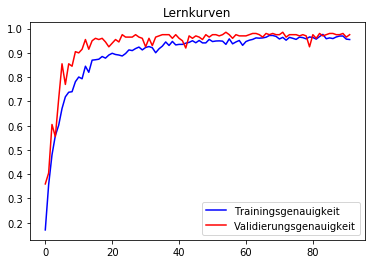

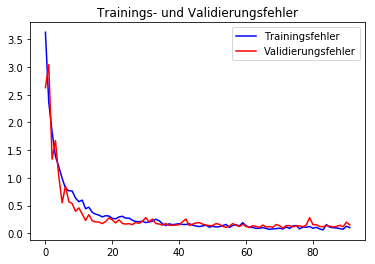

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      0.99      0.99       720
           2       0.99      0.99      0.99       750
           3       0.99      0.91      0.95       450
           4       1.00      0.98      0.99       660
           5       0.90      0.98      0.94       630
           6       1.00      0.78      0.88       150
           7       0.99      0.96      0.97       450
           8       0.95      0.99      0.97       450
           9       0.98      0.97      0.97       480
          10       1.00      0.96      0.98       660
          11       0.96      0.96      0.96       420
          12       0.99      0.96      0.97       690
          13       1.00      0.99      0.99       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       1.00      0.99      1.00       

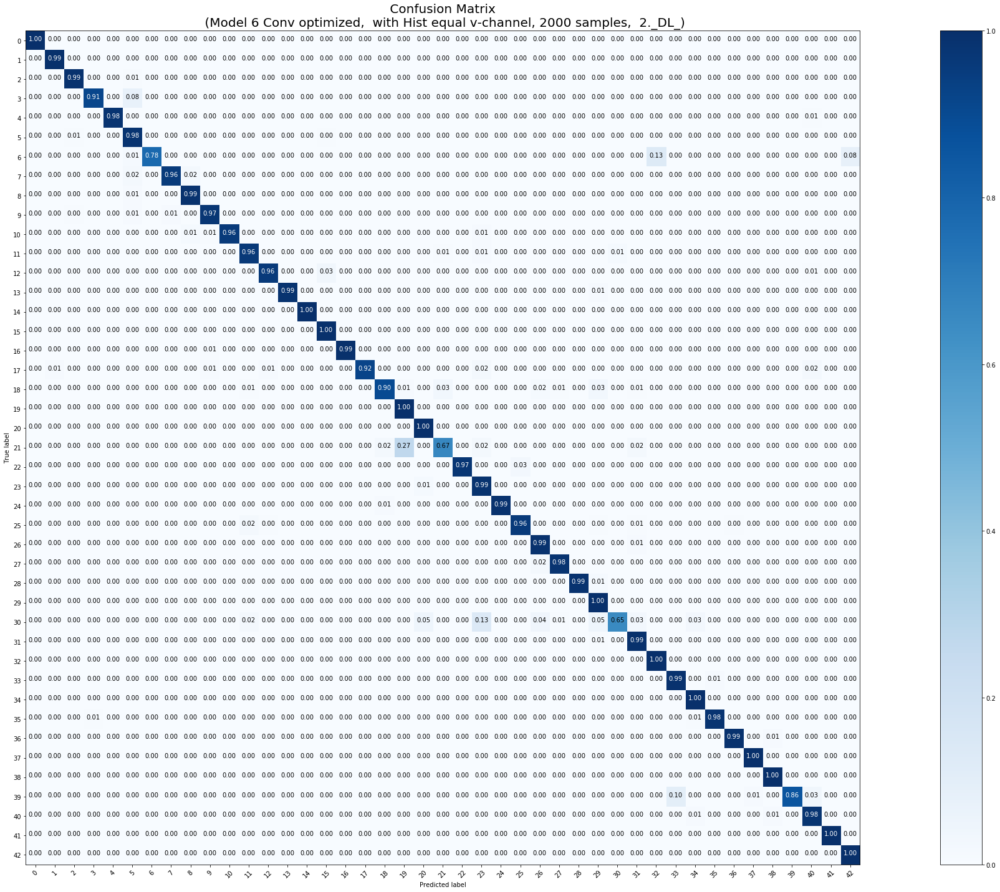

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 14s 241ms/step - loss: 3.6476 - acc: 0.1634 - val_loss: 3.1168 - val_acc: 0.3150
Epoch 2/300
57/57 [==============================] - 2s 31ms/step - loss: 2.4574 - acc: 0.3585 - val_loss: 1.4622 - val_acc: 0.6000
Epoch 3/300
57/57 [==============================] - 2s 35ms/step - loss: 1.9515 - acc: 0.4260 - val_loss: 0.9518 - val_acc: 0.6700
Epoch 4/300
57/57 [==============================] - 2s 36ms/step - loss: 1.5671 - acc: 0.5214 - val_loss: 0.9538 - val_acc: 0.6800
Epoch 5/300
57/57 [==============================] - 2s 37ms/step - loss: 1.3613 - acc: 0.5795 - val_loss: 1.0874 - val_acc: 0.6800
Epoch 6/300
57/57 [==============================] - 2s 36ms/step - loss: 1.2229 - acc: 0.6015 - val_loss: 0.5971 - val_acc: 0.7950
Epoch 7/300
57/57 [==============================] - 2s 37ms/st

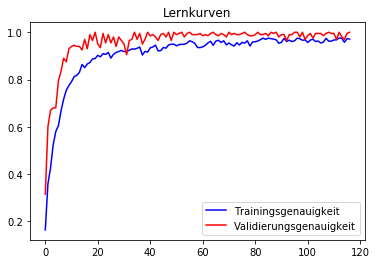

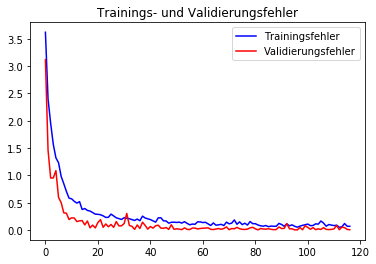

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.98      0.99      0.99       720
           2       0.97      0.99      0.98       750
           3       0.98      0.93      0.96       450
           4       1.00      0.98      0.99       660
           5       0.94      0.98      0.96       630
           6       1.00      0.91      0.95       150
           7       0.98      0.98      0.98       450
           8       0.96      0.95      0.95       450
           9       0.99      1.00      0.99       480
          10       1.00      0.98      0.99       660
          11       0.98      0.90      0.94       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.99      0.99      0.99       

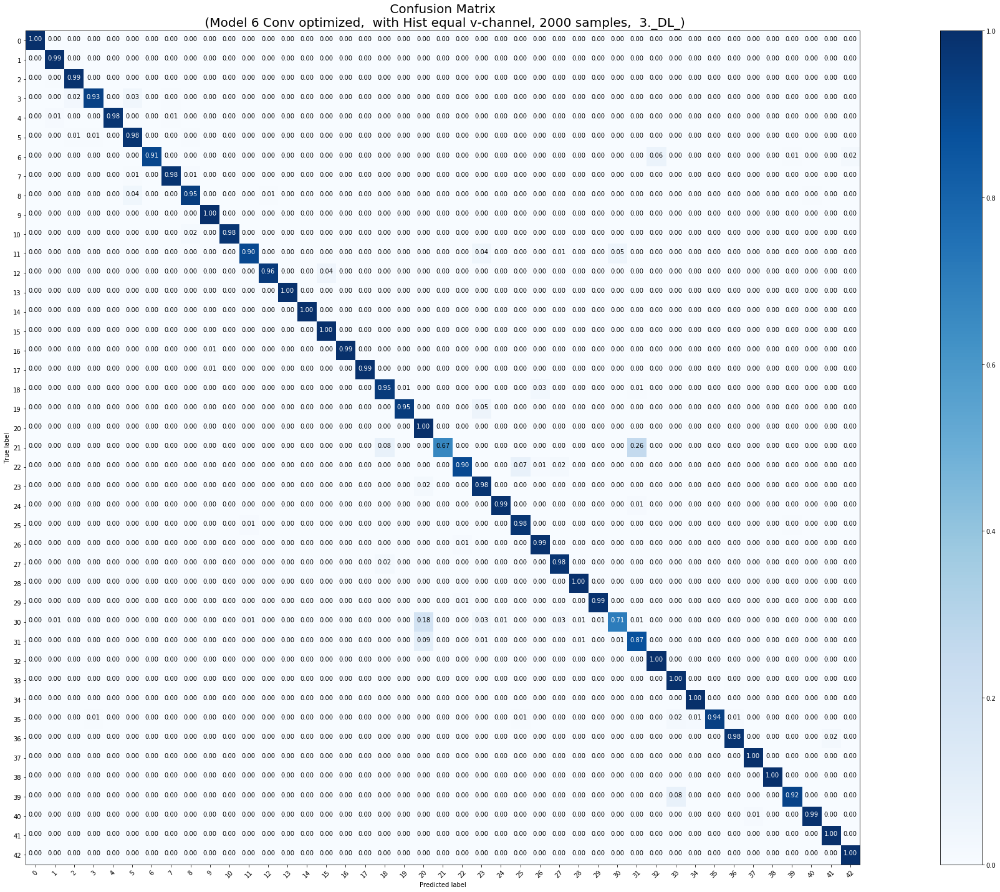

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 14s 250ms/step - loss: 3.7587 - acc: 0.1453 - val_loss: 2.7240 - val_acc: 0.3100
Epoch 2/300
57/57 [==============================] - 2s 32ms/step - loss: 2.3164 - acc: 0.3503 - val_loss: 1.8534 - val_acc: 0.5600
Epoch 3/300
57/57 [==============================] - 2s 35ms/step - loss: 1.8198 - acc: 0.4584 - val_loss: 1.1208 - val_acc: 0.6400
Epoch 4/300
57/57 [==============================] - 2s 36ms/step - loss: 1.4511 - acc: 0.5581 - val_loss: 0.7518 - val_acc: 0.7500
Epoch 5/300
57/57 [==============================] - 2s 37ms/step - loss: 1.0736 - acc: 0.6277 - val_loss: 0.7111 - val_acc: 0.7800
Epoch 6/300
57/57 [==============================] - 2s 36ms/step - loss: 0.9314 - acc: 0.6782 - val_loss: 0.4483 - val_acc: 0.8700
Epoch 7/300
57/57 [==============================] - 2s 38ms/st

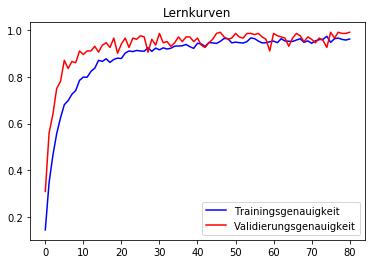

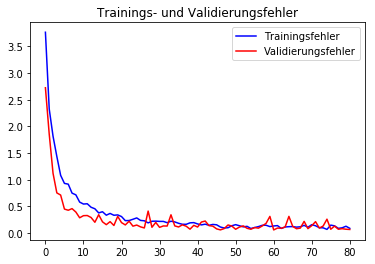

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        60
           1       0.98      0.98      0.98       720
           2       1.00      0.92      0.96       750
           3       0.92      0.94      0.93       450
           4       0.99      0.98      0.98       660
           5       0.86      0.96      0.91       630
           6       1.00      0.84      0.91       150
           7       1.00      0.96      0.98       450
           8       0.92      0.95      0.94       450
           9       0.93      1.00      0.97       480
          10       1.00      0.98      0.99       660
          11       0.99      0.91      0.95       420
          12       0.99      0.95      0.97       690
          13       1.00      0.99      1.00       720
          14       1.00      0.99      0.99       270
          15       0.85      1.00      0.92       210
          16       1.00      0.99      1.00       

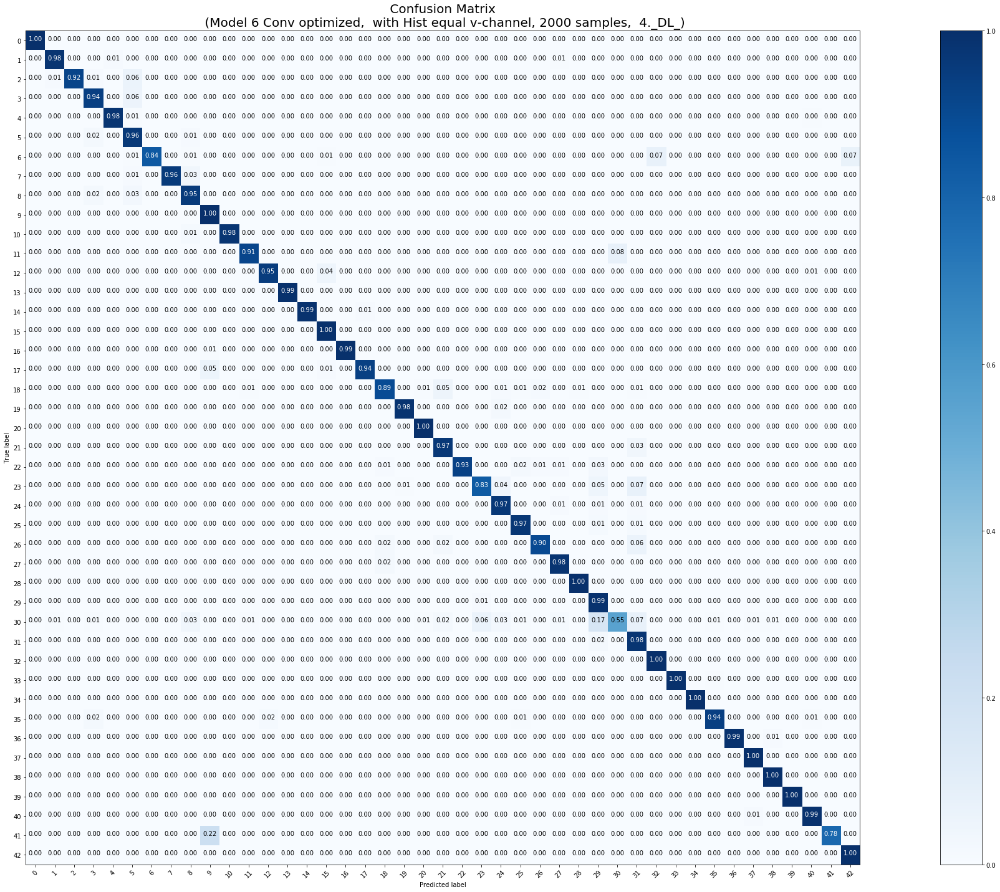

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
57/57 [==============================] - 15s 259ms/step - loss: 3.7433 - acc: 0.1497 - val_loss: 2.5420 - val_acc: 0.3600
Epoch 2/300
57/57 [==============================] - 2s 31ms/step - loss: 2.4090 - acc: 0.3432 - val_loss: 1.7517 - val_acc: 0.5500
Epoch 3/300
57/57 [==============================] - 2s 36ms/step - loss: 1.9416 - acc: 0.4392 - val_loss: 1.5204 - val_acc: 0.5650
Epoch 4/300
57/57 [==============================] - 2s 35ms/step - loss: 1.5623 - acc: 0.5285 - val_loss: 1.3764 - val_acc: 0.6150
Epoch 5/300
57/57 [==============================] - 2s 36ms/step - loss: 1.3071 - acc: 0.5724 - val_loss: 0.9634 - val_acc: 0.7500
Epoch 6/300
57/57 [==============================] - 2s 36ms/step - loss: 1.1787 - acc: 0.6107 - val_loss: 0.7141 - val_acc: 0.8000
Epoch 7/300
57/57 [==============================] - 2s 35ms/st

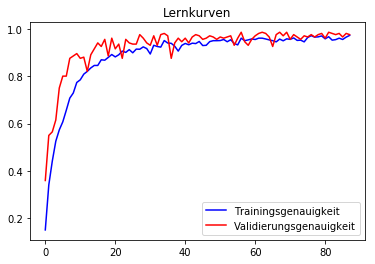

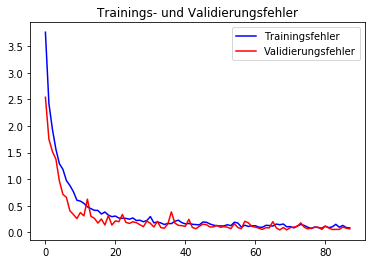

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       1.00      0.97      0.98       720
           2       0.98      0.98      0.98       750
           3       1.00      0.91      0.95       450
           4       0.98      0.98      0.98       660
           5       0.91      0.97      0.94       630
           6       1.00      0.76      0.86       150
           7       0.96      0.97      0.97       450
           8       0.95      0.94      0.95       450
           9       0.98      1.00      0.99       480
          10       0.99      0.99      0.99       660
          11       0.97      0.99      0.98       420
          12       1.00      0.95      0.98       690
          13       1.00      1.00      1.00       720
          14       0.90      1.00      0.95       270
          15       0.86      1.00      0.92       210
          16       0.94      0.99      0.97       

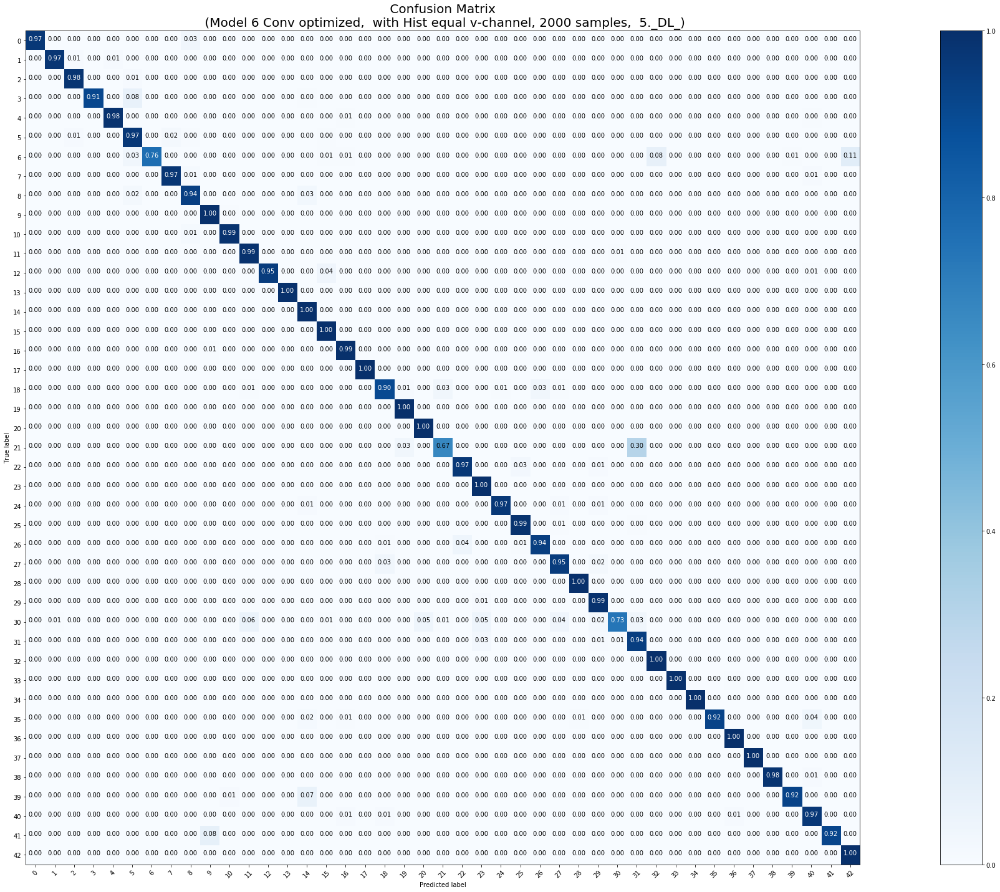

Die durchschnittliche Epochenanzahl beträgt:  71.8


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 2000
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_2000, y_tr_2000,X_test, y_test, 0.3, 0.001, False, 300, 2000)

In [0]:
downloader(1,5,2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 16s 4ms/step - loss: 3.4936 - acc: 0.1502 - val_loss: 1.8750 - val_acc: 0.4840
Epoch 2/300
4500/4500 [==============================] - 3s 636us/step - loss: 2.0053 - acc: 0.4036 - val_loss: 1.1248 - val_acc: 0.6800
Epoch 3/300
4500/4500 [==============================] - 3s 627us/step - loss: 1.3653 - acc: 0.5622 - val_loss: 0.7949 - val_acc: 0.7640
Epoch 4/300
4500/4500 [==============================] - 3s 638us/step - loss: 0.9898 - acc: 0.6722 - val_loss: 0.5876 - val_acc: 0.8420
Epoch 5/300
4500/4500 [==============================] - 3s 609us/step - loss: 0.7494 - acc: 0.7331 - val_loss: 0.5003 - val_acc: 0.8520
Epoch 6/300
4500/4500 [==============================] - 3s 641us/step - loss: 0.5934 - acc: 0.7929 - val_loss: 0.3721 - val_a

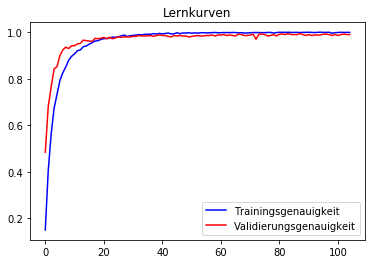

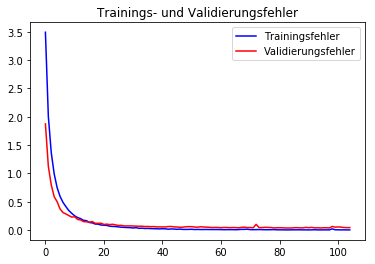

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.96      0.85      0.90        60
           1       0.98      0.98      0.98       720
           2       0.98      0.99      0.99       750
           3       0.99      0.96      0.98       450
           4       0.98      0.97      0.98       660
           5       0.90      0.97      0.93       630
           6       1.00      0.62      0.77       150
           7       0.97      0.98      0.97       450
           8       0.96      0.96      0.96       450
           9       0.97      0.99      0.98       480
          10       0.97      0.99      0.98       660
          11       0.91      0.98      0.94       420
          12       1.00      0.99      0.99       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.97      1.00      0.98       210
          16       0.99      0.99      0.99       

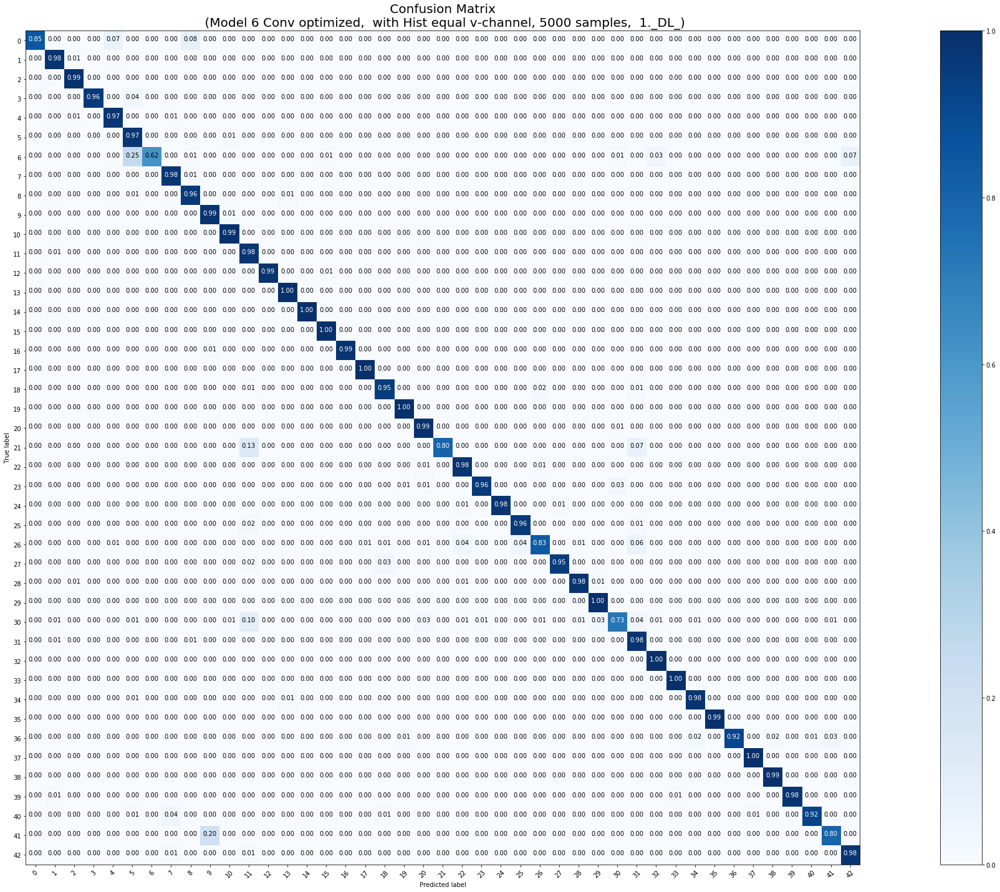

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 17s 4ms/step - loss: 3.4901 - acc: 0.1482 - val_loss: 1.8723 - val_acc: 0.4920
Epoch 2/300
4500/4500 [==============================] - 3s 613us/step - loss: 2.0176 - acc: 0.4029 - val_loss: 1.0793 - val_acc: 0.7260
Epoch 3/300
4500/4500 [==============================] - 3s 606us/step - loss: 1.3494 - acc: 0.5671 - val_loss: 0.7960 - val_acc: 0.7760
Epoch 4/300
4500/4500 [==============================] - 3s 623us/step - loss: 0.9634 - acc: 0.6789 - val_loss: 0.5699 - val_acc: 0.8500
Epoch 5/300
4500/4500 [==============================] - 3s 603us/step - loss: 0.7215 - acc: 0.7433 - val_loss: 0.4490 - val_acc: 0.8900
Epoch 6/300
4500/4500 [==============================] - 3s 616us/step - loss: 0.5740 - acc: 0.7971 - val_loss: 0.3489 - val_a

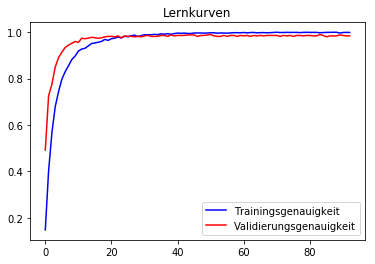

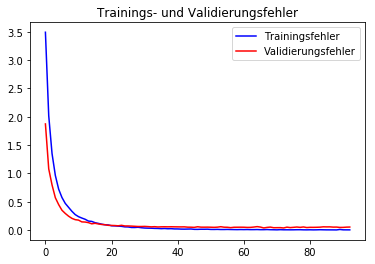

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        60
           1       0.98      0.98      0.98       720
           2       0.97      0.99      0.98       750
           3       0.99      0.95      0.97       450
           4       0.99      0.97      0.98       660
           5       0.92      0.98      0.94       630
           6       1.00      0.73      0.85       150
           7       0.98      0.97      0.97       450
           8       0.98      0.95      0.97       450
           9       0.97      0.98      0.98       480
          10       0.97      0.99      0.98       660
          11       0.93      0.97      0.95       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       1.00      1.00      1.00       210
          16       0.98      0.98      0.98       

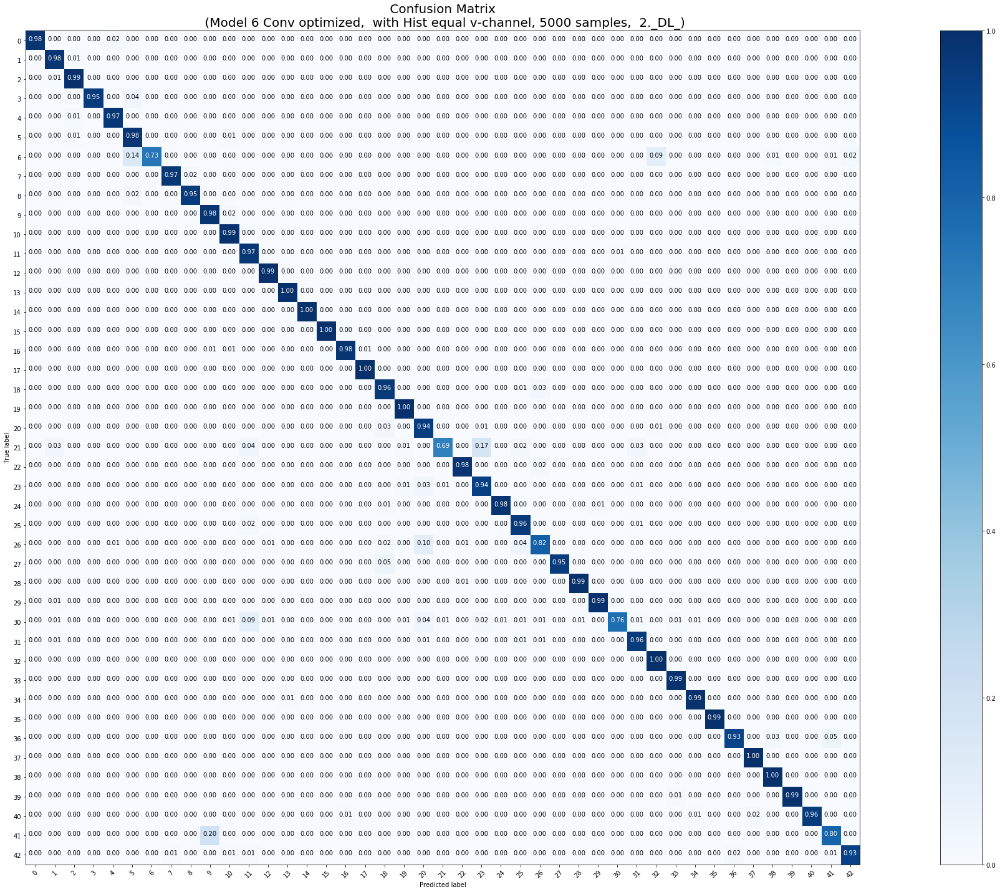

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 17s 4ms/step - loss: 3.5248 - acc: 0.1304 - val_loss: 2.1255 - val_acc: 0.4360
Epoch 2/300
4500/4500 [==============================] - 3s 627us/step - loss: 2.1338 - acc: 0.3698 - val_loss: 1.3293 - val_acc: 0.5840
Epoch 3/300
4500/4500 [==============================] - 3s 615us/step - loss: 1.5084 - acc: 0.5198 - val_loss: 0.9083 - val_acc: 0.7280
Epoch 4/300
4500/4500 [==============================] - 3s 626us/step - loss: 1.1530 - acc: 0.6231 - val_loss: 0.6787 - val_acc: 0.8180
Epoch 5/300
4500/4500 [==============================] - 3s 623us/step - loss: 0.8661 - acc: 0.6996 - val_loss: 0.5461 - val_acc: 0.8340
Epoch 6/300
4500/4500 [==============================] - 3s 624us/step - loss: 0.6717 - acc: 0.7716 - val_loss: 0.4364 - val_a

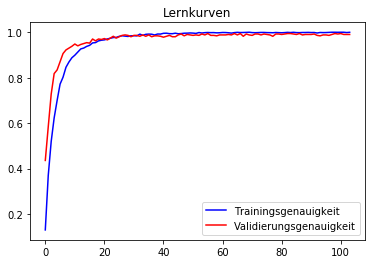

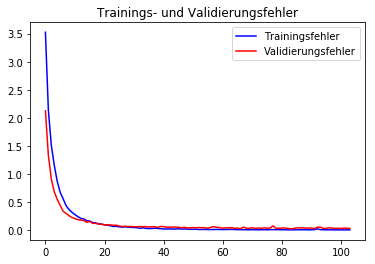

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        60
           1       0.96      0.98      0.97       720
           2       0.97      0.98      0.98       750
           3       0.98      0.97      0.98       450
           4       0.99      0.98      0.98       660
           5       0.94      0.96      0.95       630
           6       1.00      0.67      0.80       150
           7       0.97      0.98      0.98       450
           8       0.98      0.98      0.98       450
           9       0.95      0.99      0.97       480
          10       0.98      0.98      0.98       660
          11       0.94      0.95      0.94       420
          12       0.99      0.98      0.98       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.93      1.00      0.96       210
          16       1.00      0.98      0.99       

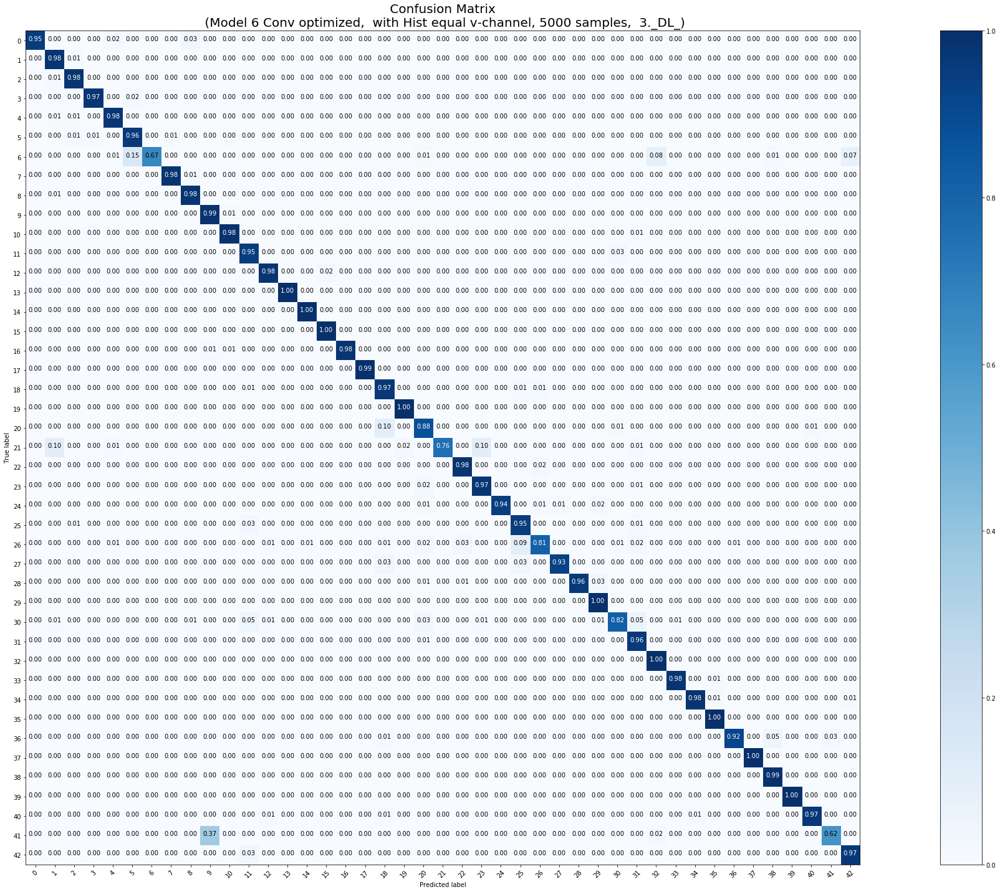

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 18s 4ms/step - loss: 3.4726 - acc: 0.1482 - val_loss: 1.8885 - val_acc: 0.4800
Epoch 2/300
4500/4500 [==============================] - 3s 644us/step - loss: 2.1162 - acc: 0.3851 - val_loss: 1.1961 - val_acc: 0.6620
Epoch 3/300
4500/4500 [==============================] - 3s 618us/step - loss: 1.4765 - acc: 0.5429 - val_loss: 0.8443 - val_acc: 0.7480
Epoch 4/300
4500/4500 [==============================] - 3s 621us/step - loss: 1.0704 - acc: 0.6484 - val_loss: 0.6172 - val_acc: 0.8280
Epoch 5/300
4500/4500 [==============================] - 3s 616us/step - loss: 0.8240 - acc: 0.7184 - val_loss: 0.4987 - val_acc: 0.8560
Epoch 6/300
4500/4500 [==============================] - 3s 615us/step - loss: 0.6479 - acc: 0.7760 - val_loss: 0.4074 - val_a

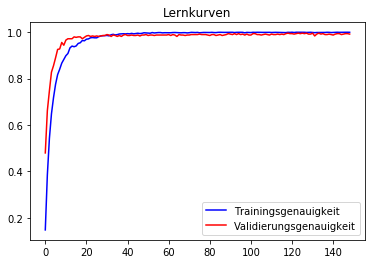

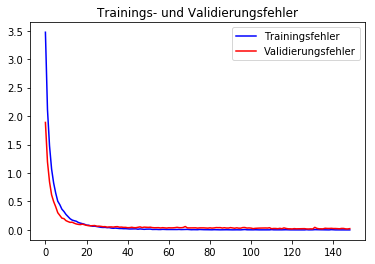

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        60
           1       0.98      0.99      0.98       720
           2       0.98      1.00      0.99       750
           3       0.99      0.98      0.98       450
           4       0.99      0.97      0.98       660
           5       0.89      0.98      0.93       630
           6       1.00      0.66      0.80       150
           7       0.97      0.97      0.97       450
           8       0.97      0.95      0.96       450
           9       0.96      0.99      0.97       480
          10       0.97      0.99      0.98       660
          11       0.96      0.98      0.97       420
          12       0.99      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.98      1.00      0.99       210
          16       0.99      0.99      0.99       

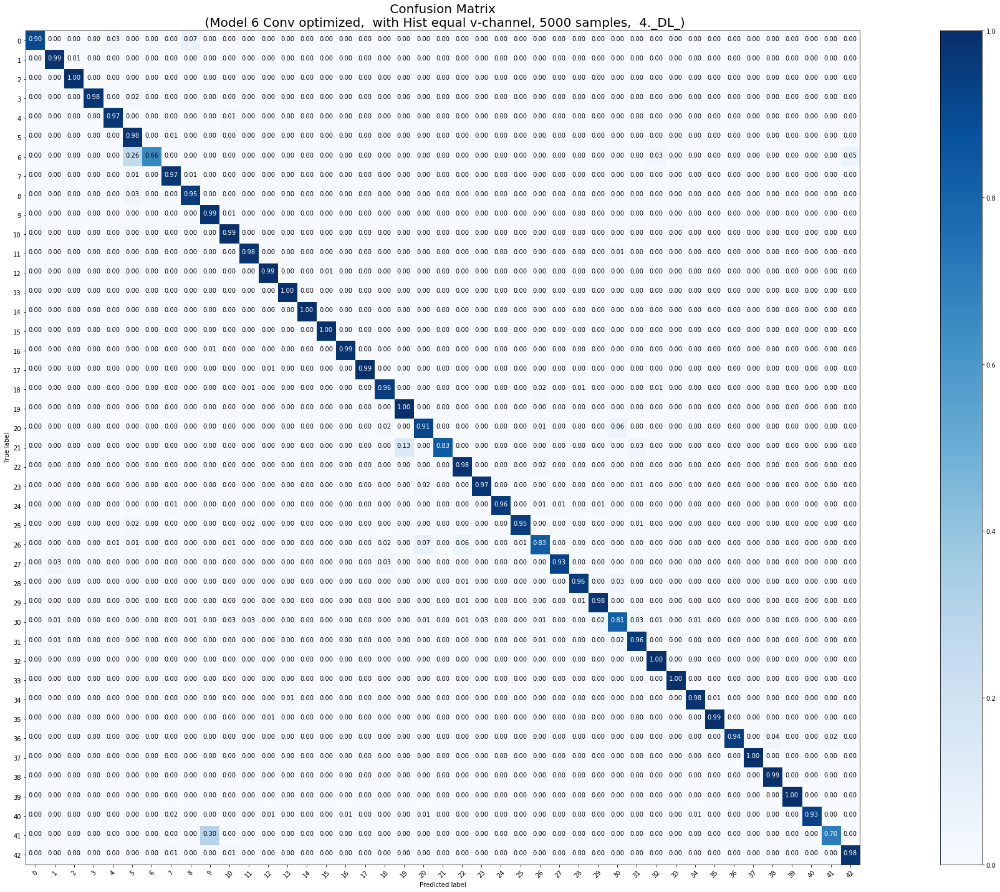

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 18s 4ms/step - loss: 3.5845 - acc: 0.1253 - val_loss: 2.0006 - val_acc: 0.4420
Epoch 2/300
4500/4500 [==============================] - 3s 611us/step - loss: 2.1738 - acc: 0.3602 - val_loss: 1.2536 - val_acc: 0.6680
Epoch 3/300
4500/4500 [==============================] - 3s 623us/step - loss: 1.5225 - acc: 0.5211 - val_loss: 0.8860 - val_acc: 0.7620
Epoch 4/300
4500/4500 [==============================] - 3s 630us/step - loss: 1.0695 - acc: 0.6447 - val_loss: 0.6196 - val_acc: 0.8120
Epoch 5/300
4500/4500 [==============================] - 3s 640us/step - loss: 0.7941 - acc: 0.7309 - val_loss: 0.4923 - val_acc: 0.8700
Epoch 6/300
4500/4500 [==============================] - 3s 638us/step - loss: 0.6251 - acc: 0.7780 - val_loss: 0.4098 - val_a

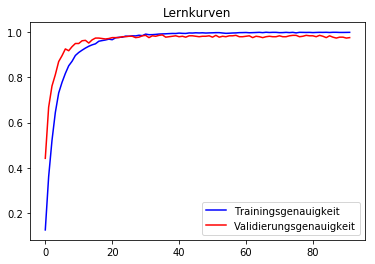

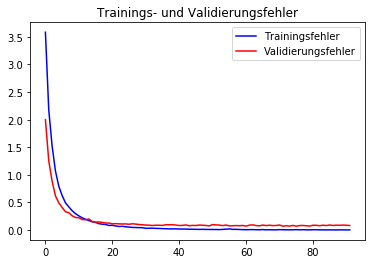

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.93      0.97        60
           1       0.98      0.98      0.98       720
           2       0.98      0.98      0.98       750
           3       0.99      0.97      0.98       450
           4       0.99      0.96      0.98       660
           5       0.89      0.97      0.93       630
           6       1.00      0.65      0.79       150
           7       0.96      0.97      0.96       450
           8       0.93      0.97      0.95       450
           9       0.98      0.99      0.99       480
          10       0.98      0.98      0.98       660
          11       0.98      0.90      0.94       420
          12       1.00      0.98      0.99       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.93      1.00      0.96       210
          16       0.99      0.99      0.99       

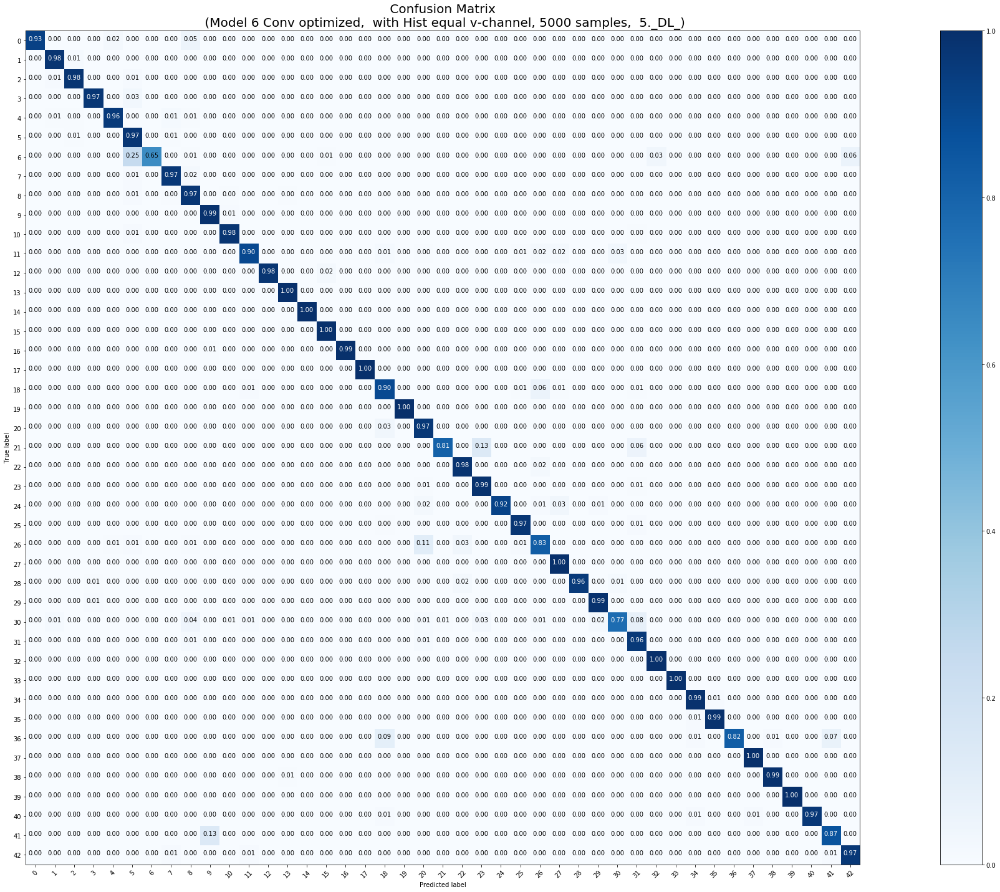

Die durchschnittliche Epochenanzahl beträgt:  88.6


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 5000
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout    
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_5000, y_tr_5000, X_test, y_test, 0.3, 0.0001, False, 300, 5000)

In [0]:
downloader(1,5, 5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 21s 147ms/step - loss: 3.8545 - acc: 0.0845 - val_loss: 2.2579 - val_acc: 0.3460
Epoch 2/300
141/141 [==============================] - 5s 35ms/step - loss: 2.8772 - acc: 0.2271 - val_loss: 1.6078 - val_acc: 0.5080
Epoch 3/300
141/141 [==============================] - 5s 37ms/step - loss: 2.3743 - acc: 0.3269 - val_loss: 1.3656 - val_acc: 0.5540
Epoch 4/300
141/141 [==============================] - 5s 37ms/step - loss: 2.0470 - acc: 0.4069 - val_loss: 1.1148 - val_acc: 0.6320
Epoch 5/300
141/141 [==============================] - 5s 36ms/step - loss: 1.8175 - acc: 0.4435 - val_loss: 0.9071 - val_acc: 0.7160
Epoch 6/300
141/141 [==============================] - 5s 37ms/step - loss: 1.6390 - acc: 0.4855 - val_loss: 0.8122 - val_acc: 0.7500
Epoch 7/300
141/141 [==============================

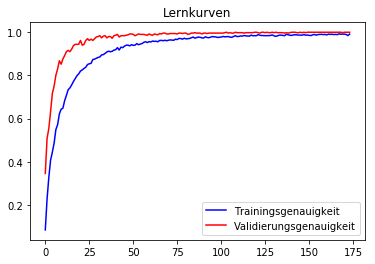

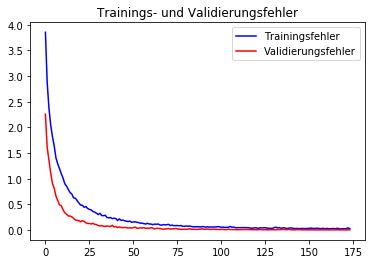

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      0.99      0.99       720
           2       0.99      0.98      0.99       750
           3       0.99      0.98      0.99       450
           4       1.00      0.99      0.99       660
           5       0.96      0.99      0.98       630
           6       1.00      0.88      0.94       150
           7       1.00      0.99      0.99       450
           8       0.98      0.97      0.98       450
           9       1.00      1.00      1.00       480
          10       1.00      1.00      1.00       660
          11       0.98      0.99      0.99       420
          12       1.00      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       0.99      1.00      0.99       270
          15       0.90      1.00      0.95       210
          16       0.99      0.99      0.99       

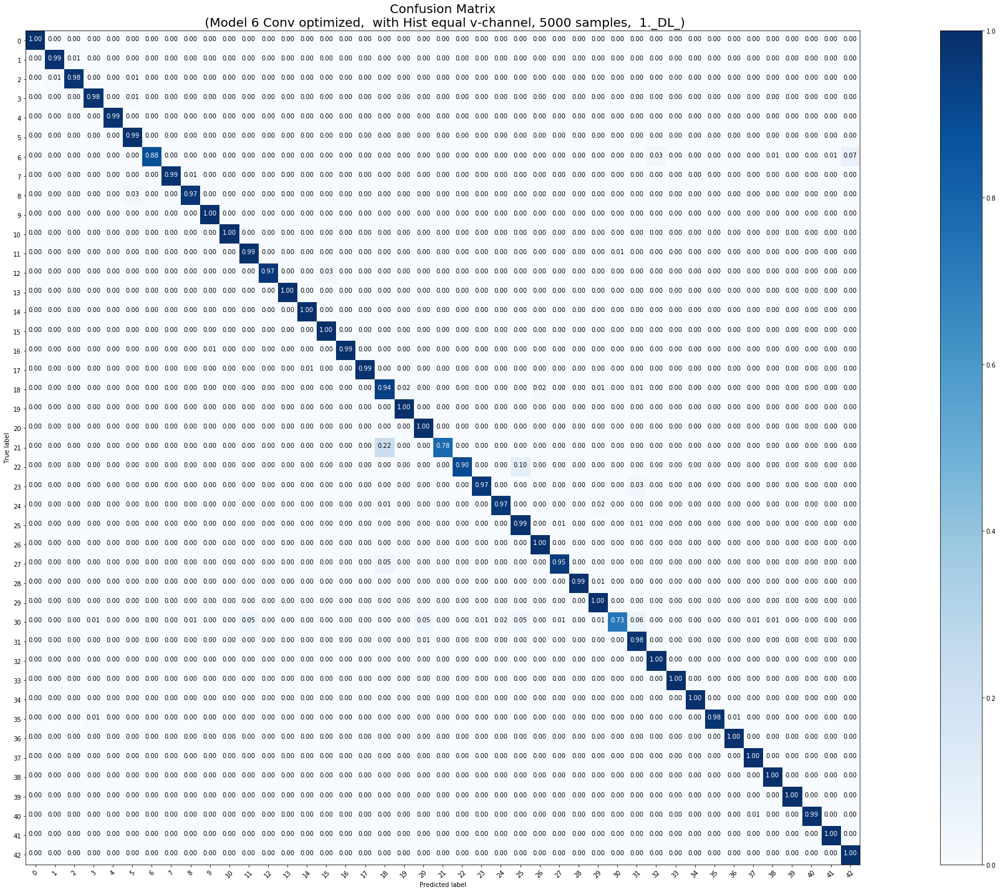

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 21s 152ms/step - loss: 3.8568 - acc: 0.0909 - val_loss: 2.3797 - val_acc: 0.3260
Epoch 2/300
141/141 [==============================] - 5s 35ms/step - loss: 2.9258 - acc: 0.2226 - val_loss: 1.7589 - val_acc: 0.5140
Epoch 3/300
141/141 [==============================] - 5s 37ms/step - loss: 2.3910 - acc: 0.3215 - val_loss: 1.4618 - val_acc: 0.5720
Epoch 4/300
141/141 [==============================] - 5s 37ms/step - loss: 2.0189 - acc: 0.3953 - val_loss: 1.1671 - val_acc: 0.6640
Epoch 5/300
141/141 [==============================] - 5s 36ms/step - loss: 1.8247 - acc: 0.4454 - val_loss: 0.9303 - val_acc: 0.7080
Epoch 6/300
141/141 [==============================] - 5s 37ms/step - loss: 1.5918 - acc: 0.4878 - val_loss: 0.8051 - val_acc: 0.7400
Epoch 7/300
141/141 [==============================

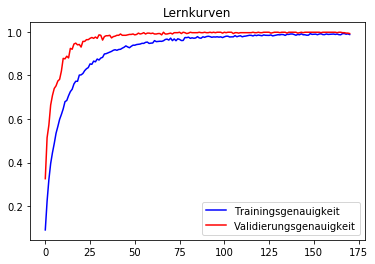

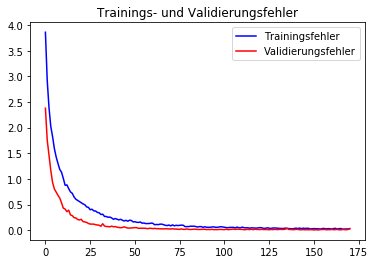

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      0.99      0.99       720
           2       1.00      0.98      0.99       750
           3       0.98      0.98      0.98       450
           4       0.99      0.99      0.99       660
           5       0.96      0.99      0.98       630
           6       1.00      0.94      0.97       150
           7       0.99      0.98      0.99       450
           8       0.98      0.96      0.97       450
           9       1.00      0.95      0.98       480
          10       1.00      1.00      1.00       660
          11       0.93      1.00      0.96       420
          12       1.00      0.94      0.97       690
          13       1.00      1.00      1.00       720
          14       0.99      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       0.99      1.00      0.99       

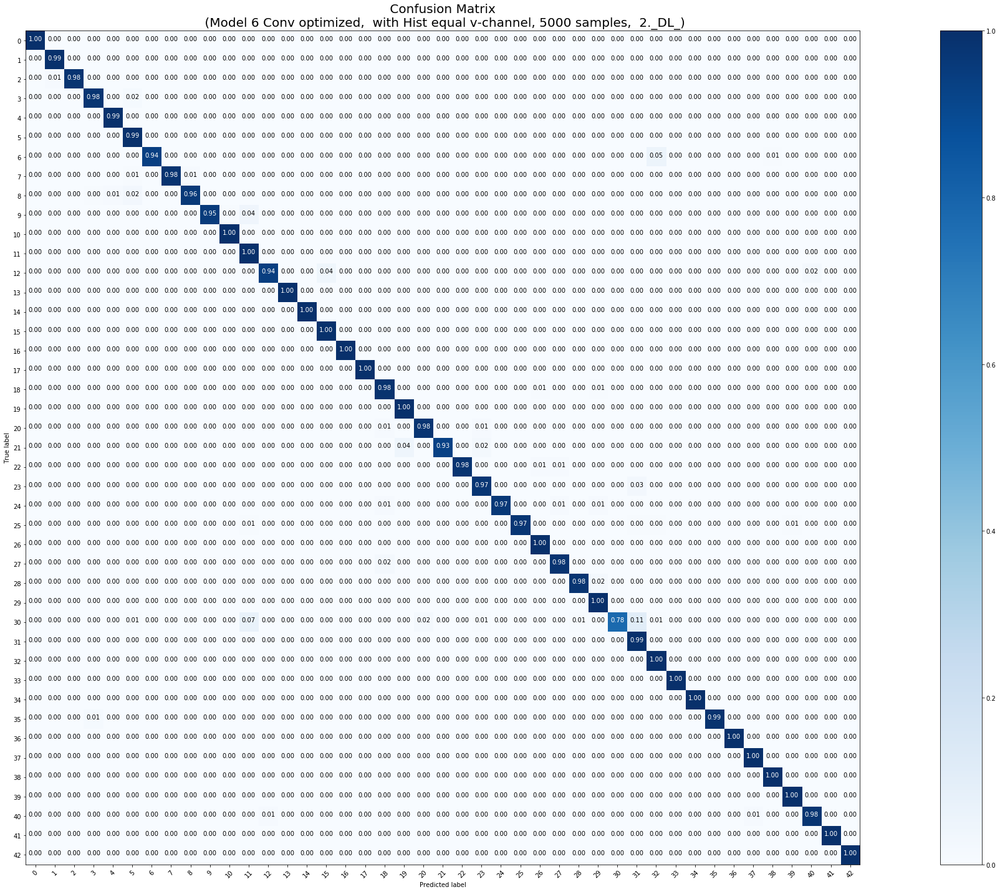

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 22s 156ms/step - loss: 3.9160 - acc: 0.0888 - val_loss: 2.5180 - val_acc: 0.2740
Epoch 2/300
141/141 [==============================] - 5s 35ms/step - loss: 2.9145 - acc: 0.2155 - val_loss: 1.6966 - val_acc: 0.4960
Epoch 3/300
141/141 [==============================] - 5s 36ms/step - loss: 2.3726 - acc: 0.3225 - val_loss: 1.2314 - val_acc: 0.6480
Epoch 4/300
141/141 [==============================] - 5s 37ms/step - loss: 2.0062 - acc: 0.3923 - val_loss: 1.0707 - val_acc: 0.6660
Epoch 5/300
141/141 [==============================] - 5s 36ms/step - loss: 1.7129 - acc: 0.4755 - val_loss: 0.8517 - val_acc: 0.7440
Epoch 6/300
141/141 [==============================] - 5s 37ms/step - loss: 1.5226 - acc: 0.5146 - val_loss: 0.7938 - val_acc: 0.7820
Epoch 7/300
141/141 [==============================

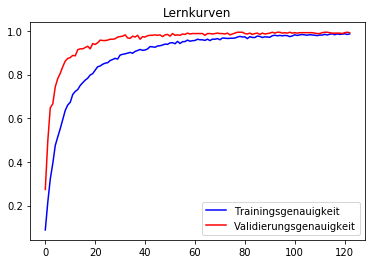

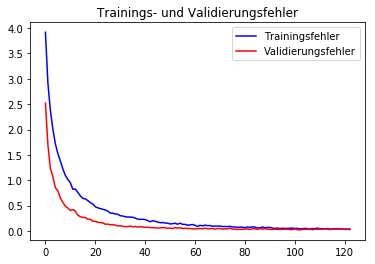

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        60
           1       0.99      0.98      0.99       720
           2       0.99      0.99      0.99       750
           3       0.99      0.95      0.97       450
           4       1.00      0.99      0.99       660
           5       0.95      0.99      0.97       630
           6       0.99      0.89      0.94       150
           7       0.99      0.98      0.99       450
           8       0.96      0.98      0.97       450
           9       0.99      1.00      0.99       480
          10       1.00      0.98      0.99       660
          11       0.99      0.98      0.98       420
          12       1.00      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.91      1.00      0.95       210
          16       0.99      0.99      0.99       

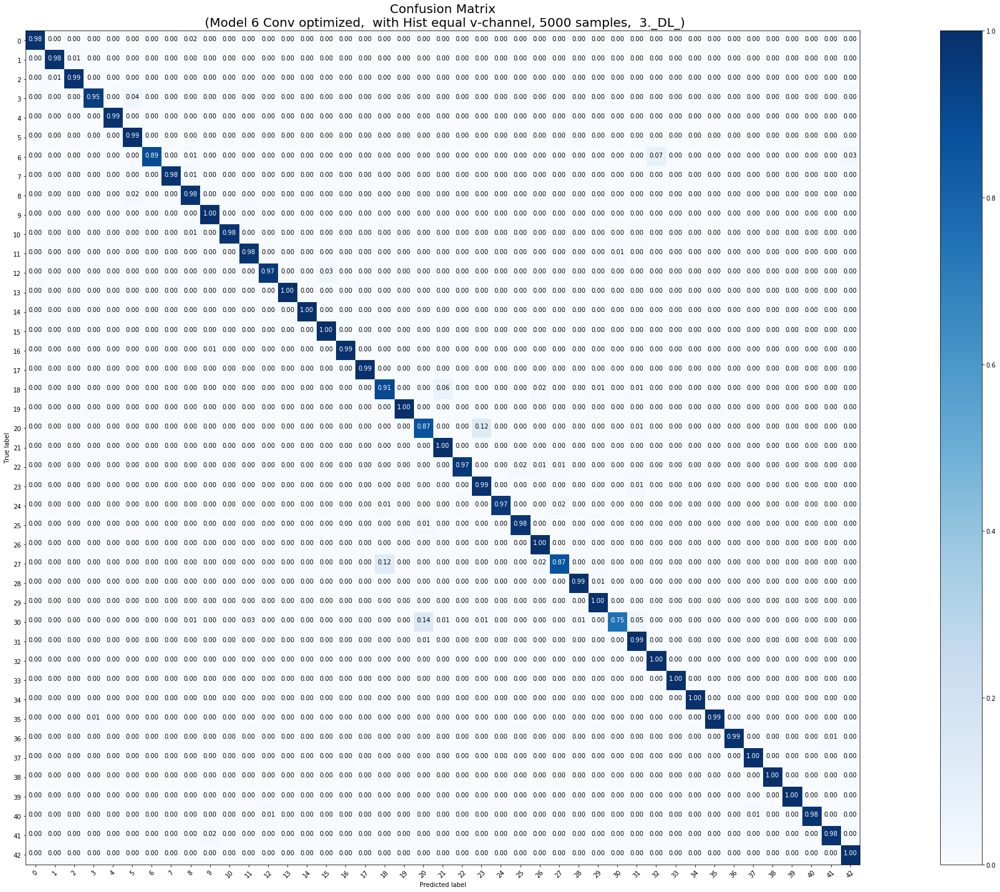

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 22s 159ms/step - loss: 3.9401 - acc: 0.0804 - val_loss: 2.6105 - val_acc: 0.2460
Epoch 2/300
141/141 [==============================] - 5s 34ms/step - loss: 2.9849 - acc: 0.2067 - val_loss: 1.8270 - val_acc: 0.4340
Epoch 3/300
141/141 [==============================] - 5s 37ms/step - loss: 2.4738 - acc: 0.3118 - val_loss: 1.3155 - val_acc: 0.6020
Epoch 4/300
141/141 [==============================] - 5s 37ms/step - loss: 2.0748 - acc: 0.3882 - val_loss: 1.1426 - val_acc: 0.6340
Epoch 5/300
141/141 [==============================] - 5s 37ms/step - loss: 1.8255 - acc: 0.4418 - val_loss: 0.9661 - val_acc: 0.6820
Epoch 6/300
141/141 [==============================] - 5s 37ms/step - loss: 1.6498 - acc: 0.4796 - val_loss: 0.7812 - val_acc: 0.7560
Epoch 7/300
141/141 [==============================

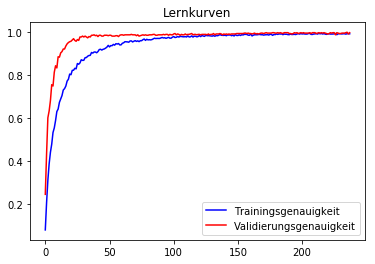

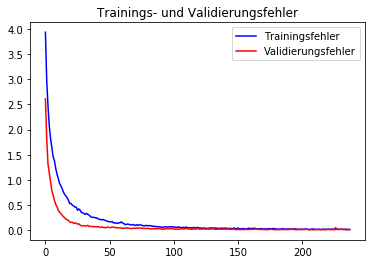

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.98      0.99      0.98       720
           2       0.99      0.98      0.98       750
           3       0.98      0.96      0.97       450
           4       1.00      0.99      1.00       660
           5       0.94      1.00      0.97       630
           6       1.00      0.89      0.94       150
           7       1.00      0.99      0.99       450
           8       0.99      0.97      0.98       450
           9       1.00      0.97      0.98       480
          10       1.00      1.00      1.00       660
          11       0.97      0.98      0.97       420
          12       1.00      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.95      1.00      0.98       210
          16       1.00      0.99      1.00       

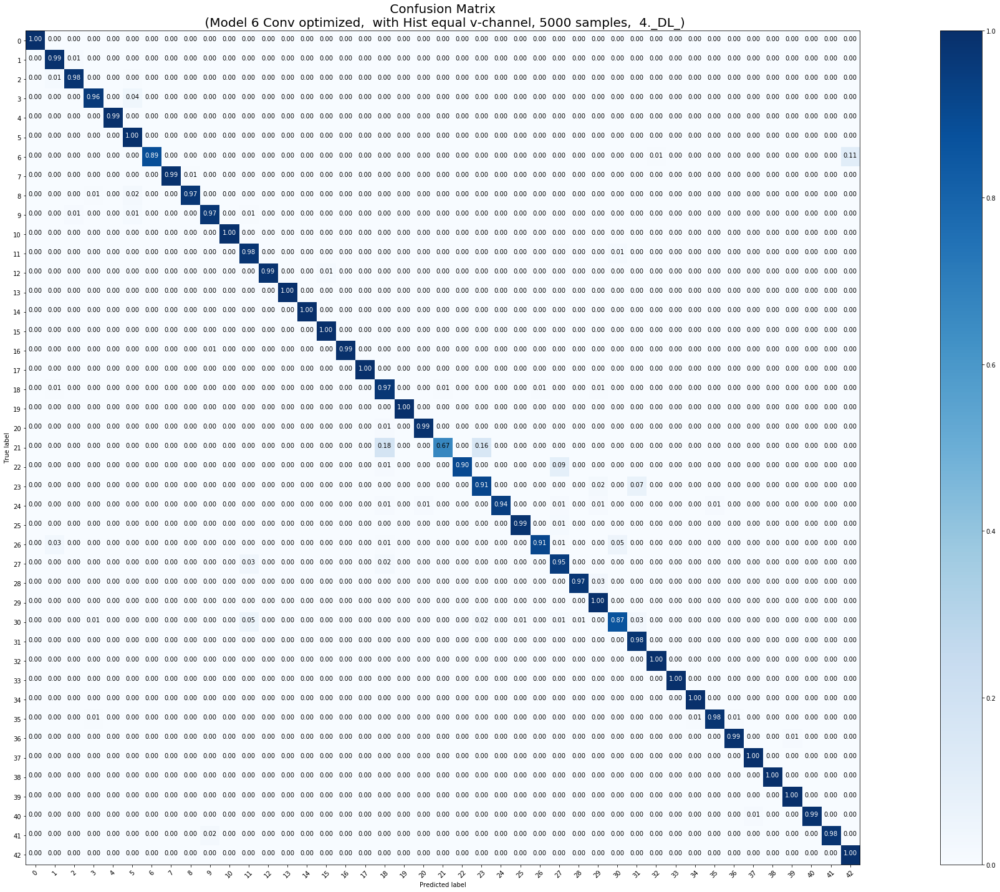

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
141/141 [==============================] - 24s 170ms/step - loss: 3.9140 - acc: 0.0922 - val_loss: 2.4794 - val_acc: 0.3540
Epoch 2/300
141/141 [==============================] - 5s 36ms/step - loss: 2.9544 - acc: 0.2235 - val_loss: 1.9209 - val_acc: 0.4380
Epoch 3/300
141/141 [==============================] - 5s 38ms/step - loss: 2.3834 - acc: 0.3262 - val_loss: 1.5443 - val_acc: 0.5120
Epoch 4/300
141/141 [==============================] - 5s 38ms/step - loss: 2.0471 - acc: 0.3842 - val_loss: 1.2178 - val_acc: 0.6300
Epoch 5/300
141/141 [==============================] - 5s 37ms/step - loss: 1.7549 - acc: 0.4496 - val_loss: 1.0364 - val_acc: 0.6960
Epoch 6/300
141/141 [==============================] - 5s 37ms/step - loss: 1.5775 - acc: 0.4984 - val_loss: 0.9330 - val_acc: 0.7140
Epoch 7/300
141/141 [==============================

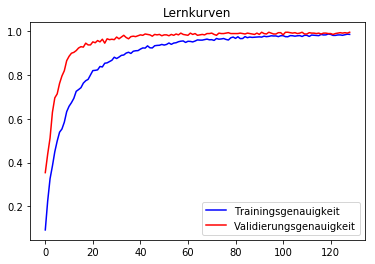

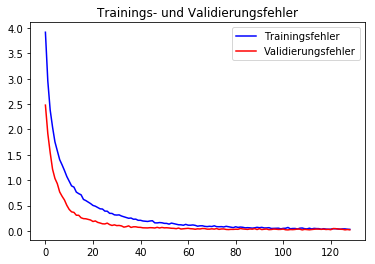

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      0.93      0.97        60
           1       0.99      0.98      0.98       720
           2       0.99      0.98      0.98       750
           3       0.98      0.96      0.97       450
           4       0.99      0.99      0.99       660
           5       0.94      0.99      0.96       630
           6       1.00      0.88      0.94       150
           7       0.98      0.97      0.98       450
           8       0.95      0.95      0.95       450
           9       0.98      1.00      0.99       480
          10       1.00      0.99      0.99       660
          11       0.96      0.98      0.97       420
          12       1.00      0.95      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       1.00      0.99      1.00       

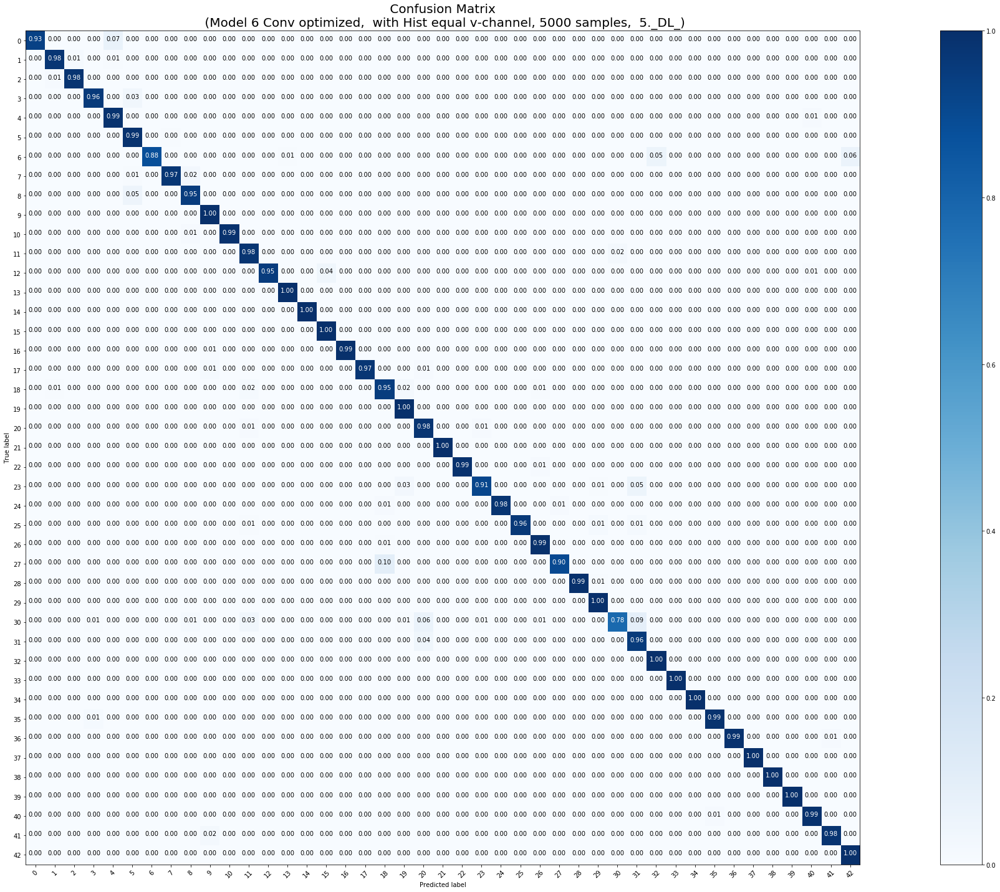

Die durchschnittliche Epochenanzahl beträgt:  147.0


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 5000
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.001, ohne SpatialDropout
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_5000, y_tr_5000,X_test, y_test, 0.3, 0.0001, False, 300, 5000)

In [0]:
downloader(1,5,5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 24s 3ms/step - loss: 2.8924 - acc: 0.2438 - val_loss: 1.3181 - val_acc: 0.6120
Epoch 2/300
9000/9000 [==============================] - 6s 656us/step - loss: 1.3499 - acc: 0.5719 - val_loss: 0.6613 - val_acc: 0.8160
Epoch 3/300
9000/9000 [==============================] - 6s 650us/step - loss: 0.7854 - acc: 0.7259 - val_loss: 0.4381 - val_acc: 0.8910
Epoch 4/300
9000/9000 [==============================] - 6s 646us/step - loss: 0.5369 - acc: 0.8156 - val_loss: 0.3108 - val_acc: 0.9160
Epoch 5/300
9000/9000 [==============================] - 6s 650us/step - loss: 0.3797 - acc: 0.8640 - val_loss: 0.2366 - val_acc: 0.9320
Epoch 6/300
9000/9000 [==============================] - 6s 644us/step - loss: 0.2964 - acc: 0.8971 - val_loss: 0.2045 - val_

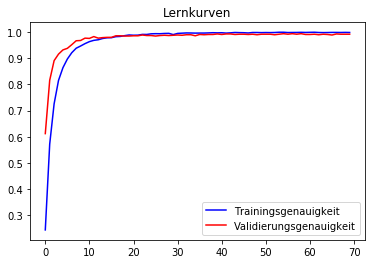

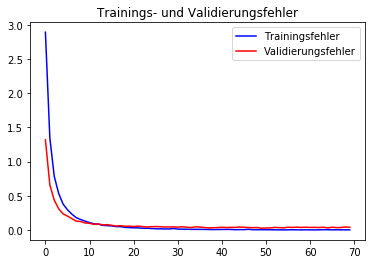

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        60
           1       0.98      0.99      0.99       720
           2       0.99      1.00      0.99       750
           3       0.98      0.94      0.96       450
           4       1.00      0.98      0.99       660
           5       0.90      0.98      0.94       630
           6       1.00      0.66      0.80       150
           7       0.99      0.97      0.98       450
           8       0.97      0.96      0.96       450
           9       0.98      0.99      0.99       480
          10       0.98      0.98      0.98       660
          11       0.94      0.98      0.96       420
          12       1.00      1.00      1.00       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       1.00      1.00      1.00       210
          16       1.00      0.99      0.99       

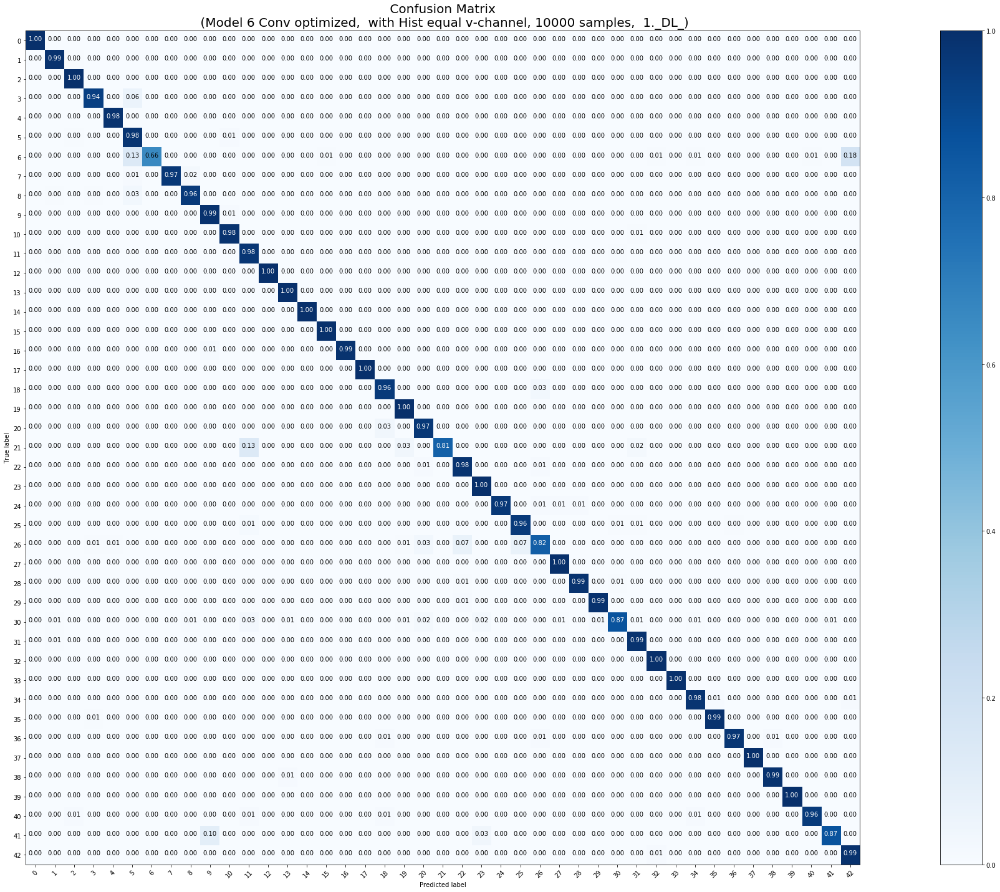

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 24s 3ms/step - loss: 2.9489 - acc: 0.2419 - val_loss: 1.2727 - val_acc: 0.6180
Epoch 2/300
9000/9000 [==============================] - 6s 640us/step - loss: 1.4329 - acc: 0.5581 - val_loss: 0.6093 - val_acc: 0.8560
Epoch 3/300
9000/9000 [==============================] - 6s 643us/step - loss: 0.8411 - acc: 0.7204 - val_loss: 0.4137 - val_acc: 0.9010
Epoch 4/300
9000/9000 [==============================] - 6s 648us/step - loss: 0.5478 - acc: 0.8099 - val_loss: 0.2771 - val_acc: 0.9330
Epoch 5/300
9000/9000 [==============================] - 6s 641us/step - loss: 0.3982 - acc: 0.8620 - val_loss: 0.2054 - val_acc: 0.9470
Epoch 6/300
9000/9000 [==============================] - 6s 644us/step - loss: 0.3280 - acc: 0.8864 - val_loss: 0.1717 - val_

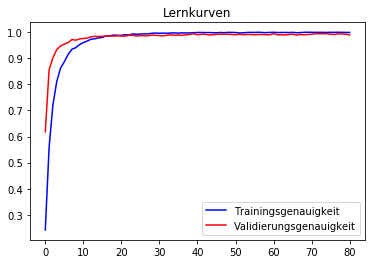

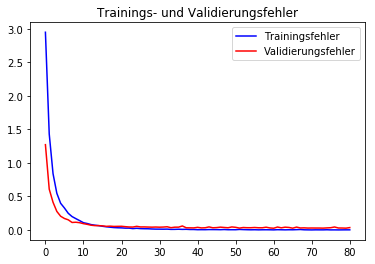

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        60
           1       0.98      0.99      0.99       720
           2       0.99      0.99      0.99       750
           3       0.99      0.98      0.98       450
           4       0.99      0.98      0.99       660
           5       0.93      0.98      0.95       630
           6       1.00      0.69      0.81       150
           7       0.96      0.98      0.97       450
           8       0.98      0.96      0.97       450
           9       0.98      0.99      0.99       480
          10       0.98      0.99      0.99       660
          11       0.92      0.97      0.95       420
          12       0.99      0.98      0.99       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.97      1.00      0.98       210
          16       0.99      0.99      0.99       

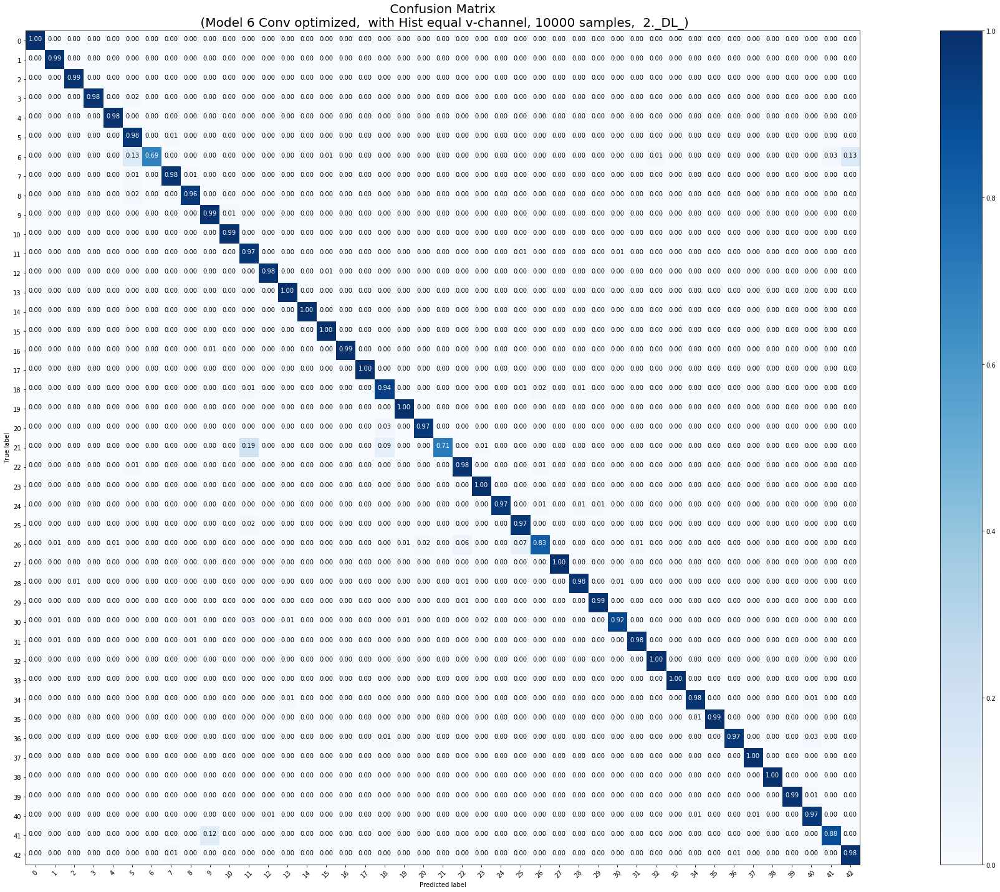

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 25s 3ms/step - loss: 2.9226 - acc: 0.2610 - val_loss: 1.2621 - val_acc: 0.6370
Epoch 2/300
9000/9000 [==============================] - 6s 638us/step - loss: 1.3329 - acc: 0.5787 - val_loss: 0.6577 - val_acc: 0.8250
Epoch 3/300
9000/9000 [==============================] - 6s 645us/step - loss: 0.7922 - acc: 0.7354 - val_loss: 0.4265 - val_acc: 0.8820
Epoch 4/300
9000/9000 [==============================] - 6s 646us/step - loss: 0.5288 - acc: 0.8210 - val_loss: 0.2867 - val_acc: 0.9200
Epoch 5/300
9000/9000 [==============================] - 6s 644us/step - loss: 0.3841 - acc: 0.8626 - val_loss: 0.2118 - val_acc: 0.9390
Epoch 6/300
9000/9000 [==============================] - 6s 642us/step - loss: 0.2984 - acc: 0.8931 - val_loss: 0.1818 - val_

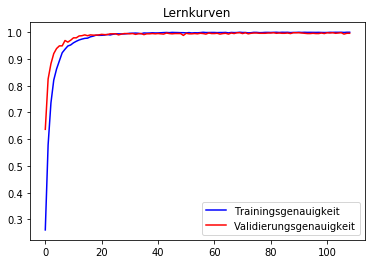

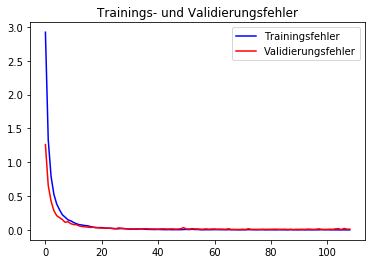

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        60
           1       0.98      0.99      0.99       720
           2       0.99      0.99      0.99       750
           3       0.99      0.95      0.97       450
           4       0.99      0.98      0.99       660
           5       0.91      0.99      0.95       630
           6       1.00      0.67      0.80       150
           7       0.98      0.98      0.98       450
           8       0.99      0.95      0.97       450
           9       0.99      0.99      0.99       480
          10       0.98      0.99      0.99       660
          11       0.93      0.99      0.96       420
          12       1.00      0.96      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.89      1.00      0.94       210
          16       1.00      0.99      1.00       

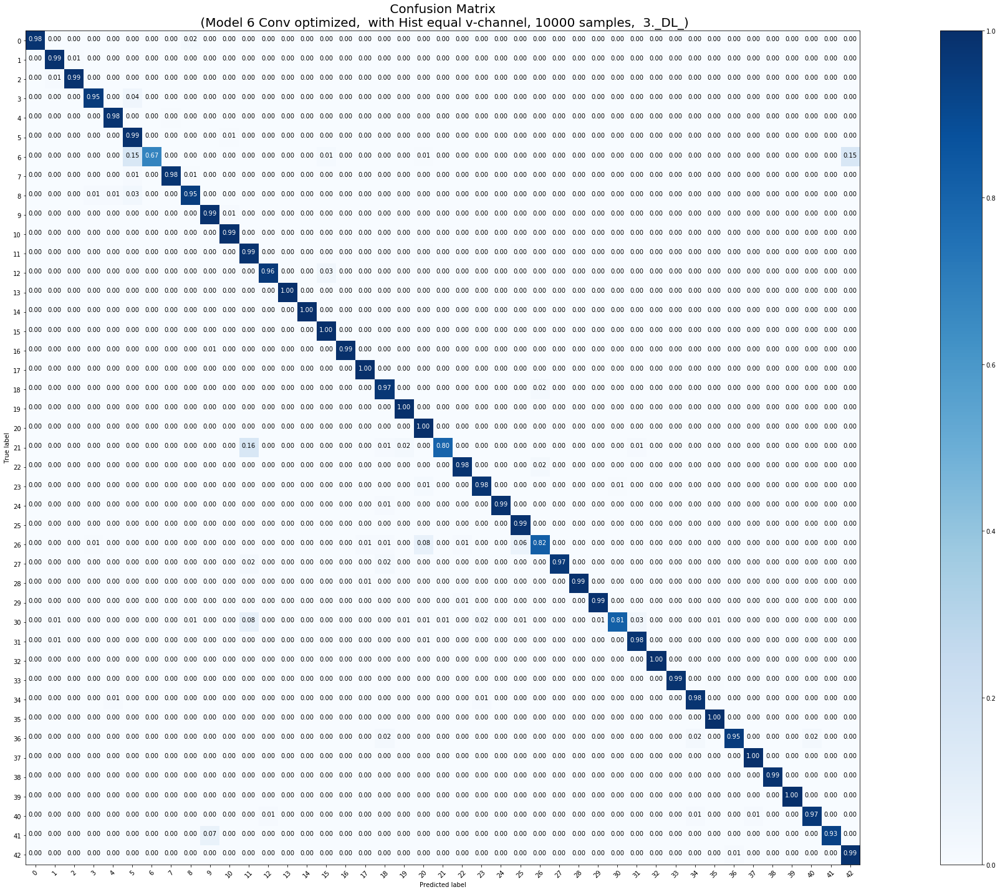

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 26s 3ms/step - loss: 2.7528 - acc: 0.2789 - val_loss: 1.2434 - val_acc: 0.6430
Epoch 2/300
9000/9000 [==============================] - 6s 695us/step - loss: 1.2685 - acc: 0.5901 - val_loss: 0.6519 - val_acc: 0.8170
Epoch 3/300
9000/9000 [==============================] - 6s 695us/step - loss: 0.7332 - acc: 0.7421 - val_loss: 0.4309 - val_acc: 0.8850
Epoch 4/300
9000/9000 [==============================] - 6s 685us/step - loss: 0.5093 - acc: 0.8196 - val_loss: 0.3163 - val_acc: 0.9150
Epoch 5/300
9000/9000 [==============================] - 6s 677us/step - loss: 0.3687 - acc: 0.8694 - val_loss: 0.2260 - val_acc: 0.9480
Epoch 6/300
9000/9000 [==============================] - 6s 682us/step - loss: 0.2900 - acc: 0.8957 - val_loss: 0.1864 - val_

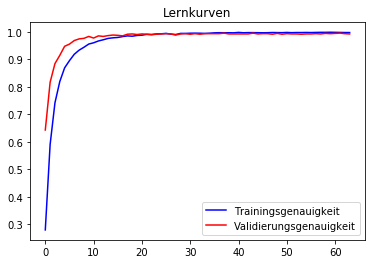

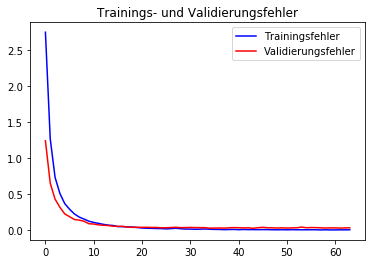

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.95      0.97        60
           1       0.98      0.99      0.99       720
           2       0.99      0.99      0.99       750
           3       1.00      0.96      0.98       450
           4       0.99      0.99      0.99       660
           5       0.93      0.99      0.96       630
           6       1.00      0.71      0.83       150
           7       0.99      0.97      0.98       450
           8       0.98      0.96      0.97       450
           9       0.98      0.99      0.98       480
          10       0.98      0.99      0.99       660
          11       0.96      0.96      0.96       420
          12       0.99      0.98      0.99       690
          13       0.99      1.00      0.99       720
          14       1.00      1.00      1.00       270
          15       0.92      0.99      0.96       210
          16       1.00      0.99      0.99       

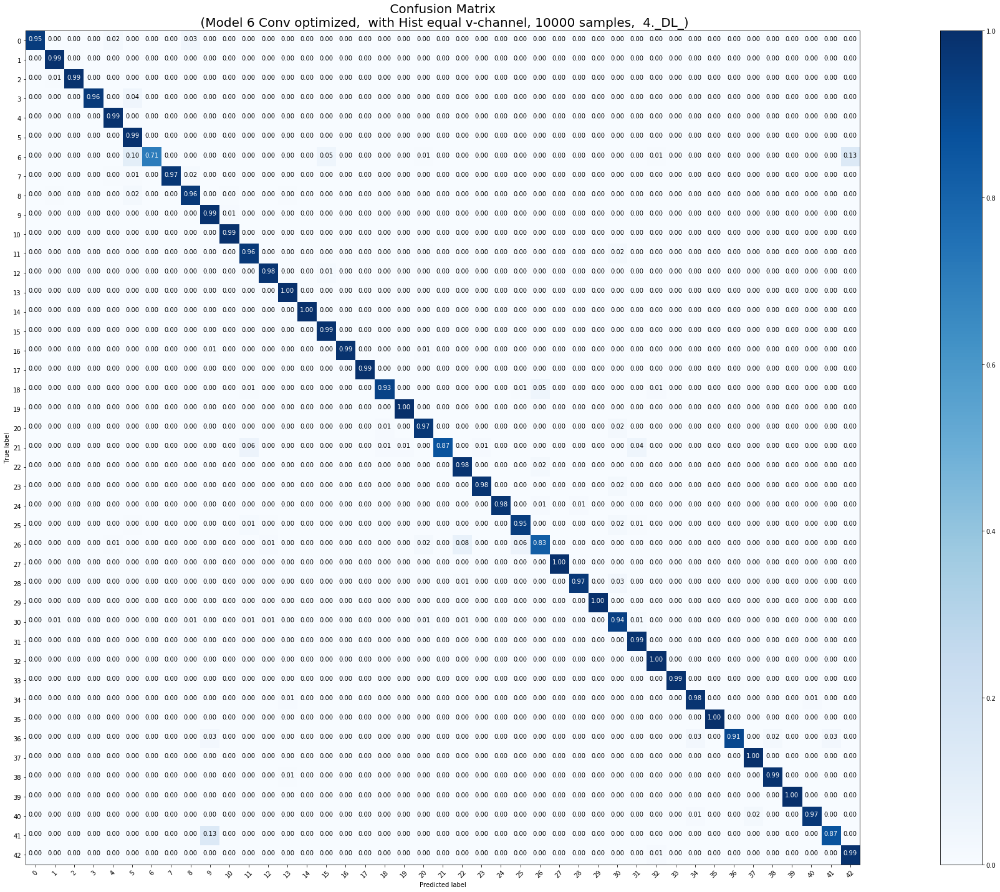

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 26s 3ms/step - loss: 2.8635 - acc: 0.2627 - val_loss: 1.2025 - val_acc: 0.6760
Epoch 2/300
9000/9000 [==============================] - 6s 660us/step - loss: 1.2430 - acc: 0.6011 - val_loss: 0.6378 - val_acc: 0.8350
Epoch 3/300
9000/9000 [==============================] - 6s 647us/step - loss: 0.7370 - acc: 0.7488 - val_loss: 0.4150 - val_acc: 0.8980
Epoch 4/300
9000/9000 [==============================] - 6s 659us/step - loss: 0.4842 - acc: 0.8341 - val_loss: 0.3398 - val_acc: 0.9060
Epoch 5/300
9000/9000 [==============================] - 6s 660us/step - loss: 0.3511 - acc: 0.8804 - val_loss: 0.1982 - val_acc: 0.9560
Epoch 6/300
9000/9000 [==============================] - 6s 661us/step - loss: 0.2768 - acc: 0.9096 - val_loss: 0.1687 - val_

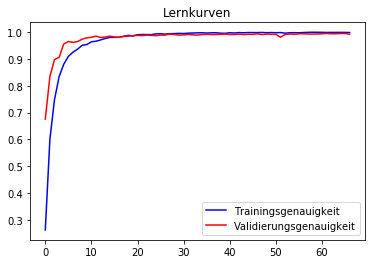

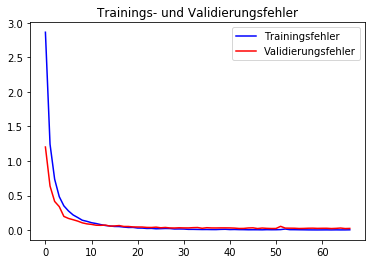

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        60
           1       0.96      0.99      0.97       720
           2       0.98      0.99      0.99       750
           3       1.00      0.95      0.98       450
           4       0.99      0.98      0.98       660
           5       0.92      0.99      0.95       630
           6       1.00      0.69      0.82       150
           7       0.98      0.97      0.98       450
           8       0.98      0.96      0.97       450
           9       0.99      0.99      0.99       480
          10       0.98      0.99      0.99       660
          11       0.91      0.96      0.94       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.92      1.00      0.96       210
          16       1.00      0.97      0.99       

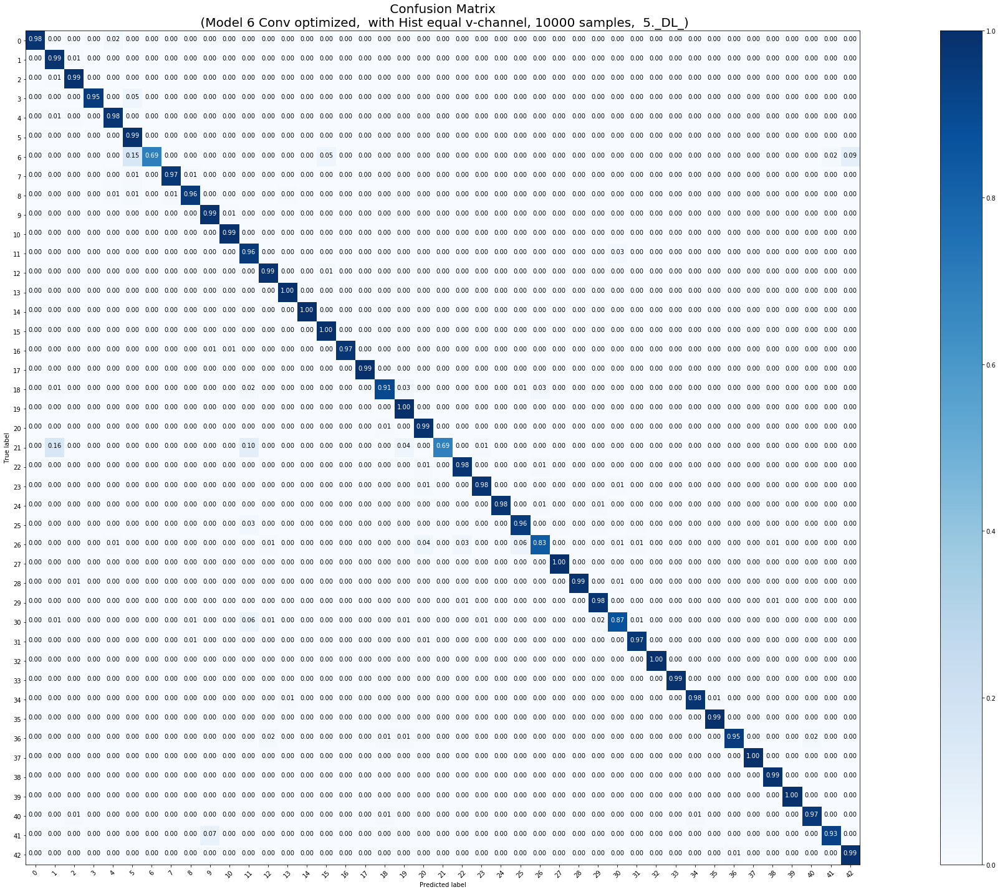

Die durchschnittliche Epochenanzahl beträgt:  58.2


<Figure size 432x288 with 0 Axes>

In [0]:
# Trainingsmenge 10000
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout    
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1,5, X_tr_10000, y_tr_10000, X_test, y_test, 0.3, 0.0001, False, 300, 10000)

In [0]:
downloader(1,5,10000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 31s 109ms/step - loss: 3.4067 - acc: 0.1601 - val_loss: 1.6674 - val_acc: 0.5350
Epoch 2/300
282/282 [==============================] - 10s 37ms/step - loss: 2.2840 - acc: 0.3488 - val_loss: 1.0561 - val_acc: 0.6850
Epoch 3/300
282/282 [==============================] - 11s 38ms/step - loss: 1.7518 - acc: 0.4696 - val_loss: 0.7422 - val_acc: 0.7760
Epoch 4/300
282/282 [==============================] - 11s 37ms/step - loss: 1.4254 - acc: 0.5516 - val_loss: 0.5667 - val_acc: 0.8200
Epoch 5/300
282/282 [==============================] - 10s 37ms/step - loss: 1.1764 - acc: 0.6119 - val_loss: 0.4776 - val_acc: 0.8600
Epoch 6/300
282/282 [==============================] - 11s 37ms/step - loss: 1.0242 - acc: 0.6507 - val_loss: 0.3644 - val_acc: 0.8950
Epoch 7/300
282/282 [=========================

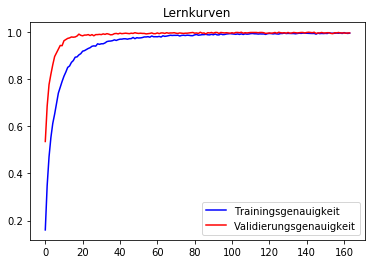

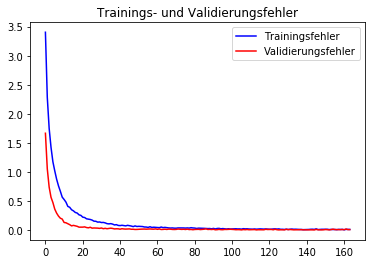

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       1.00      1.00      1.00       720
           2       1.00      1.00      1.00       750
           3       0.99      0.96      0.98       450
           4       1.00      0.99      1.00       660
           5       0.96      0.99      0.98       630
           6       0.99      0.90      0.94       150
           7       1.00      0.99      1.00       450
           8       0.96      0.99      0.97       450
           9       0.99      1.00      0.99       480
          10       1.00      1.00      1.00       660
          11       0.97      1.00      0.98       420
          12       1.00      0.97      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.91      1.00      0.95       210
          16       1.00      0.99      1.00       

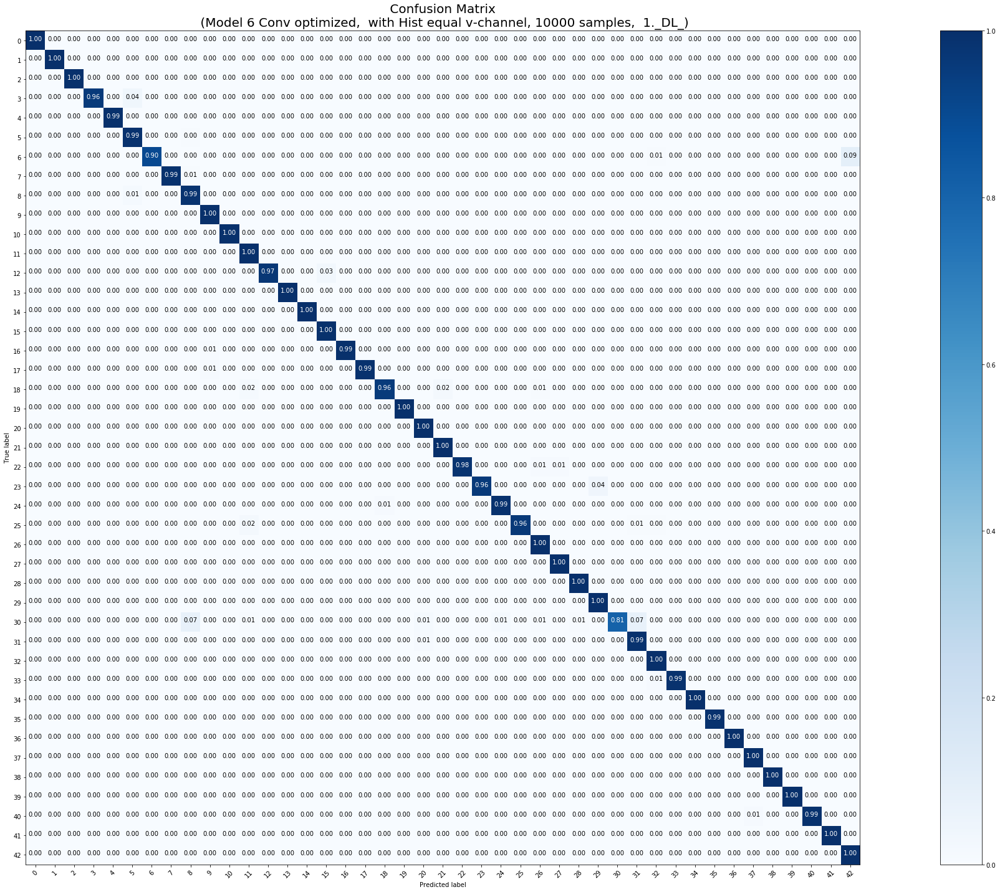

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 32s 113ms/step - loss: 3.5264 - acc: 0.1424 - val_loss: 1.8574 - val_acc: 0.4650
Epoch 2/300
282/282 [==============================] - 10s 37ms/step - loss: 2.3416 - acc: 0.3362 - val_loss: 1.1841 - val_acc: 0.6620
Epoch 3/300
282/282 [==============================] - 11s 39ms/step - loss: 1.7832 - acc: 0.4559 - val_loss: 0.8310 - val_acc: 0.7600
Epoch 4/300
282/282 [==============================] - 11s 39ms/step - loss: 1.4638 - acc: 0.5306 - val_loss: 0.6643 - val_acc: 0.8080
Epoch 5/300
282/282 [==============================] - 11s 39ms/step - loss: 1.1860 - acc: 0.6007 - val_loss: 0.4960 - val_acc: 0.8550
Epoch 6/300
282/282 [==============================] - 11s 38ms/step - loss: 1.0123 - acc: 0.6505 - val_loss: 0.3728 - val_acc: 0.8980
Epoch 7/300
282/282 [=========================

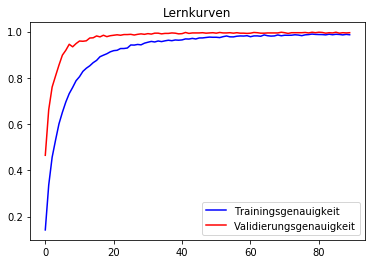

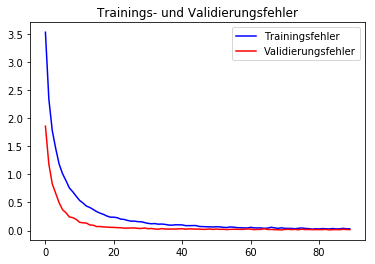

Klassifikationsreport ausgeben
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        60
           1       0.99      1.00      1.00       720
           2       1.00      1.00      1.00       750
           3       0.98      0.94      0.96       450
           4       1.00      0.99      1.00       660
           5       0.94      0.99      0.96       630
           6       1.00      0.87      0.93       150
           7       0.98      0.99      0.99       450
           8       0.99      0.96      0.98       450
           9       1.00      1.00      1.00       480
          10       1.00      0.99      1.00       660
          11       0.95      0.95      0.95       420
          12       1.00      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      1.00      1.00       270
          15       0.96      1.00      0.98       210
          16       1.00      0.99      1.00       

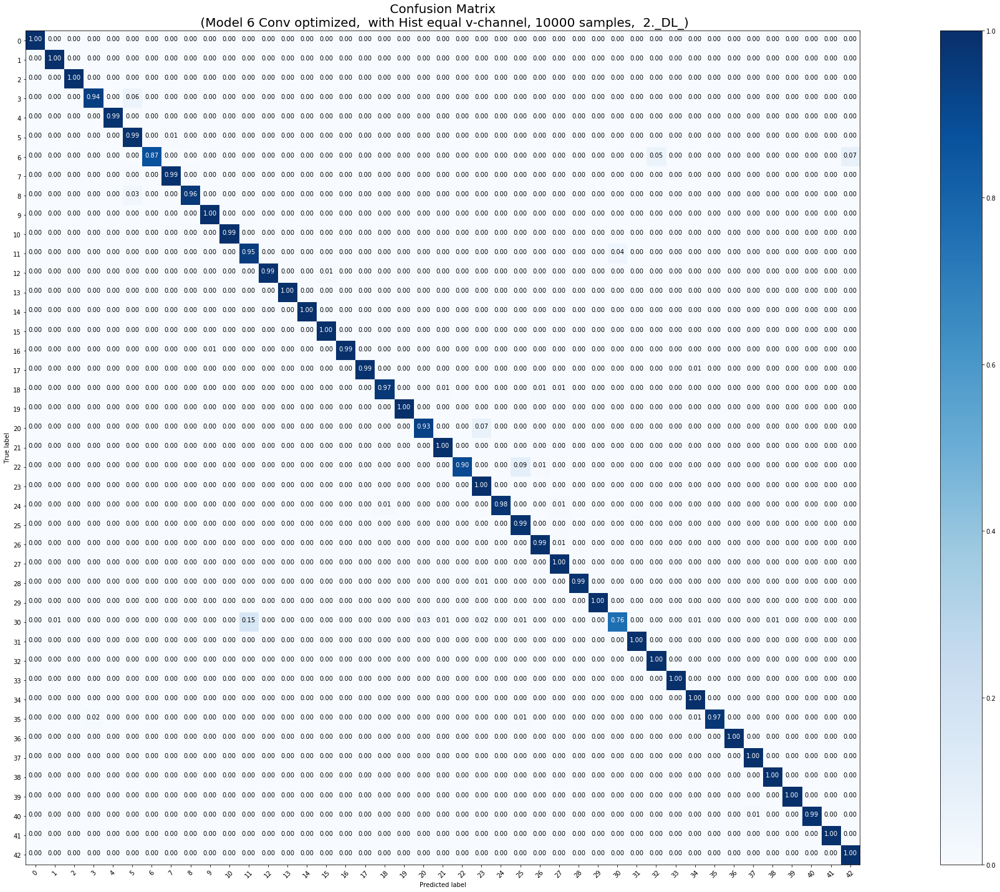

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Modell wurde erzeugt
Epoch 1/300
282/282 [==============================] - 32s 114ms/step - loss: 3.4215 - acc: 0.1549 - val_loss: 1.7638 - val_acc: 0.4530
Epoch 2/300
124/282 [============>.................] - ETA: 5s - loss: 2.3428 - acc: 0.3168

In [0]:
# Trainingsmenge 10000
# optimierten Parameter: Dropoutrate = 0.3,  Lernrate = 0.0001, ohne SpatialDropout    
# 5 Modelle mit Early Stopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1,5, X_tr_10000, y_tr_10000, X_test, y_test, 0.3, 0.0001, False, 300, 10000)

In [0]:
downloader(1,5,10000)